In [18]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import nltk
import tensorflow_datasets as tfds
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [19]:
df = pd.read_csv("/Users/apple/Documents/Lambton College/Sem 2/AML 2404/Project/mycsv.csv")

In [20]:
df1 = df.copy()

In [21]:
df1 = df1.drop(['Price'], axis=1)

In [22]:
df1.head()

,Date,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,Unnamed: 10,...,Unnamed: 17,Unnamed: 18,Unnamed: 19,Unnamed: 20,Unnamed: 21,Unnamed: 22,Unnamed: 23,Unnamed: 24,Unnamed: 25,Unnamed: 26
0,28/09/06,\tSmith promises to fight fire with fire,\tFA to bolster compliance unit after board ba...,\tOver 800 attacks every week in Iraq,"\tMy story: Michael Hay, Westminster, London",\tHelen Kaut: Women who dismiss a career in co...,\tChris Alden on studying for your MBA abroad,\tTeresa Smith: Working for an MP can cost you...,\tAsk Irene,\tHow one of the biggest rows of modern times ...,...,\tAnne Karpf: I'm fighting a losing battle wit...,\tYvonne Roberts talks to couples in loveless ...,"\tIf I had the time: Hunt, pick and eat fungi ...",\tCultureshock: writer Lyn Gardner and daughte...,\tAnnalisa Barbieri on finding non-allergenic ...,\tProject club: No. 13 - Build a den,\tFamily forum: A good wedding without the cer...,\tDance preview: Sept 30,\tExhibitions preview: Sept 30,\tTheatre preview: Sept 30
1,29/09/06,\tAsk Nigel: Finding the right consistency,"\tJay Rayner reviews Michael Caines at Abode, ...",\tAsk Jo: Down to a T,\tUK news in brief,\tRuth Sunderland: Our last gift from Gordon: ...,"\tA fresh face, but few viewers",\tPeter Preston: Fleet Street's sins of emission,\tLynam to step down as Countdown host,\tHow to read the papers on... Labour,...,\tMy week: John Mortimer,\tFive pins digital hopes on CSI,\tCelebrity etiquette,\tMariella Frostrup: Revisiting the past,\tHoroscopes: October 1,\tLucy Siegle: What is the greenest way to get...,\tIncredible journey: Coach journey across Peru,\tThe green gauge,\tWhat would you save if your house was burnin...,\tHealth panel: Is there a way to reverse hair...
2,02/10/06,\tEngland will need Parker's steel against Cro...,\tUS share prices bob back up to dotcom bubble...,"\tWoman, 18, charged over London bombing plot",\tJohn Lewis expands online,"\tExtreme droughts will spread, warn forecasters",\tTesco half-year profits hit £1.15bn,\tHackers lose gamble to defraud British bookies,\tMichael White: Tricky times for the Sunshine...,\tJonathan Freedland: Tory resurgence is oppor...,...,\tErlan Idrissov: Borat's antics leave a nasty...,\tPatrick Butler: No big NHS ideas? It's a chr...,\tSimon Tisdall: Condi Rice off to Middle East...,\tDJ Taylor: Literary 'how to' guides,\tHigh-calorie diet piles on the weight for de...,\tLebanese call on government to quit over war,\tLetter: Iran and the Taliban,\tBlair meets Turkish PM to save accession bid,\tAfrican nation builds £1.4m marble mausoleum...,\tWeb of hate
3,03/10/06,\tGM abandons Renault-Nissan alliance talks,\tSimon Hoggart: We aren't for kipping. We are...,\tGames: Metal Gear Solid: Subsistence | Compa...,"\tInterview: Jim Lanzone, CEO of Ask.com",\tVictor Keegan: Who will lobby for our right ...,"\tAsk Jack, Oct 5",\tMatt Dunn: Watching TV on the internet is a ...,"\tLetters and blogs, Oct 5",\tAleks Krotoski: Trying to keep abreast of ma...,...,\tNHS praised for speeding up cancer treatment,\tGym shirkers unite!,\tObituary: Sally Gray,\tStem cell experts seek licence to create hum...,"\tSpend a Penny, Arches, Glasgow","\tFesten, Gate, Dublin",\tIs this the perfect theatre for Shakespeare?,"\tNorthern Sinfonia/Zehetmair, Sage, Gateshead",\tViewpoint: A flicker of change at Vodafone,\tCarluccio's puts further expansion on the menu
4,04/10/06,\tOnline gaming firms consider legal challenge...,\tFrance call up Anelka,\tToshack passes on Shankly gems,\tEvans thriving on Sanchez's left-field idea,\tWest Ham fans uneasy over identity of new co...,\tCharged Barton faces fine over Everton slip,\tKenny has a big pair of gloves to fill,\tFAI to visit Robson,\tDein backs Newcastle in fight over Owen,...,\tGolf: Evans refuses to budge in Monty row,\tHorse racing: Sanders' exit spells more gloo...,\tHorse racing: Blockley appeal not worth the ...,\tAthletics: Olympic walking champion Thompson...,\tHorse racing:

In [23]:
df1['NewsHeadlines'] = df1[df1.columns[1:]].apply(
    lambda x: ','.join(x.dropna().astype(str)),
    axis=1
)

In [24]:
df1['NewsHeadlines']

0       \tSmith promises to fight fire with fire,\tFA ...
1       \tAsk Nigel: Finding the right consistency,\tJ...
2       \tEngland will need Parker's steel against Cro...
3       \tGM abandons Renault-Nissan alliance talks,\t...
4       \tOnline gaming firms consider legal challenge...
                              ...                        
4018    \tKell Brook stops Amir Khan in sixth round to...
4019    \tI was stuck overseas when my mum died. The r...
4020    \tChina accuses Australian defence force of ‘s...
4021    \tUK reports 205 new coronavirus-related death...
4022    \tEngland 3-1 Germany: Arnold Clark Cup women’...
Name: NewsHeadlines, Length: 4023, dtype: object

In [25]:
df1 = df1[['NewsHeadlines']][:4000]

In [26]:
df1

,NewsHeadlines
0,"\tSmith promises to fight fire with fire,\tFA ..."
1,"\tAsk Nigel: Finding the right consistency,\tJ..."
2,\tEngland will need Parker's steel against Cro...
3,"\tGM abandons Renault-Nissan alliance talks,\t..."
4,\tOnline gaming firms consider legal challenge...
...,...
3995,\tFive Great Reads: Jordan Peterson fact-check...
3996,"\tUK reports 89,176 new cases and 277 deaths –..."
3997,\tEngland win fourth T20 to level series in We...
3998,\tWest Indies’ Holder takes four England wicke...


In [27]:
df1['NewsHeadlines']= df1['NewsHeadlines'].apply(str)

In [28]:
corpus = []
for values in df1['NewsHeadlines']:
    corpus.append(values)

### Converting it to string

In [29]:
corpus1 = "" 
for ele in corpus: 
    corpus1 += ele

### WordCloud - Before

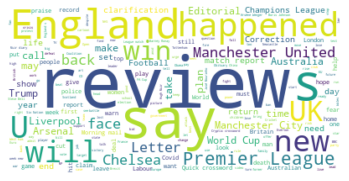

In [30]:
wordcloud = WordCloud(background_color="white").generate(corpus1)
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

In [31]:
from nltk import word_tokenize
text_tokens = word_tokenize(corpus1)

## Length of tokens before using stop words

In [32]:
len(text_tokens)

1180701

In [33]:
text_tokens = [word.lower() for word in text_tokens if word.isalpha()]

In [34]:
text_tokens

['smith',
 'promises',
 'to',
 'fight',
 'fire',
 'with',
 'fire',
 'fa',
 'to',
 'bolster',
 'compliance',
 'unit',
 'after',
 'board',
 'back',
 'barwick',
 'plan',
 'over',
 'attacks',
 'every',
 'week',
 'in',
 'iraq',
 'my',
 'story',
 'michael',
 'hay',
 'westminster',
 'london',
 'helen',
 'kaut',
 'women',
 'who',
 'dismiss',
 'a',
 'career',
 'in',
 'computing',
 'are',
 'missing',
 'out',
 'chris',
 'alden',
 'on',
 'studying',
 'for',
 'your',
 'mba',
 'abroad',
 'teresa',
 'smith',
 'working',
 'for',
 'an',
 'mp',
 'can',
 'cost',
 'you',
 'dear',
 'ask',
 'irene',
 'how',
 'one',
 'of',
 'the',
 'biggest',
 'rows',
 'of',
 'modern',
 'times',
 'helped',
 'danish',
 'exports',
 'to',
 'prosper',
 'name',
 'it',
 'we',
 'got',
 'it',
 'wrong',
 'wrong',
 'fashions',
 'wrong',
 'shapes',
 'wrong',
 'sizes',
 'bad',
 'science',
 'tv',
 'gillian',
 'the',
 'victorian',
 'doctor',
 'where',
 'the',
 'cold',
 'virus',
 'is',
 'an',
 'uninvited',
 'guest',
 'fortysomething',
 'an

In [35]:
len(text_tokens)

931672

In [36]:
from nltk.corpus import stopwords
stopwords_list = stopwords.words('English')
stopwords_list.append('u')
stopwords_list

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [37]:
text_token_wo_stopwords = []

for word in text_tokens:
    if word not in stopwords_list:
        text_token_wo_stopwords.append(word)

##  Length of tokens after applying stop words 

In [38]:
len(text_token_wo_stopwords)

685163

## Tokens 

In [39]:
text_token_wo_stopwords

['smith',
 'promises',
 'fight',
 'fire',
 'fire',
 'fa',
 'bolster',
 'compliance',
 'unit',
 'board',
 'back',
 'barwick',
 'plan',
 'attacks',
 'every',
 'week',
 'iraq',
 'story',
 'michael',
 'hay',
 'westminster',
 'london',
 'helen',
 'kaut',
 'women',
 'dismiss',
 'career',
 'computing',
 'missing',
 'chris',
 'alden',
 'studying',
 'mba',
 'abroad',
 'teresa',
 'smith',
 'working',
 'mp',
 'cost',
 'dear',
 'ask',
 'irene',
 'one',
 'biggest',
 'rows',
 'modern',
 'times',
 'helped',
 'danish',
 'exports',
 'prosper',
 'name',
 'got',
 'wrong',
 'wrong',
 'fashions',
 'wrong',
 'shapes',
 'wrong',
 'sizes',
 'bad',
 'science',
 'tv',
 'gillian',
 'victorian',
 'doctor',
 'cold',
 'virus',
 'uninvited',
 'guest',
 'fortysomething',
 'home',
 'parents',
 'family',
 'life',
 'playlist',
 'perfect',
 'day',
 'love',
 'eat',
 'elli',
 'wibbly',
 'wobbly',
 'jelly',
 'libby',
 'brooks',
 'says',
 'farewell',
 'families',
 'whose',
 'lives',
 'chronicled',
 'year',
 'anne',
 'karpf',

In [40]:
join_string=(' ').join(text_token_wo_stopwords)

### WordCloud After

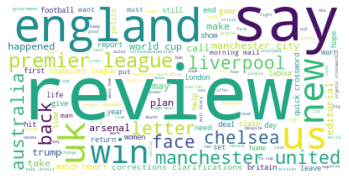

In [41]:
wordcloud = WordCloud(background_color="white").generate(join_string)
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

### Stemming

In [42]:
from nltk import PorterStemmer
pst = PorterStemmer()

In [43]:
for word in text_token_wo_stopwords:
    print(word + ":" + pst.stem(word))

smith:smith
promises:promis
fight:fight
fire:fire
fire:fire
fa:fa
bolster:bolster
compliance:complianc
unit:unit
board:board
back:back
barwick:barwick
plan:plan
attacks:attack
every:everi
week:week
iraq:iraq
story:stori
michael:michael
hay:hay
westminster:westminst
london:london
helen:helen
kaut:kaut
women:women
dismiss:dismiss
career:career
computing:comput
missing:miss
chris:chri
alden:alden
studying:studi
mba:mba
abroad:abroad
teresa:teresa
smith:smith
working:work
mp:mp
cost:cost
dear:dear
ask:ask
irene:iren
one:one
biggest:biggest
rows:row
modern:modern
times:time
helped:help
danish:danish
exports:export
prosper:prosper
name:name
got:got
wrong:wrong
wrong:wrong
fashions:fashion
wrong:wrong
shapes:shape
wrong:wrong
sizes:size
bad:bad
science:scienc
tv:tv
gillian:gillian
victorian:victorian
doctor:doctor
cold:cold
virus:viru
uninvited:uninvit
guest:guest
fortysomething:fortysometh
home:home
parents:parent
family:famili
life:life
playlist:playlist
perfect:perfect
day:day
love:love
ea

guidelines:guidelin
reduce:reduc
number:number
twin:twin
births:birth
maleiha:maleiha
malik:malik
veil:veil
fixation:fixat
muslim:muslim
women:women
favours:favour
jeremy:jeremi
langmead:langmead
real:real
tragedy:tragedi
mccartneys:mccartney
vicious:viciou
public:public
showdown:showdown
need:need
way:way
sidney:sidney
blumenthal:blumenth
end:end
culture:cultur
war:war
many:mani
died:die
iraq:iraq
gavyn:gavyn
davies:davi
maths:math
martin:martin
woollacott:woollacott
clearly:clearli
lessons:lesson
suez:suez
lost:lost
americans:american
fiona:fiona
millar:millar
national:nation
naughty:naughti
step:step
david:david
mckie:mckie
elsewhere:elsewher
magic:magic
ingredient:ingredi
leader:leader
praise:prais
prisons:prison
inspector:inspector
response:respons
free:free
access:access
justice:justic
threat:threat
timothy:timothi
garton:garton
ash:ash
moment:moment
europe:europ
dismantle:dismantl
taboos:taboo
erect:erect
leader:leader
options:option
pakistan:pakistan
warned:warn
royal:royal
vis

xchange:xchang
google:googl
peace:peac
news:news
world:world
sun:sun
line:line
pricing:price
midterms:midterm
news:news
xchange:xchang
cnn:cnn
focus:focu
journalists:journalist
suffering:suffer
stress:stress
disorder:disord
dangerous:danger
hard:hard
drive:drive
news:news
xchange:xchang
freelance:freelanc
filmmakers:filmmak
ones:one
really:realli
telling:tell
stories:stori
transsexual:transsexu
expert:expert
patients:patient
risk:risk
greed:greed
always:alway
good:good
six:six
face:face
charges:charg
corfu:corfu
hotel:hotel
deaths:death
google:googl
able:abl
keep:keep
tabs:tab
us:us
unknown:unknown
soldier:soldier
republicans:republican
hold:hold
breath:breath
midterms:midterm
alliance:allianc
lobby:lobbi
kids:kid
tv:tv
jonathan:jonathan
watt:watt
china:china
economic:econom
relationship:relationship
china:china
estonia:estonia
essential:essenti
information:inform
fat:fat
fight:fight
mysterious:mysteri
case:case
crumbling:crumbl
euro:euro
reconnect:reconnect
voters:voter
lose:lose
powe

bbc:bbc
news:news
staff:staff
told:told
congo:congo
atomic:atom
watchdog:watchdog
fears:fear
radiation:radiat
leak:leak
terrorist:terrorist
attack:attack
reactor:reactor
storing:store
enriched:enrich
uranium:uranium
civil:civil
servants:servant
may:may
strike:strike
job:job
cuts:cut
channel:channel
boss:boss
andy:andi
duncan:duncan
admits:admit
fears:fear
bskyb:bskyb
stake:stake
itv:itv
climate:climat
censorship:censorship
gareth:gareth
southgate:southgat
stay:stay
middlesbrough:middlesbrough
manager:manag
cameron:cameron
attacks:attack
labour:labour
posturing:postur
moore:moor
confessions:confess
publish:publish
damned:damn
follow:follow
rainbow:rainbow
brian:brian
perowne:perown
chief:chief
executive:execut
learning:learn
disability:disabl
charity:chariti
hft:hft
football:footbal
knowledge:knowledg
harry:harri
redknapp:redknapp
really:realli
bring:bring
fan:fan
substitute:substitut
uk:uk
may:may
hand:hand
basra:basra
control:control
spring:spring
thornton:thornton
leave:leav
indy:ind

dec:dec
michael:michael
holden:holden
ears:ear
dec:dec
games:game
preview:preview
dec:dec
tim:tim
jonze:jonz
retro:retro
games:game
renaissance:renaiss
new:new
releases:releas
dec:dec
pop:pop
music:music
preview:preview
dec:dec
lauren:lauren
cochrane:cochran
wades:wade
latest:latest
sneaker:sneaker
wars:war
film:film
preview:preview
dec:dec
dvd:dvd
releases:releas
dec:dec
cinemas:cinema
weekend:weekend
dec:dec
joe:joe
queenan:queenan
clint:clint
eastwood:eastwood
new:new
film:film
flags:flag
fathers:father
john:john
patterson:patterson
wishes:wish
peter:peter
jackson:jackson
never:never
made:made
lord:lord
rings:ring
screen:screen
burn:burn
dec:dec
week:week
highlights:highlight
dec:dec
week:week
best:best
films:film
dec:dec
lucy:luci
mangan:mangan
see:see
games:game
letters:letter
woman:woman
children:children
dying:die
darfur:darfur
terror:terror
suspect:suspect
large:larg
jumping:jump
bail:bail
disaster:disast
waiting:wait
happen:happen
huge:huge
earthquake:earthquak
near:near
istan

pressley:pressley
set:set
valley:valley
ashes:ash
stomach:stomach
claims:claim
boycott:boycott
sailing:sail
wild:wild
oats:oat
takes:take
ashes:ash
shafting:shaft
walloping:wallop
hammering:hammer
topped:top
fresh:fresh
disaster:disast
steve:steve
james:jame
analysis:analysi
ashes:ash
ponting:pont
sells:sell
short:short
rugby:rugbi
union:union
hill:hill
coach:coach
year:year
bristol:bristol
dan:dan
roebuck:roebuck
baggy:baggi
greens:green
blacks:black
look:look
pink:pink
trendspotting:trendspot
kevin:kevin
pullein:pullein
year:year
success:success
inspiration:inspir
british:british
sportswomen:sportswomen
rugby:rugbi
union:union
howard:howard
true:true
word:word
leaving:leav
tigers:tiger
rugby:rugbi
league:leagu
noble:nobl
turns:turn
odsal:odsal
target:target
flanagan:flanagan
basketball:basketbal
murray:murray
main:main
man:man
rocks:rock
sink:sink
raiders:raider
voluntary:voluntari
sector:sector
honoured:honour
new:new
year:year
list:list
stephen:stephen
poole:pool
previews:preview
c

gospel:gospel
oak:oak
north:north
london:london
gill:gill
meller:meller
afternoon:afternoon
tea:tea
emma:emma
cook:cook
natural:natur
good:good
looks:look
nikki:nikki
duffy:duffi
sweet:sweet
dreams:dream
measure:measur
jan:jan
see:see
mirror:mirror
saira:saira
khan:khan
victoria:victoria
moore:moor
whites:white
drink:drink
food:food
matthew:matthew
norman:norman
reviews:review
intercontinental:intercontinent
london:london
q:q
sue:sue
townsend:townsend
guy:guy
browning:brown
come:come
home:home
experience:experi
fell:fell
arctic:arctic
ice:ice
letters:letter
january:januari
lucy:luci
mangan:mangan
jewel:jewel
crown:crown
xx:xx
xx:xx
x:x
net:net
loss:loss
celebrity:celebr
get:get
letters:letter
stuck:stuck
muddle:muddl
critics:critic
choice:choic
philip:philip
draycott:draycott
one:one
foot:foot
telly:telli
divine:divin
interference:interfer
secular:secular
status:statu
sacred:sacr
friends:friend
roger:roger
brown:brown
urges:urg
caution:caution
fee:fee
increases:increas
singing:sing
fut

deaths:death
game:game
sequel:sequel
criticised:criticis
grieving:griev
mother:mother
sues:sue
bow:bow
job:job
share:share
top:top
health:health
agency:agenc
ends:end
moscow:moscow
shows:show
cope:cope
snow:snow
uk:uk
news:news
brief:brief
four:four
held:held
murder:murder
boy:boy
gareth:gareth
mclean:mclean
watch:watch
soundbites:soundbit
damaging:damag
political:polit
debate:debat
admits:admit
blair:blair
phil:phil
daoust:daoust
radio:radio
pick:pick
day:day
lucy:luci
mangan:mangan
last:last
night:night
tv:tv
nancy:nanci
archers:archer
paul:paul
howlett:howlett
film:film
picks:pick
simon:simon
hoggart:hoggart
sketch:sketch
obituary:obituari
jim:jim
cattermole:cattermol
ministers:minist
civil:civil
servants:servant
sign:sign
home:home
office:offic
shakeup:shakeup
deal:deal
obituary:obituari
rev:rev
joan:joan
styles:style
letter:letter
network:network
rail:rail
must:must
confront:confront
failures:failur
letters:letter
lords:lord
plebs:pleb
letters:letter
questions:question
remain:rema

ammunition:ammunit
fact:fact
one:one
poppy:poppi
valley:valley
key:key
british:british
hold:hold
helmand:helmand
province:provinc
blacks:black
fights:fight
back:back
store:store
closures:closur
tent:tent
prices:price
rise:rise
shoppers:shopper
keep:keep
spending:spend
us:us
watchdog:watchdog
charges:charg
insider:insid
trading:trade
rose:rose
backtracks:backtrack
sainsbury:sainsburi
tim:tim
dowling:dowl
televangelism:televangel
america:america
today:today
russia:russia
hits:hit
back:back
us:us
claim:claim
retreat:retreat
democracy:democraci
hilton:hilton
hotels:hotel
lift:lift
european:european
ban:ban
cubans:cuban
letter:letter
delay:delay
decison:decison
trident:trident
replacement:replac
birds:bird
hit:hit
napoli:napoli
oil:oil
slick:slick
freed:freed
sarah:sarah
dempster:dempster
says:say
watch:watch
radio:radio
pick:pick
day:day
letters:letter
bad:bad
prognosis:prognosi
junior:junior
doctors:doctor
letters:letter
pros:pro
cons:con
children:children
database:databas
letters:letter


commitment:commit
clean:clean
water:water
letters:letter
veil:veil
ban:ban
schools:school
divisive:divis
tamiflu:tamiflu
japan:japan
child:child
suicides:suicid
injuries:injuri
authors:author
campaign:campaign
save:save
britain:britain
gay:gay
bookshop:bookshop
tesco:tesco
funds:fund
expansion:expans
abroad:abroad
sale:sale
leaseback:leaseback
deal:deal
billionaire:billionair
rents:rent
luxury:luxuri
homes:home
hawaii:hawaii
poor:poor
elite:elit
force:forc
sent:sent
curb:curb
escalating:escal
violence:violenc
rio:rio
welcome:welcom
little:littl
britain:britain
manhattan:manhattan
chirac:chirac
finally:final
backs:back
sarkozy:sarkozi
presidential:presidenti
race:race
historic:histor
award:award
female:femal
private:privat
allegra:allegra
mcevedy:mcevedi
space:space
tourist:tourist
gourmet:gourmet
meal:meal
letter:letter
italy:itali
palestine:palestin
business:busi
viewpoint:viewpoint
big:big
mobile:mobil
business:busi
beneficiaries:beneficiari
tomorrow:tomorrow
workforce:workforc
train

martin:martin
kettle:kettl
football:footbal
people:peopl
get:get
life:life
rebecca:rebecca
front:front
like:like
gondoliers:gondoli
italian:italian
singing:sing
male:male
premiership:premiership
manchester:manchest
city:citi
charlton:charlton
championship:championship
leicester:leicest
derby:derbi
county:counti
returning:return
dark:dark
ages:age
warnock:warnock
gears:gear
survival:surviv
decider:decid
jol:jol
counts:count
toll:toll
tottenham:tottenham
endure:endur
frenetic:frenet
hours:hour
father:father
anna:anna
nicole:nicol
smith:smith
baby:babi
champions:champion
league:leagu
valencia:valencia
chelsea:chelsea
chelsea:chelsea
win:win
agg:agg
obituary:obituari
george:georg
sewell:sewel
boxing:box
fracture:fractur
curbs:curb
calzaghe:calzagh
training:train
horse:hors
racing:race
dun:dun
doire:doir
drifts:drift
ground:ground
fears:fear
aintree:aintre
horse:hors
racing:race
scudamore:scudamor
national:nation
service:servic
first:first
major:major
test:test
new:new
role:role
fate:fate
b

barden:barden
chess:chess
london:london
marathon:marathon
field:field
leave:leav
british:british
pace:pace
snooker:snooker
must:must
beat:beat
demons:demon
see:see
ding:ding
cricket:cricket
england:england
rush:rush
make:make
moores:moor
coach:coach
cricket:cricket
innovation:innov
enthusiasm:enthusiasm
make:make
moores:moor
ideal:ideal
job:job
new:new
leads:lead
delay:delay
woolmer:woolmer
inquest:inquest
promotion:promot
ranks:rank
part:part
ecb:ecb
system:system
cricket:cricket
world:world
cup:cup
world:world
cup:cup
bids:bid
farewell:farewel
lara:lara
fletcher:fletcher
england:england
rugby:rugbi
league:leagu
kiwis:kiwi
clipped:clip
mcclennan:mcclennan
looks:look
youth:youth
week:week
greg:greg
dyke:dyke
london:london
takes:take
opera:opera
shocked:shock
italy:itali
art:art
rosalind:rosalind
nashashibi:nashashibi
london:london
david:david
maljkovic:maljkov
london:london
old:old
tube:tube
posters:poster
works:work
fine:fine
art:art
photography:photographi
found:found
shared:share
lo

may:may
games:game
news:news
may:may
jim:jim
shelley:shelley
new:new
joe:joe
strummer:strummer
documentary:documentari
celebrity:celebr
labels:label
invention:invent
fashion:fashion
staff:staff
risk:risk
firm:firm
laptop:laptop
stolen:stolen
behind:behind
billboard:billboard
lies:lie
true:true
struggle:struggl
turkey:turkey
waitrose:waitros
workers:worker
labour:labour
bears:bear
fruit:fruit
waitrose:waitros
campaign:campaign
police:polic
force:forc
investigate:investig
bomber:bomber
innocent:innoc
old:old
man:man
yet:yet
shot:shot
bush:bush
tested:test
royal:royal
etiquette:etiquett
white:white
tie:tie
india:india
untouchable:untouch
millionaire:millionair
beyond:beyond
browne:brown
new:new
bp:bp
chief:chief
makes:make
amends:amend
mormons:mormon
darkest:darkest
day:day
spotlight:spotlight
crisis:crisi
fails:fail
diminish:diminish
appetite:appetit
turkey:turkey
bullimore:bullimor
sails:sail
trouble:troubl
cheap:cheap
flight:flight
fancy:fanci
barbara:barbara
ellen:ellen
footballers:fo

vulgaris:vulgari
cd:cd
new:new
young:young
pony:poni
club:club
fantastic:fantast
playroom:playroom
cd:cd
editors:editor
end:end
start:start
hot:hot
tunes:tune
cd:cd
porter:porter
wagoner:wagon
wagonmaster:wagonmast
cd:cd
young:young
gods:god
super:super
fragmenté:fragmenté
cd:cd
twang:twang
love:love
feel:feel
like:like
cd:cd
justice:justic
cd:cd
von:von
sudenfed:sudenf
tromatic:tromat
reflexxions:reflexxion
cd:cd
michael:michael
brecker:brecker
pilgrimage:pilgrimag
cd:cd
white:white
stipes:stipe
icky:icki
thump:thump
cd:cd
paul:paul
mccartney:mccartney
memory:memori
almost:almost
full:full
cd:cd
dizzee:dizze
rascal:rascal
maths:math
english:english
julie:juli
bindel:bindel
talks:talk
claudia:claudia
rushed:rush
sex:sex
change:chang
quickly:quickli
regretted:regret
sarah:sarah
dempster:dempster
says:say
watch:watch
talent:talent
agency:agenc
director:director
calls:call
board:board
members:member
ousted:oust
brits:brit
backing:back
milan:milan
us:us
syria:syria
beirut:beirut
asks:ask
a

scandinavia:scandinavia
st:st
tropez:tropez
rather:rather
mark:mark
sutton:sutton
boutique:boutiqu
camping:camp
flying:fli
visit:visit
madrid:madrid
five:five
best:best
trips:trip
teens:teen
tom:tom
investigates:investig
festivals:festiv
small:small
beautiful:beauti
interview:interview
nicholas:nichola
watt:watt
meets:meet
father:father
son:son
tony:toni
hilary:hilari
benn:benn
uda:uda
give:give
arms:arm
money:money
runs:run
philip:philip
french:french
dvd:dvd
club:club
ashes:ash
diamonds:diamond
quotes:quot
week:week
nancy:nanci
nelson:nelson
mandela:mandela
david:david
beckham:beckham
jonny:jonni
wilkinson:wilkinson
good:good
week:week
bad:bad
week:week
handbags:handbag
cities:citi
decorum:decorum
nottingham:nottingham
hand:hand
raising:rais
corgis:corgi
reading:read
matter:matter
freed:freed
dissident:dissid
hails:hail
net:net
campaign:campaign
get:get
perfect:perfect
tan:tan
host:host
picnic:picnic
nuture:nutur
lovely:love
summer:summer
flower:flower
fashion:fashion
tense:tens
feel

sport:sport
prew:prew
crew:crew
drive:drive
briton:briton
search:search
top:top
gear:gear
cricket:cricket
kabir:kabir
ali:ali
hits:hit
england:england
recall:recal
form:form
art:art
venice:venic
biennale:biennal
bizarre:bizarr
trove:trove
treasures:treasur
goes:goe
show:show
rachel:rachel
cooke:cook
people:peopl
peep:peep
show:show
proves:prove
still:still
vision:vision
three:three
billion:billion
careful:care
owners:owner
real:real
tony:toni
uncovered:uncov
best:best
comic:comic
films:film
time:time
audio:audio
jun:jun
review:review
sinclair:sinclair
mckay:mckay
thing:thing
unspeakable:unspeak
horror:horror
review:review
resistance:resist
owen:owen
sheers:sheer
fiction:fiction
jun:jun
review:review
fox:fox
flies:fli
charles:charl
van:van
onselen:onselen
jack:jack
ripper:ripper
trevor:trevor
marriott:marriott
review:review
tony:toni
years:year
craig:craig
brown:brown
review:review
stories:stori
aids:aid
africa:africa
stephanie:stephani
nolen:nolen
review:review
salvador:salvador
dali:d

near:near
soon:soon
dance:danc
preview:preview
june:june
favoured:favour
tool:tool
iraqi:iraqi
insurgents:insurg
kashmir:kashmir
separatists:separatist
tesco:tesco
rocked:rock
shareholders:sharehold
revolt:revolt
jazz:jazz
preview:preview
june:june
michael:michael
holden:holden
ears:ear
june:june
video:video
suggests:suggest
german:german
politician:politician
killed:kill
parachute:parachut
jump:jump
pete:pete
cashmore:cashmor
hears:hear
princes:princ
concert:concert
diana:diana
bill:bill
floods:flood
bring:bring
fears:fear
looting:loot
camp:camp
cure:cure
british:british
tennis:tenni
man:man
fire:fire
terrifying:terrifi
andrew:andrew
phillips:phillip
blair:blair
must:must
make:make
failure:failur
palestine:palestin
brown:brown
orders:order
work:work
begin:begin
manifesto:manifesto
eyes:eye
early:earli
poll:poll
observer:observ
updated:updat
justin:justin
kan:kan
drug:drug
plague:plagu
knows:know
boundaries:boundari
hotel:hotel
activity:activ
spa:spa
travel:travel
agents:agent
urged:ur

sure:sure
lose:lose
marcel:marcel
berlins:berlin
boredom:boredom
jury:juri
leader:leader
pakistan:pakistan
general:gener
war:war
leader:leader
love:love
low:low
taxes:tax
response:respons
yes:ye
herbal:herbal
medicine:medicin
help:help
women:women
achieve:achiev
pregnancy:pregnanc
says:say
emma:emma
farrant:farrant
mark:mark
ronson:ronson
lily:lili
allen:allen
oh:oh
god:god
sebastian:sebastian
beaumont:beaumont
top:top
books:book
psychological:psycholog
journeys:journey
obituary:obituari
donald:donald
michie:michi
letters:letter
challenges:challeng
countryside:countrysid
beware:bewar
energy:energi
nationalism:nation
warns:warn
global:global
agency:agenc
eu:eu
shield:shield
gas:ga
electricity:electr
sector:sector
buyouts:buyout
uk:uk
news:news
brief:brief
ringing:ring
right:right
number:number
torres:torr
prove:prove
worth:worth
pick:pick
new:new
boys:boy
friendlies:friendli
complete:complet
guide:guid
premiership:premiership
clubs:club
games:game
west:west
ham:ham
warned:warn
punished:

brings:bring
liverpool:liverpool
legal:legal
team:team
football:footbal
mcshane:mcshane
eases:eas
keane:kean
woe:woe
football:footbal
dundee:dunde
united:unit
barcelona:barcelona
harry:harri
pearson:pearson
fans:fan
take:take
pol:pol
pot:pot
luck:luck
team:team
wins:win
football:footbal
dyer:dyer
sits:sit
newcastle:newcastl
friendly:friendli
spurs:spur
enter:enter
race:race
sign:sign
football:footbal
watch:watch
warns:warn
ferguson:ferguson
rooney:rooney
fit:fit
firing:fire
football:footbal
clubs:club
benefit:benefit
paying:pay
agents:agent
leeds:leed
united:unit
unanswered:unansw
questions:question
cricket:cricket
pitch:pitch
watch:watch
golf:golf
many:mani
happy:happi
returns:return
faldo:faldo
recaptures:recaptur
old:old
feeling:feel
scene:scene
open:open
triumphs:triumph
formula:formula
one:one
punishment:punish
history:histori
points:point
lucky:lucki
escape:escap
cricket:cricket
vaughan:vaughan
backs:back
trescothick:trescothick
decision:decis
golf:golf
khan:khan
gets:get
finger:

defence:defenc
england:england
let:let
slip:slip
chance:chanc
peers:peer
want:want
crackdown:crackdown
web:web
west:west
viewpoint:viewpoint
banks:bank
dark:dark
debt:debt
horror:horror
story:stori
unfolds:unfold
health:health
workers:worker
hiv:hiv
case:case
tortured:tortur
admits:admit
gadafy:gadafi
son:son
italians:italian
fined:fine
beach:beach
hogging:hog
bear:bear
dies:die
pyrenees:pyrene
car:car
crash:crash
obituary:obituari
paul:paul
rutherford:rutherford
watch:watch
insider:insid
america:america
got:got
talent:talent
finale:final
star:star
stories:stori
edinburgh:edinburgh
show:show
film:film
picks:pick
dark:dark
water:water
rv:rv
runaway:runaway
vacation:vacat
outlaw:outlaw
josey:josey
wales:wale
exercise:exercis
id:id
cards:card
football:footbal
trust:trust
bolton:bolton
lot:lot
says:say
allardyce:allardyc
russell:russel
brand:brand
year:year
ride:ride
snake:snake
like:like
soccer:soccer
shaman:shaman
football:footbal
spurs:spur
sticking:stick
old:old
guns:gun
jol:jol
keeps:

get:get
away:away
says:say
ferguson:ferguson
russell:russel
brand:brand
pledge:pledg
enough:enough
make:make
england:england
shine:shine
philip:philip
oltermann:oltermann
meets:meet
fanatical:fanat
football:footbal
squads:squad
rarely:rare
hear:hear
everton:everton
supporters:support
vote:vote
yes:ye
new:new
stadium:stadium
outside:outsid
city:citi
fabregas:fabrega
plans:plan
save:save
arsenal:arsen
us:us
sports:sport
galaxy:galaxi
threaten:threaten
cut:cut
beckham:beckham
air:air
miles:mile
david:david
lacey:lacey
robinson:robinson
screwed:screw
alternative:altern
many:mani
sides:side
dylan:dylan
brazil:brazil
samba:samba
sun:sun
indulgence:indulg
poor:poor
remain:remain
slavery:slaveri
two:two
soldiers:soldier
killed:kill
friendly:friendli
fire:fire
teenagers:teenag
first:first
tour:tour
duty:duti
fires:fire
sweep:sweep
greece:greec
turning:turn
villages:villag
ash:ash
killing:kill
germany:germani
friendliness:friendli
example:exampl
cambridge:cambridg
backs:back
plans:plan
tougher:t

get:get
latvian:latvian
nightmare:nightmar
simon:simon
hattenstone:hattenston
shauny:shauni
england:england
favourite:favourit
rising:rise
son:son
dein:dein
money:money
helped:help
kill:kill
football:footbal
ideal:ideal
kevin:kevin
mccarra:mccarra
mcclaren:mcclaren
faces:face
sternest:sternest
test:test
nerve:nerv
pearce:pearc
men:men
win:win
magician:magician
hiddink:hiddink
prepares:prepar
something:someth
special:special
england:england
richard:richard
williams:william
another:anoth
crunch:crunch
game:game
england:england
show:show
bottle:bottl
old:old
scotland:scotland
sense:sens
triumph:triumph
terry:terri
calls:call
urgent:urgent
tempo:tempo
hurry:hurri
opposition:opposit
mistakes:mistak
snatch:snatch
deja:deja
vu:vu
aragonés:aragoné
taunts:taunt
henry:henri
horse:hors
racing:race
timeform:timeform
call:call
jumps:jump
adopt:adopt
declarations:declar
cricket:cricket
van:van
jaarsveld:jaarsveld
leads:lead
survival:surviv
fight:fight
athletics:athlet
radcliffe:radcliff
returns:retu

combat:combat
alonso:alonso
aggression:aggress
london:london
britain:britain
left:left
one:one
lab:lab
olympics:olymp
loom:loom
football:footbal
sack:sack
sorry:sorri
says:say
defiant:defiant
jol:jol
football:footbal
blues:blue
vow:vow
fight:fight
charges:charg
losing:lose
control:control
football:footbal
ferguson:ferguson
fears:fear
recruit:recruit
year:year
pace:pace
harry:harri
pearson:pearson
hail:hail
roman:roman
lord:lord
misrule:misrul
digger:digger
true:true
price:price
wembley:wembley
delays:delay
revealed:reveal
football:footbal
better:better
dodgy:dodgi
goal:goal
dodgy:dodgi
offside:offsid
referees:refere
told:told
kira:kira
cochrane:cochran
talks:talk
hope:hope
powell:powel
coach:coach
england:england
women:women
football:footbal
team:team
football:footbal
owen:owen
hands:hand
top:top
hernia:hernia
specialist:specialist
football:footbal
russians:russian
pitch:pitch
stern:stern
defence:defenc
plastic:plastic
football:footbal
drogba:drogba
ready:readi
stay:stay
chelsea:chelse

sam:sam
column:column
collapses:collaps
scrutiny:scrutini
football:footbal
keen:keen
stay:stay
says:say
mascherano:mascherano
football:footbal
estonia:estonia
new:new
coach:coach
philosophical:philosoph
striving:strive
success:success
limited:limit
resources:resourc
football:footbal
dunne:dunn
tells:tell
ireland:ireland
slam:slam
door:door
grannygate:grannyg
return:return
football:footbal
chelsea:chelsea
confirm:confirm
ten:ten
cate:cate
deal:deal
football:footbal
bellamy:bellami
poised:pois
wales:wale
return:return
cyprus:cypru
remarkable:remark
recovery:recoveri
football:footbal
barry:barri
bubbling:bubbl
england:england
wake:wake
talent:talent
villa:villa
inspiration:inspir
digger:digger
woodward:woodward
secrecy:secreci
clause:claus
causes:caus
concern:concern
google:googl
pwns:pwn
search:search
world:world
remind:remind
computerised:computeris
calendars:calendar
help:help
jenni:jenni
russell:russel
stealing:steal
opposition:opposit
policies:polici
wo:wo
prove:prove
clever:clever
p

rift:rift
spurs:spur
berbatov:berbatov
england:england
still:still
qualify:qualifi
euro:euro
says:say
optimistic:optimist
neville:nevil
siouxsie:siouxsi
electric:electr
ballroom:ballroom
london:london
business:busi
news:news
brief:brief
denies:deni
murdering:murder
shop:shop
worker:worker
dazzling:dazzl
dramatic:dramat
wildlife:wildlif
images:imag
show:show
magic:magic
nature:natur
bp:bp
cut:cut
north:north
sea:sea
jobs:job
corrections:correct
clarifications:clarif
body:bodi
found:found
sea:sea
mother:mother
girl:girl
fell:fell
rugby:rugbi
union:union
france:franc
spring:spring
surprise:surpris
tanya:tanya
aldred:aldr
cricketers:cricket
behaving:behav
badly:badli
beef:beef
game:game
appeal:appeal
rugby:rugbi
union:union
andrew:andrew
lined:line
take:take
new:new
england:england
role:role
ashton:ashton
rugby:rugbi
world:world
cup:cup
andrew:andrew
helped:help
cure:cure
blight:blight
english:english
rose:rose
alton:alton
step:step
nearly:nearli
decade:decad
editor:editor
observer:observ


bt:bt
gets:get
lines:line
crossed:cross
fee:fee
salary:salari
sacrifice:sacrific
cooking:cook
canteen:canteen
reporter:report
survive:surviv
christmas:christma
without:without
relatives:rel
thinking:think
scrooge:scroog
credit:credit
card:card
personal:person
loan:loan
refusals:refus
soar:soar
never:never
know:know
listening:listen
tricks:trick
trade:trade
dear:dear
jeremy:jeremi
trials:trial
tribulations:tribul
opinion:opinion
rebecca:rebecca
jordan:jordan
boss:boss
mentors:mentor
note:note
self:self
capital:capit
letters:letter
tony:toni
levene:leven
fights:fight
consumer:consum
rights:right
savings:save
making:make
sure:sure
children:children
see:see
benefit:benefit
telecoms:telecom
make:make
free:free
skype:skype
calls:call
worldwide:worldwid
mobile:mobil
phone:phone
even:even
pension:pension
postcode:postcod
lottery:lotteri
borrowing:borrow
know:know
score:score
want:want
credit:credit
tickets:ticket
second:second
chance:chanc
shout:shout
real:real
work:work
automatic:automat
peop

fingertips:fingertip
putin:putin
says:say
us:us
behind:behind
poll:poll
experts:expert
boycott:boycott
watch:watch
earth:earth
power:power
planet:planet
ramsay:ramsay
kitchen:kitchen
nightmares:nightmar
dawn:dawn
french:french
boys:boy
comedy:comedi
csi:csi
miami:miami
hopes:hope
rise:rise
deal:deal
end:end
broadway:broadway
strike:strike
international:intern
news:news
brief:brief
obituary:obituari
shelagh:shelagh
cluett:cluett
obituary:obituari
milo:milo
radulovich:radulovich
british:british
friendly:friendli
fire:fire
kills:kill
danes:dane
kathy:kathi
lette:lett
julia:julia
gillard:gillard
survived:surviv
tough:tough
ride:ride
top:top
sara:sara
lawrence:lawrenc
boarding:board
school:school
good:good
deprived:depriv
kids:kid
letters:letter
rare:rare
vintage:vintag
letters:letter
setting:set
boundaries:boundari
freedom:freedom
speech:speech
refugees:refuge
celebrate:celebr
first:first
bus:bu
back:back
iraq:iraq
minister:minist
proposes:propos
redesign:redesign
union:union
flag:flag
obi

new:new
code:code
conduct:conduct
virtual:virtual
grieving:griev
oldest:oldest
profession:profess
combined:combin
newest:newest
technology:technolog
newsbytes:newsbyt
web:web
interconnected:interconnect
ever:ever
women:women
able:abl
get:get
pill:pill
demand:demand
local:local
pharmacy:pharmaci
ruling:rule
prevents:prevent
hospital:hospit
taking:take
private:privat
patients:patient
prisoners:prison
spend:spend
time:time
cells:cell
women:women
keep:keep
upright:upright
pregnant:pregnant
promise:promis
pay:pay
bearer:bearer
demand:demand
festive:festiv
sum:sum
house:hous
price:price
falls:fall
fastest:fastest
two:two
years:year
green:green
room:room
thomas:thoma
bielby:bielbi
climate:climat
campaigner:campaign
uk:uk
bischoff:bischoff
takes:take
chair:chair
citigroup:citigroup
hit:hit
offcuts:offcut
leggings:leg
gruff:gruff
duke:duke
shows:show
gentler:gentler
side:side
us:us
accuses:accus
venezuela:venezuela
secret:secret
election:elect
funding:fund
letters:letter
iran:iran
peaceful:peac

phil:phil
uk:uk
news:news
brief:brief
brown:brown
urged:urg
create:creat
holiday:holiday
birthday:birthday
health:health
service:servic
letters:letter
benazir:benazir
legacy:legaci
democracy:democraci
fare:fare
increases:increas
anger:anger
rail:rail
passengers:passeng
freshers:fresher
week:week
political:polit
front:front
line:line
league:leagu
tables:tabl
show:show
high:high
achievers:achiev
gravel:gravel
fights:fight
variations:variat
musical:music
enigma:enigma
john:john
cage:cage
strangest:strangest
work:work
get:get
british:british
premiere:premier
make:make
perfect:perfect
casserole:casserol
add:add
badger:badger
obituary:obituari
ettore:ettor
sottsass:sottsass
letters:letter
philistine:philistin
responsible:respons
art:art
grant:grant
ministers:minist
plan:plan
cash:cash
encourage:encourag
unemployed:unemploy
train:train
new:new
beginnings:begin
letters:letter
security:secur
general:gener
musharraf:musharraf
letter:letter
return:return
dark:dark
days:day
moi:moi
people:peopl
st

jamie:jami
oliver:oliv
hugh:hugh
muir:muir
diary:diari
national:nation
lines:line
stars:star
fire:fire
service:servic
told:told
improve:improv
safety:safeti
warehouse:warehous
deaths:death
family:famili
says:say
clinton:clinton
race:race
issue:issu
put:put
aside:asid
rightwingers:rightwing
quit:quit
weakening:weaken
olmert:olmert
majority:major
letters:letter
trolley:trolley
uk:uk
news:news
brief:brief
us:us
allies:alli
know:know
fight:fight
insurgents:insurg
says:say
gates:gate
atonement:aton
buzz:buzz
baftas:bafta
give:give
hollywood:hollywood
chance:chanc
show:show
glad:glad
rags:rag
brown:brown
takes:take
lead:lead
urging:urg
mps:mp
accept:accept
staged:stage
pay:pay
rise:rise
letter:letter
assault:assault
gaza:gaza
country:countri
diary:diari
country:countri
diary:diari
corrections:correct
clarifications:clarif
letters:letter
online:onlin
ticket:ticket
resellers:resel
touts:tout
letter:letter
green:green
industries:industri
way:way
europe:europ
anglo:anglo
american:american
target

teenagers:teenag
letters:letter
thinking:think
housing:hous
jobs:job
hugh:hugh
muir:muir
diary:diari
much:much
bling:bling
costs:cost
suspected:suspect
drug:drug
dealer:dealer
assets:asset
letter:letter
essential:essenti
training:train
soldiers:soldier
letter:letter
earn:earn
less:less
pay:pay
rahilla:rahilla
zafar:zafar
view:view
kabul:kabul
opium:opium
economy:economi
take:take
years:year
remove:remov
letter:letter
talented:talent
henry:henri
conway:conway
school:school
rebuilding:rebuild
timetable:timet
slips:slip
corrections:correct
clarifications:clarif
obituary:obituari
sergei:sergei
larin:larin
crushed:crush
aboard:aboard
four:four
bunk:bunk
lucky:lucki
china:china
head:head
home:home
international:intern
news:news
brief:brief
michael:michael
tomasky:tomaski
dream:dream
ticket:ticket
dream:dream
brown:brown
approve:approv
use:use
wiretap:wiretap
evidence:evid
criminal:crimin
proceedings:proceed
berlusconi:berlusconi
poised:pois
comeback:comeback
general:gener
election:elect
alic

wales:wale
italy:itali
rugby:rugbi
union:union
wales:wale
v:v
italy:itali
kosovo:kosovo
precedent:preced
trinity:triniti
mirror:mirror
launches:launch
free:free
title:titl
around:around
britain:britain
fork:fork
matthew:matthew
fort:fort
shaun:shaun
hill:hill
thinking:think
diner:diner
favourite:favourit
cook:cook
rolling:roll
stoves:stove
report:report
birmingham:birmingham
v:v
arsenal:arsen
charlie:charli
brooker:brooker
screen:screen
burn:burn
portillo:portillo
thatcher:thatcher
mon:mon
northern:northern
rock:rock
one:one
best:best
places:place
deposit:deposit
savings:save
defra:defra
revealing:reveal
rethink:rethink
allegra:allegra
mcevedy:mcevedi
live:live
chat:chat
fears:fear
eduardo:eduardo
arsenal:arsen
predict:predict
nine:nine
months:month
another:anoth
photoshopped:photoshop
photo:photo
outed:out
china:china
select:select
committee:committe
considers:consid
game:game
ratings:rate
developer:develop
responsibility:respons
talking:talk
turkey:turkey
afghan:afghan
wasteland:wast

bebo:bebo
founders:founder
millions:million
bebo:bebo
duo:duo
net:net
millions:million
aol:aol
deal:deal
hell:hell
hath:hath
fury:furi
bebo:bebo
bought:bought
aol:aol
rides:ride
high:high
second:second
dotcom:dotcom
wave:wave
time:time
warner:warner
firm:firm
aol:aol
buy:buy
social:social
networking:network
site:site
bebo:bebo
analysis:analysi
aol:aol
buys:buy
slice:slice
social:social
networking:network
market:market
film:film
sparks:spark
storm:storm
irish:irish
poet:poet
food:food
news:news
views:view
gossip:gossip
gangster:gangster
jailed:jail
doorstep:doorstep
shooting:shoot
iraq:iraq
director:director
cut:cut
goa:goa
men:men
charged:charg
rape:rape
murder:murder
british:british
teenager:teenag
football:footbal
ramos:ramo
ready:readi
get:get
ruthless:ruthless
penalty:penalti
heartbreak:heartbreak
man:man
arrested:arrest
heathrow:heathrow
runway:runway
incident:incid
sxsw:sxsw
interview:interview
jim:jim
louderback:louderback
morning:morn
session:session
barack:barack
obama:obama
f

horse:hors
racing:race
festival:festiv
winners:winner
often:often
find:find
going:go
tough:tough
aintree:aintre
horse:hors
racing:race
kauto:kauto
primed:prime
take:take
nicholls:nichol
past:past
mark:mark
horse:hors
racing:race
lame:lame
ollie:olli
national:nation
philson:philson
steps:step
horse:hors
racing:race
dancer:dancer
value:valu
eclipse:eclips
star:star
tv:tv
matters:matter
later:later
live:live
drops:drop
legal:legal
pursuit:pursuit
former:former
stacker:stacker
richard:richard
williams:william
fábregas:fábrega
weaves:weav
patterns:pattern
deep:deep
gerrard:gerrard
exerts:exert
greater:greater
influence:influenc
game:game
urges:urg
review:review
triesman:triesman
premier:premier
league:leagu
keane:kean
makes:make
case:case
transfer:transfer
chest:chest
champions:champion
league:leagu
sweet:sweet
night:night
united:unit
leaves:leav
roma:roma
feeling:feel
sour:sour
tormentor:tormentor
ronaldo:ronaldo
champions:champion
league:leagu
kuyt:kuyt
takes:take
reward:reward
helping:he

read:read
revels:revel
new:new
role:role
remains:remain
england:england
fringe:fring
rugby:rugbi
league:leagu
harlequins:harlequin
castleford:castleford
cricket:cricket
fail:fail
win:win
tribal:tribal
support:support
eddie:eddi
butler:butler
johnson:johnson
era:era
begins:begin
notable:notabl
lack:lack
rugby:rugbi
union:union
leicester:leicest
bristol:bristol
athletics:athlet
explosive:explos
letter:letter
adds:add
greene:green
crisis:crisi
rugby:rugbi
union:union
worcester:worcest
bath:bath
horse:hors
racing:race
timely:time
boost:boost
leighs:leigh
polytrack:polytrack
star:star
paco:paco
prevails:prevail
horse:hors
racing:race
tattenham:tattenham
corner:corner
horse:hors
racing:race
mackie:macki
mabel:mabel
hit:hit
high:high
note:note
basketball:basketbal
hoop:hoop
dreams:dream
top:top
players:player
tim:tim
atkin:atkin
liquid:liquid
gold:gold
dan:dan
pearson:pearson
examines:examin
palette:palett
vibrant:vibrant
foliage:foliag
use:use
prolong:prolong
green:green
effect:effect
dan:da

time:time
management:manag
bovis:bovi
warns:warn
profits:profit
reservations:reserv
collapse:collaps
cash:cash
call:call
says:say
lloyds:lloyd
tsb:tsb
fsa:fsa
presses:press
plea:plea
bargaining:bargain
crackdown:crackdown
insider:insid
trading:trade
slump:slump
service:servic
sector:sector
could:could
prompt:prompt
early:earli
bank:bank
rate:rate
cut:cut
oil:oil
price:price
passes:pass
hit:hit
fresh:fresh
record:record
nick:nick
fletcher:fletcher
hyperactivity:hyperact
drug:drug
goes:goe
slow:slow
shire:shire
ba:ba
shunned:shun
fiasco:fiasco
rice:rice
export:export
bans:ban
shortages:shortag
michael:michael
meacher:meacher
development:develop
new:new
nuclear:nuclear
power:power
stations:station
uk:uk
obituary:obituari
tom:tom
tuohy:tuohi
country:countri
diary:diari
wenlock:wenlock
edge:edg
letter:letter
food:food
crisis:crisi
means:mean
agriculture:agricultur
fairer:fairer
trade:trade
world:world
apart:apart
ewan:ewan
crawford:crawford
bluff:bluff
blunder:blunder
wildlife:wildlif
suffe

islamist:islamist
leader:leader
mandela:mandela
story:stori
retold:retold
song:song
broadway:broadway
jenni:jenni
russell:russel
labour:labour
blinded:blind
lack:lack
new:new
leader:leader
dalai:dalai
lama:lama
visit:visit
olympics:olymp
china:china
talks:talk
constructive:construct
homecoming:homecom
rose:rose
gives:give
europe:europ
edge:edg
tiff:tiff
tours:tour
cipriani:cipriani
wins:win
young:young
player:player
award:award
cricket:cricket
oval:oval
day:day
hundreds:hundr
frustration:frustrat
ramprakash:ramprakash
playing:play
basketball:basketbal
card:card
way:way
white:white
house:hous
cricket:cricket
tempers:temper
flare:flare
yardy:yardi
digs:dig
clubs:club
risk:risk
ruin:ruin
test:test
bids:bid
say:say
lancashire:lancashir
set:set
course:cours
jupiter:jupit
cricket:cricket
holding:hold
sales:sale
century:centuri
che:che
epic:epic
flawed:flaw
compelling:compel
obituary:obituari
paul:paul
hart:hart
cd:cd
monteverdi:monteverdi
madrigals:madrig
books:book
cd:cd
ives:ive
three:thre

welsh:welsh
trainspotting:trainspot
mosley:mosley
victory:victori
comes:come
price:price
jocelyn:jocelyn
holds:hold
edge:edg
bryant:bryant
takes:take
aim:aim
arts:art
column:column
let:let
lose:lose
sense:sens
humour:humour
comedy:comedi
phil:phil
hogan:hogan
tries:tri
get:get
work:work
royal:royal
academy:academi
summer:summer
exhibition:exhibit
letters:letter
rd:rd
laing:la
remembered:rememb
getting:get
chest:chest
dressing:dress
dressing:dress
events:event
look:look
review:review
return:return
history:histori
end:end
dreams:dream
robert:robert
kagan:kagan
browser:browser
george:georg
monbiot:monbiot
makes:make
stand:stand
future:futur
books:book
controversy:controversi
guaranteed:guarante
orange:orang
prize:prize
alex:alex
clark:clark
party:parti
away:away
extra:extra
pounds:pound
paperback:paperback
week:week
june:june
audio:audio
june:june
review:review
hamburger:hamburg
history:histori
josh:josh
ozersky:ozerski
fiction:fiction
june:june
june:june
review:review
hungry:hungri
city:

medioni:medioni
barbican:barbican
london:london
obituary:obituari
herbert:herbert
grainger:grainger
game:game
review:review
okami:okami
game:game
review:review
metal:metal
gear:gear
solid:solid
guns:gun
patriots:patriot
briton:briton
fled:fled
us:us
convicted:convict
killing:kill
wife:wife
daughter:daughter
last:last
night:night
tv:tv
tribal:tribal
wives:wive
letter:letter
cereal:cereal
truths:truth
obituary:obituari
george:georg
shires:shire
us:us
removes:remov
nuclear:nuclear
arms:arm
britain:britain
obituary:obituari
gordon:gordon
goodman:goodman
countrywide:countrywid
faces:face
lawsuit:lawsuit
us:us
lending:lend
world:world
news:news
brief:brief
archive:archiv
june:june
rule:rule
excludes:exclud
dissenters:dissent
shopping:shop
news:news
brief:brief
angry:angri
unsporting:unsport
germans:german
poortvliet:poortvliet
free:free
manage:manag
saints:saint
sarah:sarah
dempster:dempster
watch:watch
radio:radio
pick:pick
day:day
paul:paul
howlett:howlett
film:film
picks:pick
cd:cd
stupid

warsaw:warsaw
alan:alan
furst:furst
letters:letter
cast:cast
new:new
light:light
famous:famou
lesbian:lesbian
affair:affair
paperback:paperback
week:week
july:juli
racy:raci
tales:tale
fictional:fiction
first:first
lady:ladi
cause:caus
red:red
faces:face
white:white
house:hous
browser:browser
july:juli
review:review
america:america
america:america
ethan:ethan
canin:canin
review:review
china:china
history:histori
john:john
keay:keay
july:juli
review:review
grub:grub
street:street
irregular:irregular
scenes:scene
literary:literari
life:life
jeremy:jeremi
lewis:lewi
review:review
worldwide:worldwid
adventures:adventur
love:love
louise:louis
wener:wener
fiction:fiction
july:juli
much:much
know:know
isabel:isabel
allende:allend
writer:writer
san:san
francisco:francisco
education:educ
expand:expand
academy:academi
model:model
primary:primari
sector:sector
says:say
thinktank:thinktank
obituary:obituari
brian:brian
griffiths:griffith
obituary:obituari
danny:danni
davis:davi
arts:art
diary:diar

society:societi
fined:fine
loan:loan
insurance:insur
viewpoint:viewpoint
british:british
gas:ga
adds:add
fuel:fuel
windfall:windfal
tax:tax
debate:debat
fed:fed
extends:extend
emergency:emerg
funding:fund
america:america
financial:financi
firms:firm
next:next
year:year
housing:hous
crisis:crisi
one:one
seven:seven
homeowners:homeown
could:could
victims:victim
negative:neg
equity:equiti
palestinian:palestinian
talks:talk
going:go
nowhere:nowher
iran:iran
jumps:jump
top:top
new:new
pm:pm
tzipi:tzipi
livni:livni
shaul:shaul
mofaz:mofaz
binyamin:binyamin
netanyahu:netanyahu
candidates:candid
could:could
succeed:succeed
ehud:ehud
olmert:olmert
israel:israel
prime:prime
minister:minist
enigma:enigma
david:david
jenkins:jenkin
name:name
job:job
two:two
flights:flight
fancy:fanci
met:met
chief:chief
challenges:challeng
johnson:johnson
role:role
royal:royal
albert:albert
hall:hall
london:london
reward:reward
offered:offer
information:inform
antigua:antigua
attack:attack
fashion:fashion
diary:di

walk:walk
sea:sea
film:film
review:review
little:littl
box:box
sweets:sweet
film:film
review:review
star:star
wars:war
clone:clone
wars:war
film:film
review:review
wild:wild
child:child
film:film
review:review
mess:mess
zohan:zohan
film:film
review:review
hellboy:hellboy
ii:ii
golden:golden
army:armi
eat:eat
like:like
olympian:olympian
michael:michael
phelps:phelp
olympic:olymp
diet:diet
digested:digest
six:six
best:best
face:face
washes:wash
pick:pick
week:week
big:big
bows:bow
cd:cd
classical:classic
review:review
gurlitt:gurlitt
goya:goya
symphony:symphoni
four:four
dramatic:dramat
songs:song
cd:cd
jazz:jazz
review:review
soil:soil
pimp:pimp
sessions:session
planet:planet
pimp:pimp
pop:pop
review:review
stereolab:stereolab
chemical:chemic
chords:chord
pop:pop
review:review
dandy:dandi
warhols:warhol
earth:earth
dandy:dandi
warhols:warhol
rock:rock
pop:pop
review:review
jaguar:jaguar
love:love
take:take
sea:sea
pop:pop
review:review
madcon:madcon
dark:dark
con:con
man:man
cd:cd
jazz:

jeremy:jeremi
scahill:scahil
review:review
foreigners:foreign
three:three
english:english
lives:live
caryl:caryl
phillips:phillip
review:review
inside:insid
whale:whale
jennie:jenni
rooney:rooney
night:night
bookmobile:bookmobil
august:august
review:review
harry:harri
revised:revis
mark:mark
sarvas:sarva
review:review
god:god
great:great
written:written
read:read
christopher:christoph
hitchens:hitchen
review:review
cold:cold
ink:ink
david:david
robinson:robinson
review:review
dancing:danc
dogs:dog
michael:michael
henry:henri
review:review
friends:friend
like:like
written:written
read:read
danny:danni
wallace:wallac
review:review
book:book
contemplation:contempl
islam:islam
crusades:crusad
usama:usama
ibn:ibn
munqidh:munqidh
review:review
drivetime:drivetim
james:jame
meek:meek
review:review
life:life
class:class
pat:pat
barker:barker
review:review
psalm:psalm
heather:heather
mcrobie:mcrobi
review:review
two:two
revolutionary:revolutionari
dramas:drama
les:le
misérables:misérabl
tale:ta

sues:sue
top:top
casinos:casino
millions:million
many:mani
killed:kill
series:seri
bomb:bomb
blasts:blast
across:across
delhi:delhi
good:good
week:week
football:footbal
fans:fan
protest:protest
loss:loss
kevin:kevin
keegan:keegan
record:record
peter:peter
conrad:conrad
admit:admit
wrong:wrong
hirst:hirst
music:music
extraordinary:extraordinari
story:stori
unique:uniqu
label:label
devoted:devot
releasing:releas
music:music
iraq:iraq
war:war
veterans:veteran
rosanne:rosann
cash:cash
republicans:republican
play:play
dirty:dirti
steve:steve
bell:bell
lib:lib
dem:dem
conference:confer
conference:confer
questions:question
simon:simon
hughes:hugh
crime:crime
thrillers:thriller
plentiful:plenti
good:good
scandinavia:scandinavia
paul:paul
doyle:doyl
chelsea:chelsea
potency:potenc
uninterrupted:uninterrupt
limp:limp
bordeaux:bordeaux
big:big
debate:debat
captain:captain
role:role
crucial:crucial
winning:win
ryder:ryder
cup:cup
party:parti
pieces:piec
fashion:fashion
liberal:liber
democrat:democr

harness:har
creative:creativ
minds:mind
cities:citi
alexandra:alexandra
jones:jone
grant:grant
power:power
better:better
leadership:leadership
follow:follow
future:futur
cities:citi
time:time
step:step
capital:capit
shadow:shadow
future:futur
cities:citi
secret:secret
creating:creat
successful:success
city:citi
brand:brand
hazel:hazel
blears:blear
cities:citi
need:need
mayors:mayor
build:build
rebirth:rebirth
future:futur
cities:citi
birmingham:birmingham
got:got
groove:groov
back:back
future:futur
cities:citi
crunch:crunch
time:time
green:green
housing:hous
new:new
technology:technolog
holds:hold
key:key
supporting:support
people:peopl
learning:learn
disabilities:disabl
says:say
charity:chariti
future:futur
cities:citi
economic:econom
divide:divid
costing:cost
us:us
serial:serial
dater:dater
meddling:meddl
mothers:mother
arts:art
diary:diari
laura:laura
barnett:barnett
philip:philip
glass:glass
opera:opera
life:life
walt:walt
disney:disney
arts:art
diary:diari
laura:laura
barnett:barn

hand:hand
ethical:ethic
fashion:fashion
people:peopl
tree:tree
try:tri
sell:sell
house:hous
wait:wait
worry:worri
collapsing:collaps
house:hous
chain:chain
worried:worri
yet:yet
financial:financi
crisis:crisi
affected:affect
clare:clare
community:commun
caspar:caspar
walsh:walsh
creative:creativ
writing:write
young:young
offenders:offend
institutes:institut
sophocles:sophocl
oedipus:oedipu
stage:stage
screen:screen
marc:marc
maron:maron
las:la
vegas:vega
road:road
white:white
house:hous
men:men
north:north
england:england
dirtier:dirtier
hands:hand
football:footbal
love:love
money:money
root:root
review:review
events:event
cut:cut
olympics:olymp
drugs:drug
scandals:scandal
richard:richard
williams:william
england:england
finally:final
wash:wash
stain:stain
kevin:kevin
mccarra:mccarra
capello:capello
keen:keen
prove:prove
statistics:statist
lie:lie
joan:joan
smith:smith
problem:problem
playboy:playboy
obituary:obituari
miles:mile
richmond:richmond
nancy:nanci
month:month
ambridge:ambrid

obama:obama
tv:tv
ad:ad
overkill:overkil
pda:pda
newsbucket:newsbucket
football:footbal
wonder:wonder
goal:goal
gutsy:gutsi
comeback:comeback
north:north
london:london
derby:derbi
brad:brad
friedman:friedman
republicans:republican
divisive:divis
rhetoric:rhetor
brings:bring
worst:worst
america:america
tennant:tennant
quit:quit
doctor:doctor
mort:mort
obama:obama
populism:popul
echoes:echo
socialism:social
early:earli
century:centuri
oliver:oliv
burkeman:burkeman
campaign:campaign
diary:diari
classic:classic
obama:obama
conspiracy:conspiraci
genre:genr
mustafa:mustafa
qadri:qadri
pakistan:pakistan
tribes:tribe
really:realli
need:need
guns:gun
martin:martin
kettle:kettl
reinvention:reinvent
worked:work
margaret:margaret
thatcher:thatcher
could:could
work:work
sarah:sarah
palin:palin
gabrielle:gabriel
gurley:gurley
provisional:provision
balloting:ballot
may:may
disenfranchise:disenfranchis
thousands:thousand
election:elect
day:day
slavenka:slavenka
drakulić:drakulić
croatia:croatia
tackle

sides:side
every:everi
conflict:conflict
utd:utd
chief:chief
tells:tell
court:court
theft:theft
lib:lib
dem:dem
donor:donor
tech:tech
weekly:weekli
podcast:podcast
sarah:sarah
lacy:laci
stefan:stefan
oberg:oberg
facebook:facebook
make:make
ads:ad
work:work
dan:dan
kennedy:kennedi
fox:fox
news:news
bets:bet
future:futur
sarah:sarah
palin:palin
free:free
umpc:umpc
buyers:buyer
guide:guid
rory:rori
lamont:lamont
back:back
scotland:scotland
rugby:rugbi
union:union
test:test
world:world
champions:champion
south:south
africa:africa
david:david
cameron:cameron
first:first
question:question
pmqs:pmq
elevator:elev
pitch:pitch
mindjet:mindjet
rolls:roll
latest:latest
visual:visual
planning:plan
tool:tool
silvia:silvia
guglielmi:guglielmi
important:import
ever:ever
address:address
collective:collect
lack:lack
economic:econom
literacy:literaci
wpp:wpp
meets:meet
regulatory:regulatori
obligations:oblig
nielsen:nielsen
asset:asset
swap:swap
portrait:portrait
opens:open
unusual:unusu
glimpes:glimp
hi

league:leagu
outspoken:outspoken
gallas:galla
stripped:strip
arsenal:arsen
captaincy:captainci
richard:richard
youngs:young
credit:credit
crisis:crisi
could:could
even:even
strengthen:strengthen
economic:econom
political:polit
liberalism:liber
heart:heart
eu:eu
foreign:foreign
policy:polici
larry:larri
elliott:elliott
analyses:analys
roots:root
us:us
economic:econom
crisis:crisi
shia:shia
protesters:protest
baghdad:baghdad
condemn:condemn
deal:deal
keep:keep
us:us
troops:troop
iraq:iraq
hugo:hugo
chávez:chávez
faces:face
test:test
venezuela:venezuela
regional:region
elections:elect
thomas:thoma
noyes:noy
store:store
gm:gm
ford:ford
chrysler:chrysler
without:without
government:govern
embarrassed:embarrass
gm:gm
axes:axe
two:two
private:privat
jets:jet
uk:uk
university:univers
launches:launch
astronaut:astronaut
course:cours
football:footbal
william:william
gallas:galla
stripped:strip
arsenal:arsen
captaincy:captainci
claim:claim
reports:report
game:game
review:review
tomb:tomb
raider:ra

predecessors:predecessor
european:european
championships:championship
draw:draw
england:england
drawn:drawn
germany:germani
spain:spain
finland:finland
us:us
report:report
predicts:predict
nuclear:nuclear
biological:biolog
attack:attack
michael:michael
shank:shank
shukria:shukria
dellawar:dellawar
obama:obama
transfer:transfer
bush:bush
iraq:iraq
policy:polici
afghanistan:afghanistan
serial:serial
dater:dater
perfect:perfect
woman:woman
v:v
real:real
women:women
livestation:livest
demoing:demo
live:live
tv:tv
iphone:iphon
cricket:cricket
david:david
hopps:hopp
debate:debat
england:england
return:return
india:india
diverts:divert
attention:attent
away:away
real:real
issues:issu
commercial:commerci
property:properti
remains:remain
overvalued:overvalu
warn:warn
researchers:research
geoffrey:geoffrey
robertson:robertson
damian:damian
green:green
whistleblower:whistleblow
affair:affair
mumbai:mumbai
terror:terror
attacks:attack
rice:rice
arrives:arriv
delhi:delhi
salve:salv
relations:relat


paul:paul
ince:inc
sacking:sack
bbc:bbc
defends:defend
merlin:merlin
launch:launch
party:parti
michael:michael
tomasky:tomaski
jljj:jljj
exonerated:exoner
ilana:ilana
david:david
miliband:miliband
inertia:inertia
congo:congo
michael:michael
tomasky:tomaski
southern:southern
free:free
market:market
stephen:stephen
kinzer:kinzer
road:road
peace:peac
south:south
asia:asia
goes:goe
kashmir:kashmir
rob:rob
bagchi:bagchi
football:footbal
needs:need
pocket:pocket
napoleons:napoleon
snooker:snooker
ronnie:ronni
may:may
face:face
sanction:sanction
defeat:defeat
joe:joe
perry:perri
peter:peter
tatchell:tatchel
could:could
assassination:assassin
zimbabwe:zimbabw
tyrannical:tyrann
president:presid
robert:robert
mugabe:mugab
morally:moral
justified:justifi
colin:colin
horgan:horgan
alberta:alberta
loathing:loath
ontario:ontario
hurting:hurt
rest:rest
canada:canada
us:us
federal:feder
reserve:reserv
drops:drop
key:key
interest:interest
rate:rate
historic:histor
low:low
narrowing:narrow
poll:poll
gap

premier:premier
league:leagu
manchester:manchest
city:citi
hull:hull
city:citi
premier:premier
league:leagu
liverpool:liverpool
bolton:bolton
wanderers:wander
premier:premier
league:leagu
middlesbrough:middlesbrough
everton:everton
ian:ian
williams:william
harold:harold
pinter:pinter
brilliant:brilliant
dramatist:dramatist
flawed:flaw
political:polit
activist:activist
death:death
toll:toll
california:california
shooting:shoot
rises:rise
nine:nine
video:video
death:death
toll:toll
rises:rise
nine:nine
californian:californian
shooting:shoot
didier:didier
drogba:drogba
scores:score
early:earli
chelsea:chelsea
rediscover:rediscov
home:home
form:form
beating:beat
west:west
bromwich:bromwich
albion:albion
premier:premier
league:leagu
west:west
ham:ham
craig:craig
bellamy:bellami
puts:put
smile:smile
back:back
gianfranco:gianfranco
zola:zola
face:face
rugby:rugbi
union:union
cardiff:cardiff
hold:hold
late:late
newport:newport
surge:surg
first:first
league:leagu
win:win
three:three
months:mont

rogoff:rogoff
forecasters:forecast
may:may
overly:overli
pessimistic:pessimist
us:us
economy:economi
uk:uk
games:game
market:market
worth:worth
gbp:gbp
billion:billion
mean:mean
democrats:democrat
backtrack:backtrack
choice:choic
burris:burri
replace:replac
obama:obama
senate:senat
seat:seat
raid:raid
gaza:gaza
game:game
satirises:satiris
israeli:isra
military:militari
action:action
three:three
hurt:hurt
scotland:scotland
hotel:hotel
explosion:explos
credit:credit
crunch:crunch
treasury:treasuri
looks:look
bank:bank
lending:lend
guarantees:guarante
uk:uk
business:busi
cricket:cricket
andy:andi
flower:flower
may:may
option:option
replace:replac
peter:peter
moores:moor
england:england
coach:coach
video:video
gaza:gaza
conflict:conflict
day:day
roundup:roundup
threat:threat
jobs:job
viyella:viyella
calls:call
administrators:administr
fighting:fight
resumes:resum
despite:despit
cautious:cautiou
welcome:welcom
gaza:gaza
ceasefire:ceasefir
plan:plan
cricket:cricket
contenders:contend
england

albion:albion
middlesbrough:middlesbrough
championship:championship
birmingham:birmingham
cardiff:cardiff
premeir:premeir
league:leagu
manchester:manchest
city:citi
wigan:wigan
premier:premier
league:leagu
sunderland:sunderland
aston:aston
villa:villa
premier:premier
league:leagu
chelsea:chelsea
stoke:stoke
premier:premier
league:leagu
bolton:bolton
manchester:manchest
united:unit
open:open
thread:thread
scrappy:scrappi
manchester:manchest
united:unit
taken:taken
seriously:serious
title:titl
contenders:contend
aston:aston
villa:villa
rangers:ranger
falkirk:falkirk
new:new
michelin:michelin
stars:star
inauguration:inaugur
pictures:pictur
seen:seen
unseen:unseen
barack:barack
obama:obama
america:america
first:first
blackberry:blackberri
president:presid
carling:carl
cup:cup
burnley:burnley
tottenham:tottenham
tottenham:tottenham
win:win
aggregate:aggreg
citigroup:citigroup
chairman:chairman
quit:quit
soaring:soar
losses:loss
credit:credit
markets:market
pound:pound
slumps:slump
ever:ever

games:game
analysed:analys
nato:nato
figures:figur
show:show
surge:surg
afghanistan:afghanistan
violence:violenc
google:googl
blacklists:blacklist
entire:entir
internet:internet
scottish:scottish
premier:premier
league:leagu
rangers:ranger
dundee:dunde
united:unit
guinness:guin
premiership:premiership
gloucester:gloucest
beat:beat
guinness:guin
premiership:premiership
leaders:leader
london:london
irish:irish
duncan:duncan
campbell:campbel
home:home
secretary:secretari
dpp:dpp
could:could
fight:fight
mckinnon:mckinnon
extradition:extradit
horse:hors
racing:race
tony:toni
mccoy:mccoy
must:must
wait:wait
another:anoth
day:day
reach:reach
milestone:mileston
premier:premier
league:leagu
fulham:fulham
completed:complet
loan:loan
signing:sign
midfielder:midfield
giles:gile
barnes:barn
derby:derbi
county:counti
golf:golf
rory:rori
mcilroy:mcilroy
northern:northern
ireland:ireland
holds:hold
lead:lead
three:three
days:day
dubai:dubai
desert:desert
sport:sport
betfair:betfair
weekly:weekli
compe

iraq:iraq
b:b
q:q
opens:open
greenest:greenest
store:store
damarys:damari
ocaña:ocaña
increase:increas
arrest:arrest
figures:figur
us:us
immigration:immigr
officials:offici
deporting:deport
working:work
moms:mom
dads:dad
china:china
rejects:reject
un:un
recommendation:recommend
end:end
death:death
penalty:penalti
america:america
state:state
legislatures:legislatur
score:score
easy:easi
points:point
crack:crack
sex:sex
offenders:offend
derek:derek
draper:draper
conversion:convers
blogging:blog
ewan:ewan
murray:murray
georgios:georgio
samaras:samara
changing:chang
fortunes:fortun
celtic:celtic
binyam:binyam
mohamed:moham
torture:tortur
evidence:evid
obama:obama
cricket:cricket
paul:paul
collingwood:collingwood
unhappy:unhappi
england:england
preparations:prepar
keen:keen
get:get
front:front
foot:foot
costa:costa
brava:brava
v:v
bahamas:bahama
spot:spot
difference:differ
windows:window
upgrades:upgrad
fun:fun
cycling:cycl
armstrong:armstrong
withdraw:withdraw
catlin:catlin
doping:dope
pro

jack:jack
bannister:bannist
severs:sever
ties:tie
warwickshire:warwickshir
stanford:stanford
affair:affair
simon:simon
johnson:johnson
james:jame
kwak:kwak
ben:ben
bernanke:bernank
economic:econom
report:report
focused:focus
bank:bank
nationalisation:nationalis
fixing:fix
economy:economi
guinness:guin
premiership:premiership
saracens:saracen
rugby:rugbi
director:director
brendan:brendan
venter:venter
culls:cull
players:player
amy:ami
lawrence:lawrenc
robin:robin
van:van
persie:persi
led:led
front:front
drag:drag
arsenal:arsen
forward:forward
fa:fa
cup:cup
fulham:fulham
swansea:swansea
city:citi
fa:fa
cup:cup
coventry:coventri
city:citi
blackburn:blackburn
rovers:rover
champions:champion
league:leagu
manchester:manchest
united:unit
back:back
four:four
enjoyed:enjoy
surprisingly:surprisingli
easy:easi
night:night
san:san
siro:siro
gina:gina
mccauley:mccauley
reaction:reaction
rihanna:rihanna
alleged:alleg
abuse:abus
shows:show
ignorant:ignor
domestic:domest
violence:violenc
champions:cha

across:across
us:us
neil:neil
time:time
environmentalists:environmentalist
grew:grew
gesture:gestur
politics:polit
imf:imf
fifth:fifth
britain:britain
gdp:gdp
spent:spent
far:far
bailouts:bailout
davis:davi
cup:cup
britain:britain
josh:josh
goddall:goddal
chris:chri
eaton:eaton
lose:lose
opening:open
rubbers:rubber
ukraine:ukrain
merrill:merril
lynch:lynch
trades:trade
investigation:investig
blank:blank
fire:fire
treasury:treasuri
moves:move
take:take
control:control
lloyds:lloyd
waitrose:waitros
plans:plan
mix:mix
discounters:discount
debenhams:debenham
deal:deal
puts:put
principles:principl
jobs:job
risk:risk
tomasky:tomaski
talk:talk
barack:barack
obama:obama
grey:grey
hair:hair
maggie:maggi
mahar:mahar
obama:obama
healthcare:healthcar
reform:reform
summit:summit
reveals:reveal
bitterness:bitter
republican:republican
opposition:opposit
two:two
killed:kill
several:sever
injured:injur
shooting:shoot
outside:outsid
antrim:antrim
army:armi
base:base
cricket:cricket
safety:safeti
concern

forced:forc
choose:choos
savers:saver
trading:trade
says:say
king:king
michael:michael
tomasky:tomaski
people:peopl
positive:posit
view:view
bernard:bernard
madoff:madoff
rbs:rb
minutes:minut
show:show
board:board
discuss:discuss
size:size
goodwin:goodwin
pension:pension
arizona:arizona
republican:republican
kicks:kick
press:press
state:state
capitol:capitol
building:build
dan:dan
kennedy:kennedi
survive:surviv
newspapers:newspap
must:must
engage:engag
people:peopl
civic:civic
life:life
michael:michael
tomasky:tomaski
aig:aig
bonus:bonu
details:detail
released:releas
timothy:timothi
geithner:geithner
mehdi:mehdi
khalaji:khalaji
iranian:iranian
election:elect
candidates:candid
futile:futil
quest:quest
power:power
javier:javier
mascherano:mascherano
carlos:carlo
tevez:tevez
west:west
ham:ham
sharp:sharp
end:end
blades:blade
litigation:litig
us:us
nature:natur
conservancy:conserv
buys:buy
california:california
ranchland:ranchland
preserve:preserv
salmon:salmon
run:run
brazilian:brazilian


free:free
choice:choic
act:act
leonard:leonard
barden:barden
nice:nice
amber:amber
tournament:tournament
ruth:ruth
lewy:lewi
piece:piec
bemoaning:bemoan
lack:lack
lovelies:love
among:among
british:british
female:femal
mps:mp
offensive:offens
degrading:degrad
roger:roger
federer:feder
attempts:attempt
keep:keep
pace:pace
younger:younger
professionals:profession
oxford:oxford
cambridge:cambridg
boat:boat
race:race
rivalries:rivalri
endure:endur
among:among
olympic:olymp
barack:barack
obama:obama
week:week
media:media
candy:candi
spelling:spell
posh:posh
la:la
mansion:mansion
goes:goe
sale:sale
serious:seriou
fraud:fraud
office:offic
broadens:broaden
investigation:investig
madoff:madoff
feeders:feeder
harry:harri
phibbs:phibb
labour:labour
political:polit
dynasties:dynasti
suggest:suggest
finds:find
hereditary:hereditari
principle:principl
reassuring:reassur
union:union
leader:leader
challenger:challeng
kevin:kevin
coyne:coyn
suspended:suspend
nicholas:nichola
watt:watt
michelle:michel
ba

back:back
best:best
steve:steve
bell:bell
state:state
metropolitan:metropolitan
police:polic
tony:toni
blair:blair
think:think
iraq:iraq
war:war
every:everi
day:day
lines:line
set:set
costumes:costum
factory:factori
theatre:theatr
group:group
took:took
chekhov:chekhov
back:back
basics:basic
cathy:cathi
de:de
monchaux:monchaux
obituary:obituari
wyn:wyn
price:price
obituary:obituari
donald:donald
hall:hall
strike:strike
pose:pose
new:new
body:bodi
language:languag
six:six
best:best
lovely:love
linens:linen
pickard:pickard
pops:pop
gifted:gift
readers:reader
recommend:recommend
songs:song
actors:actor
arsène:arsèn
wenger:wenger
denies:deni
williams:william
gallas:galla
played:play
last:last
match:match
arsenal:arsen
kakuro:kakuro
hard:hard
digger:digger
chesterfield:chesterfield
await:await
fa:fa
call:call
dave:dave
allen:allen
owls:owl
loans:loan
chelsea:chelsea
hunt:hunt
three:three
trophies:trophi
best:best
display:display
season:season
kevin:kevin
mccarra:mccarra
tales:tale
unexpected

new:new
asset:asset
english:english
premier:premier
league:leagu
business:busi
plan:plan
banker:banker
larry:larri
schechter:schechter
gives:give
view:view
budget:budget
budget:budget
tax:tax
plan:plan
rate:rate
create:creat
new:new
brain:brain
drain:drain
bosses:boss
warn:warn
budget:budget
plan:plan
prompts:prompt
sterling:sterl
fall:fall
stuns:stun
city:citi
battle:battl
british:british
folk:folk
music:music
hundreds:hundr
sri:sri
lankan:lankan
civilians:civilian
killed:kill
wounded:wound
zone:zone
says:say
red:red
cross:cross
dance:danc
review:review
anton:anton
erin:erin
coliseum:coliseum
london:london
world:world
music:music
review:review
caetano:caetano
veloso:veloso
zii:zii
e:e
zie:zie
jazz:jazz
review:review
avishai:avishai
cohen:cohen
aurora:aurora
folk:folk
review:review
mawkin:mawkin
causley:causley
awkward:awkward
recruit:recruit
folk:folk
review:review
brass:brass
monkey:monkey
head:head
steam:steam
pickard:pickard
pops:pop
madness:mad
dust:dust
devil:devil
jazz:jazz
revi

ham:ham
owner:owner
liabilities:liabil
reach:reach
manchester:manchest
united:unit
v:v
barcelona:barcelona
dream:dream
final:final
paul:paul
scholes:schole
empathises:empathis
darren:darren
fletcher:fletcher
champions:champion
league:leagu
final:final
ban:ban
pda:pda
newsbucket:newsbucket
rugby:rugbi
union:union
tom:tom
shanklin:shanklin
cardiff:cardiff
blues:blue
awaits:await
result:result
scan:scan
dislocated:disloc
shoulder:shoulder
lions:lion
tour:tour
starting:start
days:day
ewen:ewen
macaskill:macaskil
analyses:analys
barack:barack
obama:obama
summit:summit
leaders:leader
pakistan:pakistan
afghanistan:afghanistan
ask:ask
jack:jack
may:may
information:inform
outbreak:outbreak
system:system
providing:provid
vital:vital
data:data
global:global
spread:spread
disease:diseas
including:includ
swine:swine
flu:flu
read:read
first:first
twitter:twitter
sucker:sucker
game:game
serves:serv
needs:need
tiny:tini
elite:elit
says:say
seth:seth
finkelstein:finkelstein
microsoft:microsoft
windows:

house:hous
commons:common
revolt:revolt
reform:reform
business:busi
podcast:podcast
downfall:downfal
victor:victor
blank:blank
roads:road
rain:rain
photographs:photograph
abbas:abba
kiarostami:kiarostami
cas:ca
award:award
matuzalem:matuzalem
case:case
ends:end
cheap:cheap
contract:contract
aston:aston
villa:villa
players:player
find:find
extra:extra
incentive:incent
beat:beat
newcastle:newcastl
final:final
day:day
kakuro:kakuro
medium:medium
world:world
cup:cup
bid:bid
crisis:crisi
talks:talk
defuse:defus
race:race
row:row
ferrari:ferrari
look:look
monaco:monaco
improved:improv
fortunes:fortun
offer:offer
shunsuke:shunsuk
nakamura:nakamura
wanted:want
japan:japan
afonso:afonso
alves:alv
former:former
army:armi
pilot:pilot
recruited:recruit
britain:britain
first:first
official:offici
astronaut:astronaut
dance:danc
review:review
northern:northern
ballet:ballet
theatre:theatr
sadler:sadler
wells:well
london:london
pop:pop
review:review
hours:hour
opera:opera
review:review
la:la
bohème:bo

job:job
uk:uk
must:must
take:take
lead:lead
climate:climat
aid:aid
say:say
mps:mp
former:former
bath:bath
players:player
may:may
take:take
legal:legal
action:action
premiership:premiership
club:club
women:women
changing:chang
nhs:nh
view:view
surgery:surgeri
inner:inner
turmoils:turmoil
opener:open
mind:mind
ms:ms
dhoni:dhoni
dismisses:dismiss
fears:fear
weary:weari
india:india
world:world
iraqi:iraqi
side:side
really:realli
steal:steal
motherwell:motherwel
badge:badg
oh:oh
rocketboom:rocketboom
looking:look
two:two
new:new
anchors:anchor
travelling:travel
hd:hd
camcorder:camcord
paul:paul
collingwood:collingwood
make:make
virtue:virtu
captaincy:captainci
default:default
spam:spam
spam:spam
spam:spam
much:much
normal:normal
restoring:restor
autoplay:autoplay
windows:window
ask:ask
jack:jack
june:june
platte:platt
fiscal:fiscal
approach:approach
raises:rais
concerns:concern
vat:vat
penalties:penalti
newly:newli
asked:ask
questions:question
exactly:exactli
microsoft:microsoft
project:pro

flying:fli
doctor:doctor
lions:lion
arsenal:arsen
duffy:duffi
diet:diet
coke:coke
bicycle:bicycl
ad:ad
cleared:clear
despite:despit
health:health
safety:safeti
complaints:complaint
pompey:pompey
sunderland:sunderland
brief:brief
history:histori
troubled:troubl
takeovers:takeov
masterful:master
aidan:aidan
shows:show
godolphin:godolphin
done:done
never:never
sunday:sunday
make:make
day:day
rouget:rouget
bookies:booki
lose:lose
royal:royal
ascot:ascot
crowds:crowd
stay:stay
away:away
portsmouth:portsmouth
takeovers:takeov
sideshow:sideshow
david:david
conn:conn
pink:pink
green:green
black:black
white:white
read:read
david:david
foot:foot
sir:sir
trevor:trevor
brooking:brook
questioned:question
sport:sport
england:england
inquiry:inquiri
missing:miss
solid:solid
politics:polit
paul:paul
casey:casey
misses:miss
chance:chanc
mix:mix
high:high
society:societi
digital:digit
britain:britain
points:point
expansion:expans
bt:bt
market:market
forces:forc
female:femal
playwrights:playwright
set:se

thieves:thiev
david:david
benioff:benioff
map:map
elephant:eleph
dna:dna
reveals:reveal
trail:trail
ivory:ivori
smugglers:smuggler
hdtv:hdtv
requires:requir
subscription:subscript
well:well
new:new
set:set
pop:pop
review:review
blur:blur
goldsmiths:goldsmith
college:colleg
relegate:releg
women:women
domestic:domest
science:scienc
says:say
ruth:ruth
sunderland:sunderland
cafe:cafe
waiters:waiter
fear:fear
axe:axe
cash:cash
tips:tip
budget:budget
airlines:airlin
eu:eu
rule:rule
insurance:insur
film:film
review:review
sunshine:sunshin
cleaning:clean
sister:sister
keeper:keeper
jazz:jazz
review:review
georgie:georgi
fame:fame
turnin:turnin
michael:michael
jackson:jackson
family:famili
second:second
autopsy:autopsi
week:week
mike:mike
big:big
british:british
bike:bike
adventure:adventur
ferrara:ferrara
fabulous:fabul
florence:florenc
recovery:recoveri
worries:worri
andy:andi
murray:murray
sets:set
sights:sight
ferrero:ferrero
andy:andi
murray:murray
must:must
top:top
mental:mental
game:game

still:still
months:month
away:away
says:say
global:global
health:health
chief:chief
hugh:hugh
muir:muir
diary:diari
footballers:footbal
strangest:strangest
second:second
jobs:job
knowledge:knowledg
sky:sky
limits:limit
leave:leav
cricket:cricket
fans:fan
dark:dark
grass:grass
roots:root
cut:cut
short:short
david:david
conn:conn
rob:rob
bagchi:bagchi
michael:michael
owen:owen
taps:tap
power:power
seven:seven
manchester:manchest
united:unit
colin:colin
montgomerie:montgomeri
infamous:infam
jakartagate:jakartag
video:video
revealed:reveal
estate:estat
agent:agent
claim:claim
fees:fee
sell:sell
privately:privat
inside:insid
twitter:twitter
hq:hq
roll:roll
join:join
debate:debat
never:never
died:die
simon:simon
hoggart:hoggart
sketch:sketch
big:big
bad:bad
wolf:wolf
digger:digger
canterbury:canterburi
collapse:collaps
leaves:leav
kitless:kitless
clubs:club
quandary:quandari
drugs:drug
replacing:replac
drink:drink
road:road
danger:danger
report:report
finds:find
pick:pick
harmison:harmison
p

rebecca:rebecca
adlington:adlington
carlo:carlo
ancelotti:ancelotti
pleads:plead
fans:fan
faith:faith
john:john
terry:terri
saga:saga
tour:tour
de:de
france:franc
diary:diari
review:review
sunnyside:sunnysid
glen:glen
david:david
gold:gold
sir:sir
alex:alex
ferguson:ferguson
refuses:refus
accept:accept
club:club
manchester:manchest
city:citi
threat:threat
tim:tim
rich:rich
tournaments:tournament
bad:bad
threatening:threaten
season:season
steve:steve
harmison:harmison
maintain:maintain
england:england
attack:attack
ashes:ash
bradley:bradley
wiggins:wiggin
success:success
surprised:surpris
us:us
admits:admit
robert:robert
millar:millar
ghost:ghost
new:new
collection:collect
review:review
inherent:inher
vice:vice
thomas:thoma
pynchon:pynchon
mystery:mysteri
bt:bt
charge:charg
ringing:ring
ears:ear
review:review
young:young
fiction:fiction
lisa:lisa
review:review
reheated:reheat
cabbage:cabbag
irvine:irvin
welsh:welsh
frankie:franki
dettori:dettori
content:content
settle:settl
main:main
ev

healthcare:healthcar
stalls:stall
women:women
blame:blame
george:georg
sodini:sodini
spree:spree
barbara:barbara
ellen:ellen
solve:solv
problem:problem
like:like
andrew:andrew
flintoff:flintoff
quickly:quickli
holiday:holiday
deals:deal
abroad:abroad
vanish:vanish
rush:rush
flee:flee
rain:rain
bullying:bulli
harriet:harriet
harman:harman
standing:stand
women:women
demeans:demean
us:us
ruth:ruth
sunderland:sunderland
jonathan:jonathan
woodgate:woodgat
unknown:unknown
timeframe:timefram
groin:groin
operation:oper
scotland:scotland
braced:brace
aerial:aerial
assault:assault
norway:norway
battle:battl
stay:stay
world:world
cup:cup
england:england
captain:captain
john:john
terry:terri
said:said
country:countri
win:win
world:world
cup:cup
south:south
africa:africa
time:time
running:run
manuel:manuel
almunia:almunia
england:england
ambitions:ambit
may:may
friendly:friendli
games:game
key:key
fabio:fabio
capello:capello
fantasy:fantasi
football:footbal
messes:mess
mind:mind
barry:barri
glenden

bloody:bloodi
truth:truth
helmand:helmand
combat:combat
soldier:soldier
true:true
test:test
england:england
lies:lie
ability:abil
defend:defend
ashes:ash
four:four
years:year
katrina:katrina
remains:remain
cursed:curs
rumour:rumour
cliche:clich
lies:lie
racism:racism
rebecca:rebecca
solnit:solnit
british:british
car:car
boils:boil
record:record
hooliganism:hooligan
rears:rear
head:head
night:night
shame:shame
mars:mar
west:west
ham:ham
comeback:comeback
millwall:millwal
weightloss:weightloss
pill:pill
investigated:investig
liver:liver
damage:damag
esther:esther
addley:addley
diary:diari
claims:claim
turn:turn
railway:railway
battle:battl
sunderland:sunderland
fans:fan
police:polic
legal:legal
david:david
conn:conn
dean:dean
richards:richard
reign:reign
fear:fear
ended:end
trip:trip
joke:joke
shop:shop
crown:crown
gets:get
new:new
show:show
colours:colour
rob:rob
bagchi:bagchi
celtic:celtic
key:key
says:say
arsène:arsèn
wenger:wenger
eye:eye
manchester:manchest
united:unit
tom:tom
willi

powerful:power
enemies:enemi
paul:paul
hayward:hayward
online:onlin
war:war
games:game
boost:boost
stoke:stoke
premier:premier
league:leagu
armoury:armouri
people:peopl
try:tri
put:put
us:us
believe:believ
portsmouth:portsmouth
regeneration:regener
david:david
james:jame
best:best
warm:warm
heart:heart
africa:africa
cd:cd
review:review
prefab:prefab
sprout:sprout
let:let
change:chang
world:world
music:music
cd:cd
review:review
brian:brian
wilson:wilson
music:music
review:review
patrick:patrick
wolf:wolf
vulture:vultur
cape:cape
missing:miss
world:world
lens:len
soyapango:soyapango
el:el
salvador:salvador
settlement:settlement
deal:deal
set:set
focus:focu
west:west
bank:bank
record:record
september:septemb
muse:muse
resistance:resist
cd:cd
review:review
plastic:plastic
people:peopl
universe:univers
velvet:velvet
revolution:revolut
observer:observ
polaroid:polaroid
project:project
child:child
sacrifice:sacrific
ritual:ritual
murders:murder
rise:rise
uganda:uganda
famine:famin
looms:loom


mascherano:mascherano
sweats:sweat
fa:fa
charge:charg
incident:incid
david:david
cameron:cameron
thatcher:thatcher
medicine:medicin
right:right
cure:cure
financial:financi
ills:ill
hugh:hugh
muir:muir
diary:diari
release:releas
video:video
message:messag
likening:liken
barack:barack
obama:obama
george:georg
bush:bush
gary:gari
megson:megson
fire:fire
fighting:fight
losing:lose
battle:battl
bolton:bolton
players:player
attacked:attack
fans:fan
knowledge:knowledg
mark:mark
hughes:hugh
insists:insist
tone:tone
manchester:manchest
city:citi
livewires:livewir
frankie:franki
dettori:dettori
ready:readi
take:take
charge:charg
queen:queen
elizabeth:elizabeth
delegator:deleg
last:last
shares:share
give:give
sheikh:sheikh
mansour:mansour
total:total
control:control
manchester:manchest
city:citi
arsenal:arsen
appoint:appoint
richard:richard
law:law
ivan:ivan
gazidis:gazidi
executive:execut
team:team
mick:mick
mccarthy:mccarthi
warns:warn
defenders:defend
treat:treat
signing:sign
michael:michael
o

notts:nott
county:counti
dave:dave
cameron:cameron
etonian:etonian
cabal:cabal
hot:hot
tip:tip
westminster:westminst
buckley:buckley
heineken:heineken
cup:cup
highlights:highlight
eddie:eddi
butler:butler
toby:tobi
booth:booth
bravura:bravura
display:display
matches:match
london:london
irish:irish
team:team
eddie:eddi
butler:butler
army:armi
crime:crime
film:film
review:review
spell:spell
film:film
review:review
skiing:ski
trips:trip
wo:wo
break:break
bank:bank
district:district
ultimatum:ultimatum
film:film
review:review
could:could
know:know
item:item
wrong:wrong
unwrap:unwrap
skiing:ski
cheap:cheap
cheerful:cheer
alternative:altern
alps:alp
earthly:earthli
delights:delight
lightning:lightn
bolt:bolt
rock:rock
review:review
green:green
gauge:gaug
hot:hot
buddha:buddha
suburbia:suburbia
hanif:hanif
kureishi:kureishi
hugh:hugh
muir:muir
diary:diari
nhs:nh
mental:mental
health:health
lead:lead
donkeys:donkey
beyoncé:beyoncé
set:set
world:world
cup:cup
fifa:fifa
upstages:upstag
tradition

education:educ
business:busi
agenda:agenda
burberry:burberri
sues:sue
pets:pet
home:home
designs:design
dog:dog
accessories:accessori
women:women
debate:debat
new:new
way:way
forward:forward
world:world
financial:financi
system:system
jjb:jjb
fundraising:fundrais
brings:bring
glimmer:glimmer
light:light
uk:uk
faces:face
long:long
recovery:recoveri
ousted:oust
jjb:jjb
boss:boss
chris:chri
ronnie:ronni
claims:claim
immunity:immun
oft:oft
prosecution:prosecut
modern:modern
academic:academ
economics:econom
disaster:disast
disgrace:disgrac
says:say
leading:lead
analyst:analyst
franco:franco
le:le
tpok:tpok
jazz:jazz
francophonic:francophon
vol:vol
cd:cd
review:review
sufjan:sufjan
stevens:steven
bqe:bqe
cd:cd
review:review
seasick:seasick
steve:steve
man:man
another:anoth
time:time
cd:cd
review:review
whitney:whitney
houston:houston
look:look
cd:cd
review:review
mervyn:mervyn
king:king
banking:bank
fallout:fallout
last:last
generation:gener
dads:dad
work:work
liverpool:liverpool
left:left
s

monckton:monckton
meets:meet
glenn:glenn
beck:beck
promise:promis
conservative:conserv
party:parti
right:right
left:left
david:david
cameron:cameron
isolated:isol
natural:natur
allies:alli
conservative:conserv
leadership:leadership
takes:take
local:local
party:parti
faithful:faith
florent:florent
malouda:malouda
credits:credit
manager:manag
new:new
system:system
helping:help
chelsea:chelsea
find:find
route:rout
goal:goal
coronation:coron
street:street
tv:tv
review:review
carlo:carlo
ancelotti:ancelotti
praises:prais
former:former
transfer:transfer
target:target
nicolas:nicola
anelka:anelka
chelsea:chelsea
form:form
venus:venu
williams:william
gets:get
lucky:lucki
take:take
spot:spot
wta:wta
championships:championship
british:british
council:council
anniversary:anniversari
concert:concert
world:world
music:music
review:review
championship:championship
qpr:qpr
leicester:leicest
city:citi
new:new
music:music
experience:experi
classical:classic
review:review
mark:mark
morris:morri
dance:da

bill:bill
michael:michael
white:white
nitin:nitin
sawhney:sawhney
world:world
music:music
review:review
damned:damn
pop:pop
review:review
guns:gun
journalism:journal
reporting:report
south:south
america:america
drugs:drug
frontline:frontlin
photographer:photograph
sara:sara
ramo:ramo
best:best
shot:shot
share:share
savings:save
communities:commun
make:make
public:public
services:servic
minister:minist
urged:urg
salpingidis:salpingidi
pounces:pounc
greece:greec
end:end
world:world
cup:cup
wait:wait
kenya:kenya
evicts:evict
thousands:thousand
forest:forest
squatters:squatter
attempt:attempt
save:save
rift:rift
valley:valley
world:world
cup:cup
qualifying:qualifi
france:franc
republic:republ
ireland:ireland
france:franc
win:win
agg:agg
gary:gari
numan:numan
pop:pop
review:review
dutchman:dutchman
retail:retail
boss:boss
boss:boss
public:public
property:properti
theatre:theatr
review:review
gloves:glove
eu:eu
presidency:presid
enters:enter
final:final
round:round
measures:measur
announced:

avengers:aveng
sparked:spark
sivivatu:sivivatu
russia:russia
blames:blame
terrorists:terrorist
dozens:dozen
killed:kill
train:train
crash:crash
premier:premier
league:leagu
portsmouth:portsmouth
v:v
manchester:manchest
united:unit
swansea:swansea
unbeaten:unbeaten
run:run
ends:end
newcastle:newcastl
marlon:marlon
harewood:harewood
finds:find
form:form
ireland:ireland
south:south
africa:africa
players:player
rated:rate
wales:wale
australia:australia
rated:rate
pumas:puma
come:come
stalking:stalk
spoil:spoil
andy:andi
robinson:robinson
party:parti
south:south
africa:africa
wayne:wayn
parnell:parnel
lives:live
billing:bill
one:one
watch:watch
man:man
known:known
avram:avram
ca:ca
must:must
show:show
portsmouth:portsmouth
really:realli
paul:paul
hayward:hayward
fa:fa
cup:cup
oxford:oxford
united:unit
barrow:barrow
horse:hors
racing:race
denman:denman
back:back
best:best
awesome:awesom
win:win
hennessy:hennessi
gold:gold
cup:cup
nick:nick
evans:evan
magic:magic
helps:help
harlequins:harlequ

protest:protest
rally:ralli
copenhagen:copenhagen
climate:climat
change:chang
conference:confer
pictures:pictur
day:day
six:six
paul:paul
nicholls:nichol
poquelin:poquelin
give:give
bookmakers:bookmak
another:anoth
saturday:saturday
caning:cane
heineken:heineken
cup:cup
cardiff:cardiff
blues:blue
toulouse:toulous
fuelling:fuell
war:war
brazil:brazil
conor:conor
foley:foley
heineken:heineken
cup:cup
northampton:northampton
treviso:treviso
premier:premier
league:leagu
sunderland:sunderland
portsmouth:portsmouth
premier:premier
league:leagu
tottenham:tottenham
hotspur:hotspur
wolverhampton:wolverhampton
wanderers:wander
premier:premier
league:leagu
bolton:bolton
wanderers:wander
manchester:manchest
city:citi
premier:premier
league:leagu
birmingham:birmingham
city:citi
west:west
ham:ham
united:unit
premier:premier
league:leagu
burnley:burnley
fulham:fulham
premier:premier
league:leagu
hull:hull
city:citi
blackburn:blackburn
rovers:rover
back:back
bunker:bunker
john:john
mcquaid:mcquaid
cop

ferguson:ferguson
hailed:hail
new:new
tinkerman:tinkerman
football:footbal
kenny:kenni
miller:miller
welcomes:welcom
scotland:scotland
return:return
boyd:boyd
ferguson:ferguson
mcgregor:mcgregor
decade:decad
global:global
crimes:crime
also:also
crucial:crucial
advances:advanc
seumas:seuma
milne:miln
kazakhstan:kazakhstan
cracks:crack
press:press
freedom:freedom
eve:eve
leading:lead
osce:osc
two:two
gay:gay
weddings:wed
two:two
continents:contin
one:one
happy:happi
ending:end
activists:activist
relatives:rel
held:held
iran:iran
accuses:accus
britain:britain
backing:back
protesters:protest
decade:decad
learned:learn
language:languag
life:life
michael:michael
freedland:freedland
travels:travel
america:america
meet:meet
people:peopl
close:close
elvis:elvi
presley:presley
gordon:gordon
brown:brown
recovery:recoveri
lead:lead
shared:share
prosperity:prosper
wigan:wigan
sign:sign
serbia:serbia
international:intern
goalkeeper:goalkeep
vladimir:vladimir
stojkovic:stojkov
loan:loan
gps:gp
drive:

key:key
role:role
wigan:wigan
athletic:athlet
hijack:hijack
middlesbrough:middlesbrough
bid:bid
celtic:celtic
gary:gari
caldwell:caldwel
grimm:grimm
tales:tale
theatre:theatr
review:review
chilcot:chilcot
inquiry:inquiri
casts:cast
new:new
doubts:doubt
iraq:iraq
war:war
milan:milan
mandaric:mandar
promises:promis
clear:clear
name:name
face:face
charges:charg
samantha:samantha
davies:davi
wins:win
yachtsman:yachtsman
year:year
award:award
greta:greta
garbo:garbo
came:came
donegal:doneg
theatre:theatr
review:review
haiti:haiti
must:must
call:call
survival:surviv
spirit:spirit
grinding:grind
poverty:poverti
tectonic:tecton
volatility:volatil
make:make
devastating:devast
combination:combin
trilogy:trilog
theatre:theatr
review:review
google:googl
prompts:prompt
china:china
xiao:xiao
jiang:jiang
john:john
mayer:mayer
pop:pop
review:review
julien:julien
dupuy:dupuy
suspension:suspens
gouging:goug
reduced:reduc
one:one
week:week
liverpool:liverpool
season:season
get:get
worse:wors
fa:fa
cup:cu

joanne:joann
whalley:whalley
interview:interview
martin:martin
johnson:johnson
cagey:cagey
six:six
nations:nation
hails:hail
strongest:strongest
england:england
big:big
palladium:palladium
orchestra:orchestra
world:world
music:music
pressure:pressur
withdraw:withdraw
stop:stop
blood:blood
price:price
seumas:seuma
milne:miln
loop:loop
firing:fire
line:line
iraq:iraq
according:accord
goldsmith:goldsmith
jenni:jenni
molloy:molloy
trio:trio
bach:bach
reloaded:reload
cd:cd
review:review
rihm:rihm
quid:quid
est:est
deus:deu
ungemaltes:ungemalt
bild:bild
classical:classic
cd:cd
review:review
egypt:egypt
take:take
revenge:reveng
world:world
cup:cup
loss:loss
algeria:algeria
marcus:marcu
bonfanti:bonfanti
good:good
cd:cd
review:review
howard:howard
riley:riley
monk:monk
ellington:ellington
sessions:session
cd:cd
review:review
ian:ian
king:king
panic:panic
grass:grass
fever:fever
cd:cd
review:review
new:new
york:york
repertory:repertori
orchestra:orchestra
le:le
jazz:jazz
hot:hot
cd:cd
review:re

match:match
report:report
wolverhampton:wolverhampton
wanderers:wander
tottenham:tottenham
hotspur:hotspur
premier:premier
league:leagu
match:match
report:report
tom:tom
service:servic
giovanni:giovanni
manuscript:manuscript
real:real
benefit:benefit
cheats:cheat
stasi:stasi
ranks:rank
hard:hard
labour:labour
zoe:zoe
williams:william
aston:aston
villa:villa
manchester:manchest
united:unit
premier:premier
league:leagu
match:match
report:report
healthy:healthi
living:live
cut:cut
short:short
years:year
poorest:poorest
britain:britain
ashley:ashley
cole:cole
doubt:doubt
world:world
cup:cup
wayne:wayn
bridge:bridg
may:may
partner:partner
john:john
terry:terri
video:video
iranian:iranian
revolution:revolut
anniversary:anniversari
eyes:eye
protesters:protest
theatre:theatr
tchaikovsky:tchaikovski
variations:variat
rococo:rococo
theme:theme
prokofiev:prokofiev
sinfonia:sinfonia
concertante:concertant
cesti:cesti
le:le
disgrazie:disgrazi
cd:cd
review:review
orchestra:orchestra
macmillan:macmil

three:three
movements:movement
four:four
etudes:etud
cd:cd
review:review
krystian:krystian
zimerman:zimerman
classical:classic
review:review
anne:ann
billson:billson
celluloid:celluloid
paris:pari
tourist:tourist
park:park
bach:bach
clavier:clavier
book:book
cd:cd
review:review
hail:hail
hail:hail
joanna:joanna
newsom:newsom
one:one
cd:cd
review:review
chris:chri
addison:addison
comedy:comedi
review:review
healthcare:healthcar
summit:summit
political:polit
theatre:theatr
tired:tire
script:script
sahil:sahil
kapur:kapur
st:st
helens:helen
wakefield:wakefield
super:super
league:leagu
match:match
report:report
true:true
blood:blood
season:season
two:two
episode:episod
one:one
manchester:manchest
city:citi
must:must
wait:wait
trophy:trophi
shay:shay
given:given
senses:sens
salvation:salvat
wales:wale
france:franc
six:six
nations:nation
match:match
report:report
gangster:gangster
turned:turn
tv:tv
pundit:pundit
jailed:jail
masterminding:mastermind
armed:arm
robberies:robberi
michael:michael

lied:lie
darling:darl
mere:mere
puppet:puppet
string:string
knows:know
simon:simon
jenkins:jenkin
bosnia:bosnia
demands:demand
apology:apolog
released:releas
heathrow:heathrow
arrest:arrest
music:music
go:go
music:music
go:go
crazy:crazi
abba:abba
pergolesi:pergolesi
saint:saint
emidius:emidiu
mass:mass
etc:etc
cd:cd
review:review
rail:rail
plan:plan
signals:signal
end:end
road:road
motorways:motorway
rabbits:rabbit
berlin:berlin
death:death
zone:zone
national:nation
union:union
generals:gener
ready:readi
attack:attack
michael:michael
white:white
political:polit
briefing:brief
james:jame
mccartney:mccartney
pop:pop
review:review
sanctuary:sanctuari
lamp:lamp
theatre:theatr
review:review
true:true
blood:blood
season:season
two:two
episode:episod
three:three
bugs:bug
harmed:harm
media:media
reporting:report
infested:infest
trains:train
bad:bad
science:scienc
songs:song
key:key
london:london
pop:pop
review:review
rio:rio
ferdinand:ferdinand
fitness:fit
title:titl
world:world
cup:cup
hilár

black:black
dance:danc
review:review
dum:dum
dum:dum
girls:girl
cd:cd
review:review
bonnie:bonni
billy:billi
cairo:cairo
gang:gang
wonder:wonder
show:show
world:world
cd:cd
review:review
white:white
belt:belt
yellow:yellow
tag:tag
methods:method
cd:cd
review:review
prins:prin
thomas:thoma
prins:prin
thomas:thoma
cd:cd
review:review
cathedral:cathedr
guessing:guess
game:game
cd:cd
review:review
laura:laura
marling:marl
pop:pop
review:review
mulatu:mulatu
astatke:astatk
malatu:malatu
steps:step
ahead:ahead
cd:cd
review:review
manchester:manchest
united:unit
owen:owen
hargreaves:hargreav
return:return
japanese:japanes
pop:pop
matters:matter
youssou:youssou
bring:bring
love:love
cd:cd
review:review
mephedrone:mephedron
ban:ban
would:would
harm:harm
good:good
says:say
adviser:advis
garden:garden
theatre:theatr
review:review
wigan:wigan
leeds:leed
super:super
league:leagu
match:match
report:report
passing:pass
bill:bill
veteran:veteran
view:view
nash:nash
classical:classic
review:review
warr

back:back
reality:realiti
giving:give
internet:internet
hair:hair
green:green
lucy:luci
siegle:siegl
slovenian:slovenian
ice:ice
hockey:hockey
champions:champion
launch:launch
new:new
assault:assault
tulips:tulip
blows:blow
trumpet:trumpet
dan:dan
pearson:pearson
said:said
done:done
david:david
hills:hill
europe:europ
best:best
city:citi
apartments:apart
bought:bought
week:week
leather:leather
polly:polli
vernon:vernon
five:five
things:thing
know:know
style:style
ally:alli
capellino:capellino
dark:dark
star:star
julia:julia
davis:davi
paolo:paolo
nutini:nutini
live:live
review:review
heavy:heavi
industry:industri
claims:claim
carbon:carbon
emission:emiss
targets:target
thousand:thousand
cuts:cut
legally:legal
inflicted:inflict
press:press
tedium:tedium
mussolini:mussolini
would:would
proud:proud
stephen:stephen
bates:bate
diary:diari
kevin:kevin
nolan:nolan
puts:put
two:two
past:past
reading:read
push:push
newcastle:newcastl
closer:closer
title:titl
cossacks:cossack
italian:italian
car

button:button
top:top
battle:battl
big:big
guns:gun
swamps:swamp
philadelphia:philadelphia
phillies:philli
fans:fan
tony:toni
pulis:puli
stokes:stoke
flames:flame
claiming:claim
officials:offici
favour:favour
big:big
clubs:club
bodily:bodili
education:educ
young:young
girls:girl
frank:frank
wedekind:wedekind
book:book
review:review
songs:song
blood:blood
sword:sword
fatima:fatima
bhutto:bhutto
book:book
review:review
jonathan:jonathan
balcombe:balcomb
beastly:beastli
hens:hen
anais:anai
mitchell:mitchel
hadestown:hadestown
cd:cd
review:review
la:la
roux:roux
soundtrack:soundtrack
life:life
young:young
romantics:romant
shelleys:shelley
byron:byron
tangled:tangl
lives:live
daisy:daisi
hay:hay
book:book
review:review
rangers:ranger
handed:hand
champions:champion
league:leagu
group:group
stage:stage
spot:spot
bayern:bayern
munich:munich
win:win
qatar:qatar
build:build
world:world
cup:cup
bid:bid
stadiums:stadium
oil:oil
troubled:troubl
waters:water
kate:kate
sheppard:sheppard
beware:bewar


jay:jay
rayner:rayner
kevin:kevin
pietersen:pietersen
flies:fli
home:home
england:england
flying:fli
high:high
andy:andi
bull:bull
adventures:adventur
aswan:aswan
laddism:laddism
strangely:strang
lovable:lovabl
barbara:barbara
ellen:ellen
making:make
grade:grade
learn:learn
better:better
teacher:teacher
carlo:carlo
ancelotti:ancelotti
earn:earn
high:high
praise:prais
emulate:emul
josé:josé
mourinho:mourinho
paul:paul
hayward:hayward
queensferry:queensferri
sees:see
gordon:gordon
brown:brown
smile:smile
real:real
years:year
saltergate:salterg
gives:give
way:way
housing:hous
hospitality:hospit
david:david
conn:conn
lucky:lucki
jim:jim
hot:hot
trot:trot
wins:win
elitloppet:elitloppet
sweden:sweden
planet:planet
sport:sport
said:said
done:done
david:david
hills:hill
high:high
violet:violet
national:nation
cd:cd
review:review
life:life
fate:fate
vasily:vasili
grossman:grossman
book:book
review:review
conservatives:conserv
liberal:liber
democracts:democract
commitment:commit
freedom:freedom


irish:irish
guineas:guinea
cash:cash
please:pleas
give:give
generously:gener
poverty:poverti
tv:tv
barbara:barbara
ellen:ellen
much:much
ado:ado
wenlock:wenlock
mandeville:mandevil
canada:canada
pokes:poke
fun:fun
mascots:mascot
brendan:brendan
venter:venter
absence:absenc
premiership:premiership
final:final
loss:loss
rugby:rugbi
michael:michael
aylwin:aylwin
england:england
test:test
pilots:pilot
keen:keen
show:show
right:right
stuff:stuff
vic:vic
marks:mark
go:go
healthy:healthi
rare:rare
disease:diseas
scary:scari
give:give
power:power
back:back
people:peopl
alan:alan
johnson:johnson
salute:salut
revolution:revolut
deal:deal
crisis:crisi
capitalism:capit
penalty:penalti
theo:theo
walcott:walcott
lord:lord
triesman:triesman
fell:fell
victim:victim
battle:battl
commerce:commerc
committee:committe
paul:paul
hayward:hayward
united:unit
states:state
tea:tea
party:parti
primary:primari
victory:victori
rattles:rattl
parties:parti
government:govern
spending:spend
cuts:cut
hit:hit
northern:n

cup:cup
fan:fan
preview:preview
match:match
heights:height
paper:paper
footballs:footbal
dreaming:dream
spires:spire
midst:midst
horror:horror
amazed:amaz
goodness:good
survivors:survivor
henry:henri
porter:porter
cameroon:cameroon
ivory:ivori
coast:coast
look:look
pick:pick
africa:africa
progress:progress
world:world
cup:cup
africa:africa
posterity:poster
eusébio:eusébio
lit:lit
world:world
cup:cup
holland:holland
world:world
cup:cup
fan:fan
preview:preview
easy:easi
route:rout
group:group
stage:stage
nick:nick
clegg:clegg
vows:vow
return:return
savage:savag
cuts:cut
thatcher:thatcher
years:year
nick:nick
clegg:clegg
vows:vow
cuts:cut
repeat:repeat
thatcherite:thatcherit
economics:econom
householders:household
given:given
new:new
rights:right
defend:defend
intruders:intrud
last:last
friend:friend
see:see
derrick:derrick
bird:bird
rampage:rampag
tells:tell
killer:killer
state:state
gm:gm
food:food
deserves:deserv
better:better
trial:trial
tabloid:tabloid
colin:colin
blakemore:blakemor


wonder:wonder
implications:implic
winning:win
wimbledon:wimbledon
austerity:auster
enough:enough
mr:mr
osborne:osborn
without:without
growth:growth
pain:pain
meaningless:meaningless
ruth:ruth
sutherland:sutherland
context:context
pina:pina
dance:danc
review:review
women:women
power:power
politics:polit
glass:glass
darkly:darkli
spending:spend
cuts:cut
national:nation
emergency:emerg
chris:chri
riddell:riddel
everything:everyth
need:need
know:know
internet:internet
curfewed:curfew
night:night
book:book
review:review
said:said
done:done
david:david
hills:hill
restaurant:restaur
review:review
tom:tom
terrace:terrac
jay:jay
rayner:rayner
kate:kate
humble:humbl
innovation:innov
green:green
sports:sport
fan:fan
perfect:perfect
peonies:peoni
dan:dan
pearson:pearson
jesse:jess
jackson:jackson
still:still
fighting:fight
world:world
cup:cup
didier:didier
drogba:drogba
fit:fit
ivory:ivori
coast:coast
brazil:brazil
world:world
cup:cup
fans:fan
network:network
preview:preview
slovakia:slovakia
v:v


trailer:trailer
trash:trash
jason:jason
solomons:solomon
women:women
ever:ever
bishops:bishop
kristin:kristin
scott:scott
thomas:thoma
interview:interview
elizabeth:elizabeth
day:day
smart:smart
car:car
goes:goe
electric:electr
ted:ted
ultimate:ultim
forum:forum
thinking:think
right:right
worry:worri
future:futur
young:young
men:men
editorial:editori
former:former
bouncer:bouncer
hunted:hunt
shot:shot
lover:lover
killed:kill
paywall:paywal
work:work
thanks:thank
murdoch:murdoch
soon:soon
find:find
john:john
naughton:naughton
grindr:grindr
new:new
sexual:sexual
revolution:revolut
world:world
cup:cup
germany:germani
reap:reap
reward:reward
great:great
shift:shift
youth:youth
wimbledon:wimbledon
tomas:toma
berdych:berdych
pledges:pledg
match:match
rafael:rafael
nadal:nadal
fire:fire
lovers:lover
political:polit
paradox:paradox
give:give
upcoming:upcom
referendum:referendum
andrew:andrew
rawnsley:rawnsley
tattenham:tattenham
corner:corner
weekly:weekli
racing:race
diary:diari
world:world
c

diary:diari
football:footbal
quiz:quiz
martin:martin
jol:jol
conrad:conrad
black:black
released:releas
florida:florida
jail:jail
judge:judg
rules:rule
stay:stay
us:us
wayne:wayn
rooney:rooney
make:make
manchester:manchest
united:unit
return:return
dublin:dublin
next:next
month:month
sir:sir
roy:roy
gardner:gardner
still:still
profiting:profit
plymouth:plymouth
plight:plight
mohammad:mohammad
aamer:aamer
leads:lead
way:way
pakistan:pakistan
must:must
play:play
mike:mike
selvey:selvey
darren:darren
fletcher:fletcher
says:say
wayne:wayn
rooney:rooney
lift:lift
manchester:manchest
united:unit
alone:alon
hilarity:hilar
rates:rate
high:high
capello:capello
index:index
marina:marina
hyde:hyde
banks:bank
dirty:dirti
linen:linen
day:day
editorial:editori
praise:prais
christopher:christoph
nolan:nolan
editorial:editori
defence:defenc
spending:spend
little:littl
much:much
editorial:editori
letters:letter
nhs:nh
back:back
letters:letter
hand:hand
skills:skill
still:still
curriculum:curriculum
lett

tiger:tiger
woods:wood
flounders:flounder
favourite:favourit
course:cours
bridgestone:bridgeston
invitational:invit
pentagon:pentagon
increases:increas
pressure:pressur
wikileaks:wikileak
return:return
military:militari
files:file
dementia:dementia
study:studi
finds:find
almost:almost
cases:case
could:could
avoided:avoid
ref:ref
gordon:gordon
strachan:strachan
middlesbrough:middlesbrough
football:footbal
quiz:quiz
musical:music
chairs:chair
obama:obama
bp:bp
american:american
david:david
corporate:corpor
goliath:goliath
editorial:editori
planning:plan
local:local
difficulties:difficulti
editorial:editori
liverpool:liverpool
demand:demand
proof:proof
funds:fund
commitment:commit
prospective:prospect
buyers:buyer
letters:letter
safe:safe
cycling:cycl
without:without
helmet:helmet
letters:letter
support:support
socks:sock
letters:letter
fatal:fatal
consequences:consequ
legal:legal
aid:aid
changes:chang
everton:everton
must:must
pay:pay
keep:keep
best:best
players:player
warns:warn
david:d

speech:speech
corrections:correct
clarifications:clarif
half:half
sky:sky
trafficking:traffick
women:women
today:today
par:par
genocide:genocid
common:common
contract:contract
uncommon:uncommon
situation:situat
response:respons
colombia:colombia
committed:commit
human:human
rights:right
prosperity:prosper
markets:market
democracy:democraci
bogeymen:bogeymen
bonds:bond
editorial:editori
australia:australia
monarchy:monarchi
home:home
away:away
editorial:editori
climate:climat
change:chang
vuvuzela:vuvuzela
leave:leav
mark:mark
oxford:oxford
dictionary:dictionari
english:english
cartoonists:cartoonist
showcase:showcas
bob:bob
moran:moran
social:social
mobility:mobil
nick:nick
clegg:clegg
role:role
coalition:coalit
linkorama:linkorama
pentagon:pentagon
mosque:mosqu
fareed:fare
zakaria:zakaria
jobless:jobless
woes:woe
richard:richard
adams:adam
facebook:facebook
nowhere:nowher
hide:hide
editorial:editori
iron:iron
maiden:maiden
final:final
frontier:frontier
cd:cd
review:review
peter:peter


wind:wind
editorial:editori
middle:middl
east:east
peace:peac
talks:talk
back:back
future:futur
editorial:editori
tony:toni
blair:blair
something:someth
explain:explain
say:say
editorial:editori
middle:middl
east:east
peace:peac
year:year
legacy:legaci
entrapment:entrap
record:record
great:great
stories:stori
convictions:convict
proof:proof
owns:own
portsmouth:portsmouth
remains:remain
short:short
supply:suppli
cricket:cricket
feels:feel
burden:burden
proof:proof
far:far
open:open
shut:shut
case:case
mike:mike
selvey:selvey
ray:ray
lamontagne:lamontagn
pariah:pariah
dogs:dog
god:god
willin:willin
creek:creek
rise:rise
cd:cd
review:review
serena:serena
williams:william
reveals:reveal
details:detail
serious:seriou
foot:foot
injury:injuri
hugh:hugh
muir:muir
diary:diari
twice:twice
camp:camp
hoping:hope
shorter:shorter
track:track
helps:help
beat:beat
rip:rip
van:van
winkle:winkl
gérard:gérard
houllier:houllier
could:could
return:return
aston:aston
villa:villa
director:director
football:f

credit:credit
crunch:crunch
editorial:editori
country:countri
diary:diari
aberystwyth:aberystwyth
praise:prais
deposits:deposit
bottles:bottl
editorial:editori
letters:letter
moral:moral
policy:polici
corrections:correct
clarifications:clarif
exam:exam
system:system
claims:claim
former:former
education:educ
adviser:advis
letters:letter
gott:gott
blasphemy:blasphemi
letters:letter
lithuania:lithuania
double:doubl
genocide:genocid
policy:polici
ed:ed
miliband:miliband
last:last
stand:stand
shadow:shadow
climate:climat
secretary:secretari
response:respons
restorative:restor
justice:justic
reach:reach
parts:part
criminal:crimin
justice:justic
ca:ca
small:small
talk:talk
james:jame
degale:degal
steve:steve
bell:bell
pope:pope
benedict:benedict
xvi:xvi
gay:gay
rights:right
ref:ref
howard:howard
webb:webb
letters:letter
cardinal:cardin
sin:sin
message:messag
hope:hope
north:north
korea:korea
editorial:editori
talking:talk
horses:hors
hayler:hayler
garden:garden
week:week
sweet:sweet
peas:pea


services:servic
becoming:becom
uncovered:uncov
trawlers:trawler
fishing:fish
europe:europ
royal:royal
society:societi
climate:climat
change:chang
guide:guid
cuts:cut
confusion:confus
hard:hard
science:scienc
duncan:duncan
clark:clark
samuel:samuel
eto:eto
scores:score
inter:inter
win:win
werder:werder
bremen:bremen
australia:australia
next:next
top:top
model:model
donmar:donmar
theatre:theatr
michael:michael
grandage:grandag
step:step
arsène:arsèn
wenger:wenger
goalkeeping:goalkeep
blindspot:blindspot
simply:simpli
bananas:banana
harry:harri
pearson:pearson
manchester:manchest
international:intern
festival:festiv
lines:line
play:play
life:life
marina:marina
abramovic:abramov
nhs:nh
reform:reform
approach:approach
says:say
doctors:doctor
union:union
praise:prais
like:like
hot:hot
editorial:editori
defence:defenc
cuts:cut
foxtrot:foxtrot
editorial:editori
ireland:ireland
busted:bust
editorial:editori
steve:steve
bell:bell
bbc:bbc
strike:strike
threat:threat
ryder:ryder
cup:cup
welcome:we

ballot:ballot
bill:bill
letters:letter
shaping:shape
future:futur
higher:higher
education:educ
notes:note
queries:queri
bees:bee
really:realli
dying:die
sticking:stick
tongues:tongu
primeval:primev
lawnmowers:lawnmow
cricket:cricket
scottish:scottish
councils:council
consider:consid
merging:merg
services:servic
cartoon:cartoon
steve:steve
bell:bell
vince:vinc
cable:cabl
new:new
stance:stanc
tuition:tuition
fees:fee
theatre:theatr
review:review
drama:drama
field:field
keeps:keep
focus:focu
roy:roy
hodgson:hodgson
derby:derbi
task:task
ministers:minist
spent:spent
wasteful:wast
contracts:contract
says:say
audit:audit
office:offic
hugh:hugh
muir:muir
diary:diari
fbi:fbi
breaks:break
alleged:alleg
plot:plot
defraud:defraud
medicare:medicar
nigel:nigel
de:de
jong:jong
ponders:ponder
quitting:quit
holland:holland
bert:bert
van:van
marwijk:marwijk
comments:comment
football:footbal
quiz:quiz
stanley:stanley
park:park
bring:bring
little:littl
benefit:benefit
local:local
community:commun
liverpo

tompkins:tompkin
trainers:trainer
plot:plot
strike:strike
andrew:andrew
strauss:strauss
warns:warn
england:england
ready:readi
ashes:ash
war:war
australia:australia
enough:enough
says:say
england:england
wasps:wasp
iron:iron
man:man
phil:phil
vickery:vickeri
big:big
ben:ben
ashes:ash
stunt:stunt
may:may
land:land
australia:australia
legal:legal
action:action
small:small
talk:talk
kim:kim
clijsters:clijster
katy:kati
murrells:murrel
saracens:saracen
gavin:gavin
henson:henson
aims:aim
dancing:danc
wales:wale
six:six
nations:nation
country:countri
diary:diari
northumberland:northumberland
open:open
secrets:secret
editorial:editori
letters:letter
digital:digit
libraries:librari
letters:letter
california:california
battle:battl
kyoto:kyoto
pledge:pledg
letters:letter
invest:invest
young:young
people:peopl
letters:letter
change:chang
course:cours
letters:letter
business:busi
needs:need
vocational:vocat
skills:skill
corrections:correct
clarifications:clarif
guardian:guardian
first:first
book:

australia:australia
multiplex:multiplex
cinemas:cinema
saved:save
british:british
film:film
industry:industri
years:year
ago:ago
audley:audley
harrison:harrison
raises:rais
hype:hype
expectation:expect
david:david
haye:hay
fight:fight
blackpool:blackpool
panthers:panther
championship:championship
season:season
afternoons:afternoon
margueritte:margueritt
review:review
rossini:rossini
stabat:stabat
mater:mater
review:review
elgar:elgar
man:man
behind:behind
music:music
music:music
room:room
howard:howard
goodall:goodal
julian:julian
lloyd:lloyd
webber:webber
sky:sky
arts:art
life:life
cobham:cobham
like:like
chelsea:chelsea
stars:star
future:futur
us:us
supreme:suprem
court:court
upholds:uphold
ask:ask
tell:tell
ban:ban
openly:openli
gay:gay
troops:troop
frank:frank
lampard:lampard
three:three
weeks:week
ancelotti:ancelotti
defends:defend
wilkins:wilkin
exit:exit
west:west
ham:ham
relegation:releg
trouble:troubl
soon:soon
says:say
avram:avram
grant:grant
fame:fame
gone:gone
adam:adam
joh

wo:wo
quit:quit
long:long
strange:strang
career:career
al:al
jankovic:jankov
ordinary:ordinari
execution:execut
review:review
girl:girl
kicked:kick
hornet:hornet
nest:nest
review:review
first:first
sight:sight
porcelain:porcelain
raft:raft
dan:dan
mangan:mangan
nice:nice
nice:nice
nice:nice
review:review
venables:venabl
wings:wing
love:love
etc:etc
cd:cd
review:review
tottenham:tottenham
look:look
beyond:beyond
final:final
champions:champion
league:leagu
good:good
vibrations:vibrat
various:variou
artists:artist
vs:vs
rockers:rocker
alternative:altern
takes:take
congotronics:congotron
review:review
classical:classic
review:review
irony:ironi
enters:enter
bollywood:bollywood
mix:mix
readers:reader
recommend:recommend
songs:song
famous:famou
last:last
words:word
results:result
duffy:duffi
endlessly:endlessli
review:review
expected:expect
wikileaks:wikileak
disclosures:disclosur
prompts:prompt
editors:editor
rafael:rafael
nadal:nadal
blasts:blast
past:past
tomas:toma
berdych:berdych
sour:s

win:win
partizan:partizan
belgrade:belgrad
jamie:jami
jackson:jackson
arsenal:arsen
partizan:partizan
belgrade:belgrad
champions:champion
league:leagu
match:match
report:report
democratic:democrat
discontent:discont
republican:republican
satisfaction:satisfact
ryan:ryan
streeter:streeter
us:us
embassy:embassi
cables:cabl
us:us
embassy:embassi
hands:hand
confidential:confidenti
odyssey:odyssey
documents:document
spanish:spanish
us:us
embassy:embassi
cables:cabl
us:us
embassy:embassi
madrid:madrid
asks:ask
spain:spain
find:find
creative:creativ
solutions:solut
nazi:nazi
looted:loot
art:art
problem:problem
us:us
embassy:embassi
cables:cabl
us:us
spain:spain
discuss:discuss
nazi:nazi
stolen:stolen
art:art
treasure:treasur
seeking:seek
company:compani
odyssey:odyssey
us:us
embassy:embassi
cables:cabl
briefing:brief
notes:note
us:us
senator:senat
tells:tell
story:stori
looted:loot
pisarro:pisarro
us:us
embassy:embassi
cables:cabl
brown:brown
trident:trident
announcement:announc
whitehall:whi

edin:edin
dzeko:dzeko
new:new
year:year
honours:honour
sir:sir
brucie:bruci
rafael:rafael
benítez:benítez
sacked:sack
inter:inter
unhappy:unhappi
italian:italian
job:job
comes:come
end:end
slick:slick
louvre:louvr
rescues:rescu
lucas:luca
cranach:cranach
painting:paint
richard:richard
herring:her
review:review
birmingham:birmingham
contemporary:contemporari
music:music
group:group
supporters:support
rally:ralli
cuts:cut
guardian:guardian
top:top
games:game
part:part
two:two
belarus:belaru
free:free
theatre:theatr
arrest:arrest
bagpuss:bagpuss
review:review
wikileaks:wikileak
cables:cabl
uk:uk
hopes:hope
influence:influenc
islamic:islam
education:educ
bangladesh:bangladesh
wikileaks:wikileak
cables:cabl
us:us
pushed:push
reopening:reopen
bangladesh:bangladesh
coal:coal
mine:mine
agent:agent
came:came
hold:hold
much:much
power:power
blackburn:blackburn
rovers:rover
david:david
conn:conn
review:review
wikileaks:wikileak
cables:cabl
iraq:iraq
security:secur
firms:firm
operate:oper
inflate:

peninsula:peninsula
arts:art
festival:festiv
resounds:resound
science:scienc
arts:art
practioners:praction
pepper:pepper
new:new
year:year
honours:honour
list:list
ashes:ash
australia:australia
v:v
england:england
day:day
three:three
happened:happen
rob:rob
smyth:smyth
andy:andi
bull:bull
blackpool:blackpool
birmingham:birmingham
city:citi
premier:premier
league:leagu
match:match
report:report
new:new
year:year
honours:honour
list:list
includes:includ
three:three
arts:art
philanthropists:philanthropist
manchester:manchest
united:unit
stoke:stoke
city:citi
premier:premier
league:leagu
match:match
report:report
twickenham:twickenham
review:review
rule:rule
sir:sir
clive:clive
woodward:woodward
taking:take
england:england
reins:rein
john:john
steele:steel
calls:call
rfu:rfu
back:back
plans:plan
reorganise:reorganis
body:bodi
bed:bed
blocking:block
rise:rise
care:care
cuts:cut
leave:leav
elderly:elderli
stuck:stuck
hospital:hospit
ivory:ivori
coast:coast
real:real
battle:battl
pierre:pierr

australia:australia
batsman:batsman
usman:usman
khawaja:khawaja
next:next
season:season
republicans:republican
play:play
win:win
healthcare:healthcar
repeal:repeal
sahil:sahil
kapur:kapur
chelsea:chelsea
may:may
offer:offer
player:player
seal:seal
deal:deal
benfica:benfica
david:david
luiz:luiz
danny:danni
murphy:murphi
brink:brink
new:new
deal:deal
fulham:fulham
hu:hu
jintao:jintao
questioned:question
barack:barack
obama:obama
china:china
human:human
rights:right
record:record
arsenal:arsen
jack:jack
wilshere:wilsher
bailed:bail
taxi:taxi
driver:driver
incident:incid
aston:aston
villa:villa
set:set
raise:rais
bid:bid
blackpool:blackpool
charlie:charli
adam:adam
photographer:photograph
colin:colin
jones:jone
best:best
shot:shot
prince:princ
charles:charl
challenge:challeng
ban:ban
farmland:farmland
housing:hous
phil:phil
mickelson:mickelson
abu:abu
dhabi:dhabi
joke:joke
bob:bob
hope:hope
classic:classic
could:could
get:get
elland:elland
road:road
either:either
five:five
ways:way
follow

dominic:domin
fifield:fifield
liverpool:liverpool
fail:fail
bid:bid
keep:keep
fernando:fernando
torres:torr
chelsea:chelsea
sidelines:sidelin
harry:harri
redknapp:redknapp
fears:fear
reinforced:reinforc
chelsea:chelsea
liverpool:liverpool
race:race
qpr:qpr
portsmouth:portsmouth
championship:championship
match:match
report:report
egypt:egypt
protesters:protest
refuse:refus
leave:leav
streets:street
mubarak:mubarak
steps:step
six:six
nations:nation
ben:ben
youngs:young
braced:brace
hostile:hostil
reception:recept
cardiff:cardiff
chris:chri
woakes:woak
luke:luke
wright:wright
may:may
benefit:benefit
england:england
injury:injuri
crisis:crisi
walter:walter
smith:smith
tips:tip
el:el
hadji:hadji
diouf:diouf
phlegmatic:phlegmat
rangers:ranger
hattie:hatti
morahan:morahan
unhealthy:unhealthi
obsessions:obsess
flood:flood
damage:damag
grantham:grantham
australia:australia
alan:alan
pardew:pardew
spend:spend
andy:andi
carroll:carrol
fee:fee
next:next
summer:summer
police:polic
data:data
needed:

horses:hors
die:die
freak:freak
accident:accid
doubt:doubt
big:big
society:societi
way:way
david:david
cameron:cameron
david:david
cameron:cameron
rescue:rescu
society:societi
extra:extra
cash:cash
six:six
nations:nation
england:england
v:v
italy:itali
pictures:pictur
six:six
nations:nation
ireland:ireland
reach:reach
halfway:halfway
house:hous
place:place
like:like
home:home
ben:ben
kay:kay
world:world
cup:cup
last:last
chance:chanc
jacques:jacqu
kallis:kalli
fellow:fellow
greats:great
vic:vic
marks:mark
six:six
nations:nation
aurélien:aurélien
rougerie:rougeri
relishing:relish
switch:switch
centre:centr
katerina:katerina
thanou:thanou
secret:secret
olympic:olymp
gold:gold
medal:medal
six:six
nations:nation
martin:martin
johnson:johnson
forgives:forgiv
chris:chri
ashton:ashton
celebration:celebr
stephen:stephen
elliott:elliott
makes:make
difference:differ
hearts:heart
hamilton:hamilton
scotland:scotland
wales:wale
six:six
nations:nation
match:match
report:report
sunderland:sunderland


nuclear:nuclear
reactor:reactor
milan:milan
fashion:fashion
week:week
pictures:pictur
millwall:millwal
nottingham:nottingham
forest:forest
championship:championship
match:match
report:report
fianna:fianna
fáil:fáil
trounced:trounc
fine:fine
gael:gael
labour:labour
set:set
form:form
coalition:coalit
today:today
mystery:mysteri
bird:bird
identify:identifi
championship:championship
verdict:verdict
observer:observ
fans:fan
network:network
saturday:saturday
matches:match
searchlight:searchlight
poll:poll
finds:find
huge:huge
support:support
far:far
right:right
gave:gave
violence:violenc
jrr:jrr
tolkien:tolkien
novel:novel
mirkwood:mirkwood
legal:legal
battle:battl
author:author
estate:estat
wikileaked:wikileak
interview:interview
bush:bush
cuban:cuban
envoy:envoy
stephen:stephen
wilkinson:wilkinson
michael:michael
duberry:duberri
aims:aim
write:write
one:one
last:last
chapter:chapter
eventful:event
career:career
tobacco:tobacco
firms:firm
accused:accus
funding:fund
campaign:campaign
keep:ke

club:club
mike:mike
curd:curd
recession:recess
photography:photographi
outdoors:outdoor
review:review
decemberists:decemberist
review:review
tear:tear
israeli:isra
wall:wall
roger:roger
waters:water
battle:battl
wisconsin:wisconsin
john:john
gardner:gardner
tsunami:tsunami
big:big
beat:beat
bill:bill
mcguire:mcguir
strange:strang
world:world
blackpool:blackpool
rescue:rescu
teams:team
readied:readi
operation:oper
mystery:mysteri
bird:bird
kakapo:kakapo
strigops:strigop
habroptilus:habroptilu
nuclear:nuclear
safety:safeti
worries:worri
spread:spread
europe:europ
japan:japan
earthquake:earthquak
nuclear:nuclear
crisis:crisi
yet:yet
shirley:shirley
williams:william
urges:urg
lib:lib
dems:dem
fight:fight
andrew:andrew
lansley:lansley
nhs:nh
plan:plan
killing:kill
episodes:episod
today:today
mystery:mysteri
bird:bird
identify:identifi
japan:japan
mourns:mourn
amid:amid
fears:fear
quake:quak
toll:toll
could:could
run:run
many:mani
thousands:thousand
coveted:covet
beram:beram
kayal:kayal
hurr

ghaith:ghaith
libyan:libyan
ordeal:ordeal
review:review
england:england
change:chang
opening:open
partners:partner
lead:lead
sri:sri
lanka:lanka
dance:danc
portugal:portug
needs:need
sleeping:sleep
king:king
ever:ever
josé:josé
manuel:manuel
fernandes:fernand
jenson:jenson
button:button
lewis:lewi
hamilton:hamilton
upbeat:upbeat
mclaren:mclaren
set:set
pace:pace
rise:rise
rise:rise
stephen:stephen
harper:harper
wigan:wigan
warrington:warrington
super:super
league:leagu
match:match
report:report
saturday:saturday
interview:interview
ken:ken
clarke:clark
libya:libya
moment:moment
nato:nato
nora:nora
bensahel:bensahel
weekend:weekend
tv:tv
killing:kill
killing:kill
episodes:episod
hull:hull
kr:kr
huddersfield:huddersfield
super:super
league:leagu
match:match
report:report
mystery:mysteri
bird:bird
coppersmith:coppersmith
barbet:barbet
megalaima:megalaima
haemacephala:haemacephala
march:march
alternative:altern
sends:send
noisy:noisi
message:messag
government:govern
boardwalk:boardwalk
emp

nigel:nigel
delighted:delight
playing:play
part:part
aston:aston
villa:villa
letters:letter
young:young
fighting:fight
cuts:cut
cameron:cameron
county:counti
anyone:anyon
vote:vote
av:av
electoral:elector
reform:reform
referendum:referendum
week:week
new:new
events:event
week:week
new:new
dance:danc
week:week
new:new
comedy:comedi
week:week
new:new
theatre:theatr
bob:bob
dylan:dylan
make:make
fuss:fuss
china:china
raucous:raucou
grand:grand
national:nation
celebration:celebr
misses:miss
winner:winner
ballabriggs:ballabrigg
masters:master
lee:lee
westwood:westwood
luke:luke
donald:donald
fight:fight
seize:seiz
day:day
richard:richard
williams:william
metronomy:metronomi
english:english
riviera:riviera
review:review
new:new
nature:natur
heliotrygon:heliotrygon
stingrays:stingray
jemima:jemima
khan:khan
take:take
face:face
tracy:traci
mcveigh:mcveigh
carlo:carlo
ancelotti:ancelotti
precipice:precipic
chelsea:chelsea
prepare:prepar
old:old
trafford:trafford
paul:paul
hayward:hayward
benefi

bell:bell
guantánamo:guantánamo
files:file
cartoon:cartoon
hugh:hugh
muir:muir
diary:diari
plantwatch:plantwatch
showmanship:showmanship
woods:wood
country:countri
diary:diari
st:st
dominic:domin
tamar:tamar
valley:valley
royalty:royalti
finally:final
become:becom
wedded:wed
national:nation
sporting:sport
obsession:obsess
frank:frank
keating:keat
manchester:manchest
city:citi
carlos:carlo
tevez:tevez
race:race
fit:fit
fa:fa
cup:cup
final:final
josé:josé
mourinho:mourinho
mind:mind
games:game
finally:final
provoke:provok
response:respons
pep:pep
guardiola:guardiola
aaron:aaron
cook:cook
boy:boy
dorset:dorset
world:world
feet:feet
letters:letter
lies:lie
leaks:leak
corrections:correct
clarifications:clarif
letters:letter
wedding:wed
dress:dress
letters:letter
held:held
torch:torch
festival:festiv
britain:britain
letters:letter
fracking:frack
energy:energi
mix:mix
tonight:tonight
tv:tv
highlights:highlight
giles:gile
sue:sue
royal:royal
wedding:wed
william:william
kate:kate
romance:romanc

cartoon:cartoon
hugh:hugh
muir:muir
diary:diari
end:end
yet:yet
investigation:investig
alleged:alleg
jockeys:jockey
country:countri
diary:diari
wenlock:wenlock
edge:edg
pollutionwatch:pollutionwatch
easter:easter
smog:smog
uk:uk
obscure:obscur
person:person
sent:sent
match:match
knowledge:knowledg
liverpool:liverpool
edge:edg
ahead:ahead
manchester:manchest
united:unit
race:race
ashley:ashley
young:young
sir:sir
roy:roy
gardner:gardner
spent:spent
support:support
doomed:doom
pilgrims:pilgrim
praise:prais
jenni:jenni
murray:murray
letters:letter
bengali:bengali
poet:poet
lost:lost
translation:translat
letters:letter
camden:camden
liberals:liber
william:william
hague:hagu
plans:plan
shift:shift
diplomacy:diplomaci
station:station
envoys:envoy
asia:asia
tonight:tonight
tv:tv
highlights:highlight
national:nation
movie:movi
awards:award
julia:julia
bradbury:bradburi
iceland:iceland
walk:walk
mcfly:mcfli
wall:wall
justified:justifi
wonderland:wonderland
trouble:troubl
love:love
sex:sex
hours

david:david
cameron:cameron
andrew:andrew
rawnsley:rawnsley
dominique:dominiqu
arrest:arrest
awoke:awok
dormant:dormant
anger:anger
heart:heart
france:franc
women:women
manchester:manchest
united:unit
stay:stay
calm:calm
amid:amid
season:season
shocks:shock
paul:paul
wilson:wilson
robert:robert
green:green
back:back
england:england
frame:frame
replace:replac
david:david
stockdale:stockdal
wins:win
two:two
awards:award
digital:digit
news:news
manchester:manchest
united:unit
proved:prove
us:us
wrong:wrong
kenny:kenni
dalglish:dalglish
saw:saw
us:us
right:right
simon:simon
burnton:burnton
manchester:manchest
united:unit
fan:fan
claims:claim
treatment:treatment
glazer:glazer
banner:banner
one:one
man:man
two:two
guvnors:guvnor
review:review
alisher:alish
usmanov:usmanov
tries:tri
buy:buy
arsenal:arsen
shares:share
owned:own
stan:stan
kroenke:kroenk
hugh:hugh
muir:muir
diary:diari
roberto:roberto
mancini:mancini
visits:visit
abu:abu
dhabi:dhabi
talks:talk
manchester:manchest
city:citi
signi

matters:matter
letters:letter
randomised:randomis
trials:trial
letters:letter
david:david
heath:heath
beer:beer
care:care
homes:home
firms:firm
brink:brink
collapse:collaps
union:union
says:say
next:next
imf:imf
boss:boss
inside:insid
job:job
editorial:editori
praise:prais
winter:winter
fuel:fuel
payments:payment
editorial:editori
short:short
jail:jail
sentence:sentenc
preferable:prefer
community:commun
service:servic
say:say
prisoners:prison
welcome:welcom
back:back
serena:serena
williams:william
ditzy:ditzi
little:littl
flighty:flighti
brilliant:brilliant
barney:barney
ronay:ronay
nhs:nh
budget:budget
protected:protect
hospitals:hospit
facing:face
huge:huge
cuts:cut
gaddafi:gaddafi
faces:face
new:new
icc:icc
charges:charg
using:use
rape:rape
weapon:weapon
conflict:conflict
rfu:rfu
says:say
john:john
steele:steel
way:way
sir:sir
clive:clive
woodward:woodward
affair:affair
queen:queen
elizabeth:elizabeth
ii:ii
cecil:cecil
beaton:beaton
pictures:pictur
thousands:thousand
family:famili
d

clarifications:clarif
wimbledon:wimbledon
robin:robin
soderling:soderl
fights:fight
back:back
beat:beat
lleyton:lleyton
hewitt:hewitt
steve:steve
bell:bell
uk:uk
libya:libya
campaign:campaign
cost:cost
cartoon:cartoon
diet:diet
offers:offer
hope:hope
cure:cure
type:type
diabetes:diabet
helen:helen
glover:glover
one:one
hundred:hundr
hopefuls:hope
schools:school
breaking:break
law:law
teaching:teach
religious:religi
studies:studi
poll:poll
finds:find
muslim:muslim
tory:tori
minister:minist
says:say
pakistan:pakistan
treatment:treatment
women:women
fails:fail
islam:islam
wimbledon:wimbledon
li:li
na:na
loses:lose
way:way
husband:husband
sabine:sabin
lisicki:lisicki
triumphs:triumph
two:two
held:held
us:us
alleged:alleg
plot:plot
attack:attack
recruiting:recruit
centre:centr
seattle:seattl
viva:viva
riva:riva
review:review
rubicon:rubicon
episode:episod
anne:ann
billson:billson
cutter:cutter
way:way
great:great
tradition:tradit
film:film
eyepatch:eyepatch
tv:tv
review:review
shameless:sha

crash:crash
world:world
cup:cup
penalties:penalti
abi:abi
morgan:morgan
television:televis
secret:secret
observer:observ
profile:profil
must:must
seize:seiz
chance:chanc
ensure:ensur
free:free
diverse:divers
media:media
david:david
puttnam:puttnam
labour:labour
calls:call
schools:school
teach:teach
work:work
tattenham:tattenham
corner:corner
jose:jose
vargas:varga
joins:join
fight:fight
immigration:immigr
reform:reform
admits:admit
illegal:illeg
alien:alien
america:america
online:onlin
poker:poker
fans:fan
last:last
card:card
smiley:smiley
starts:start
row:row
reluctance:reluct
commission:commiss
original:origin
scripts:script
overseas:oversea
artists:artist
boycott:boycott
britain:britain
protest:protest
visa:visa
clampdown:clampdown
amnesty:amnesti
international:intern
marks:mark
launch:launch
online:onlin
tv:tv
channel:channel
online:onlin
dating:date
leaves:leav
women:women
wilderness:wilder
statue:statu
looted:loot
church:church
blitz:blitz
returned:return
harry:harri
potter:potte

murdochs:murdoch
wined:wine
dined:dine
blairs:blair
david:david
cameron:cameron
says:say
learned:learn
lesson:lesson
andrew:andrew
rawnsley:rawnsley
france:franc
young:young
binge:bing
drinkers:drinker
upset:upset
cafe:cafe
society:societi
boozing:booz
tracey:tracey
ullman:ullman
returns:return
london:london
stage:stage
stephen:stephen
poliakoff:poliakoff
play:play
music:music
tribalism:tribal
dead:dead
investigation:investig
secure:secur
jail:jail
signs:sign
bskyb:bskyb
slowdown:slowdown
bring:bring
bad:bad
news:news
investors:investor
louise:louis
mensch:mensch
queen:queen
shines:shine
westminster:westminst
profile:profil
welfare:welfar
policy:polici
public:public
disabled:disabl
drug:drug
service:servic
cutbacks:cutback
impact:impact
young:young
addicts:addict
claim:claim
charities:chariti
sneer:sneer
sarko:sarko
trying:tri
improve:improv
catherine:catherin
bennett:bennett
alexander:alexand
solzhenitsyn:solzhenitsyn
stories:stori
appear:appear
english:english
last:last
knowledge:kno

trouble:troubl
flares:flare
nottingham:nottingham
manchester:manchest
luke:luke
donald:donald
lee:lee
westwood:westwood
get:get
serious:seriou
relaxation:relax
us:us
pga:pga
country:countri
diary:diari
st:st
pollutionwatch:pollutionwatch
summertime:summertim
smog:smog
tv:tv
highlights:highlight
timothy:timothi
spall:spall
back:back
sea:sea
sopranos:soprano
think:think
hours:hour
e:e
forbidden:forbidden
love:love
martin:martin
rowson:rowson
uk:uk
riots:riot
society:societi
cartoon:cartoon
england:england
team:team
talents:talent
touching:touch
distance:distanc
summit:summit
mike:mike
selvey:selvey
fears:fear
grow:grow
disorder:disord
impact:impact
london:london
olympics:olymp
tim:tim
dowling:dowl
diary:diari
year:year
realised:realis
democratically:democrat
elected:elect
leaders:leader
longer:longer
protect:protect
us:us
jonathan:jonathan
freedland:freedland
sanderson:sanderson
jones:jone
standup:standup
try:tri
buy:buy
fundamentalist:fundamentalist
sect:sect
leader:leader
jailed:jail
l

error:error
udinese:udines
tie:tie
chelsea:chelsea
striker:striker
romelu:romelu
lukaku:lukaku
wait:wait
learn:learn
didier:didier
drogba:drogba
arsenal:arsen
suffer:suffer
fresh:fresh
blow:blow
jack:jack
wilshere:wilsher
injury:injuri
relapse:relaps
tv:tv
highlights:highlight
hugh:hugh
muir:muir
diary:diari
praise:prais
second:second
choices:choic
editorial:editori
steve:steve
jobs:job
steps:step
apple:appl
ceo:ceo
steve:steve
jobs:job
resigns:resign
chief:chief
executive:execut
apple:appl
resignation:resign
letter:letter
full:full
emotions:emot
running:run
high:high
ken:ken
bates:bate
leeds:leed
united:unit
supporters:support
rugby:rugbi
world:world
cup:cup
call:call
manu:manu
tuilagi:tuilagi
start:start
england:england
steve:steve
jobs:job
resigns:resign
apple:appl
ceo:ceo
british:british
library:librari
digs:dig
decorative:decor
paintings:paint
brighten:brighten
dark:dark
ages:age
gloomy:gloomi
consumers:consum
put:put
big:big
purchase:purchas
hold:hold
arsène:arsèn
wenger:wenger
a

england:england
players:player
go:go
rugby:rugbi
world:world
cup:cup
blacks:black
hold:hold
key:key
new:new
zealand:zealand
wellbeing:wellb
robert:robert
kitson:kitson
steve:steve
bell:bell
nadine:nadin
dorries:dorri
proposal:propos
amend:amend
abortion:abort
counselling:counsel
cartoon:cartoon
praise:prais
daphni:daphni
leef:leef
editorial:editori
alex:alex
salmond:salmond
free:free
reign:reign
editorial:editori
ministers:minist
get:get
powers:power
overrule:overrul
european:european
court:court
human:human
rights:right
full:full
text:text
barack:barack
obama:obama
jobs:job
speech:speech
new:new
documents:document
detail:detail
officials:offici
downplayed:downplay
ground:ground
zero:zero
health:health
risks:risk
decade:decad
review:review
steve:steve
bell:bell
baha:baha
mousa:mousa
report:report
cartoon:cartoon
cbi:cbi
says:say
britain:britain
ageing:age
road:road
rail:rail
networks:network
damaging:damag
investment:invest
dion:dion
dublin:dublin
afraid:afraid
nobody:nobodi
small:smal

summer:summer
riots:riot
kilburn:kilburn
stage:stage
solve:solv
problem:problem
like:like
west:west
end:end
musical:music
bono:bono
youssou:youssou
lead:lead
call:call
urgent:urgent
action:action
east:east
african:african
famine:famin
davis:davi
courageous:courag
man:man
video:video
carling:carl
cup:cup
third:third
round:round
pictures:pictur
steven:steven
gerrard:gerrard
returns:return
liverpool:liverpool
colours:colour
search:search
begins:begin
new:new
peace:peac
broker:broker
afghanistan:afghanistan
rugby:rugbi
world:world
cup:cup
richie:richi
mccaw:mccaw
set:set
win:win
cap:cap
france:franc
troy:troy
davis:davi
execution:execut
set:set
go:go
ahead:ahead
judge:judg
rejects:reject
appeal:appeal
rugby:rugbi
world:world
cup:cup
rory:rori
lawson:lawson
lead:lead
scotland:scotland
argentina:argentina
fed:fed
announces:announc
operation:oper
twist:twist
bid:bid
boost:boost
us:us
economy:economi
weatherwatch:weatherwatch
september:septemb
mists:mist
fogs:fog
country:countri
diary:diari
st

cup:cup
ireland:ireland
rory:rori
best:best
fit:fit
face:face
wales:wale
martin:martin
rowson:rowson
death:death
steve:steve
jobs:job
cartoon:cartoon
nhs:nh
struggle:struggl
attract:attract
commissioning:commiss
high:high
flyers:flyer
indian:indian
summer:summer
sees:see
exotic:exot
moths:moth
fly:fli
praise:prais
tomas:toma
tranströmer:tranströmer
editorial:editori
jenna:jenna
randall:randal
actually:actual
bad:bad
university:univers
lecturers:lectur
threaten:threaten
strike:strike
changes:chang
pension:pension
scheme:scheme
new:new
gcse:gcse
controlled:control
assessments:assess
children:children
learning:learn
nhs:nh
cuts:cut
prolonging:prolong
wait:wait
physiotherapy:physiotherapi
patients:patient
survey:survey
finds:find
four:four
disabled:disabl
young:young
living:live
poverty:poverti
report:report
says:say
steve:steve
jobs:job
think:think
different:differ
editorial:editori
jason:jason
derulo:derulo
future:futur
history:histori
review:review
daily:daili
grab:grab
bag:bag
ana:ana


take:take
sport:sport
india:india
fernando:fernando
torres:torr
hard:hard
work:work
paid:paid
says:say
branislav:branislav
ivanovic:ivanov
jack:jack
warner:warner
doodlebug:doodlebug
detonates:deton
conspiracy:conspiraci
blitz:blitz
harry:harri
pearson:pearson
rangers:ranger
owner:owner
craig:craig
whyte:whyte
could:could
profit:profit
threat:threat
administration:administr
arsene:arsen
wenger:wenger
nicola:nicola
jennings:jen
martin:martin
rowson:rowson
muammar:muammar
gaddafi:gaddafi
death:death
cartoon:cartoon
reading:read
kids:kid
hard:hard
book:book
doctor:doctor
recommended:recommend
reads:read
ages:age
book:book
changed:chang
life:life
picturebook:picturebook
perfect:perfect
best:best
book:book
apps:app
ages:age
labrinth:labrinth
syco:syco
latest:latest
signing:sign
need:need
popstar:popstar
bootcamp:bootcamp
zelda:zelda
learned:learn
recommended:recommend
reads:read
ages:age
lauren:lauren
socha:socha
misfit:misfit
made:made
children:children
authors:author
tough:tough
act:act
f

trapped:trap
rubble:rubbl
eddie:eddi
murphy:murphi
quits:quit
oscars:oscar
homophobia:homophobia
row:row
russia:russia
rejects:reject
sanctions:sanction
iran:iran
nuclear:nuclear
programme:programm
alabama:alabama
jefferson:jefferson
county:counti
files:file
biggest:biggest
us:us
municipal:municip
bankruptcy:bankruptci
christopher:christoph
alder:alder
police:polic
exhume:exhum
body:bodi
woman:woman
buried:buri
grave:grave
hamlet:hamlet
review:review
us:us
stock:stock
markets:market
plummet:plummet
italian:italian
debt:debt
worries:worri
phil:phil
jagielka:jagielka
faces:face
toe:toe
injection:inject
john:john
terry:terri
waits:wait
england:england
wings:wing
carlos:carlo
tevez:tevez
facing:face
action:action
unauthorised:unauthoris
trip:trip
argentina:argentina
finer:finer
arts:art
fielding:field
caught:caught
england:england
mike:mike
selvey:selvey
london:london
olympic:olymp
torch:torch
relay:relay
following:follow
path:path
inflames:inflam
marina:marina
hyde:hyde
hugh:hugh
muir:mui

murdered:murder
wife:wife
body:bodi
buried:buri
natalie:natali
wood:wood
case:case
reopened:reopen
new:new
evidence:evid
emerges:emerg
tokyo:tokyo
sexwale:sexwal
slams:slam
fa:fa
john:john
terry:terri
captaincy:captainci
snooping:snoop
around:around
pictures:pictur
youth:youth
unemployment:unemploy
aspirational:aspir
talk:talk
young:young
hear:hear
sick:sick
joke:joke
john:john
harris:harri
racism:racism
battered:batter
blatter:blatter
editorial:editori
leave:leav
money:money
children:children
secret:secret
footballer:footbal
coaches:coach
must:must
politicians:politician
tacticians:tactician
blackburn:blackburn
rovers:rover
steve:steve
kean:kean
gets:get
broadside:broadsid
angry:angri
keith:keith
andrews:andrew
swansea:swansea
fans:fan
beat:beat
path:path
ashley:ashley
williams:william
door:door
eve:eve
big:big
match:match
balance:balanc
restored:restor
liverpool:liverpool
since:sinc
fernando:fernando
torres:torr
exit:exit
pepe:pepe
reina:reina
iain:iain
dowie:dowi
introduces:introduc

says:say
neil:neil
lennon:lennon
readers:reader
reviews:review
tv:tv
review:review
ultimate:ultim
guide:guid
penny:penni
pinching:pinch
america:america
pictures:pictur
story:stori
life:life
magazine:magazin
pope:pope
review:review
day:day
met:met
hollywood:hollywood
crush:crush
dan:dan
mangan:mangan
oh:oh
fortune:fortun
review:review
church:church
scotland:scotland
rejects:reject
proposals:propos
legalise:legalis
gay:gay
marriage:marriag
batsumi:batsumi
review:review
hugh:hugh
muir:muir
diary:diari
last:last
waltz:waltz
review:review
george:georg
osborne:osborn
autumn:autumn
statement:statement
speaks:speak
public:public
mood:mood
martin:martin
kettle:kettl
unthanks:unthank
songs:song
robert:robert
wyatt:wyatt
antony:antoni
johnsons:johnson
review:review
victoria:victoria
missa:missa
de:de
beata:beata
maria:maria
virgine:virgin
missa:missa
surge:surg
propera:propera
etc:etc
review:review
surviving:surviv
life:life
review:review
pop:pop
meets:meet
prokofiev:prokofiev
sir:sir
timothy:tim

corruption:corrupt
case:case
weatherwatch:weatherwatch
measuring:measur
severe:sever
gales:gale
hit:hit
british:british
isles:isl
carl:carl
froch:froch
ever:ever
andre:andr
ward:ward
showtime:showtim
super:super
six:six
fight:fight
richard:richard
cockerill:cockeril
leicester:leicest
questions:question
andy:andi
farrell:farrel
england:england
role:role
tv:tv
review:review
jamie:jami
christmas:christma
bells:bell
fulham:fulham
odense:odens
europa:europa
league:leagu
group:group
k:k
match:match
report:report
london:london
organisers:organis
security:secur
estimate:estim
air:air
exercise:exercis
hollywood:hollywood
paradise:paradis
lost:lost
lead:lead
us:us
financial:financi
hell:hell
randeep:randeep
ramesh:ramesh
expected:expect
ceo:ceo
pay:pay
disproportionate:disproportion
job:job
performance:perform
paul:paul
hodgson:hodgson
time:time
rupert:rupert
argento:argento
chase:chase
target:target
season:season
back:back
track:track
artists:artist
artist:artist
children:children
illustrators:

life:life
twilight:twilight
harry:harri
potter:potter
stuart:stuart
lancaster:lancast
likely:like
england:england
squad:squad
six:six
nations:nation
shaun:shaun
edwards:edward
arts:art
paralympic:paralymp
olympiad:olympiad
tackling:tackl
rick:rick
v:v
rick:rick
perry:perri
earmarks:earmark
santorum:santorum
attack:attack
ad:ad
treatment:treatment
paul:paul
harris:harri
knowledge:knowledg
gap:gap
google:googl
wants:want
android:android
open:open
skiwatch:skiwatch
austrian:austrian
ski:ski
slopes:slope
perfect:perfect
new:new
year:year
ref:ref
david:david
moyes:moy
everton:everton
arts:art
classical:classic
arts:art
hammer:hammer
horror:horror
goes:goe
literary:literari
arts:art
dance:danc
kenny:kenni
dalglish:dalglish
warns:warn
great:great
expectations:expect
steven:steven
gerrard:gerrard
transfer:transfer
window:window
shopping:shop
premier:premier
league:leagu
guide:guid
seve:seve
sportsmen:sportsmen
women:women
lost:lost
arts:art
theatre:theatr
arts:art
film:film
arts:art
books:book

rivals:rival
tv:tv
fixture:fixtur
changes:chang
andré:andré
seeks:seek
quick:quick
cure:cure
chelsea:chelsea
homesick:homesick
blues:blue
rangers:ranger
selling:sell
players:player
behind:behind
back:back
says:say
ally:alli
mccoist:mccoist
brendan:brendan
rodgers:rodger
swansea:swansea
city:citi
stylish:stylish
evolving:evolv
football:footbal
power:power
barney:barney
ronay:ronay
stuart:stuart
broad:broad
father:father
saved:save
life:life
says:say
umpire:umpir
shot:shot
terrorists:terrorist
ben:ben
morgan:morgan
english:english
heart:heart
puts:put
scarlets:scarlet
future:futur
serious:seriou
doubt:doubt
ivan:ivan
lendl:lendl
enjoys:enjoy
crack:crack
unlikely:unlik
double:doubl
act:act
take:take
centre:centr
stage:stage
martin:martin
people:peopl
skills:skill
forged:forg
new:new
sunderland:sunderland
spirit:spirit
louise:louis
taylor:taylor
secret:secret
footballer:footbal
time:time
gave:gave
tackle:tackl
obsession:obsess
eyewitness:eyewit
olympics:olymp
women:women
trampoline:trampol

footballer:footbal
get:get
buzz:buzz
beer:beer
bottles:bottl
hit:hit
bus:bu
arsenal:arsen
england:england
setback:setback
jack:jack
wilshere:wilsher
could:could
miss:miss
entire:entir
season:season
conversation:convers
olympics:olymp
commercial:commerci
ally:alli
mccoist:mccoist
dismisses:dismiss
stories:stori
could:could
walk:walk
away:away
rangers:ranger
gym:gym
contracts:contract
heartwarming:heartwarm
guardian:guardian
readers:reader
spend:spend
money:money
young:young
enough:enough
enjoy:enjoy
secure:secur
paypal:paypal
sellers:seller
fighting:fight
talk:talk
pay:pay
rises:rise
vacancies:vacanc
fall:fall
occupy:occupi
activists:activist
attempt:attempt
take:take
davos:davo
debate:debat
miranda:miranda
hart:hart
goes:goe
sea:sea
kayaking:kayak
turkey:turkey
ross:ross
noble:nobl
goes:goe
frozen:frozen
lake:lake
riding:ride
iceland:iceland
john:john
bishop:bishop
goes:goe
spain:spain
working:work
life:life
geneticist:geneticist
grace:grace
dent:dent
learns:learn
tango:tango
argentina

phantom:phantom
limb:limb
pines:pine
review:review
zoe:zoe
rahman:rahman
kindred:kindr
spirits:spirit
review:review
mediation:mediat
telephone:telephon
aims:aim
speed:speed
small:small
claims:claim
punch:punch
brothers:brother
feeling:feel
young:young
review:review
women:women
work:work
edging:edg
towards:toward
editorial:editori
big:big
miracle:miracl
review:review
ec:ec
antitrust:antitrust
chief:chief
warns:warn
abuse:abus
patents:patent
smartphone:smartphon
wars:war
thierry:thierri
henry:henri
return:return
new:new
york:york
arsenal:arsen
fail:fail
extend:extend
stay:stay
argentina:argentina
accuses:accus
uk:uk
deploying:deploy
nuclear:nuclear
weapons:weapon
near:near
falkland:falkland
islands:island
week:week
tv:tv
human:human
true:true
blood:blood
whitechapel:whitechapel
video:video
romney:romney
touts:tout
conservative:conserv
bona:bona
fides:fide
cpac:cpac
secret:secret
footballer:footbal
need:need
friends:friend
succeed:succeed
alex:alex
mcleish:mcleish
bottle:bottl
weather:wea

transfusion:transfus
daniel:daniel
taylor:taylor
stuart:stuart
pearce:pearc
leaves:leav
open:open
door:door
slammed:slam
shut:shut
mentor:mentor
clough:clough
richard:richard
williams:william
frozen:frozen
fabio:fabio
capello:capello
hard:hard
says:say
micah:micah
richards:richard
hugh:hugh
muir:muir
diary:diari
schurmann:schurmann
duo:duo
leotaurus:leotauru
autumn:autumn
leaves:leav
contrasts:contrast
review:review
martin:martin
laird:laird
paul:paul
lawrie:lawri
lead:lead
scottish:scottish
revival:reviv
world:world
match:match
play:play
meat:meat
loaf:loaf
hell:hell
handbasket:handbasket
review:review
wolves:wolv
may:may
try:tri
tempt:tempt
dave:dave
jones:jone
back:back
molineux:molineux
manager:manag
wolves:wolv
go:go
scattergun:scattergun
hunt:hunt
manager:manag
goes:goe
stuart:stuart
james:jame
kenny:kenni
dalglish:dalglish
priorities:prioriti
straight:straight
liverpool:liverpool
wembley:wembley
return:return
safe:safe
house:hous
review:review
forests:forest
fire:fire
next:next


list:list
wants:want
billionaire:billionair
tycoon:tycoon
vincent:vincent
tchenguiz:tchenguiz
accuses:accus
former:former
friend:friend
trying:tri
hijack:hijack
trial:trial
take:take
look:look
new:new
ipad:ipad
video:video
alzheimer:alzheim
drugs:drug
also:also
work:work
later:later
stages:stage
illness:ill
study:studi
finds:find
andrew:andrew
bird:bird
frog:frog
chorus:choru
police:polic
privatisation:privatis
ca:ca
let:let
profit:profit
take:take
john:john
prescott:prescott
west:west
ham:ham
united:unit
watford:watford
championship:championship
match:match
report:report
spanx:spanx
inventor:inventor
squeezes:squeez
billionaires:billionair
list:list
death:death
toll:toll
british:british
soldiers:soldier
afghanistan:afghanistan
passes:pass
tottenham:tottenham
hotspur:hotspur
stevenage:stevenag
fa:fa
cup:cup
fifth:fifth
round:round
match:match
report:report
occupy:occupi
wall:wall
street:street
exposes:expos
judicial:judici
double:doubl
standards:standard
naomi:naomi
wolf:wolf
ofcom:ofc

hughes:hugh
hails:hail
astonishing:astonish
comeback:comeback
queens:queen
park:park
rangers:ranger
martin:martin
rowson:rowson
george:georg
osborne:osborn
budget:budget
cartoon:cartoon
nick:nick
mallett:mallett
flies:fli
duel:duel
stuart:stuart
lancaster:lancast
england:england
post:post
duty:duti
care:care
fabrice:fabric
muamba:muamba
marina:marina
hyde:hyde
liberal:liber
democrats:democrat
making:make
allowances:allow
editorial:editori
hugh:hugh
muir:muir
diary:diari
jonjo:jonjo
fine:fine
festival:festiv
may:may
puzzle:puzzl
punters:punter
chris:chri
cook:cook
budget:budget
nick:nick
clegg:clegg
battles:battl
emerge:emerg
credit:credit
analysis:analysi
praise:prais
aspirin:aspirin
editorial:editori
budget:budget
pensioners:pension
fund:fund
tax:tax
cut:cut
apprentice:apprentic
episode:episod
one:one
live:live
blog:blog
double:doubl
imprisonment:imprison
battered:batter
women:women
sadhbh:sadhbh
walshe:walsh
quitting:quit
england:england
helped:help
game:game
says:say
paul:paul
robin

daniel:daniel
taylor:taylor
resignations:resign
retirements:retir
rté:rté
ahead:ahead
libel:libel
report:report
charles:charl
could:could
make:make
easter:easter
return:return
aston:aston
villa:villa
philip:philip
hindes:hind
gets:get
chance:chanc
shine:shine
great:great
britain:britain
sri:sri
lanka:lanka
men:men
letters:letter
recall:recal
days:day
cricket:cricket
class:class
divide:divid
frank:frank
keating:keat
wolves:wolv
warn:warn
wayne:wayn
hennessey:hennessey
roger:roger
johnson:johnson
conduct:conduct
esther:esther
addley:addley
diary:diari
chelsea:chelsea
chance:chanc
moving:move
fa:fa
cup:cup
tottenham:tottenham
steve:steve
bell:bell
james:jame
murdoch:murdoch
resignation:resign
chairman:chairman
bskyb:bskyb
cartoon:cartoon
george:georg
galloway:galloway
mélenchon:mélenchon
expose:expos
huge:huge
political:polit
gap:gap
seumas:seuma
milne:miln
chelsea:chelsea
unfinished:unfinish
business:busi
barcelona:barcelona
steve:steve
bell:bell
david:david
cameron:cameron
big:big
socie

goal:goal
drought:drought
chelsea:chelsea
goes:goe
anders:ander
breivik:breivik
prefers:prefer
execution:execut
jail:jail
term:term
rendition:rendit
straw:straw
wind:wind
editorial:editori
election:elect
set:set
break:break
rules:rule
harry:harri
j:j
enten:enten
spain:spain
transform:transform
racing:race
certainties:certainti
europe:europ
sid:sid
lowe:low
lords:lord
proposed:propos
move:move
salford:salford
meets:meet
cautious:cautiou
welcome:welcom
picture:pictur
desk:desk
live:live
day:day
best:best
news:news
images:imag
football:footbal
quiz:quiz
money:money
money:money
money:money
steve:steve
bell:bell
abu:abu
qatada:qatada
situation:situat
cartoon:cartoon
bad:bad
beautiful:beauti
review:review
harry:harri
redknapp:redknapp
perfect:perfect
england:england
job:job
says:say
fa:fa
phil:phil
gartside:gartsid
paul:paul
simon:simon
graceland:graceland
acclaim:acclaim
outrage:outrag
fury:furi
review:review
transit:transit
review:review
clean:clean
energy:energi
bringing:bring
home:home
b

murdoch:murdoch
cartoon:cartoon
mervyn:mervyn
king:king
bank:bank
england:england
blame:blame
crisis:crisi
sir:sir
mervyn:mervyn
king:king
admits:admit
little:littl
warn:warn
economic:econom
crisis:crisi
apprentice:apprentic
episode:episod
seven:seven
live:live
blog:blog
praise:prais
stephen:stephen
hendry:hendri
editorial:editori
americans:american
elect:elect
cause:caus
without:without
movement:movement
paul:paul
harris:harri
nra:nra
ends:end
silence:silenc
comes:come
fighting:fight
laws:law
picture:pictur
desk:desk
live:live
day:day
best:best
news:news
images:imag
drought:drought
water:water
water:water
everywhere:everywher
editorial:editori
drone:drone
attacks:attack
brennan:brennan
doctrine:doctrin
naureen:naureen
shah:shah
may:may
day:day
alert:alert
occupy:occupi
movement:movement
naomi:naomi
wolf:wolf
roy:roy
hodgson:hodgson
west:west
bromwich:bromwich
albion:albion
wembley:wembley
alan:alan
shearer:shearer
hints:hint
open:open
joining:join
roy:roy
hodgson:hodgson
england:engla

found:found
dead:dead
new:new
york:york
home:home
stephen:stephen
moss:moss
diary:diari
sunshine:sunshin
boys:boy
review:review
ecb:ecb
set:set
deal:deal
show:show
county:counti
games:game
asia:asia
say:say
reports:report
moody:moodi
downgrades:downgrad
santander:santand
uk:uk
along:along
spanish:spanish
banks:bank
trayvon:trayvon
martin:martin
postmortem:postmortem
reveals:reveal
traces:trace
drugs:drug
system:system
praise:prais
penguin:penguin
editorial:editori
olympic:olymp
games:game
eternal:etern
flame:flame
london:london
best:best
web:web
nicholas:nichola
godden:godden
northern:northern
rock:rock
split:split
leave:leav
taxpayers:taxpay
bill:bill
parenting:parent
lessons:lesson
nanny:nanni
state:state
says:say
david:david
cameron:cameron
child:child
support:support
charges:charg
could:could
increase:increas
poverty:poverti
warn:warn
mps:mp
david:david
cameron:cameron
calls:call
world:world
trade:trade
boost:boost
talks:talk
barristers:barrist
may:may
strike:strike
legal:legal
aid

ennis:enni
shrugs:shrug
rivals:rival
mind:mind
games:game
prometheus:prometheu
premiere:premier
pictures:pictur
victory:victori
voting:vote
rights:right
groups:group
judge:judg
blocks:block
key:key
sections:section
new:new
florida:florida
law:law
french:french
open:open
rafael:rafael
nadal:nadal
cruises:cruis
third:third
round:round
easy:easi
win:win
brendan:brendan
rodgers:rodger
agrees:agre
terms:term
management:manag
structure:structur
liverpool:liverpool
british:british
chamber:chamber
commerce:commerc
argues:argu
emergency:emerg
measures:measur
ministry:ministri
defence:defenc
staff:staff
official:offici
credit:credit
cards:card
bars:bar
golf:golf
clubs:club
acutely:acut
ill:ill
patients:patient
prevented:prevent
dying:die
dignity:digniti
hospital:hospit
chelsea:chelsea
agree:agre
deal:deal
brazilian:brazilian
international:intern
hulk:hulk
porto:porto
picture:pictur
desk:desk
live:live
day:day
best:best
news:news
images:imag
government:govern
confirms:confirm
charity:chariti
tax:

day:day
edinburgh:edinburgh
city:citi
looking:look
outwards:outward
going:go
job:job
brief:brief
met:met
audit:audit
office:offic
attacks:attack
tax:tax
deals:deal
corporations:corpor
girl:girl
vein:vein
made:made
stem:stem
cells:cell
successfully:success
transplanted:transplant
britain:britain
hidden:hidden
army:armi
professionals:profession
half:half
tagged:tag
offenders:offend
break:break
curfew:curfew
rules:rule
says:say
report:report
harry:harri
redknapp:redknapp
sacked:sack
tottenham:tottenham
daniel:daniel
levy:levi
targets:target
david:david
moyes:moy
aung:aung
san:san
suu:suu
kyi:kyi
arrives:arriv
switzerland:switzerland
euro:euro
holland:holland
latest:latest
bout:bout
rancour:rancour
makes:make
easy:easi
germany:germani
richard:richard
williams:william
tories:tori
move:move
child:child
poverty:poverti
target:target
harry:harri
redknapp:redknapp
career:career
pictures:pictur
rafael:rafael
nadal:nadal
poised:pois
break:break
barrier:barrier
career:career
prize:prize
money:mone

hoodoo:hoodoo
italy:itali
praise:prais
nora:nora
ephron:ephron
essays:essay
editorial:editori
boris:bori
johnson:johnson
improve:improv
london:london
schools:school
americans:american
think:think
supreme:suprem
court:court
harry:harri
j:j
enten:enten
barclays:barclay
bank:bank
big:big
obey:obey
rules:rule
editorial:editori
miami:miami
attack:attack
bath:bath
salts:salt
found:found
rudy:rudi
eugene:eugen
system:system
julian:julian
assange:assang
rejects:reject
police:polic
request:request
surrender:surrend
breaking:break
bail:bail
terms:term
euro:euro
talks:talk
stall:stall
borrowing:borrow
costs:cost
david:david
cameron:cameron
vows:vow
protect:protect
british:british
eu:eu
rebate:rebat
french:french
demands:demand
featured:featur
photojournalist:photojournalist
jim:jim
lo:lo
scalzo:scalzo
london:london
olympic:olymp
torch:torch
relay:relay
day:day
pictures:pictur
tom:tom
varndell:varndel
got:got
absolute:absolut
cheese:chees
ipod:ipod
small:small
talk:talk
government:govern
must:must

title:titl
credentials:credenti
syria:syria
least:least
killed:kill
hama:hama
province:provinc
massacre:massacr
say:say
activists:activist
police:polic
hurt:hurt
riots:riot
follow:follow
orange:orang
order:order
parade:parad
belfast:belfast
drought:drought
leads:lead
declaration:declar
natural:natur
disaster:disast
us:us
states:state
london:london
dwain:dwain
chambers:chamber
warns:warn
olympic:olymp
athletes:athlet
doping:dope
dangers:danger
fears:fear
human:human
rights:right
abuses:abus
prompt:prompt
uk:uk
revoke:revok
arms:arm
export:export
licences:licenc
morgan:morgan
freeman:freeman
obama:obama
mandela:mandela
batman:batman
uk:uk
arms:arm
exports:export
caution:caution
needed:need
warn:warn
mps:mp
justice:justic
could:could
resolve:resolv
court:court
cases:case
within:within
hours:hour
carol:carol
ann:ann
duffy:duffi
wins:win
prize:prize
copy:copi
secret:secret
footballer:footbal
book:book
london:london
olympic:olymp
torch:torch
relay:relay
day:day
pictures:pictur
barclays:barcl

says:say
go:go
injury:injuri
worries:worri
russia:russia
loathing:loath
fabio:fabio
capello:capello
message:messag
fa:fa
john:john
terry:terri
happy:happi
focus:focu
tactics:tactic
titles:titl
ahead:ahead
new:new
season:season
manuel:manuel
galbán:galbán
blue:blue
cha:cha
cha:cha
review:review
olympic:olymp
games:game
opening:open
ceremony:ceremoni
irreverent:irrever
idiosyncratic:idiosyncrat
british:british
coup:coup
marina:marina
hyde:hyde
critical:critic
mass:mass
cyclists:cyclist
arrested:arrest
near:near
olympic:olymp
stadium:stadium
olympic:olymp
opening:open
ceremony:ceremoni
labour:labour
party:parti
broadcast:broadcast
yup:yup
right:right
london:london
opening:open
ceremony:ceremoni
wiggins:wiggin
sideburns:sideburn
lots:lot
style:style
olympics:olymp
opening:open
ceremony:ceremoni
crap:crap
tory:tori
mp:mp
tweets:tweet
olympics:olymp
opening:open
ceremony:ceremoni
theatre:theatr
review:review
folly:folli
scotland:scotland
catholic:cathol
hierarchy:hierarchi
gay:gay
marriage:m

hurdles:hurdl
liverpool:liverpool
close:close
signing:sign
joe:joe
allen:allen
swansea:swansea
city:citi
london:london
gb:gb
cyclists:cyclist
must:must
sustain:sustain
success:success
says:say
dave:dave
brailsford:brailsford
standard:standard
chartered:charter
shares:share
rebound:rebound
manchester:manchest
united:unit
verge:verg
becoming:becom
world:world
valuable:valuabl
club:club
tv:tv
review:review
history:histori
art:art
three:three
colours:colour
london:london
gb:gb
hopes:hope
end:end
tears:tear
controversial:controversi
argentina:argentina
goal:goal
jade:jade
jones:jone
wins:win
olympic:olymp
gold:gold
devastating:devast
taekwondo:taekwondo
display:display
winning:win
women:women
taekwondo:taekwondo
dressage:dressag
add:add
team:team
gb:gb
gold:gold
haul:haul
london:london
christian:christian
taylor:taylor
holds:hold
claye:clay
triple:tripl
jump:jump
win:win
olympic:olymp
gold:gold
medallist:medallist
mo:mo
farah:farah
join:join
david:david
cameron:cameron
hunger:hunger
summit:

ravi:ravi
bopara:bopara
included:includ
england:england
squads:squad
reading:read
tax:tax
havens:haven
secrecy:secreci
sale:sale
homely:home
football:footbal
clubs:club
david:david
conn:conn
balram:balram
chainrai:chainrai
announces:announc
plan:plan
finalise:finalis
takeover:takeov
portsmouth:portsmouth
chelsea:chelsea
exciting:excit
forward:forward
thinkers:thinker
need:need
added:ad
steel:steel
back:back
david:david
hytner:hytner
cook:cook
perfect:perfect
crab:crab
cakes:cake
bank:bank
england:england
governor:governor
powerful:power
says:say
barker:barker
public:public
health:health
tony:toni
told:told
us:us
eat:eat
five:five
day:day
poorest:poorest
hear:hear
paralympics:paralymp
national:nation
flames:flame
lit:lit
pictures:pictur
suspended:suspend
doctor:doctor
prepares:prepar
tribunal:tribun
ian:ian
tomlinson:tomlinson
postmortem:postmortem
northern:northern
ireland:ireland
firearms:firearm
licence:licenc
holders:holder
full:full
list:list
ministers:minist
consider:consid
new:ne

woodward:woodward
lunges:lung
silver:silver
barr:barr
britvic:britvic
deal:deal
looks:look
like:like
rarity:rariti
happy:happi
merger:merger
watch:watch
trailer:trailer
charlie:charli
higson:higson
new:new
zombie:zombi
book:book
video:video
gary:gari
cahill:cahil
lost:lost
summer:summer
leaves:leav
hungry:hungri
regain:regain
england:england
place:place
leighton:leighton
baines:bain
says:say
happy:happi
play:play
second:second
fiddle:fiddl
ashley:ashley
cole:cole
brendan:brendan
rodgers:rodger
asked:ask
fa:fa
omit:omit
raheem:raheem
sterling:sterl
england:england
praise:prais
corpsing:corps
editorial:editori
jonnie:jonni
peacock:peacock
takes:take
oscar:oscar
pistorius:pistoriu
paralympics:paralymp
final:final
inequality:inequ
hunger:hunger
change:chang
editorial:editori
hugh:hugh
muir:muir
diary:diari
david:david
cameron:cameron
environment:environ
government:govern
greenwash:greenwash
editorial:editori
tv:tv
review:review
dallas:dalla
mrs:mr
biggs:bigg
abdullah:abdullah
trial:trial
s

drilling:drill
arctic:arctic
britain:britain
mps:mp
right:right
try:tri
man:man
syndrome:syndrom
prepares:prepar
appeal:appeal
right:right
assisted:assist
death:death
mps:mp
demand:demand
moratorium:moratorium
arctic:arctic
oil:oil
drilling:drill
cohabiting:cohabit
couples:coupl
likely:like
children:children
married:marri
gucci:gucci
brightens:brighten
milan:milan
fashion:fashion
week:week
palestinian:palestinian
cause:caus
victim:victim
arab:arab
revolts:revolt
says:say
david:david
miliband:miliband
roald:roald
dahl:dahl
funny:funni
prize:prize
david:david
walliams:walliam
scores:score
shortlist:shortlist
uk:uk
among:among
worst:worst
europe:europ
employing:employ
female:femal
judges:judg
many:mani
fat:fat
foods:food
similar:similar
calorie:calori
count:count
standard:standard
products:product
study:studi
finds:find
discover:discov
roald:roald
dahl:dahl
funny:funni
prize:prize
shortlist:shortlist
pictures:pictur
discover:discov
roald:roald
dahl:dahl
funny:funni
prize:prize
shortlist:s

presidential:presidenti
debate:debat
romney:romney
factor:factor
editorial:editori
diary:diari
wimpy:wimpi
kid:kid
third:third
wheel:wheel
watch:watch
exclusive:exclus
trailer:trailer
video:video
england:england
andy:andi
flower:flower
relieved:reliev
resolution:resolut
kevin:kevin
pietersen:pietersen
saga:saga
man:man
city:citi
errors:error
punished:punish
group:group
warns:warn
mancini:mancini
hugh:hugh
muir:muir
diary:diari
champions:champion
league:leagu
chelsea:chelsea
man:man
utd:utd
celtic:celtic
pictures:pictur
roberto:roberto
mancini:mancini
hails:hail
joe:joe
hart:hart
manchester:manchest
city:citi
draw:draw
iran:iran
currency:currenc
crisis:crisi
sparks:spark
tehran:tehran
street:street
clashes:clash
exposure:exposur
side:side
jimmy:jimmi
savile:savil
review:review
make:make
perfect:perfect
coleslaw:coleslaw
lauren:lauren
laverne:lavern
fantastic:fantast
foxes:fox
nhs:nh
hospitals:hospit
neglecting:neglect
ward:ward
rounds:round
say:say
doctors:doctor
nurses:nurs
britain:bri

spring:spring
changes:chang
budget:budget
cuts:cut
councils:council
bad:bad
families:famili
lionel:lionel
shriver:shriver
write:write
uk:uk
sport:sport
hands:hand
simon:simon
timson:timson
post:post
new:new
performance:perform
director:director
judge:judg
asks:ask
help:help
finding:find
missing:miss
children:children
abducted:abduct
mother:mother
tv:tv
review:review
fresh:fresh
meat:meat
order:order
disorder:disord
freddie:freddi
mercury:mercuri
great:great
pretender:pretend
imagine:imagin
special:special
hilary:hilari
mantel:mantel
wins:win
man:man
booker:booker
prize:prize
second:second
time:time
nfl:nfl
play:play
two:two
games:game
wembley:wembley
spain:spain
france:franc
world:world
cup:cup
qualifying:qualifi
group:group
report:report
toulouse:toulous
gaël:gaël
fickou:fickou
looks:look
ready:readi
rugby:rugbi
next:next
global:global
superstar:superstar
fa:fa
establishes:establish
england:england
etiquette:etiquett
player:player
code:code
conduct:conduct
hugh:hugh
muir:muir
diary:di

international:intern
airport:airport
wisconsin:wisconsin
mercury:mercuri
music:music
prize:prize
awards:award
ceremony:ceremoni
pictures:pictur
picture:pictur
desk:desk
live:live
best:best
news:news
pictures:pictur
day:day
mercury:mercuri
prize:prize
winners:winner
would:would
done:done
well:well
anyway:anyway
orchestre:orchestr
national:nation
de:de
jazz:jazz
piazzolla:piazzolla
review:review
nyc:nyc
mayor:mayor
mike:mike
bloomberg:bloomberg
endorses:endors
barack:barack
obama:obama
us:us
politics:polit
live:live
aruan:aruan
janisch:janisch
quintet:quintet
banned:ban
london:london
review:review
shining:shine
review:review
state:state
polling:poll
consistent:consist
even:even
proves:prove
consistently:consist
wrong:wrong
harry:harri
j:j
enten:enten
hugh:hugh
muir:muir
diary:diari
east:east
end:end
babylon:babylon
review:review
steve:steve
bell:bell
coalition:coalit
clash:clash
european:european
union:union
cartoon:cartoon
jan:jan
haden:haden
magico:magico
carta:carta
de:de
amor:amor
re

british:british
families:famili
heading:head
christmas:christma
says:say
sainsbury:sainsburi
hugh:hugh
muir:muir
diary:diari
polling:poll
day:day
shambles:shambl
coalition:coalit
climate:climat
change:chang
policy:polici
obama:obama
press:press
conference:confer
nancy:nanci
pelosi:pelosi
announcement:announc
happened:happen
mitt:mitt
romney:romney
blames:blame
election:elect
loss:loss
obama:obama
gave:gave
minority:minor
groups:group
tv:tv
review:review
hour:hour
breakfast:breakfast
lunch:lunch
dinner:dinner
dan:dan
cole:cole
first:first
name:name
team:team
sheet:sheet
last:last
man:man
aussies:aussi
want:want
see:see
obama:obama
talks:talk
tough:tough
fiscal:fiscal
cliff:cliff
refuses:refus
buckle:buckl
gop:gop
tax:tax
demands:demand
gas:ga
prices:price
powers:power
video:video
iq:iq
research:research
prompts:prompt
drinking:drink
alcohol:alcohol
pregnancy:pregnanc
iain:iain
duncan:duncan
smith:smith
unveil:unveil
new:new
ways:way
measuring:measur
child:child
poverty:poverti
steven:st

build:build
houses:hous
third:third
land:land
says:say
planning:plan
minister:minist
aids:aid
activists:activist
held:held
naked:nake
protest:protest
john:john
boehner:boehner
office:offic
david:david
moyes:moy
delays:delay
everton:everton
contract:contract
talks:talk
transfer:transfer
window:window
offshore:offshor
secrets:secret
information:inform
sharing:share
leveson:leveson
inquiry:inquiri
evidence:evid
video:video
elite:elit
fear:fear
vote:vote
europe:europ
feeds:feed
populist:populist
right:right
seumas:seuma
milne:miln
aston:aston
villa:villa
reading:read
premier:premier
league:leagu
match:match
report:report
harry:harri
redknapp:redknapp
sees:see
rare:rare
reasons:reason
hope:hope
opening:open
night:night
qpr:qpr
louise:louis
taylor:taylor
things:thing
leveson:leveson
inquiry:inquiri
taught:taught
us:us
england:england
new:new
zealand:zealand
women:women
rugby:rugbi
international:intern
england:england
players:player
hit:hit
pool:pool
india:india
feel:feel
pain:pain
sunderland

vegetable:veget
pilau:pilau
recipe:recip
vivek:vivek
singh:singh
jewish:jewish
new:new
year:year
recipes:recip
claudia:claudia
roden:roden
games:game
ed:ed
mckeever:mckeever
swaps:swap
usain:usain
bolt:bolt
tag:tag
water:water
womble:wombl
savings:save
rates:rate
low:low
stash:stash
increased:increas
isa:isa
cash:cash
santander:santand
undervalued:undervalu
home:home
charged:charg
phone:phone
work:work
never:never
used:use
builder:builder
upped:up
quote:quot
pay:pay
stephen:stephen
fry:fri
miranda:miranda
hart:hart
join:join
petition:petit
life:life
insurer:insur
back:back
premier:premier
league:leagu
weekend:weekend
matches:match
pictures:pictur
championship:championship
roundup:roundup
ipswich:ipswich
great:great
run:run
mick:mick
mccarthy:mccarthi
goes:goe
reindog:reindog
parade:parad
atlanta:atlanta
botanical:botan
garden:garden
pictures:pictur
three:three
men:men
charged:charg
northern:northern
ireland:ireland
discovery:discoveri
new:new
mortar:mortar
weapon:weapon
cookbook:cookbo

hot:hot
really:realli
thinking:think
university:univers
lecturer:lectur
big:big
picture:pictur
christmas:christma
tree:tree
farm:farm
phil:phil
plant:plant
week:week
flame:flame
nasturtium:nasturtium
jane:jane
perrone:perron
twitter:twitter
fiction:fiction
mavis:mavi
cheek:cheek
ask:ask
god:god
created:creat
everything:everyth
created:creat
god:god
blind:blind
date:date
first:first
eastenders:eastend
alys:ali
fowler:fowler
gardening:garden
tools:tool
first:first
b:b
b:b
maurice:mauric
sendak:sendak
remembered:rememb
tony:toni
kushner:kushner
games:game
peter:peter
charles:charl
back:back
saddle:saddl
london:london
horse:hors
show:show
blackburn:blackburn
rovers:rover
lead:lead
roll:roll
call:call
football:footbal
league:leagu
matches:match
lost:lost
rain:rain
last:last
orders:order
ring:ring
struggling:struggl
pubs:pub
coffee:coffe
shops:shop
booming:boom
etta:etta
james:jame
remembered:rememb
reverend:reverend
al:al
sharpton:sharpton
saturday:saturday
sundae:sunda
newcastle:newcastl
s

lender:lender
frodo:frodo
plans:plan
ring:ring
changes:chang
overdraft:overdraft
charges:charg
bt:bt
landline:landlin
price:price
rise:rise
first:first
utility:util
last:last
customer:custom
service:servic
tim:tim
dowling:dowl
luxury:luxuri
hard:hard
big:big
picture:pictur
floods:flood
gideon:gideon
mendel:mendel
beauty:beauti
hardcore:hardcor
hand:hand
creams:cream
plant:plant
week:week
strawberry:strawberri
white:white
road:road
hyundai:hyundai
santa:santa
fe:fe
premium:premium
se:se
crdi:crdi
measure:measur
hot:hot
weekender:weekend
graphic:graphic
designer:design
dj:dj
weekend:weekend
quiz:quiz
blind:blind
date:date
book:book
mormon:mormon
easily:easili
offended:offend
many:mani
slaves:slave
work:work
lucy:luci
mangan:mangan
drink:drink
something:someth
ginger:ginger
restaurant:restaur
goods:good
shed:shed
canterbury:canterburi
kent:kent
britons:briton
looking:look
skies:sky
astronomy:astronomi
becomes:becom
national:nation
hobby:hobbi
shakespeare:shakespear
bard:bard
avon:avon
her

toro:toro
moi:moi
anything:anyth
return:return
review:review
donaueschinger:donauesching
musiktage:musiktag
review:review
algeria:algeria
many:mani
hostages:hostag
feared:fear
dead:dead
special:special
forces:forc
move:move
monsters:monster
inc:inc
review:review
earls:earl
court:court
boris:bori
greenhalgh:greenhalgh
police:polic
republicans:republican
retreat:retreat
virginia:virginia
golf:golf
resort:resort
debate:debat
went:went
wrong:wrong
kloot:kloot
let:let
review:review
andy:andi
murray:murray
defends:defend
tennis:tenni
provocative:provoc
doping:dope
allegations:alleg
stansted:stanst
airport:airport
sold:sold
manchester:manchest
airports:airport
group:group
liverpool:liverpool
make:make
bid:bid
internazionale:internazional
philippe:philipp
coutinho:coutinho
algerian:algerian
hostage:hostag
crisis:crisi
last:last
group:group
jihadists:jihadist
hold:hold
gas:ga
plant:plant
manchester:manchest
united:unit
alliance:allianc
carrick:carrick
fletcher:fletcher
stalls:stall
surgery:surg

transfer:transfer
deadline:deadlin
day:day
january:januari
happened:happen
qpr:qpr
panic:panic
spree:spree
exception:except
saner:saner
transfer:transfer
deadline:deadlin
day:day
david:david
conn:conn
diary:diari
gove:gove
v:v
teachers:teacher
gove:gove
v:v
clegg:clegg
gove:gove
v:v
boris:bori
education:educ
secretary:secretari
ever:ever
see:see
scrap:scrap
like:like
veronica:veronica
falls:fall
waiting:wait
something:someth
happen:happen
review:review
old:old
times:time
review:review
beyoncé:beyoncé
sings:sing
us:us
national:nation
anthem:anthem
live:live
super:super
bowl:bowl
press:press
new:new
orleans:orlean
carlos:carlo
núñez:núñez
discover:discov
review:review
elephants:eleph
pray:pray
review:review
adam:adam
afriyie:afriyi
profile:profil
plot:plot
always:alway
word:word
farm:farm
chuck:chuck
hagel:hagel
clashes:clash
republican:republican
senators:senat
confirmation:confirm
live:live
updates:updat
dragons:dragon
den:den
star:star
peter:peter
jones:jone
snaps:snap
jessops:jessop


juventus:juventu
happened:happen
barney:barney
ronay:ronay
barclays:barclay
says:say
gets:get
editorial:editori
john:john
labour:labour
candidate:candid
eastleigh:eastleigh
sir:sir
alex:alex
ferguson:ferguson
wants:want
manchester:manchest
united:unit
attack:attack
real:real
madrid:madrid
dale:dale
cregan:cregan
pleads:plead
guilty:guilti
double:doubl
police:polic
killing:kill
cait:cait
reilly:reilli
job:job
snob:snob
hated:hate
benefits:benefit
made:made
praise:prais
victor:victor
gregg:gregg
editorial:editori
manchester:manchest
united:unit
focus:focu
ronaldo:ronaldo
opened:open
gaps:gap
real:real
madrid:madrid
michael:michael
cox:cox
chelsea:chelsea
petr:petr
cech:cech
face:face
old:old
club:club
sparta:sparta
prague:pragu
broken:broken
finger:finger
state:state
union:union
president:presid
proposes:propos
editorial:editori
hugh:hugh
muir:muir
diary:diari
another:anoth
attack:attack
poison:poison
tweet:tweet
assassin:assassin
next:next
crosshairs:crosshair
gabby:gabbi
giffords:giffo

asked:ask
us:us
newsreader:newsread
run:run
us:us
senate:senat
approves:approv
chuck:chuck
hagel:hagel
obama:obama
next:next
secretary:secretari
defense:defens
football:footbal
news:news
brief:brief
hugh:hugh
muir:muir
diary:diari
know:know
tories:tori
new:new
candidate:candid
manchester:manchest
city:citi
jack:jack
rodwell:rodwel
thought:thought
career:career
might:might
scott:scott
parker:parker
hails:hail
gareth:gareth
bale:bale
display:display
west:west
ham:ham
rafael:rafael
benítez:benítez
insists:insist
chelsea:chelsea
players:player
believe:believ
jp:jp
morgan:morgan
boss:boss
jamie:jami
dimon:dimon
tells:tell
investors:investor
company:compani
fine:fine
picture:pictur
desk:desk
live:live
best:best
news:news
pictures:pictur
day:day
tony:toni
blair:blair
says:say
iraq:iraq
would:would
far:far
worse:wors
today:today
saddam:saddam
hussein:hussein
italy:itali
prepares:prepar
meet:meet
young:young
female:femal
liberal:liber
democrats:democrat
come:come
clean:clean
editorial:editori
b

clegg:clegg
co:co
would:would
champion:champion
civil:civil
liberties:liberti
rights:right
wrong:wrong
new:new
zealand:zealand
v:v
england:england
live:live
tom:tom
davies:davi
steve:steve
busfield:busfield
said:said
done:done
football:footbal
social:social
focus:focu
election:elect
news:news
plus:plu
fish:fish
week:week
tottenham:tottenham
face:face
liverpool:liverpool
believing:believ
avoid:avoid
another:anoth
sloppy:sloppi
finish:finish
saturday:saturday
sundae:sunda
selhurst:selhurst
park:park
eagle:eagl
back:back
neil:neil
warnock:warnock
manchester:manchest
united:unit
may:may
recall:recal
wayne:wayn
rooney:rooney
chelsea:chelsea
fa:fa
cup:cup
tie:tie
tsunami:tsunami
survivor:survivor
lost:lost
whole:whole
family:famili
oscar:oscar
taking:take
time:time
find:find
winning:win
tempo:tempo
chelsea:chelsea
dominic:domin
fifield:fifield
spiral:spiral
state:state
terror:terror
series:seri
four:four
episodes:episod
nine:nine
rewind:rewind
radio:radio
victoria:victoria
derbyshire:derbysh

roy:roy
hodgson:hodgson
regrets:regret
initial:initi
inclusion:inclus
rio:rio
ferdinand:ferdinand
tom:tom
cleverley:cleverley
constant:constant
presence:presenc
offers:offer
england:england
variety:varieti
options:option
dominic:domin
fifield:fifield
gordon:gordon
strachan:strachan
wants:want
warm:warm
scotland:scotland
hearts:heart
wales:wale
showdown:showdown
hugh:hugh
muir:muir
diary:diari
life:life
ai:ai
fair:fair
especially:especi
labour:labour
candidates:candid
reincarnated:reincarn
review:review
croods:crood
review:review
michael:michael
owen:owen
explains:explain
words:word
career:career
hamstrung:hamstrung
help:help
buy:buy
scheme:scheme
questions:question
answers:answer
budget:budget
cuts:cut
far:far
eye:eye
see:see
editorial:editori
jack:jack
giant:giant
slayer:slayer
review:review
devendra:devendra
banhart:banhart
love:love
almost:almost
every:everi
britpop:britpop
band:band
identity:ident
thief:thief
review:review
gas:ga
price:price
cold:cold
march:march
leads:lead
short:s

british:british
film:film
stephen:stephen
bates:bate
diary:diari
john:john
hayes:hay
taste:tast
art:art
tells:tell
us:us
lot:lot
former:former
energy:energi
minister:minist
stone:stone
sour:sour
house:hous
gold:gold
bones:bone
part:part
review:review
gareth:gareth
bale:bale
injury:injuri
bad:bad
says:say
andré:andré
chris:chri
biscoe:bisco
profiles:profil
quartet:quartet
live:live
campus:campu
west:west
review:review
war:war
worlds:world
alive:aliv
stage:stage
review:review
yurt:yurt
home:home
review:review
odd:odd
life:life
timothy:timothi
green:green
review:review
thursday:thursday
till:till
sunday:sunday
review:review
christian:christian
wolff:wolff
eight:eight
duos:duo
review:review
martin:martin
rowson:rowson
north:north
korea:korea
cartoon:cartoon
benfica:benfica
v:v
newcastle:newcastl
united:unit
happened:happen
gregg:gregg
bakowski:bakowski
terrorists:terrorist
planning:plan
somali:somali
attacks:attack
government:govern
warns:warn
laura:laura
trott:trott
close:close
regaining:

nadal:nadal
ever:ever
present:present
danger:danger
andy:andi
murray:murray
marches:march
craig:craig
bellamy:bellami
hails:hail
capital:capit
day:day
cardiff:cardiff
proud:proud
father:father
unemployment:unemploy
doleful:dole
britain:britain
editorial:editori
nra:nra
dollars:dollar
blocking:block
gun:gun
control:control
nra:nra
narrative:narr
ana:ana
marie:mari
cox:cox
boston:boston
marathon:marathon
bombing:bomb
suspects:suspect
video:video
fia:fia
world:world
endurance:endur
championship:championship
round:round
one:one
pictures:pictur
carbon:carbon
bubble:bubbl
plunge:plung
world:world
another:anoth
financial:financi
crisis:crisi
report:report
model:model
village:villag
gets:get
grade:grade
ii:ii
listed:list
status:statu
mps:mp
warn:warn
legacy:legaci
london:london
volunteers:volunt
mark:mark
carney:carney
uk:uk
country:countri
along:along
eurozone:eurozon
japan:japan
quiz:quiz
disputed:disput
goals:goal
meet:meet
britain:britain
wealthiest:wealthiest
hedge:hedg
fund:fund
chiefs:c

knowledge:knowledg
unit:unit
become:becom
mourinho:mourinho
subs:sub
helped:help
real:real
score:score
two:two
almost:almost
scrape:scrape
overseas:oversea
child:child
abductions:abduct
rise:rise
sudoku:sudoku
medium:medium
hezbollah:hezbollah
helping:help
assad:assad
fight:fight
syria:syria
uprising:upris
says:say
hassan:hassan
nasrallah:nasrallah
radio:radio
city:citi
christmas:christma
spectacular:spectacular
auditions:audit
pictures:pictur
real:real
madrid:madrid
v:v
borussia:borussia
dortmund:dortmund
five:five
talking:talk
points:point
simon:simon
burnton:burnton
aston:aston
villa:villa
determined:determin
keep:keep
christian:christian
benteke:bentek
improved:improv
deal:deal
hugh:hugh
muir:muir
diary:diari
welfare:welfar
secretary:secretari
got:got
ticket:ticket
praise:prais
flowing:flow
brook:brook
editorial:editori
everton:everton
manager:manag
david:david
moyes:moy
sings:sing
praises:prais
bundesliga:bundesliga
weatherwatch:weatherwatch
definite:definit
signs:sign
spring:spri

angeles:angel
times:time
darren:darren
bent:bent
looks:look
certain:certain
leave:leav
aston:aston
villa:villa
summer:summer
praise:prais
horticulturists:horticulturist
editorial:editori
legacy:legaci
privatisation:privatis
dripping:drip
cash:cash
editorial:editori
exit:exit
europe:europ
would:would
unleash:unleash
carnival:carniv
reaction:reaction
seumas:seuma
milne:miln
water:water
company:compani
severn:severn
trent:trent
receives:receiv
takeover:takeov
bid:bid
legal:legal
aid:aid
cuts:cut
prompt:prompt
top:top
lawyers:lawyer
leave:leav
bar:bar
careers:career
bench:bench
cannes:cann
great:great
gatsby:gatsbi
red:red
carpet:carpet
pictures:pictur
pm:pm
backs:back
theresa:theresa
may:may
right:right
anonymity:anonym
criminal:crimin
suspects:suspect
steve:steve
bell:bell
sir:sir
mervyn:mervyn
king:king
bank:bank
england:england
forecast:forecast
cartoon:cartoon
companies:compani
guilty:guilti
oil:oil
price:price
fixing:fix
face:face
charges:charg
says:say
david:david
cameron:cameron
ra

happened:happen
wards:ward
urged:urg
answer:answer
strain:strain
nhs:nh
eddie:eddi
mcguire:mcguir
job:job
safe:safe
collingwood:collingwood
steve:steve
bell:bell
camp:camp
bastion:bastion
cartoon:cartoon
marginalise:marginalis
children:children
disabilities:disabl
unicef:unicef
urges:urg
classic:classic
youtube:youtub
neymar:neymar
best:best
bits:bit
nürburgring:nürburgr
rain:rain
dance:danc
great:great
jumbotron:jumbotron
moments:moment
food:food
banks:bank
lifeline:lifelin
half:half
million:million
people:peopl
britain:britain
afghanistan:afghanistan
war:war
cost:cost
britain:britain
new:new
book:book
claims:claim
mapping:map
mind:mind
nanotechnology:nanotechnolog
sudoku:sudoku
hard:hard
university:univers
fees:fee
biggest:biggest
barrier:barrier
wider:wider
access:access
research:research
finds:find
moaning:moan
need:need
reality:realiti
check:check
saman:saman
shad:shad
rockall:rockal
night:night
departure:departur
roy:roy
hodgson:hodgson
left:left
ponder:ponder
striking:strike
lac

tax:tax
whistleblower:whistleblow
says:say
motivated:motiv
christian:christian
beliefs:belief
football:footbal
quiz:quiz
headlines:headlin
end:end
automatic:automat
public:public
sector:sector
pay:pay
increases:increas
says:say
cbi:cbi
police:polic
reveal:reveal
details:detail
partners:partner
pasts:past
tackle:tackl
domestic:domest
violence:violenc
former:former
ford:ford
chief:chief
head:head
automotive:automot
industry:industri
investment:invest
drive:drive
freed:freed
youth:youth
offenders:offend
get:get
year:year
supervision:supervis
third:third
honeybee:honeybe
colonies:coloni
england:england
survive:surviv
winter:winter
sudoku:sudoku
hard:hard
uk:uk
tackle:tackl
gender:gender
violence:violenc
without:without
changing:chang
attitudes:attitud
warn:warn
mps:mp
margaret:margaret
hodge:hodg
backs:back
tax:tax
league:leagu
retailers:retail
rbs:rb
resignation:resign
stephen:stephen
hester:hester
causes:caus
debate:debat
rage:rage
edward:edward
snowden:snowden
vows:vow
fight:fight
extra

wimbledon:wimbledon
championships:championship
messages:messag
support:support
nelson:nelson
mandela:mandela
best:best
news:news
photographs:photograph
day:day
simon:simon
mignolet:mignolet
completes:complet
move:move
sunderland:sunderland
liverpool:liverpool
new:new
zealand:zealand
batting:bat
onslaught:onslaught
proves:prove
enough:enough
beat:beat
england:england
super:super
rugby:rugbi
title:titl
could:could
key:key
next:next
wallabies:wallabi
coach:coach
state:state
origin:origin
five:five
things:thing
look:look
flying:fli
scotsman:scotsman
graeme:graem
obree:obre
returns:return
beastly:beastli
bid:bid
another:anoth
world:world
record:record
wimbledon:wimbledon
order:order
play:play
wednesday:wednesday
june:june
russell:russel
crowe:crow
condemns:condemn
gallantry:gallantri
australian:australian
politics:polit
hugh:hugh
muir:muir
diary:diari
olympic:olymp
legend:legend
verdict:verdict
trenton:trenton
oldfield:oldfield
serves:serv
right:right
putin:putin
confirms:confirm
snowden:sn

sir:sir
alex:alex
ferguson:ferguson
may:may
stay:stay
away:away
manchester:manchest
united:unit
david:david
moyes:moy
hugh:hugh
muir:muir
diary:diari
revealed:reveal
terror:terror
plagues:plagu
bbc:bbc
john:john
simpson:simpson
gonzalo:gonzalo
higuaín:higuaín
verge:verg
arsenal:arsen
deal:deal
nicolas:nicola
anelka:anelka
joins:join
wba:wba
macbeth:macbeth
review:review
sweden:sweden
england:england
women:women
international:intern
match:match
report:report
egypt:egypt
rejection:reject
friday:friday
july:juli
happened:happen
talking:talk
horses:hors
today:today
best:best
bets:bet
latest:latest
racing:race
news:news
andy:andi
murray:murray
conquers:conquer
foe:foe
glimpse:glimps
wimbledon:wimbledon
summit:summit
field:field
england:england
tv:tv
premiere:premier
happened:happen
andy:andi
murray:murray
wimbledon:wimbledon
officials:offici
wrong:wrong
close:close
centre:centr
court:court
roof:roof
sudoku:sudoku
hard:hard
sudoku:sudoku
killer:killer
george:georg
zimmerman:zimmerman
loses:l

michael:michael
essien:essien
back:back
chelsea:chelsea
player:player
old:old
rupert:rupert
murdoch:murdoch
admits:admit
error:error
criticism:critic
police:polic
investigations:investig
open:open
ian:ian
poulter:poulter
phil:phil
mickelson:mickelson
rage:rage
muirfield:muirfield
course:cours
open:open
tiger:tiger
woods:wood
grinds:grind
way:way
back:back
fortune:fortun
poor:poor
start:start
ashes:ash
ryan:ryan
harris:harri
spoke:spoke
playing:play
england:england
lord:lord
detroit:detroit
tip:tip
vast:vast
pensions:pension
liability:liabil
iceberg:iceberg
heidi:heidi
moore:moor
roman:roman
holiday:holiday
review:review
man:man
found:found
guilty:guilti
killing:kill
church:church
organist:organist
christmas:christma
eve:eve
bacary:bacari
sagna:sagna
focuses:focus
start:start
arsenal:arsen
despite:despit
uncertainty:uncertainti
open:open
yesterday:yesterday
open:open
drinking:drink
utah:utah
rules:rule
manage:manag
top:top
restaurants:restaur
diners:diner
salt:salt
lake:lake
city:citi
u

riches:rich
go:go
westminster:westminst
young:young
man:man
patrick:patrick
cornelius:corneliu
infinite:infinit
blue:blue
review:review
house:hous
lords:lord
swells:swell
addition:addit
party:parti
donors:donor
obama:obama
nsa:nsa
surveillance:surveil
reform:reform
meeting:meet
lawmakers:lawmak
christian:christian
mcbride:mcbride
trio:trio
review:review
praise:prais
north:north
watford:watford
editorial:editori
fulham:fulham
confident:confid
deal:deal
aston:aston
villa:villa
darren:darren
bent:bent
aoife:aoif
fossils:fossil
review:review
zimbabwe:zimbabw
mugabe:mugab
latest:latest
last:last
stand:stand
editorial:editori
sylvie:sylvi
feldman:feldman
duo:duo
live:live
théâtre:théâtre
review:review
heaven:heaven
gate:gate
review:review
lords:lord
reform:reform
step:step
step:step
editorial:editori
gareth:gareth
bale:bale
urged:urg
stay:stay
tottenham:tottenham
new:new
signing:sign
roberto:roberto
soldado:soldado
everton:everton
antolín:antolín
alcaraz:alcaraz
may:may
miss:miss
start:start

luis:lui
suárez:suárez
staying:stay
anfield:anfield
egypt:egypt
us:us
middle:middl
east:east
react:react
day:day
violence:violenc
video:video
egyptian:egyptian
military:militari
government:govern
declares:declar
emergency:emerg
happened:happen
arsenal:arsen
set:set
beaten:beaten
wolfsburg:wolfsburg
signing:sign
luiz:luiz
gustavo:gustavo
peru:peru
charge:charg
british:british
irish:irish
women:women
drug:drug
trafficking:traffick
comes:come
premier:premier
league:leagu
aussies:aussi
australian:australian
croissants:croissant
melted:melt
french:french
heart:heart
word:word
redefined:redefin
powerful:power
tim:tim
dunlop:dunlop
tony:toni
abbott:abbott
oxford:oxford
fighter:fighter
networker:network
thatcherite:thatcherit
sudoku:sudoku
hard:hard
ben:ben
jennings:jen
results:result
day:day
cartoon:cartoon
wayne:wayn
shorter:shorter
beginnings:begin
review:review
major:major
surgery:surgeri
first:first
cut:cut
review:review
mo:mo
farah:farah
bid:bid
title:titl
tough:tough
ask:ask
says:say
gb

world:world
war:war
soldiers:soldier
undelivered:undeliv
letters:letter
home:home
come:come
light:light
last:last
richard:richard
iii:iii
first:first
online:onlin
film:film
praise:prais
broccoli:broccoli
editorial:editori
pubs:pub
calling:call
time:time
editorial:editori
syria:syria
feeding:feed
fire:fire
editorial:editori
victoria:victoria
duval:duval
haitian:haitian
hostage:hostag
flushing:flush
meadows:meadow
darling:darl
kevin:kevin
mitchell:mitchel
ghost:ghost
champions:champion
leagues:leagu
past:past
may:may
come:come
back:back
haunt:haunt
manchester:manchest
city:citi
hugh:hugh
muir:muir
diary:diari
devon:devon
banker:banker
leaves:leav
fortune:fortun
town:town
community:commun
projects:project
anniversary:anniversari
martin:martin
luther:luther
king:king
speech:speech
syria:syria
crisis:crisi
best:best
news:news
pictures:pictur
day:day
syria:syria
crisis:crisi
reader:reader
responses:respons
global:global
community:commun
respond:respond
everton:everton
stevenage:stevenag
aet:

criticism:critic
rio:rio
anton:anton
ferdinand:ferdinand
hovis:hovi
workers:worker
wigan:wigan
strike:strike
contracts:contract
tina:tina
brown:brown
steps:step
tumultuous:tumultu
tenure:tenur
daily:daili
beast:beast
syria:syria
crisis:crisi
white:white
house:hous
says:say
russian:russian
plan:plan
explicit:explicit
happened:happen
verizon:verizon
barters:barter
bond:bond
sale:sale
record:record
iphone:iphon
memorial:memori
best:best
news:news
pictures:pictur
day:day
real:real
madrid:madrid
gareth:gareth
bale:bale
cristiano:cristiano
ronaldo:ronaldo
smiles:smile
jonathan:jonathan
trappe:trapp
bid:bid
cross:cross
atlantic:atlant
balloons:balloon
pictures:pictur
ig:ig
nobel:nobel
prize:prize
discovery:discoveri
opera:opera
good:good
mouse:mous
heart:heart
increases:increas
risk:risk
underweight:underweight
baby:babi
returned:return
acclaimed:acclaim
french:french
drama:drama
les:le
revenants:reven
comes:come
australian:australian
tv:tv
sudoku:sudoku
hard:hard
blueblack:blueblack
hussar:h

hugh:hugh
muir:muir
diary:diari
next:next
damian:damian
mcbride:mcbride
spilled:spill
beans:bean
get:get
chop:chop
west:west
bromwich:bromwich
arsenal:arsen
aet:aet
arsenal:arsen
win:win
penalties:penalti
capital:capit
one:one
cup:cup
match:match
report:report
qatar:qatar
building:build
site:site
hell:hell
editorial:editori
iran:iran
shows:show
softer:softer
side:side
rouhani:rouhani
united:unit
nations:nation
speech:speech
praise:prais
political:polit
almanacs:almanac
editorial:editori
best:best
news:news
pictures:pictur
day:day
family:famili
nairobi:nairobi
victim:victim
speaks:speak
loss:loss
nsa:nsa
reform:reform
bill:bill
trim:trim
back:back
us:us
surveillance:surveil
unveiled:unveil
congress:congress
tottenham:tottenham
fight:fight
trophies:trophi
four:four
fronts:front
says:say
lewis:lewi
holtby:holtbi
designers:design
seek:seek
wider:wider
access:access
un:un
exhibits:exhibit
world:world
fashion:fashion
ed:ed
miliband:miliband
business:busi
talking:talk
loud:loud
saying:say
som

lennox:lennox
lewis:lewi
considers:consid
return:return
ring:ring
age:age
purse:purs
hot:hot
spot:spot
england:england
system:system
given:given
ashes:ash
australia:australia
global:global
warming:warm
world:world
extremes:extrem
biological:biolog
hotspots:hotspot
john:john
abraham:abraham
oedipal:oedip
exposure:exposur
leigh:leigh
ledare:ledar
photographs:photograph
mother:mother
sex:sex
wing:wing
tom:tom
biggs:bigg
switches:switch
codes:code
join:join
rugby:rugbi
league:leagu
side:side
hull:hull
bath:bath
nick:nick
clegg:clegg
frustrated:frustrat
tories:tori
attitude:attitud
drug:drug
laws:law
steve:steve
bell:bell
badger:badger
cull:cull
cartoon:cartoon
buy:buy
services:servic
abroad:abroad
cut:cut
costs:cost
regulator:regul
urges:urg
nhs:nh
uk:uk
warned:warn
another:anoth
horsemeat:horsemeat
scandal:scandal
food:food
fraud:fraud
rises:rise
immigration:immigr
bill:bill
require:requir
identity:ident
checks:check
home:home
secretary:secretari
warned:warn
english:english
heritage:herit

rowson:rowson
coalition:coalit
attitude:attitud
visitors:visitor
cartoon:cartoon
sudoku:sudoku
medium:medium
josé:josé
mourinho:mourinho
praises:prais
fernando:fernando
torres:torr
chelsea:chelsea
defence:defenc
win:win
whiplash:whiplash
fraud:fraud
crackdown:crackdown
extended:extend
campaign:campaign
cut:cut
cost:cost
driving:drive
kent:kent
hospital:hospit
maternity:matern
unit:unit
fails:fail
inspection:inspect
six:six
key:key
areas:area
war:war
child:child
warns:warn
child:child
casualties:casualti
use:use
drones:drone
schalke:schalk
chelsea:chelsea
champions:champion
league:leagu
group:group
e:e
match:match
report:report
best:best
pictures:pictur
day:day
live:live
dortmund:dortmund
kevin:kevin
grosskreutz:grosskreutz
makes:make
extra:extra
space:space
arsenal:arsen
former:former
royal:royal
bank:bank
scotland:scotland
executive:execut
head:head
bank:bank
cyprus:cypru
gareth:gareth
hock:hock
thrown:thrown
england:england
rugby:rugbi
league:leagu
world:world
cup:cup
squad:squad
hug

dank:dank
magician:magician
vincent:vincent
tan:tan
antics:antic
leave:leav
cardiff:cardiff
faces:face
red:red
shirts:shirt
daniel:daniel
taylor:taylor
olivier:olivi
giroud:giroud
trust:trust
turned:turn
arsenal:arsen
lucky:lucki
star:star
talisman:talisman
romain:romain
grosjean:grosjean
immature:immatur
menace:menac
lotus:lotu
future:futur
champion:champion
red:red
sox:sox
brilliant:brilliant
beards:beard
disprove:disprov
link:link
razors:razor
sharpness:sharp
tim:tim
lewis:lewi
england:england
sophie:sophi
hemming:hem
regrets:regret
ambitions:ambit
calvings:calv
blacks:black
always:alway
good:good
value:valu
however:howev
dear:dear
appear:appear
eddie:eddi
butler:butler
european:european
roundup:roundup
real:real
madrid:madrid
scrape:scrape
win:win
bayern:bayern
equal:equal
record:record
arsène:arsèn
wenger:wenger
delight:delight
convincing:convinc
arsenal:arsen
people:peopl
think:think
bbc:bbc
bias:bia
left:left
bias:bia
right:right
poll:poll
million:million
people:peopl
uk:uk
paid

orchestra:orchestra
gipsy:gipsi
manifesto:manifesto
review:review
mike:mike
tyson:tyson
undisputed:undisput
truth:truth
book:book
astonishing:astonish
claims:claim
corrections:correct
clarifications:clarif
adams:adam
harmonielehre:harmonielehr
doctor:doctor
atomic:atom
symphony:symphoni
etc:etc
review:review
lost:lost
son:son
mental:mental
illness:ill
must:must
fight:fight
compassion:compass
beth:beth
jessup:jessup
che:che
puro:puro
ciel:ciel
rise:rise
classical:classic
opera:opera
review:review
robbie:robbi
williams:william
swings:swing
ways:way
review:review
new:new
york:york
stops:stop
listen:listen
lou:lou
reed:reed
public:public
memorial:memori
floods:flood
city:citi
music:music
bad:bad
bank:bank
uk:uk
asset:asset
resolution:resolut
repays:repay
funding:fund
lindi:lindi
ortega:ortega
tin:tin
star:star
review:review
unthinkable:unthink
get:get
back:back
editorial:editori
england:england
sam:sam
tomkins:tomkin
aims:aim
fond:fond
dw:dw
farewell:farewel
win:win
france:franc
commonweal

sonny:sonni
bill:bill
williams:william
primed:prime
make:make
final:final
impact:impact
andré:andré
bullish:bullish
future:futur
tottenham:tottenham
hotspur:hotspur
manager:manag
hugh:hugh
muir:muir
diary:diari
rowan:rowan
williams:william
back:back
bashing:bash
prime:prime
minister:minist
premier:premier
league:leagu
poaches:poach
team:team
sky:sky
sporting:sport
director:director
boost:boost
young:young
talent:talent
ethical:ethic
fashion:fashion
directory:directori
uk:uk
clothing:cloth
brands:brand
fraser:fraser
forster:forster
wary:wari
counting:count
world:world
cup:cup
cost:cost
celtic:celtic
european:european
exit:exit
scottish:scottish
independence:independ
spain:spain
blocks:block
alex:alex
salmond:salmond
hopes:hope
eu:eu
transition:transit
city:citi
grandee:grande
alleges:alleg
tricks:trick
ongoing:ongo
legal:legal
spat:spat
enrc:enrc
boris:bori
johnson:johnson
invokes:invok
thatcher:thatcher
spirit:spirit
greed:greed
good:good
speech:speech
yellow:yellow
pages:page
owner:ow

caveman:caveman
culture:cultur
tim:tim
adams:adam
manchester:manchest
united:unit
must:must
envy:envi
arsène:arsèn
wenger:wenger
midfield:midfield
daniel:daniel
taylor:taylor
best:best
pictures:pictur
day:day
live:live
galatasaray:galatasaray
v:v
juventus:juventu
called:call
heavy:heavi
snow:snow
istanbul:istanbul
microsoft:microsoft
satya:satya
nadella:nadella
governments:govern
must:must
restore:restor
trust:trust
technology:technolog
hugh:hugh
muir:muir
diary:diari
revealed:reveal
cure:cure
mandela:mandela
malady:maladi
afflicting:afflict
tories:tori
masters:master
sex:sex
recap:recap
season:season
one:one
episode:episod
fallout:fallout
rbs:rb
finance:financ
director:director
nathan:nathan
bostock:bostock
resigns:resign
weeks:week
position:posit
cronulla:cronulla
riots:riot
still:still
capacity:capac
anzac:anzac
name:name
taken:taken
vain:vain
printing:print
yet:yet
new:new
industrial:industri
revolution:revolut
impact:impact
huge:huge
jim:jim
chalmers:chalmer
steve:steve
bell:bell


manchester:manchest
united:unit
david:david
moyes:moy
ponders:ponder
surgery:surgeri
marouane:marouan
fellaini:fellaini
tottenham:tottenham
caretaker:caretak
manager:manag
tim:tim
sherwood:sherwood
demands:demand
permanent:perman
role:role
liverpool:liverpool
focus:focu
main:main
chance:chanc
top:top
tree:tree
christmas:christma
obama:obama
snowden:snowden
leaks:leak
caused:caus
damage:damag
attacks:attack
abc:abc
expose:expos
news:news
corp:corp
hidden:hidden
agenda:agenda
best:best
pictures:pictur
day:day
live:live
cardiff:cardiff
city:citi
malky:malki
mackay:mackay
clings:cling
sacking:sack
looks:look
formality:formal
tottenham:tottenham
must:must
target:target
success:success
profit:profit
cast:cast
aside:asid
mindset:mindset
richard:richard
williams:william
need:need
regulation:regul
remove:remov
chemicals:chemic
supply:suppli
chain:chain
obama:obama
concedes:conced
nsa:nsa
bulk:bulk
collection:collect
phone:phone
data:data
may:may
unnecessary:unnecessari
spacewatch:spacewatch
iss

corrections:correct
clarifications:clarif
crystal:crystal
clarity:clariti
guardianletters:guardianlett
good:good
men:men
guardianletters:guardianlett
support:support
ukrainians:ukrainian
help:help
us:us
build:build
fairer:fairer
europe:europ
guardianletters:guardianlett
awaiting:await
apology:apolog
arthur:arthur
scargill:scargil
guardianletters:guardianlett
good:good
meet:meet
anthony:anthoni
pakrosnis:pakrosni
lib:lib
dems:dem
face:face
urgent:urgent
vital:vital
choices:choic
guardianletters:guardianlett
kidderminster:kidderminst
harriers:harrier
peterborough:peterborough
united:unit
fa:fa
cup:cup
third:third
round:round
match:match
report:report
fa:fa
cup:cup
third:third
round:round
roundup:roundup
life:life
war:war
pictures:pictur
josé:josé
mourinho:mourinho
urges:urg
english:english
coaches:coach
follow:follow
steve:steve
mcclaren:mcclaren
example:exampl
stewart:stewart
downing:down
insists:insist
sam:sam
allardyce:allardyc
rescue:rescu
west:west
ham:ham
season:season
oldham:oldha

rovers:rover
fa:fa
cup:cup
replay:replay
australian:australian
open:open
andy:andi
murray:murray
night:night
easy:easi
millot:millot
john:john
tarver:tarver
obituary:obituari
west:west
bromwich:bromwich
albion:albion
provides:provid
pepe:pepe
mel:mel
fresh:fresh
chapter:chapter
riveting:rivet
life:life
sid:sid
lowe:low
marc:marc
cary:cari
focus:focu
trio:trio
four:four
directions:direct
review:review
grant:grant
holt:holt
vows:vow
silence:silenc
critics:critic
loan:loan
move:move
aston:aston
villa:villa
oh:oh
boy:boy
review:review
blank:blank
realm:realm
grassed:grass
inn:inn
review:review
devil:devil
due:due
review:review
praise:prais
good:good
title:titl
editorial:editori
central:central
african:african
republic:republ
genocide:genocid
sown:sown
warns:warn
un:un
brendan:brendan
rodgers:rodger
daniel:daniel
sturridge:sturridg
good:good
luis:lui
suárez:suárez
band:band
magicians:magician
review:review
brooklyn:brooklyn
nets:net
victory:victori
atlanta:atlanta
hawks:hawk
london:london
a

rolling:roll
camera:camera
review:review
andy:andi
gray:gray
bt:bt
prospects:prospect
threatened:threaten
release:releas
new:new
sky:sky
video:video
get:get
blessing:bless
lope:lope
antilope:antilop
review:review
abc:abc
would:would
serve:serv
australia:australia
best:best
interests:interest
margaret:margaret
simons:simon
sustainability:sustain
certification:certif
may:may
failing:fail
farmers:farmer
environment:environ
house:hous
republican:republican
leadership:leadership
unveils:unveil
principles:principl
immigration:immigr
reform:reform
aki:aki
takase:takas
la:la
planete:planet
flying:fli
soul:soul
review:review
praise:prais
monopole:monopol
magnets:magnet
editorial:editori
winter:winter
olympics:olymp
profile:profil
alex:alex
pullin:pullin
video:video
yahoo:yahoo
reveals:reveal
attempted:attempt
hack:hack
email:email
accounts:account
michael:michael
rogers:roger
take:take
command:command
embattled:embattl
nsa:nsa
esther:esther
addley:addley
diary:diari
damn:damn
beavers:beaver
cou

boss:boss
questioned:question
mps:mp
lady:ladi
morgan:morgan
sacking:sack
football:footbal
clockwatch:clockwatch
happened:happen
jacob:jacob
steinberg:steinberg
alan:alan
pardew:pardew
europa:europa
league:leagu
handicap:handicap
led:led
spurs:spur
sack:sack
andré:andré
britain:britain
armed:arm
forces:forc
future:futur
war:war
editorial:editori
shirley:shirley
temple:templ
dies:die
aged:age
video:video
atlético:atlético
madrid:madrid
v:v
real:real
madrid:madrid
happened:happen
rob:rob
smyth:smyth
cardiff:cardiff
city:citi
v:v
aston:aston
villa:villa
happened:happen
barry:barri
glendenning:glenden
steve:steve
bell:bell
tories:tori
flood:flood
pledge:pledg
cartoon:cartoon
falsettos:falsetto
darlinghurst:darlinghurst
theatre:theatr
company:compani
review:review
chris:chri
christie:christi
mocks:mock
democrats:democrat
advocating:advoc
income:incom
equality:equal
praise:prais
admiral:admir
beaufort:beaufort
editorial:editori
question:question
arsenal:arsen
monsieur:monsieur
wenger:wenger


telling:tell
lies:lie
resettlement:resettl
factor:factor
riots:riot
teaching:teach
children:children
dinosaurs:dinosaur
exist:exist
public:public
schools:school
fail:fail
brief:brief
marion:marion
maddox:maddox
joe:joe
root:root
century:centuri
steers:steer
england:england
win:win
west:west
indies:indi
tour:tour
opener:open
michael:michael
gove:gove
agrees:agre
write:write
schools:school
female:femal
genital:genit
mutilation:mutil
steve:steve
bell:bell
harriet:harriet
harman:harman
daily:daili
mail:mail
cartoon:cartoon
notes:note
pavilion:pavilion
australia:australia
problem:problem
reverse:revers
swing:swing
two:two
chelsea:chelsea
supporters:support
injured:injur
amid:amid
clashes:clash
istanbul:istanbul
zaha:zaha
hadid:hadid
defends:defend
qatar:qatar
world:world
cup:cup
role:role
following:follow
migrant:migrant
worker:worker
deaths:death
josé:josé
mourinho:mourinho
roberto:roberto
mancini:mancini
clash:clash
ahead:ahead
champions:champion
league:leagu
tie:tie
hugh:hugh
muir:muir
d

people:peopl
martin:martin
rowson:rowson
metropolitan:metropolitan
police:polic
controversy:controversi
cartoon:cartoon
twitter:twitter
ad:ad
rates:rate
last:last
three:three
months:month
unthinkable:unthink
mood:mood
music:music
international:intern
women:women
day:day
editorial:editori
vincent:vincent
tan:tan
student:student
son:son
eyes:eye
ears:ear
cardiff:cardiff
legal:legal
aid:aid
quiet:quiet
death:death
english:english
justice:justic
editorial:editori
sustainable:sustain
farming:farm
dilemma:dilemma
helping:help
chicken:chicken
fixing:fix
egg:egg
tim:tim
sherwood:sherwood
craving:crave
credit:credit
spurs:spur
revival:reviv
ahead:ahead
chelsea:chelsea
match:match
robin:robin
van:van
persie:persi
settled:settl
manchester:manchest
united:unit
says:say
david:david
moyes:moy
hull:hull
steve:steve
bruce:bruce
banks:bank
fa:fa
cup:cup
repeat:repeat
winning:win
kind:kind
arsène:arsèn
wenger:wenger
jack:jack
wilshere:wilsher
brave:brave
fit:fit
world:world
cup:cup
ukraine:ukrain
crisis

become:becom
enclave:enclav
rich:rich
clover:clover
moore:moor
martin:martin
rowson:rowson
george:georg
osborne:osborn
budget:budget
cartoon:cartoon
hugh:hugh
muir:muir
diary:diari
didier:didier
drogba:drogba
chelsea:chelsea
past:past
winners:winner
help:help
premier:premier
league:leagu
street:street
parties:parti
mark:mark
end:end
iranian:iranian
year:year
manchester:manchest
united:unit
v:v
olympiakos:olympiako
champions:champion
league:leagu
player:player
ratings:rate
george:georg
osborne:osborn
serious:seriou
man:man
editorial:editori
david:david
moyes:moy
relocates:reloc
real:real
manchester:manchest
united:unit
long:long
jamie:jami
jackson:jackson
doubling:doubl
capital:capit
allowance:allow
promotes:promot
investment:invest
personal:person
allowance:allow
osborne:osborn
budget:budget
far:far
generous:gener
line:line
duty:duti
recap:recap
season:season
two:two
episode:episod
finale:final
manchester:manchest
united:unit
olympiakos:olympiako
agg:agg
champions:champion
league:leagu

michael:michael
cox:cox
bayern:bayern
pep:pep
guardiola:guardiola
unhappy:unhappi
bastian:bastian
schweinsteiger:schweinsteig
red:red
card:card
first:first
player:player
wear:wear
fluorescent:fluoresc
boots:boot
knowledge:knowledg
mod:mod
burdened:burden
unprecedented:unpreced
rise:rise
court:court
actions:action
mps:mp
warn:warn
welfare:welfar
reform:reform
blunt:blunt
instrument:instrument
editorial:editori
lib:lib
dem:dem
president:presid
withdraw:withdraw
party:parti
support:support
bedroom:bedroom
tax:tax
almost:almost
quarter:quarter
postgrad:postgrad
students:student
english:english
universities:univers
chinese:chines
action:action
needed:need
vitamin:vitamin
oklahoma:oklahoma
plans:plan
use:use
untested:untest
combination:combin
two:two
executions:execut
steve:steve
bell:bell
royal:royal
mail:mail
cartoon:cartoon
gm:gm
chief:chief
mary:mari
barra:barra
dodges:dodg
question:question
responsibility:respons
recall:recal
flaws:flaw
live:live
hugh:hugh
muir:muir
diary:diari
politics

offence:offenc
cases:case
channel:channel
cathy:cathi
newman:newman
bombarded:bombard
tweets:tweet
court:court
told:told
occupy:occupi
wall:wall
street:street
activist:activist
intended:intend
elbow:elbow
police:polic
officer:offic
prosecution:prosecut
martin:martin
rowson:rowson
george:georg
osborne:osborn
rebuke:rebuk
critics:critic
austerity:auster
cartoon:cartoon
world:world
dirtiest:dirtiest
river:river
tv:tv
review:review
visit:visit
paradise:paradis
threat:threat
wigan:wigan
aiming:aim
make:make
wembley:wembley
experience:experi
count:count
says:say
jordi:jordi
gómez:gómez
fulham:fulham
manager:manag
felix:felix
magath:magath
wary:wari
norwich:norwich
revival:reviv
neil:neil
adams:adam
unthinkable:unthink
ministers:minist
know:know
stuff:stuff
editorial:editori
arsenal:arsen
desperate:desper
break:break
trophy:trophi
dam:dam
says:say
alex:alex
vincent:vincent
kompany:kompani
belief:belief
bolstered:bolster
manchester:manchest
city:citi
record:record
tim:tim
sherwood:sherwood
que

investments:invest
says:say
lender:lender
sudoku:sudoku
killer:killer
sudoku:sudoku
hard:hard
talking:talk
horses:hors
today:today
best:best
bets:bet
latest:latest
racing:race
news:news
news:news
uk:uk
titles:titl
show:show
video:video
clips:clip
england:england
cricket:cricket
matches:match
tesco:tesco
credit:credit
rating:rate
may:may
cut:cut
moody:moodi
warns:warn
nra:nra
lecture:lectur
details:detail
ways:way
circumvent:circumv
restrictions:restrict
buying:buy
guns:gun
liverpool:liverpool
brendan:brendan
rodgers:rodger
ready:readi
sign:sign
enhanced:enhanc
contract:contract
title:titl
nears:near
liverpool:liverpool
daniel:daniel
sturridge:sturridg
story:stori
behind:behind
goal:goal
celebrations:celebr
fulham:fulham
felix:felix
magath:magath
stirs:stir
inner:inner
fire:fire
boost:boost
relegation:releg
fight:fight
martin:martin
rowson:rowson
rbs:rb
bonus:bonu
plan:plan
cartoon:cartoon
ryan:ryan
giggs:gigg
set:set
start:start
ferdinand:ferdinand
vidic:vidic
first:first
match:match
c

michelle:michel
knight:knight
ariel:ariel
castro:castro
abduction:abduct
knew:knew
nobody:nobodi
would:would
look:look
video:video
pfizer:pfizer
initial:initi
offer:offer
astrazeneca:astrazeneca
plainly:plainli
dead:dead
water:water
analysis:analysi
hugh:hugh
muir:muir
diary:diari
steve:steve
bell:bell
vladimir:vladimir
putin:putin
clampdown:clampdown
swearing:swear
cartoon:cartoon
later:later
jools:jool
holland:holland
aloe:alo
blacc:blacc
horrors:horror
afghan:afghan
whigs:whig
away:away
days:day
collingwood:collingwood
v:v
carlton:carlton
mcg:mcg
praise:prais
mendelssohn:mendelssohn
lost:lost
song:song
editorial:editori
hannah:hannah
smith:smith
wrote:wrote
posts:post
suicide:suicid
say:say
police:polic
royal:royal
mail:mail
scraps:scrap
plan:plan
increase:increas
chief:chief
pay:pay
pressure:pressur
cable:cabl
nhs:nh
cash:cash
better:better
care:care
editorial:editori
manuel:manuel
pellegrini:pellegrini
fully:fulli
expects:expect
manchester:manchest
city:citi
side:side
win:win
titl

ruthlessness:ruthless
cup:cup
final:final
arizona:arizona
church:church
gives:give
sanctuary:sanctuari
migrant:migrant
facing:face
deportation:deport
northampton:northampton
leicester:leicest
premiership:premiership
report:report
harvey:harvey
weinstein:weinstein
cannes:cann
gala:gala
turns:turn
tricky:tricki
guardian:guardian
greg:greg
rutherford:rutherford
ready:readi
manchester:manchest
chris:chri
tomlinson:tomlinson
richard:richard
kilty:kilti
claims:claim
rift:rift
sprinters:sprinter
could:could
ruin:ruin
relay:relay
chances:chanc
steve:steve
bruce:bruce
steeled:steel
hard:hard
decisions:decis
hull:hull
big:big
day:day
wembley:wembley
factories:factori
forced:forc
close:close
vietnamese:vietnames
rage:rage
mounts:mount
china:china
oil:oil
rig:rig
singer:singer
alison:alison
moyet:moyet
tells:tell
costello:costello
blunder:blunder
led:led
agoraphobia:agoraphobia
pamela:pamela
anderson:anderson
launches:launch
animal:anim
charity:chariti
cannes:cann
solange:solang
simply:simpli
man:

exit:exit
ca:ca
hide:hide
deeper:deeper
issues:issu
obama:obama
talking:talk
points:point
england:england
v:v
peru:peru
strikers:striker
gelling:gell
ahead:ahead
world:world
cup:cup
england:england
peru:peru
international:intern
friendly:friendli
match:match
report:report
wembley:wembley
arena:arena
raises:rais
roof:roof
george:georg
groves:grove
carl:carl
froch:froch
weigh:weigh
northampton:northampton
hope:hope
strength:strength
bring:bring
premiership:premiership
win:win
saracens:saracen
lyle:lyle
london:london
restaurant:restaur
review:review
saracens:saracen
billy:billi
vunipola:vunipola
beat:beat
northampton:northampton
premiership:premiership
final:final
football:footbal
news:news
brief:brief
round:round
round:round
highlights:highlight
carl:carl
froch:froch
v:v
george:georg
groves:grove
world:world
cup:cup
news:news
brief:brief
cultural:cultur
highlights:highlight
summer:summer
carl:carl
froch:froch
proves:prove
bogeyman:bogeyman
yet:yet
another:anoth
young:young
challenger:cha

plays:play
safety:safeti
first:first
holds:hold
lead:lead
costa:costa
rica:rica
fans:fan
celebrate:celebr
upset:upset
world:world
cup:cup
win:win
uruguay:uruguay
video:video
triptych:triptych
john:john
tavener:taven
memorial:memori
service:servic
review:review
khachaturian:khachaturian
shostakovich:shostakovich
review:review
pliancy:plianci
power:power
james:jame
ehnes:ehn
khatia:khatia
buniatishvili:buniatishvili
motherland:motherland
review:review
crisp:crisp
concept:concept
album:album
handel:handel
tamerlano:tamerlano
review:review
sabata:sabata
cencic:cencic
ainsley:ainsley
excel:excel
qatar:qatar
hits:hit
back:back
allegations:alleg
bribery:briberi
world:world
cup:cup
iraq:iraq
isis:isi
beaten:beaten
democracy:democraci
restored:restor
observer:observ
editorial:editori
friendship:friendship
bracelet:bracelet
becomes:becom
summer:summer
craze:craze
record:record
mr:mr
burns:burn
fathers:father
sons:son
review:review
challenger:challeng
banks:bank
swedes:swede
retailers:retail
bill

goalkeeper:goalkeep
guillermo:guillermo
ochoa:ochoa
backs:back
mexico:mexico
defence:defenc
succeed:succeed
holland:holland
video:video
government:govern
urged:urg
introduce:introduc
plain:plain
cigarette:cigarett
packaging:packag
health:health
charities:chariti
trey:trey
songz:songz
trigga:trigga
review:review
seductive:seduct
power:power
bradley:bradley
wiggins:wiggin
confirms:confirm
tour:tour
de:de
france:franc
absence:absenc
time:time
trials:trial
win:win
boateng:boateng
sulley:sulley
muntari:muntari
sent:sent
home:home
ghana:ghana
miles:mile
franklin:franklin
winner:winner
outsider:outsid
dark:dark
view:view
australian:australian
masculinity:masculin
secret:secret
sharer:sharer
review:review
drama:drama
remains:remain
rather:rather
flat:flat
phantom:phantom
band:band
strange:strang
friend:friend
review:review
mix:mix
folk:folk
rock:rock
electronica:electronica
south:south
korea:korea
belgium:belgium
world:world
cup:cup
group:group
h:h
match:match
report:report
mistaken:mistaken
s

total:total
population:popul
control:control
antony:antoni
loewenstein:loewenstein
laurence:laurenc
olivier:olivi
still:still
actor:actor
actor:actor
years:year
death:death
sebastian:sebastian
coe:coe
winning:win
support:support
succeed:succeed
lord:lord
patten:patten
bbc:bbc
trust:trust
chair:chair
afl:afl
look:look
round:round
boehner:boehner
moves:move
sue:sue
barack:barack
obama:obama
breaching:breach
constitutional:constitut
rights:right
afghanistan:afghanistan
president:presid
karzai:karzai
backs:back
un:un
plan:plan
check:check
votes:vote
fraud:fraud
labour:labour
call:call
extra:extra
fees:fee
paid:paid
passport:passport
applicants:applic
refunded:refund
nhs:nh
plans:plan
could:could
lead:lead
sharp:sharp
rise:rise
gastric:gastric
band:band
surgery:surgeri
one:one
alcoholic:alcohol
drink:drink
day:day
could:could
raise:rais
risk:risk
heart:heart
disease:diseas
study:studi
finds:find
tai:tai
woffinden:woffinden
broken:broken
tibia:tibia
fibula:fibula
arm:arm
ribs:rib
fingers:fin

jacqui:jacqui
lambie:lambi
whole:whole
package:packag
politicians:politician
humans:human
simon:simon
copland:copland
morning:morn
mail:mail
bodies:bodi
arrive:arriv
ukraine:ukrain
international:intern
flights:flight
israel:israel
suspended:suspend
gaza:gaza
crisis:crisi
palestinian:palestinian
death:death
toll:toll
continues:continu
climb:climb
happened:happen
manchester:manchest
united:unit
wayne:wayn
rooney:rooney
keen:keen
start:start
opener:open
la:la
galaxy:galaxi
manchester:manchest
united:unit
ed:ed
woodward:woodward
learns:learn
olympiakos:olympiako
humbling:humbl
louis:loui
van:van
gaal:gaal
break:break
world:world
transfer:transfer
record:record
manchester:manchest
united:unit
eu:eu
announces:announc
sanctions:sanction
russia:russia
downing:down
economic:econom
meltdown:meltdown
scenario:scenario
piles:pile
pressure:pressur
russia:russia
west:west
demons:demon
wayne:wayn
macauley:macauley
review:review
pathos:patho
parody:parodi
australia:australia
intellectual:intellectu
le

proving:prove
ground:ground
ryder:ryder
cup:cup
captains:captain
usain:usain
bolt:bolt
delivers:deliv
commonwealth:commonwealth
relay:relay
gold:gold
deny:deni
bold:bold
england:england
paul:paul
merton:merton
wife:wife
needed:need
actor:actor
play:play
neurotic:neurot
comic:comic
look:look
far:far
philip:philip
french:french
elio:elio
petri:petri
sophisticated:sophist
political:polit
thriller:thriller
jimmy:jimmi
wales:wale
digital:digit
champion:champion
free:free
speech:speech
juliette:juliett
garside:garsid
proms:prom
moses:mose
und:und
aron:aron
review:review
borusan:borusan
istanbul:istanbul
philharmonic:philharmon
make:make
waves:wave
labour:labour
well:well
donations:donat
know:know
spend:spend
anne:ann
mcelvoy:mcelvoy
edinburgh:edinburgh
art:art
festival:festiv
review:review
vintage:vintag
year:year
schoenberg:schoenberg
brahms:brahm
serenade:serenad
major:major
verklärte:verklärt
nacht:nacht
review:review
lightness:light
clarity:clariti
still:still
honour:honour
intellectuals

child:child
ben:ben
jennings:jen
results:result
cartoon:cartoon
rover:rover
review:review
loses:lose
way:way
terrific:terrif
start:start
wiz:wiz
khalifa:khalifa
blacc:blacc
hollywood:hollywood
review:review
rapping:rap
trapping:trap
hooks:hook
novak:novak
djokovic:djokov
falls:fall
tommy:tommi
robredo:robredo
shock:shock
mason:mason
robert:robert
pattinson:pattinson
twilight:twilight
hardest:hardest
part:part
done:done
ferguson:ferguson
crisis:crisi
missouri:missouri
governor:governor
says:say
police:polic
present:present
front:front
live:live
west:west
ham:ham
bolster:bolster
striking:strike
options:option
capture:captur
diafra:diafra
sakho:sakho
paul:paul
scholes:schole
labels:label
manchester:manchest
united:unit
louis:loui
van:van
gaal:gaal
mad:mad
genius:geniu
hugh:hugh
muir:muir
diary:diari
israel:israel
boycott:boycott
reaches:reach
us:us
embassy:embassi
party:parti
sam:sam
allardyce:allardyc
regrets:regret
signing:sign
andy:andi
carroll:carrol
west:west
ham:ham
dan:dan
michaels

campaign:campaign
warwick:warwick
smith:smith
business:busi
leaders:leader
tell:tell
scots:scot
vote:vote
independence:independ
referendum:referendum
football:footbal
teams:team
bringing:bring
extra:extra
players:player
match:match
knowledge:knowledg
arsenal:arsen
seek:seek
striker:striker
reinforcement:reinforc
wake:wake
olivier:olivi
giroud:giroud
injury:injuri
aldi:aldi
introduce:introduc
tills:till
uk:uk
stores:store
january:januari
bnp:bnp
offshoot:offshoot
britain:britain
first:first
rapped:rap
asa:asa
using:use
royal:royal
symbols:symbol
sudoku:sudoku
medium:medium
kate:kate
bush:bush
dawn:dawn
review:review
lithe:lith
grace:grace
vocals:vocal
john:john
pilger:pilger
australia:australia
land:land
excuses:excus
land:land
fair:fair
go:go
manchester:manchest
united:unit
louis:loui
van:van
gaal:gaal
dare:dare
lose:lose
drubbing:drub
hot:hot
metal:metal
reheated:reheat
clatter:clatter
manual:manual
typewriters:typewrit
fills:fill
air:air
times:time
newspaper:newspap
richie:richi
bena

heard:heard
sacred:sacr
choral:choral
works:work
review:review
expressive:express
richness:rich
children:children
act:act
ian:ian
mcewan:mcewan
review:review
masterly:masterli
balance:balanc
research:research
imagination:imagin
pit:pit
pendulum:pendulum
review:review
philip:philip
french:french
roger:roger
corman:corman
poe:poe
adaptation:adapt
observer:observ
view:view
teaching:teach
coding:code
primary:primari
schools:school
observer:observ
editorial:editori
scottish:scottish
referendum:referendum
hardest:hardest
campaign:campaign
ever:ever
call:call
ca:ca
afford:afford
buy:buy
latest:latest
calvin:calvin
klein:klein
dress:dress
worry:worri
rent:rent
go:go
judy:judi
ignore:ignor
ungrateful:ungrat
brat:brat
chance:chanc
families:famili
avoid:avoid
ashya:ashya
king:king
anguish:anguish
appreciation:appreci
joan:joan
rivers:river
campaigners:campaign
obama:obama
immigration:immigr
reform:reform
delay:delay
slap:slap
face:face
latinos:latino
monetary:monetari
union:union
scotland:scotlan

houellebecq:houellebecq
review:review
cheerfully:cheer
bizarre:bizarr
captivity:captiv
wish:wish
review:review
zach:zach
braff:braff
annoying:annoy
manic:manic
pixie:pixi
dream:dream
life:life
bodies:bodi
found:found
ebola:ebola
health:health
workers:worker
go:go
missing:miss
guinea:guinea
tony:toni
bennett:bennett
lady:ladi
gaga:gaga
review:review
gaga:gaga
wonder:wonder
yorkshire:yorkshir
andrew:andrew
gale:gale
puts:put
charges:charg
racism:racism
one:one
side:side
metropolitan:metropolitan
police:polic
agrees:agre
payout:payout
alleged:alleg
case:case
scotland:scotland
decides:decid
millions:million
voters:voter
pour:pour
polling:poll
stations:station
labour:labour
warned:warn
ignore:ignor
demands:demand
english:english
political:polit
power:power
morning:morn
mail:mail
australian:australian
terror:terror
raids:raid
scotland:scotland
votes:vote
grenade:grenad
launchers:launcher
us:us
schools:school
nrl:nrl
look:look
weekend:weekend
kansas:kansa
court:court
decision:decis
lets:let
d

xbox:xbox
technology:technolog
later:later
jools:jool
holland:holland
jamie:jami
ali:ali
campbell:campbel
gorgon:gorgon
city:citi
mnek:mnek
damien:damien
rice:rice
future:futur
islands:island
liveblog:liveblog
morning:morn
mail:mail
clive:clive
palmer:palmer
rules:rule
dole:dole
deal:deal
isis:isi
hong:hong
kong:kong
revolution:revolut
cool:cool
melbourne:melbourn
whichever:whichev
party:parti
wins:win
election:elect
climate:climat
change:chang
urgent:urgent
canterbury:canterburi
bulldogs:bulldog
grand:grand
final:final
hopes:hope
driven:driven
des:de
hasler:hasler
eccentric:eccentr
genius:geniu
afl:afl
career:career
flash:flash
friendships:friendship
stay:stay
luke:luke
ablett:ablett
arsenal:arsen
mystery:mysteri
injury:injuri
blight:blight
arsène:arsèn
wenger:wenger
scratching:scratch
head:head
basel:basel
nightmare:nightmar
made:made
steven:steven
gerrard:gerrard
liverpool:liverpool
dream:dream
midfielder:midfield
brendan:brendan
rodgers:rodger
daniel:daniel
sturridge:sturridg
fit:f

tv:tv
check:check
bombs:bomb
russian:russian
gp:gp
six:six
years:year
lehman:lehman
crash:crash
us:us
uk:uk
play:play
next:next
financial:financi
crisis:crisi
day:day
girl:girl
child:child
marked:mark
clarion:clarion
call:call
walk:walk
walk:walk
gender:gender
equality:equal
uk:uk
government:govern
commits:commit
eradicate:erad
fgm:fgm
kurtley:kurtley
beale:beal
text:text
allegations:alleg
potential:potenti
rip:rip
wallabies:wallabi
apart:apart
greens:green
want:want
counter:counter
extremism:extrem
among:among
youth:youth
using:use
outreach:outreach
body:bodi
madrid:madrid
hospital:hospit
staff:staff
quit:quit
ebola:ebola
fears:fear
large:larg
haul:haul
explosives:explos
recovered:recov
farm:farm
near:near
northern:northern
ireland:ireland
border:border
david:david
flitcroft:flitcroft
takes:take
road:road
finds:find
inspiration:inspir
bury:buri
lewis:lewi
review:review
annoyingly:annoyingli
gripping:grip
whodunnit:whodunnit
formula:formula
one:one
improve:improv
safety:safeti
without:

championship:championship
match:match
report:report
us:us
ordered:order
explain:explain
withholding:withhold
iraq:iraq
afghanistan:afghanistan
torture:tortur
photos:photo
england:england
call:call
bath:bath
serving:serv
soldier:soldier
semesa:semesa
rokoduguni:rokoduguni
neville:nevil
island:island
review:review
descent:descent
savagery:savageri
stretches:stretch
credulity:credul
wolverhampton:wolverhampton
wanderers:wander
middlesbrough:middlesbrough
championship:championship
match:match
report:report
kevin:kevin
muscat:muscat
interview:interview
calm:calm
make:make
better:better
decisions:decis
cameron:cameron
keeping:keep
enemies:enemi
close:close
appetite:appetit
ukip:ukip
grows:grow
chelsea:chelsea
v:v
maribor:maribor
champions:champion
league:leagu
happened:happen
gregg:gregg
bakowski:bakowski
ottawa:ottawa
shootings:shoot
prompt:prompt
increased:increas
security:secur
australian:australian
parliament:parliament
mobo:mobo
awards:award
sam:sam
smith:smith
takes:take
home:home
four

united:unit
became:becam
new:new
noisy:noisi
neighbours:neighbour
barney:barney
ronay:ronay
calum:calum
clark:clark
curbing:curb
pure:pure
aggression:aggress
pursuit:pursuit
first:first
england:england
cap:cap
impressions:impress
mr:mr
turner:turner
film:film
researcher:research
view:view
books:book
screen:screen
lewis:lewi
hamilton:hamilton
fastest:fastest
practice:practic
us:us
gp:gp
despite:despit
gear:gear
problem:problem
campbell:campbel
newman:newman
lied:lie
parliament:parliament
wage:wage
rises:rise
says:say
union:union
anyone:anyon
watching:watch
utopia:utopia
tv:tv
reality:realiti
show:show
brighton:brighton
jihadi:jihadi
vows:vow
fight:fight
death:death
syria:syria
despite:despit
family:famili
pleas:plea
republican:republican
surge:surg
could:could
deliver:deliv
historic:histor
house:hous
majority:major
midterms:midterm
verdict:verdict
due:due
woman:woman
arrested:arrest
tehran:tehran
sports:sport
stadium:stadium
wake:wake
breakfast:breakfast
raves:rave
healthy:healthi
way:w

rape:rape
kit:kit
backlog:backlog
alabama:alabama
republicans:republican
get:get
sympathetic:sympathet
hearing:hear
gerrymandering:gerrymand
case:case
argentina:argentina
croatia:croatia
international:intern
friendly:friendli
match:match
report:report
philae:phila
probe:probe
gets:get
personality:person
courtesy:courtesi
twitter:twitter
boks:bok
bryan:bryan
habana:habana
sympathises:sympathis
toulon:toulon
steffon:steffon
armitage:armitag
stewart:stewart
downing:down
eager:eager
prove:prove
roy:roy
hodgson:hodgson
right:right
england:england
recall:recal
ferguson:ferguson
authorities:author
urge:urg
calm:calm
anxiety:anxieti
mounts:mount
pending:pend
grand:grand
jury:juri
decision:decis
secret:secret
talks:talk
personal:person
letter:letter
climate:climat
deal:deal
done:done
morning:morn
mail:mail
rosetta:rosetta
philae:phila
probe:probe
lands:land
comet:comet
emissions:emiss
deal:deal
russian:russian
warships:warship
coming:come
bad:bad
sex:sex
awards:award
apprentice:apprentic
episod

samoa:samoa
harvard:harvard
triumph:triumph
yale:yale
show:show
heart:heart
game:game
still:still
beating:beat
strong:strong
radical:radic
independence:independ
nicola:nicola
sturgeon:sturgeon
take:take
glasgow:glasgow
storm:storm
steven:steven
gerrard:gerrard
eager:eager
see:see
emre:emr
make:make
mark:mark
liverpool:liverpool
florida:florida
man:man
gets:get
line:line
conquer:conquer
thanksgiving:thanksgiv
sales:sale
danny:danni
welbeck:welbeck
misses:miss
chance:chanc
teach:teach
van:van
gaal:gaal
lesson:lesson
wasteful:wast
night:night
barney:barney
ronay:ronay
season:season
eatings:eat
roast:roast
garlic:garlic
six:six
vital:vital
steps:step
world:world
leaders:leader
must:must
agree:agre
take:take
protect:protect
earth:earth
lack:lack
diversity:divers
top:top
sports:sport
positions:posit
rules:rule
big:big
pool:pool
talent:talent
roberto:roberto
di:di
matteo:matteo
needs:need
justify:justifi
big:big
name:name
status:statu
schalke:schalk
raphael:raphael
honigstein:honigstein
clima

man:man
made:made
two:two
great:great
bands:band
greater:greater
black:black
digger:digger
challenge:challeng
australia:australia
reverence:rever
white:white
anzac:anzac
legend:legend
paul:paul
daley:daley
penguins:penguin
madagascar:madagascar
review:review
new:new
york:york
pair:pair
mock:mock
eric:eric
garner:garner
death:death
miming:mime
chokehold:chokehold
behind:behind
tv:tv
reporter:report
grandmaster:grandmast
wong:wong
pulls:pull
punches:punch
katy:kati
gallagher:gallagh
resigns:resign
act:act
chief:chief
minister:minist
join:join
senate:senat
benedict:benedict
cumberbatch:cumberbatch
play:play
lead:lead
role:role
marvel:marvel
doctor:doctor
strange:strang
st:st
vincent:vincent
review:review
bill:bill
murray:murray
props:prop
comedy:comedi
slush:slush
pete:pete
seeger:seeger
woody:woodi
guthrie:guthri
others:other
songs:song
spanish:spanish
civil:civil
war:war
review:review
madame:madam
jojo:jojo
rescue:rescu
bid:bid
mounted:mount
labour:labour
councillors:councillor
lack:lac

world:world
set:set
climate:climat
disaster:disast
say:say
activists:activist
lima:lima
talks:talk
falter:falter
esteban:esteban
granero:granero
david:david
moyes:moy
take:take
real:real
sociedad:sociedad
champions:champion
league:leagu
kelly:kelli
gallagher:gallagh
ready:readi
celebrate:celebr
sochi:sochi
success:success
alongside:alongsid
big:big
boys:boy
alastair:alastair
cook:cook
position:posit
england:england
captain:captain
reviewed:review
saracens:saracen
sale:sale
european:european
rugby:rugbi
champions:champion
cup:cup
match:match
report:report
arsenal:arsen
newcastle:newcastl
united:unit
premier:premier
league:leagu
match:match
report:report
arsenal:arsen
newcastle:newcastl
premier:premier
league:leagu
happened:happen
manchester:manchest
city:citi
lose:lose
dzeko:dzeko
kompany:kompani
setback:setback
pellegrini:pellegrini
scottish:scottish
roundup:roundup
ryan:ryan
stevenson:stevenson
target:target
partick:partick
thrash:thrash
inverness:inver
state:state
surveillance:survei

ocean:ocean
tsunami:tsunami
aid:aid
money:money
go:go
human:human
financial:financi
cost:cost
indian:indian
ocean:ocean
tsunami:tsunami
interactive:interact
boxing:box
day:day
rewatched:rewatch
stirring:stir
take:take
drama:drama
reformed:reform
criminal:crimin
playstation:playstat
xbox:xbox
facing:face
issues:issu
christmas:christma
day:day
attack:attack
protect:protect
children:children
stop:stop
alcohol:alcohol
sponsorship:sponsorship
sport:sport
letters:letter
ban:ban
alcohol:alcohol
firms:firm
sponsoring:sponsor
sports:sport
clubs:club
events:event
doctors:doctor
urge:urg
latin:latin
america:america
elections:elect
football:footbal
environmental:environment
conflict:conflict
indian:indian
ocean:ocean
tsunami:tsunami
survivors:survivor
reunited:reunit
childhood:childhood
drawings:draw
politicians:politician
wish:wish
masses:mass
merry:merri
christmas:christma
special:special
ways:way
boxing:box
day:day
tsunami:tsunami
years:year
scars:scar
hard:hard
find:find
aceh:aceh
calm:calm
gu

target:target
alan:alan
pardew:pardew
liverpool:liverpool
raheem:raheem
sterling:sterl
face:face
sunderland:sunderland
break:break
burnout:burnout
nfl:nfl
admits:admit
another:anoth
missed:miss
call:call
lions:lion
defeat:defeat
cowboys:cowboy
morning:morn
mail:mail
queensland:queensland
election:elect
south:south
australia:australia
fires:fire
stephen:stephen
fry:fri
engagement:engag
planet:planet
found:found
sale:sale
danny:danni
cipriani:cipriani
may:may
go:go
abroad:abroad
picked:pick
england:england
everton:everton
west:west
ham:ham
united:unit
fa:fa
cup:cup
match:match
report:report
besides:besid
aim:aim
would:would
telecom:telecom
giant:giant
verizon:verizon
get:get
aol:aol
takeover:takeov
deal:deal
everton:everton
v:v
west:west
ham:ham
fa:fa
cup:cup
happened:happen
tamir:tamir
rice:rice
family:famili
son:son
death:death
swept:swept
rug:rug
asian:asian
cup:cup
preview:preview
group:group
c:c
labor:labor
annastacia:annastacia
palaszczuk:palaszczuk
faces:face
biggest:biggest
test:

problem:problem
holistic:holist
yaya:yaya
touré:touré
manchester:manchest
city:citi
doubts:doubt
despite:despit
manuel:manuel
pellegrini:pellegrini
assurances:assur
arsenal:arsen
krystian:krystian
bielik:bielik
put:put
squad:squad
legia:legia
move:move
mario:mario
balotelli:balotelli
tells:tell
brendan:brendan
rodgers:rodger
keen:keen
stay:stay
liverpool:liverpool
lifetime:lifetim
whitney:whitney
biopic:biopic
old:old
cheap:cheap
cheesy:cheesi
fare:fare
stephen:stephen
dawson:dawson
police:polic
told:told
could:could
go:go
prison:prison
leicester:leicest
scarlets:scarlet
european:european
champions:champion
cup:cup
match:match
report:report
us:us
supreme:suprem
court:court
agrees:agre
hear:hear
cases:case
right:right
marriage:marriag
nationwide:nationwid
us:us
france:franc
got:got
placating:placat
condescending:condescend
friend:friend
us:us
obama:obama
better:better
surveillance:surveil
programs:program
respecting:respect
privacy:privaci
happened:happen
obama:obama
cameron:cameron
war

policy:polici
happened:happen
tony:toni
abbott:abbott
knighthood:knighthood
decision:decis
fatal:fatal
says:say
andrew:andrew
bolt:bolt
attorney:attorney
general:gener
nominee:nomine
loretta:loretta
lynch:lynch
opposes:oppos
marijuana:marijuana
legalisation:legalis
nfl:nfl
players:player
could:could
harmed:harm
starting:start
tackle:tackl
football:footbal
earlier:earlier
study:studi
claims:claim
stuart:stuart
lancaster:lancast
says:say
england:england
learned:learn
lessons:lesson
six:six
nations:nation
robert:robert
kitson:kitson
tomas:toma
berdych:berdych
edge:edg
despite:despit
inside:insid
knowledge:knowledg
murray:murray
vallverdu:vallverdu
andy:andi
murray:murray
praises:prais
fantastic:fantast
impact:impact
coach:coach
amélie:améli
mauresmo:mauresmo
wolf:wolf
hall:hall
recap:recap
episode:episod
two:two
getting:get
inside:insid
cromwell:cromwel
head:head
wet:wet
hot:hot
american:american
summer:summer
cult:cult
classic:classic
reborn:reborn
netflix:netflix
health:health
risks:ris

louis:loui
van:van
gaal:gaal
vision:vision
convinces:convinc
wayne:wayn
rooney:rooney
future:futur
midfield:midfield
jeffrey:jeffrey
epstein:epstein
accuser:accus
video:video
exists:exist
underage:underag
sex:sex
powerful:power
men:men
tony:toni
mccoy:mccoy
asked:ask
oblivious:oblivi
taxi:taxi
driver:driver
knew:knew
jockey:jockey
retiring:retir
wales:wale
warren:warren
gatland:gatland
talk:talk
england:england
defeat:defeat
says:say
rhys:rhi
webb:webb
cricket:cricket
world:world
cup:cup
flawed:flaw
format:format
spoil:spoil
fixtures:fixtur
vic:vic
marks:mark
agenda:agenda
steffon:steffon
armitage:armitag
world:world
cup:cup
hopes:hope
hinge:hing
court:court
verdict:verdict
frank:frank
lampard:lampard
new:new
york:york
city:citi
fc:fc
making:make
team:team
one:one
seen:seen
play:play
daniel:daniel
taylor:taylor
england:england
stuart:stuart
lancaster:lancast
keeping:keep
feet:feet
ground:ground
wales:wale
win:win
helping:help
plan:plan
glamorous:glamor
tory:tori
fundraiser:fundrais
sai

liverpool:liverpool
southampton:southampton
signings:sign
return:return
st:st
mary:mari
unsure:unsur
start:start
andy:andi
hunter:hunter
newcastle:newcastl
wasps:wasp
aviva:aviva
premiership:premiership
match:match
report:report
françois:françoi
pervis:pervi
wins:win
second:second
gold:gold
adding:ad
kilometre:kilometr
keirin:keirin
success:success
scotland:scotland
confident:confid
close:close
first:first
cricket:cricket
world:world
cup:cup
victory:victori
ali:ali
martin:martin
gus:gu
poyet:poyet
crunches:crunch
numbers:number
tactics:tactic
sunderland:sunderland
add:add
louise:louis
taylor:taylor
warrington:warrington
st:st
george:georg
illawarra:illawarra
world:world
club:club
series:seri
match:match
report:report
eurozone:eurozon
ministers:minist
gather:gather
decide:decid
greece:greec
fate:fate
live:live
updates:updat
cast:cast
members:member
play:play
blinder:blinder
eastenders:eastend
live:live
week:week
climax:climax
cold:cold
weather:weather
catches:catch
us:us
south:south
gua

path:path
tim:tim
sherwood:sherwood
describes:describ
aston:aston
villa:villa
victory:victori
best:best
feeling:feel
world:world
drugs:drug
live:live
cannabis:cannabi
trial:trial
live:live
blog:blog
cannabis:cannabi
gateway:gateway
drug:drug
used:use
personal:person
email:email
address:address
day:day
work:work
like:like
hillary:hillari
clinton:clinton
nrl:nrl
season:season
preview:preview
bold:bold
predictions:predict
brendan:brendan
rodgers:rodger
feared:fear
sack:sack
timing:time
liverpool:liverpool
rally:ralli
perfection:perfect
everton:everton
roberto:roberto
martínez:martínez
take:take
bill:bill
kenwright:kenwright
support:support
granted:grant
arsenal:arsen
arsène:arsèn
wenger:wenger
francis:franci
coquelin:coquelin
could:could
solution:solut
relief:relief
united:unit
ander:ander
herrera:herrera
case:case
delayed:delay
manchester:manchest
united:unit
louis:loui
van:van
gaal:gaal
backs:back
backpass:backpass
means:mean
attack:attack
morning:morn
mail:mail
troops:troop
iraq:iraq
b

england:england
twickenham:twickenham
michael:michael
aylwin:aylwin
jenson:jenson
button:button
safety:safeti
test:test
fernando:fernando
alonso:alonso
mclaren:mclaren
car:car
crash:crash
everton:everton
v:v
dynamo:dynamo
kyiv:kyiv
europa:europa
league:leagu
happened:happen
gave:gave
birth:birth
yesterday:yesterday
mothers:mother
brand:brand
new:new
babies:babi
paul:paul
connell:connel
shoots:shoot
austin:austin
healey:healey
turgid:turgid
ireland:ireland
claim:claim
sauber:sauber
relief:relief
giedo:giedo
van:van
der:der
garde:gard
drops:drop
case:case
australian:australian
grand:grand
prix:prix
kevin:kevin
pietersen:pietersen
commits:commit
county:counti
cricket:cricket
bid:bid
england:england
comeback:comeback
sharmeena:sharmeena
begum:begum
british:british
girl:girl
left:left
join:join
isis:isi
upheavals:upheav
home:home
ferguson:ferguson
police:polic
chief:chief
sure:sure
shooter:shooter
targeted:target
officers:offic
linked:link
protesters:protest
nsw:nsw
election:elect
mike:mike

seems:seem
clear:clear
fear:fear
anxiety:anxieti
nerves:nerv
take:take
hold:hold
plantwatch:plantwatch
spring:spring
gold:gold
denmark:denmark
v:v
usa:usa
international:intern
friendly:friendli
happened:happen
flawless:flawless
australia:australia
set:set
fair:fair
beat:beat
india:india
reach:reach
world:world
cup:cup
final:final
geoff:geoff
lemon:lemon
media:media
bows:bow
steve:steve
smith:smith
australia:australia
cricket:cricket
world:world
cup:cup
hero:hero
cameron:cameron
v:v
paxman:paxman
v:v
miliband:miliband
undecided:undecid
voters:voter
think:think
blind:blind
review:review
impeccably:impecc
composed:compos
salford:salford
red:red
devils:devil
sink:sink
widnes:widn
vikings:vike
sit:sit
fourth:fourth
super:super
league:leagu
table:tabl
ticking:tick
timebomb:timebomb
ice:ice
could:could
new:new
drug:drug
scourge:scourg
outback:outback
cameron:cameron
mauled:maul
paxman:paxman
grilling:grill
poll:poll
says:say
first:first
debate:debat
sufjan:sufjan
stevens:steven
carrie:carri
l

cure:cure
public:public
holiday:holiday
hangover:hangov
food:food
fast:fast
furious:furiou
review:review
satisfying:satisfi
global:global
game:game
water:water
diviner:divin
review:review
russell:russel
crowe:crow
fervent:fervent
fanciful:fanci
directing:direct
debut:debut
leaders:leader
debate:debat
guardian:guardian
columnists:columnist
verdict:verdict
duke:duke
university:univers
student:student
admits:admit
hanging:hang
noose:noos
tree:tree
campus:campu
watford:watford
slavisa:slavisa
jokanovic:jokanov
relishes:relish
life:life
unpredictable:unpredict
championship:championship
roberto:roberto
martínez:martínez
romelu:romelu
lukaku:lukaku
changed:chang
agent:agent
leave:leav
everton:everton
season:season
eatings:eat
plum:plum
cake:cake
nicola:nicola
sturgeon:sturgeon
denies:deni
saying:say
wanted:want
david:david
cameron:cameron
win:win
election:elect
world:world
senior:senior
transgender:transgend
military:militari
officer:offic
says:say
surprised:surpris
sexism:sexism
labour:labou

spot:spot
winning:win
british:british
breaststroke:breaststrok
title:titl
world:world
cup:cup
qualifying:qualifi
draw:draw
simple:simpl
paper:paper
socceroos:socceroo
reality:realiti
may:may
different:differ
jack:jack
kerr:kerr
west:west
indies:indi
v:v
england:england
first:first
test:test
day:day
two:two
happened:happen
tim:tim
sherwood:sherwood
ready:readi
offer:offer
tom:tom
cleverley:cleverley
contract:contract
aston:aston
villa:villa
wayne:wayn
rooney:rooney
pep:pep
talk:talk
inspired:inspir
us:us
says:say
manchester:manchest
united:unit
daley:daley
blind:blind
west:west
ham:ham
carlton:carlton
cole:cole
since:sinc
thinking:think
future:futur
election:elect
live:live
cameron:cameron
promises:promis
double:doubl
free:free
childcare:childcar
revive:reviv
right:right
buy:buy
james:jame
tredwell:tredwel
england:england
hero:hero
west:west
indies:indi
fears:fear
test:test
place:place
government:govern
council:council
advisers:advis
stood:stood
empty:empti
five:five
months:month
man:ma

pain:pain
west:west
indies:indi
v:v
england:england
second:second
test:test
day:day
four:four
happened:happen
south:south
wales:wale
police:polic
hold:hold
man:man
murder:murder
investigation:investig
women:women
ethnic:ethnic
minority:minor
voters:voter
power:power
labour:labour
lead:lead
london:london
tower:tower
london:london
poppies:poppi
shortlisted:shortlist
museum:museum
year:year
award:award
david:david
de:de
gea:gea
boss:boss
signing:sign
new:new
deal:deal
says:say
louis:loui
van:van
gaal:gaal
manchester:manchest
city:citi
would:would
good:good
move:move
ross:ross
barkley:barkley
says:say
gareth:gareth
barry:barri
arsène:arsèn
wenger:wenger
fails:fail
conceal:conceal
distaste:distast
chelsea:chelsea
style:style
lack:lack
goals:goal
david:david
hytner:hytner
brendan:brendan
rodgers:rodger
casts:cast
doubt:doubt
daniel:daniel
sturridge:sturridg
future:futur
liverpool:liverpool
roberto:roberto
martínez:martínez
manchester:manchest
united:unit
thrive:thrive
louis:loui
van:van
gaal

lord:lord
steel:steel
al:al
jazeera:jazeera
america:america
ceo:ceo
fired:fire
amid:amid
reports:report
turmoil:turmoil
newsroom:newsroom
global:global
carbon:carbon
dioxide:dioxid
concentration:concentr
hit:hit
record:record
high:high
march:march
scientists:scientist
say:say
elon:elon
musk:musk
hails:hail
response:respons
tesla:tesla
battery:batteri
launch:launch
election:elect
live:live
labour:labour
tories:tori
tie:tie
final:final
polls:poll
restricting:restrict
childcare:childcar
benefit:benefit
would:would
hit:hit
poorest:poorest
children:children
hard:hard
researchers:research
warn:warn
police:polic
warn:warn
scottish:scottish
election:elect
officials:offici
nationalists:nationalist
campaign:campaign
aclu:aclu
sues:sue
virginia:virginia
county:counti
police:polic
storing:store
data:data
license:licens
plate:plate
readers:reader
brentford:brentford
prepare:prepar
mark:mark
warburton:warburton
gets:get
ready:readi
cards:card
newcastle:newcastl
expand:expand
search:search
steve:stev

abuse:abus
catherine:catherin
bennett:bennett
inside:insid
secret:secret
court:court
helps:help
victims:victim
drug:drug
abuse:abus
keep:keep
families:famili
together:togeth
observer:observ
view:view
burundi:burundi
fate:fate
lessons:lesson
across:across
africa:africa
observer:observ
editorial:editori
art:art
tell:tell
us:us
britain:britain
housing:hous
problems:problem
anna:anna
minton:minton
general:gener
election:elect
result:result
one:one
nation:nation
looks:look
like:like
live:live
coalition:coalit
air:air
strikes:strike
defend:defend
palmyra:palmyra
belongs:belong
whole:whole
world:world
rowan:rowan
moore:moor
losing:lose
plot:plot
fight:fight
save:save
green:green
pleasant:pleasant
allotments:allot
ban:ban
selfies:selfi
helps:help
cannes:cann
hold:hold
traditional:tradit
mystique:mystiqu
labour:labour
triple:tripl
whammy:whammi
defeat:defeat
left:left
party:parti
triple:tripl
vice:vice
andrew:andrew
rawnsley:rawnsley
olive:oliv
cooke:cook
sake:sake
charities:chariti
must:must
l

themes:theme
review:review
mark:mark
kozelek:kozelek
intimate:intim
album:album
aston:aston
villa:villa
tim:tim
sherwood:sherwood
tells:tell
benteke:bentek
aim:aim
higher:higher
liverpool:liverpool
roy:roy
hodgson:hodgson
vows:vow
overstay:overstay
welcome:welcom
england:england
manager:manag
san:san
andreas:andrea
review:review
fun:fun
ditched:ditch
quiet:quiet
carriage:carriag
favour:favour
crunchy:crunchi
crisps:crisp
kids:kid
conversation:convers
graham:graham
russell:russel
arsenal:arsen
per:per
mertesacker:mertesack
hard:hard
forget:forget
feeling:feel
world:world
champion:champion
models:model
applications:applic
set:set
year:year
smartwatch:smartwatch
talking:talk
horses:hors
saturday:saturday
best:best
bets:bet
plus:plu
latest:latest
racing:race
news:news
munster:munster
look:look
give:give
paul:paul
connell:connel
stylish:stylish
glasgow:glasgow
us:us
formally:formal
drops:drop
cuba:cuba
terrorism:terror
canada:canada
conservatives:conserv
pressure:pressur
another:anoth
senio

abortion:abort
law:law
violates:violat
women:women
girls:girl
says:say
amnesty:amnesti
international:intern
joe:joe
ledley:ledley
gareth:gareth
bale:bale
exceeded:exceed
hopes:hope
since:sinc
milestone:mileston
wales:wale
debut:debut
chris:chri
smalling:small
says:say
feels:feel
stronger:stronger
faces:face
england:england
challenge:challeng
gareth:gareth
southgate:southgat
waives:waiv
england:england
rules:rule
euro:euro
championships:championship
obama:obama
defiant:defiant
threat:threat
healthcare:healthcar
reforms:reform
court:court
prepares:prepar
rule:rule
greece:greec
bailout:bailout
talks:talk
main:main
actors:actor
epic:epic
england:england
coach:coach
mark:mark
sampson:sampson
furious:furiou
referee:refere
misses:miss
camille:camil
abily:abili
elbow:elbow
nigel:nigel
benn:benn
therapy:therapi
rage:rage
sydney:sydney
mp:mp
defends:defend
joe:joe
hockey:hockey
controversial:controversi
advice:advic
home:home
buyers:buyer
immigration:immigr
department:depart
defied:defi
advice:a

rory:rori
mcilroy:mcilroy
accepts:accept
flaws:flaw
us:us
open:open
course:cours
checks:check
charge:charg
david:david
cameron:cameron
makes:make
passionate:passion
case:case
eu:eu
leaders:leader
help:help
fair:fair
equal:equal
scotland:scotland
would:would
notice:notic
kevin:kevin
mckenna:mckenna
yves:yve
saint:saint
laurent:laurent
chic:chic
heads:head
showcase:showcas
museum:museum
durham:durham
chateau:chateau
country:countri
bend:bend
like:like
karen:karen
girls:girl
football:footbal
teams:team
take:take
heart:heart
england:england
stars:star
even:even
home:home
town:town
dewsbury:dewsburi
british:british
muslim:muslim
time:time
greek:greek
crisis:crisi
euro:euro
always:alway
bad:bad
idea:idea
cause:caus
europe:europ
woes:woe
hutton:hutton
heather:heather
stewart:stewart
goodbye:goodby
lenin:lenin
weighty:weighti
symbol:symbol
soviet:soviet
past:past
divided:divid
ukrainian:ukrainian
city:citi
enough:enough
talk:talk
ways:way
help:help
women:women
science:scienc
athene:athen
donal

resettling:resettl
hong:hong
kong:kong
chinese:chines
northern:northern
ireland:ireland
investment:invest
child:child
health:health
world:world
poorest:poorest
countries:countri
saves:save
lives:live
margaret:margaret
thatcher:thatcher
oily:oili
kings:king
says:say
note:note
newly:newli
released:releas
fco:fco
file:file
australian:australian
detention:detent
centre:centr
secrecy:secreci
laws:law
condemned:condemn
world:world
medical:medic
body:bodi
slaven:slaven
bilic:bilic
first:first
night:night
west:west
ham:ham
ends:end
row:row
andorran:andorran
minnows:minnow
anthony:anthoni
martin:martin
fernando:fernando
aboriginal:aborigin
activist:activist
took:took
people:peopl
fight:fight
london:london
latest:latest
black:black
church:church
fire:fire
south:south
carolina:carolina
cause:caus
authorities:author
say:say
adelaide:adelaid
crows:crow
coach:coach
phil:phil
walsh:walsh
stabbed:stab
death:death
police:polic
say:say
comet:comet
review:review
indie:indi
romcom:romcom
la:la
grande:gran

artist:artist
douglas:dougla
gordon:gordon
faces:face
repair:repair
bill:bill
axe:axe
attack:attack
manchester:manchest
theatre:theatr
wage:wage
bill:bill
bbc:bbc
top:top
earners:earner
rises:rise
fifth:fifth
obama:obama
cites:cite
redemption:redempt
call:call
comprehensive:comprehens
prison:prison
reform:reform
manchester:manchest
city:citi
hope:hope
raheem:raheem
sterling:sterl
sprinkle:sprinkl
stardust:stardust
amy:ami
lawrence:lawrenc
nosferatu:nosferatu
director:director
head:head
stolen:stolen
grave:grave
germany:germani
athens:athen
vote:vote
imf:imf
warns:warn
greece:greec
needs:need
extra:extra
debt:debt
relief:relief
bailout:bailout
open:open
sergio:sergio
garcía:garcía
declares:declar
british:british
crowds:crowd
world:world
best:best
go:go
set:set
watchman:watchman
actor:actor
reads:read
harper:harper
lee:lee
novel:novel
live:live
stream:stream
learn:learn
trauma:trauma
trigger:trigger
audience:audienc
lecturing:lectur
ptsd:ptsd
everton:everton
tom:tom
cleverley:cleverley
i

market:market
australian:australian
surfer:surfer
mick:mick
fanning:fan
returns:return
water:water
first:first
time:time
since:sinc
shark:shark
attack:attack
shareholders:sharehold
receive:receiv
much:much
money:money
business:busi
bank:bank
chief:chief
economist:economist
sir:sir
ben:ben
ainslie:ainsli
sets:set
dream:dream
bring:bring
america:america
cup:cup
portsmouth:portsmouth
mo:mo
farah:farah
enjoys:enjoy
amazing:amaz
homecoming:homecom
anniversary:anniversari
games:game
win:win
uk:uk
music:music
streaming:stream
hits:hit
high:high
note:note
songs:song
per:per
week:week
talking:talk
horses:hors
saturday:saturday
best:best
bets:bet
plus:plu
latest:latest
racing:race
news:news
blast:blast
glamorgan:glamorgan
miss:miss
chance:chanc
steal:steal
spot:spot
aston:aston
villa:villa
closing:close
signing:sign
jordan:jordan
ayew:ayew
lorient:lorient
pluto:pluto
flowing:flow
ice:ice
mysterious:mysteri
red:red
haze:haze
highlight:highlight
scientific:scientif
wonderland:wonderland
chelsea:ch

times:time
local:local
salary:salari
england:england
wales:wale
julie:juli
bishop:bishop
hails:hail
talks:talk
indonesian:indonesian
counterpart:counterpart
retno:retno
marsudi:marsudi
harrogate:harrog
home:home
happiest:happiest
people:peopl
britain:britain
according:accord
study:studi
guardian:guardian
view:view
hiroshima:hiroshima
legacy:legaci
still:still
shadow:shadow
bomb:bomb
editorial:editori
tv:tv
industry:industri
revenue:revenu
breaks:break
barrier:barrier
boosted:boost
advertising:advertis
growth:growth
pay:pay
rises:rise
quickly:quickli
privately:privat
educated:educ
graduates:graduat
study:studi
finds:find
bbc:bbc
radio:radio
claws:claw
back:back
listeners:listen
nick:nick
grimshaw:grimshaw
recovers:recov
breakfast:breakfast
low:low
children:children
spending:spend
less:less
time:time
front:front
tv:tv
turn:turn
online:onlin
media:media
public:public
sector:sector
workers:worker
lose:lose
right:right
union:union
fees:fee
deducted:deduct
wages:wage
smartphone:smartphon
pop

report:report
buzzfeed:buzzfe
founder:founder
says:say
unionizing:union
would:would
company:compani
greece:greec
secures:secur
third:third
bailout:bailout
germany:germani
backs:back
opposition:opposit
manchester:manchest
united:unit
manager:manag
stuns:stun
aston:aston
villa:villa
frontline:frontlin
shuffle:shuffl
jamie:jami
jackson:jackson
bush:bush
torture:tortur
comments:comment
worry:worri
human:human
rights:right
groups:group
possible:possibl
resurgence:resurg
us:us
government:govern
investigated:investig
journalists:journalist
times:time
steve:steve
mcclaren:mcclaren
lauds:laud
garry:garri
monk:monk
warns:warn
swansea:swansea
manager:manag
england:england
everton:everton
arouna:arouna
koné:koné
promised:promis
show:show
fans:fan
manuel:manuel
pellegrini:pellegrini
says:say
raheem:raheem
sterling:sterl
improve:improv
manchester:manchest
city:citi
danny:danni
welbeck:welbeck
long:long
arsenal:arsen
leaves:leav
arsène:arsèn
wenger:wenger
baffled:baffl
dick:dick
advocaat:advocaat
urg

deila:deila
exit:exit
women:women
ashes:ash
england:england
defeat:defeat
australia:australia
keep:keep
hopes:hope
alive:aliv
carmichaels:carmichael
dated:date
concept:concept
makes:make
comedy:comedi
feel:feel
light:light
dust:dust
bunny:bunni
walmart:walmart
stop:stop
selling:sell
rifles:rifl
due:due
demand:demand
season:season
finale:final
mr:mr
robot:robot
delayed:delay
similar:similar
scenes:scene
virginia:virginia
shooting:shoot
romelu:romelu
lukaku:lukaku
leads:lead
fightback:fightback
everton:everton
push:push
past:past
barnsley:barnsley
gareth:gareth
bale:bale
stronger:stronger
real:real
experiences:experi
says:say
wales:wale
manager:manag
manchester:manchest
united:unit
ander:ander
herrera:herrera
makes:make
first:first
start:start
shine:shine
club:club
brugge:brugg
paul:paul
doyle:doyl
afl:afl
five:five
things:thing
look:look
round:round
russell:russel
jackson:jackson
supreme:suprem
court:court
judge:judg
takes:take
reins:rein
athens:athen
elections:elect
move:move
closer:cl

daniel:daniel
johnson:johnson
students:student
cut:cut
boozy:boozi
nights:night
freshers:fresher
week:week
sobers:sober
observer:observ
view:view
future:futur
eu:eu
observer:observ
editorial:editori
presidential:presidenti
wannabe:wannab
larry:larri
lessig:lessig
could:could
teach:teach
british:british
politicians:politician
tricks:trick
john:john
naughton:naughton
queen:queen
reign:reign
seen:seen
britain:britain
greatest:greatest
time:time
change:chang
catholic:cathol
church:church
must:must
think:think
upon:upon
sins:sin
kevin:kevin
mckenna:mckenna
weekly:weekli
beast:beast
aca:aca
gets:get
lesson:lesson
journalism:journal
schools:school
story:stori
nhs:nh
hospital:hospit
trust:trust
put:put
special:special
measures:measur
serious:seriou
care:care
failings:fail
uk:uk
auditors:auditor
sound:sound
debt:debt
small:small
beer:beer
micropubs:micropub
toast:toast
britain:britain
real:real
ale:ale
revival:reviv
britain:britain
refusing:refus
asylum:asylum
eritreans:eritrean
back:back
discr

review:review
anna:anna
kendrick:kendrick
sam:sam
rockwell:rockwel
wack:wack
hitman:hitman
comedy:comedi
ferrell:ferrel
red:red
hot:hot
chili:chili
peppers:pepper
among:among
bernie:berni
sanders:sander
celebrity:celebr
backers:backer
england:england
fiji:fiji
rugby:rugbi
world:world
cup:cup
rated:rate
twickenham:twickenham
petr:petr
cech:cech
may:may
key:key
factor:factor
chelsea:chelsea
says:say
arsène:arsèn
wenger:wenger
louis:loui
van:van
gaal:gaal
worried:worri
wayne:wayn
rooney:rooney
premier:premier
league:leagu
drought:drought
ross:ross
barkley:barkley
stirring:stir
everton:everton
form:form
extra:extra
responsibility:respons
josé:josé
mourinho:mourinho
shake:shake
hands:hand
arsène:arsèn
wenger:wenger
brendan:brendan
rodgers:rodger
hopes:hope
daniel:daniel
sturridge:sturridg
return:return
lift:lift
liverpool:liverpool
liverpool:liverpool
adam:adam
lallana:lallana
admits:admit
need:need
greater:greater
consistency:consist
steve:steve
mcclaren:mcclaren
managing:manag
newcastle:n

showing:show
altering:alter
scene:scene
shooting:shoot
actor:actor
david:david
schwimmer:schwimmer
lands:land
channel:channel
sitcom:sitcom
spot:spot
health:health
secretary:secretari
urged:urg
tear:tear
patent:patent
breast:breast
cancer:cancer
drug:drug
number:number
uk:uk
workers:worker
minimum:minimum
wage:wage
expected:expect
double:doubl
faith:faith
schools:school
illegally:illeg
denying:deni
places:place
many:mani
children:children
report:report
mining:mine
oil:oil
threatens:threaten
one:one
three:three
natural:natur
world:world
heritage:heritag
sites:site
report:report
world:world
energy:energi
systems:system
risk:risk
global:global
warming:warm
says:say
industry:industri
group:group
fifth:fifth
briton:briton
added:ad
un:un
sanctions:sanction
list:list
isis:isi
fighters:fighter
syria:syria
oklahoma:oklahoma
governor:governor
stays:stay
execution:execut
richard:richard
glossip:glossip
amid:amid
drug:drug
concerns:concern
hillary:hillari
clinton:clinton
republicans:republican
ben

student:student
dead:dead
one:one
injured:injur
eu:eu
referendum:referendum
stuart:stuart
rose:rose
chair:chair
campaign:campaign
keep:keep
britain:britain
union:union
stuart:stuart
lancaster:lancast
seeks:seek
hideaway:hideaway
england:england
complete:complet
futile:futil
farewell:farewel
gareth:gareth
anscombe:anscomb
selection:select
gives:give
wales:wale
attacking:attack
twist:twist
australia:australia
coaches:coach
bans:ban
rfu:rfu
denial:denial
nick:nick
mallett:mallett
add:add
england:england
woes:woe
blind:blind
side:side
stuart:stuart
lancaster:lancast
birthday:birthday
gift:gift
itv:itv
big:big
sell:sell
england:england
rugby:rugbi
world:world
cup:cup
squad:squad
performed:perform
position:posit
position:posit
eddie:eddi
butler:butler
deserved:deserv
downfall:downfal
beckons:beckon
tom:tom
watson:watson
nick:nick
cohen:cohen
stuart:stuart
lancaster:lancast
insists:insist
england:england
keep:keep
henry:henri
slade:slade
reserve:reserv
observer:observ
archive:archiv
week:week

paul:paul
keating:keat
lets:let
rip:rip
indigenous:indigen
recognition:recognit
could:could
make:make
australia:australia
great:great
chinese:chines
president:presid
hosted:host
queen:queen
buckingham:buckingham
palace:palac
state:state
banquet:banquet
happened:happen
game:game
show:show
fc:fc
united:unit
manchester:manchest
criticise:criticis
bbc:bbc
campaign:campaign
stop:stop
killer:killer
robots:robot
warns:warn
un:un
threat:threat
years:year
away:away
chinese:chines
president:presid
begins:begin
uk:uk
state:state
visit:visit
show:show
strength:strength
julian:julian
savea:savea
bryan:bryan
habana:habana
wing:wing
way:way
records:record
world:world
cup:cup
back:back
future:futur
day:day
part:part
ii:ii
got:got
right:right
wrong:wrong
guardian:guardian
columnist:columnist
honored:honor
harvard:harvard
university:univers
feel:feel
australian:australian
country:countri
told:told
belong:belong
stan:stan
grant:grant
gaven:gaven
morris:morri
journalist:journalist
set:set
news:news
named:

returns:return
southampton:southampton
split:split
loyalties:loyalti
chelsea:chelsea
josé:josé
mourinho:mourinho
shows:show
strain:strain
talk:talk
facing:face
jürgen:jürgen
klopp:klopp
joel:joel
campbell:campbel
make:make
first:first
premier:premier
league:leagu
start:start
arsenal:arsen
injuries:injuri
mount:mount
west:west
ham:ham
slaven:slaven
bilic:bilic
clubs:club
england:england
hope:hope
dream:dream
roberto:roberto
martínez:martínez
hopes:hope
howard:howard
kendall:kendal
funeral:funer
inspire:inspir
everton:everton
england:england
hooker:hooker
james:jame
roby:robi
keen:keen
break:break
ceiling:ceil
new:new
zealand:zealand
liverpool:liverpool
jürgen:jürgen
klopp:klopp
hope:hope
calmer:calmer
job:job
formula:formula
one:one
nico:nico
rosberg:rosberg
fastest:fastest
practice:practic
mexican:mexican
grand:grand
prix:prix
louis:loui
van:van
gaal:gaal
nine:nine
touches:touch
striker:striker
really:realli
needs:need
score:score
goals:goal
breeders:breeder
cup:cup
day:day
one:one
kee

sure:sure
josé:josé
mourinho:mourinho
stay:stay
yik:yik
yak:yak
warns:warn
anonymous:anonym
users:user
arrested:arrest
missouri:missouri
threats:threat
facebook:facebook
notify:notifi
latest:latest
app:app
like:like
twitter:twitter
phone:phone
alerts:alert
england:england
raheem:raheem
sterling:sterl
eager:eager
real:real
challenge:challeng
spain:spain
france:franc
peep:peep
show:show
review:review
wedding:wed
new:new
flatmates:flatmat
juicing:juic
change:chang
afoot:afoot
last:last
series:seri
keighley:keighley
girl:girl
lied:lie
pregnancy:pregnanc
abortion:abort
police:polic
court:court
told:told
billionaire:billionair
charles:charl
koch:koch
endorsing:endors
republican:republican
candidate:candid
primary:primari
catalonia:catalonia
vows:vow
continue:continu
secession:secess
process:process
despite:despit
spanish:spanish
court:court
orders:order
stuart:stuart
lancaster:lancast
england:england
always:alway
team:team
nearly:nearli
men:men
apprentice:apprentic
episode:episod
six:six
hap

must:must
become:becom
club:club
nobody:nobodi
wants:want
leave:leav
andy:andi
murray:murray
crashes:crash
atp:atp
tour:tour
finals:final
defeat:defeat
stan:stan
wawrinka:wawrinka
house:hous
democrats:democrat
backed:back
refugee:refuge
bill:bill
face:face
social:social
media:media
backlash:backlash
andy:andi
murray:murray
v:v
stanislas:stanisla
wawrinka:wawrinka
atp:atp
world:world
tour:tour
finals:final
happened:happen
white:white
house:hous
asks:ask
supreme:suprem
court:court
rule:rule
executive:execut
immigration:immigr
action:action
owen:owen
farrell:farrel
flair:flair
inspires:inspir
saracens:saracen
victory:victori
ulster:ulster
jeremy:jeremi
corbyn:corbyn
give:give
greater:greater
powers:power
labour:labour
grassroots:grassroot
england:england
set:set
culture:cultur
shock:shock
chameleon:chameleon
eddie:eddi
jones:jone
takes:take
reins:rein
robert:robert
kitson:kitson
eddie:eddi
jones:jone
england:england
job:job
got:got
best:best
world:world
rugby:rugbi
paris:pari
attacks:atta

crossing:cross
watershed:watersh
editorial:editori
coe:coe
king:king
world:world
london:london
waffling:waffl
apologist:apologist
iaaf:iaaf
sean:sean
ingle:ingl
us:us
mass:mass
shootings:shoot
becoming:becom
frequent:frequent
deadly:deadli
football:footbal
federation:feder
australia:australia
walking:walk
tightrope:tightrop
future:futur
splintered:splinter
sport:sport
stake:stake
john:john
davidson:davidson
lalit:lalit
modi:modi
launch:launch
civil:civil
claim:claim
chris:chri
cairns:cairn
fraud:fraud
weight:weight
gain:gain
pregnancies:pregnanc
linked:link
stillbirths:stillbirth
infant:infant
deaths:death
syria:syria
airstrikes:airstrik
commons:common
emerges:emerg
credit:credit
day:day
bitter:bitter
division:divis
gary:gari
neville:nevil
prepares:prepar
extend:extend
reach:reach
spanish:spanish
step:step
dominic:domin
fifield:fifield
raf:raf
tornado:tornado
pilots:pilot
ready:readi
immediate:immedi
action:action
syria:syria
manchester:manchest
city:citi
raheem:raheem
sterling:sterl
c

leagues:leagu
made:made
determined:determin
ted:ted
cruz:cruz
campaign:campaign
using:use
firm:firm
harvested:harvest
data:data
millions:million
unwitting:unwit
facebook:facebook
users:user
eddie:eddi
jones:jone
continues:continu
tour:tour
amid:amid
coaching:coach
team:team
speculation:specul
bath:bath
jonathan:jonathan
joseph:joseph
fit:fit
prove:prove
worth:worth
england:england
coach:coach
eddie:eddi
jones:jone
australia:australia
belatedly:belatedli
joins:join
ambition:ambit
paris:pari
climate:climat
talks:talk
chaos:chao
freddie:freddi
gray:gray
death:death
due:due
lack:lack
citywide:citywid
planning:plan
report:report
says:say
philip:philip
nitschke:nitschk
announces:announc
conference:confer
suicide:suicid
melbourne:melbourn
corrections:correct
clarifications:clarif
geoff:geoff
banks:bank
must:must
wait:wait
ruling:rule
speculative:specul
bid:bid
claim:claim
bha:bha
playboy:playboy
magazine:magazin
publishes:publish
last:last
issue:issu
featuring:featur
naked:nake
women:women
bi

adela:adela
pankhurst:pankhurst
remarkable:remark
australian:australian
life:life
guus:guu
hiddink:hiddink
offers:offer
chelsea:chelsea
players:player
clean:clean
slate:slate
return:return
desire:desir
sunderland:sunderland
survival:surviv
hopes:hope
hurt:hurt
younès:younè
kaboul:kaboul
hamstring:hamstr
injury:injuri
newcastle:newcastl
steve:steve
mcclaren:mcclaren
siem:siem
de:de
jong:jong
chance:chanc
find:find
form:form
south:south
africa:africa
dale:dale
steyn:steyn
ready:readi
carry:carri
fight:fight
england:england
bright:bright
young:young
things:thing
claudio:claudio
ranieri:ranieri
compares:compar
leicester:leicest
city:citi
forrest:forrest
gump:gump
petition:petit
calls:call
australia:australia
ratify:ratifi
un:un
protocol:protocol
torture:tortur
detention:detent
chris:chri
robshaw:robshaw
would:would
honoured:honour
continue:continu
england:england
captain:captain
solar:solar
technology:technolog
us:us
china:china
look:look
australian:australian
innovators:innov
solutions:so

life:life
slowly:slowli
returning:return
flooded:flood
village:villag
people:peopl
desperate:desper
help:help
david:david
cameron:cameron
vows:vow
remain:remain
pm:pm
loses:lose
eu:eu
referendum:referendum
duvets:duvet
v:v
eiderdowns:eiderdown
royal:royal
household:household
takes:take
mattresses:mattress
war:war
peace:peac
usual:usual
complaints:complaint
unabridged:unabridg
england:england
problems:problem
worsen:worsen
injuries:injuri
dave:dave
attwood:attwood
ed:ed
slater:slater
public:public
service:servic
broadcasting:broadcast
needs:need
defending:defend
letters:letter
sainsbury:sainsburi
bid:bid
home:home
retail:retail
group:group
rejected:reject
party:parti
line:line
archers:archer
cricket:cricket
letters:letter
cancer:cancer
screening:screen
benefits:benefit
overstated:overst
experts:expert
claim:claim
roberto:roberto
martínez:martínez
everton:everton
win:win
manchester:manchest
city:citi
means:mean
nothing:noth
yet:yet
reduced:reduc
sugar:sugar
soft:soft
drinks:drink
would:w

solid:solid
operator:oper
anthony:anthoni
joshua:joshua
target:target
internet:internet
poor:poor
people:peopl
india:india
activists:activist
fight:fight
facebook:facebook
connection:connect
plan:plan
julian:julian
assange:assang
questioned:question
swedish:swedish
prosecutors:prosecutor
london:london
ello:ello
anybody:anybodi
alternative:altern
social:social
networks:network
abound:abound
canada:canada
approves:approv
second:second
officially:offici
supervised:supervis
intravenous:intraven
drug:drug
use:use
site:site
jürgen:jürgen
klopp:klopp
says:say
timing:time
loyalty:loyalti
stopped:stop
joining:join
manchester:manchest
united:unit
mauricio:mauricio
pochettino:pochettino
tottenham:tottenham
paid:paid
respect:respect
place:place
louis:loui
van:van
gaal:gaal
manchester:manchest
united:unit
go:go
years:year
without:without
league:leagu
title:titl
jonjo:jonjo
shelvey:shelvey
coming:come
newcastle:newcastl
swansea:swansea
loss:loss
sam:sam
allardyce:allardyc
mauricio:mauricio
pochettin

welcome:welcom
back:back
smelly:smelli
grind:grind
city:citi
life:life
ben:ben
eu:eu
policymakers:policymak
seek:seek
power:power
fine:fine
carmakers:carmak
cheating:cheat
dad:dad
army:armi
review:review
think:think
kidding:kid
el:el
niño:niño
storms:storm
cause:caus
cliff:cliff
crumble:crumbl
ocean:ocean
houses:hous
teeter:teeter
edge:edg
joe:joe
allen:allen
fires:fire
liverpool:liverpool
wembley:wembley
shootout:shootout
win:win
stoke:stoke
city:citi
stoke:stoke
peter:peter
crouch:crouch
fails:fail
rise:rise
occasion:occas
return:return
anfield:anfield
paul:paul
wilson:wilson
san:san
diego:diego
naval:naval
hospital:hospit
evidence:evid
gunshots:gunshot
center:center
lockdown:lockdown
lifted:lift
liverpool:liverpool
stoke:stoke
city:citi
agg:agg
pens:pen
capital:capit
one:one
cup:cup
happened:happen
louis:loui
van:van
gaal:gaal
manchester:manchest
united:unit
position:posit
reviewed:review
match:match
match:match
gerard:gerard
deulofeu:deulofeu
everton:everton
show:show
passion:passi

gun:gun
charge:charg
activists:activist
condemn:condemn
club:club
wildlife:wildlif
commodities:commod
aaron:aaron
lennon:lennon
ross:ross
barkley:barkley
strike:strike
everton:everton
beat:beat
newcastle:newcastl
warren:warren
gatland:gatland
shows:show
softer:softer
side:side
wants:want
wales:wale
open:open
syrians:syrian
want:want
go:go
home:home
rebuild:rebuild
country:countri
intend:intend
help:help
david:david
cameron:cameron
milking:milk
critics:critic
take:take
aim:aim
new:new
environmental:environment
guidelines:guidelin
dairy:dairi
industry:industri
dan:dan
cole:cole
urges:urg
england:england
get:get
nasty:nasti
scotland:scotland
six:six
nations:nation
brazil:brazil
official:offici
website:websit
invaded:invad
virtual:virtual
mosquitoes:mosquito
zika:zika
fight:fight
sexually:sexual
transmitted:transmit
zika:zika
case:case
us:us
turns:turn
attention:attent
virus:viru
spread:spread
barcelona:barcelona
valencia:valencia
everton:everton
newcastle:newcastl
clockwatch:clockwatch
ha

review:review
nephew:nephew
trawls:trawl
vaults:vault
moving:move
portrait:portrait
irresistible:irresist
napoli:napoli
meet:meet
immovable:immov
juventus:juventu
serie:seri
title:titl
race:race
gets:get
serious:seriou
set:set
thing:thing
stage:stage
helped:help
secret:secret
river:river
come:come
alive:aliv
sydney:sydney
overheated:overh
housing:hous
market:market
keeps:keep
young:young
people:peopl
streets:street
blind:blind
side:side
pundits:pundit
principalities:princip
great:great
north:north
run:run
antonin:antonin
scalia:scalia
death:death
calls:call
supreme:suprem
court:court
gun:gun
rights:right
stance:stanc
question:question
saturday:saturday
sundae:sunda
steve:steve
mcclaren:mcclaren
tweet:tweet
news:news
england:england
striker:striker
fear:fear
fury:furi
tenants:tenant
say:say
pay:pay
stay:stay
policy:polici
punishes:punish
working:work
emerald:emerald
city:citi
rewatched:rewatch
rivalry:rivalri
screwball:screwbal
dramedy:dramedi
premier:premier
league:leagu
top:top
four:f

hopes:hope
ride:ride
london:london
omnium:omnium
prospects:prospect
king:king
jack:jack
review:review
sundance:sundanc
movie:movi
heart:heart
time:time
end:end
voting:vote
ben:ben
pryor:pryor
tottenham:tottenham
v:v
fiorentina:fiorentina
europa:europa
league:leagu
second:second
leg:leg
happened:happen
elvis:elvi
presley:presley
doctor:doctor
nick:nick
nichopoulos:nichopoulo
dies:die
wales:wale
france:franc
show:show
willing:will
six:six
nations:nation
spark:spark
already:alreadi
fading:fade
eddie:eddi
butler:butler
apple:appl
shareholders:sharehold
reject:reject
diversity:divers
plan:plan
recruit:recruit
minorities:minor
company:compani
leaders:leader
comedy:comedi
festival:festiv
season:season
australian:australian
acts:act
missed:miss
mars:mar
bars:bar
pen:pen
chewer:chewer
must:must
still:still
healthier:healthier
sugar:sugar
sarah:sarah
hunter:hunter
eyes:eye
twickenham:twickenham
win:win
ireland:ireland
fuel:fuel
england:england
title:titl
run:run
flint:flint
water:water
crisis:cr

steve:steve
borthwick:borthwick
brings:bring
detailed:detail
analysis:analysi
england:england
six:six
nations:nation
game:game
england:england
chris:chri
robshaw:robshaw
revitalised:revitalis
ready:readi
revenge:reveng
wales:wale
football:footbal
team:team
playing:play
badly:badli
may:may
air:air
pollution:pollut
sunderland:sunderland
club:club
stokoe:stoko
quinn:quinn
found:found
wanting:want
adam:adam
johnson:johnson
want:want
keep:keep
refugees:refuge
europe:europ
liam:liam
williams:william
brings:bring
fearless:fearless
optimism:optim
wales:wale
islamic:islam
state:state
commander:command
targeted:target
us:us
military:militari
syrian:syrian
airstrike:airstrik
arsène:arsèn
wenger:wenger
defiant:defiant
protest:protest
banner:banner
worried:worri
arsenal:arsen
injuries:injuri
google:googl
ai:ai
machine:machin
v:v
world:world
champion:champion
everything:everyth
need:need
know:know
genetic:genet
study:studi
shows:show
men:men
height:height
women:women
weight:weight
drive:drive
earnin

shrug:shrug
album:album
yann:yann
vila:vila
russian:russian
turns:turn
gun:gun
axe:axe
going:go
win:win
west:west
ham:ham
cope:cope
champions:champion
league:leagu
pressure:pressur
says:say
slaven:slaven
bilic:bilic
pearl:pearl
button:button
review:review
metaphysical:metaphys
look:look
chile:chile
traumatic:traumat
history:histori
robyn:robyn
sherwell:sherwel
robyn:robyn
sherwell:sherwel
review:review
intimate:intim
confessional:confession
electro:electro
soul:soul
manchester:manchest
united:unit
least:least
restore:restor
pride:pride
liverpool:liverpool
go:go
jamie:jami
jackson:jackson
liverpool:liverpool
philippe:philipp
coutinho:coutinho
sends:send
manchester:manchest
united:unit
europe:europ
borussia:borussia
dortmund:dortmund
aubameyang:aubameyang
confirms:confirm
tottenham:tottenham
exit:exit
rainwater:rainwat
harvesting:harvest
rooftop:rooftop
solar:solar
world:world
greenest:greenest
shopping:shop
centre:centr
could:could
australian:australian
manchester:manchest
united:unit
l

hijacker:hijack
british:british
passenger:passeng
posing:pose
photograph:photograph
turnbull:turnbul
offers:offer
states:state
hospitals:hospit
plans:plan
end:end
public:public
schools:school
support:support
uk:uk
us:us
simulate:simul
nuclear:nuclear
plants:plant
test:test
resilience:resili
uk:uk
subjected:subject
survivors:survivor
nazis:nazi
oppressive:oppress
questioning:question
files:file
show:show
dyson:dyson
launches:launch
pure:pure
cool:cool
link:link
air:air
purifier:purifi
clean:clean
household:household
air:air
migrant:migrant
workers:worker
suffer:suffer
treatment:treatment
qatar:qatar
world:world
cup:cup
stadiums:stadium
says:say
amnesty:amnesti
government:govern
plan:plan
secure:secur
power:power
generation:gener
purpose:purpos
report:report
care:care
nhs:nh
still:still
good:good
enough:enough
report:report
finds:find
pollsters:pollster
must:must
explain:explain
improvements:improv
general:gener
election:elect
sydney:sydney
writers:writer
festival:festiv
lineup:lineup
gl

arsène:arsèn
wenger:wenger
west:west
ham:ham
lottery:lotteri
olympic:olymp
stadium:stadium
newcastle:newcastl
rafael:rafael
benítez:benítez
wants:want
stay:stay
sidesteps:sidestep
championship:championship
question:question
blue:blue
eyes:eye
recap:recap
episode:episod
three:three
fine:fine
day:day
funeral:funer
spacex:spacex
rocket:rocket
successfully:success
lands:land
ocean:ocean
drone:drone
platform:platform
first:first
time:time
england:england
fight:fight
back:back
earn:earn
draw:draw
belgium:belgium
thanks:thank
jill:jill
scott:scott
new:new
orleans:orlean
judge:judg
orders:order
inmates:inmat
release:releas
amid:amid
public:public
defense:defens
crisis:crisi
leicester:leicest
ben:ben
youngs:young
ranks:rank
european:european
glory:glori
premiership:premiership
title:titl
sanders:sander
beats:beat
clinton:clinton
wyoming:wyom
democratic:democrat
caucus:caucu
focus:focu
turns:turn
new:new
york:york
happened:happen
man:man
arrested:arrest
boston:boston
bruins:bruin
game:game
throw

conservation:conserv
funds:fund
failing:fail
protect:protect
trees:tree
people:peopl
claims:claim
report:report
quick:quick
crossword:crossword
divided:divid
melbourne:melbourn
archbishop:archbishop
turned:turn
st:st
patrick:patrick
day:day
propaganda:propaganda
jodie:jodi
foster:foster
admits:admit
little:littl
sick:sick
discussing:discuss
women:women
hollywood:hollywood
google:googl
parent:parent
alphabet:alphabet
misses:miss
profit:profit
expectations:expect
moonshot:moonshot
spend:spend
soars:soar
alexis:alexi
sánchez:sánchez
enough:enough
keep:keep
weary:weari
arsenal:arsen
fans:fan
awake:awak
barney:barney
ronay:ronay
arabian:arabian
nights:night
vol:vol
restless:restless
one:one
review:review
resistance:resist
filmic:filmic
poetry:poetri
jane:jane
got:got
gun:gun
review:review
laborious:labori
solemn:solemn
western:western
absurd:absurd
finale:final
bastille:bastil
day:day
review:review
idris:idri
elba:elba
takes:take
terrorists:terrorist
mapplethorpe:mapplethorp
look:look
pictu

immigration:immigr
bill:bill
child:child
refugees:refuge
plan:plan
ireland:ireland
minority:minor
fine:fine
gael:gael
government:govern
deal:deal
agreed:agre
medical:medic
error:error
third:third
biggest:biggest
cause:caus
death:death
us:us
experts:expert
say:say
french:french
tennis:tenni
federation:feder
raided:raid
amid:amid
alleged:alleg
corruption:corrupt
ticket:ticket
trafficking:traffick
one:one
young:young
coach:coach
modernizing:modern
nfl:nfl
meaningless:meaningless
weekend:weekend
sixteen:sixteen
ways:way
hamilton:hamilton
transformed:transform
theater:theater
world:world
amir:amir
khan:khan
succeeds:succe
floyd:floyd
mayweather:mayweath
poster:poster
boy:boy
las:la
vegas:vega
kevin:kevin
mitchell:mitchel
google:googl
fiat:fiat
chrysler:chrysler
team:team
kind:kind
car:car
project:project
indiana:indiana
votes:vote
primary:primari
republican:republican
war:war
words:word
heats:heat
happened:happen
indiana:indiana
primary:primari
results:result
track:track
votes:vote
county:c

horses:hors
saturday:saturday
best:best
bets:bet
plus:plu
latest:latest
racing:race
news:news
jeremy:jeremi
corbyn:corbyn
urge:urg
labour:labour
voters:voter
focus:focu
ire:ire
tories:tori
eu:eu
william:william
boyd:boyd
manage:manag
three:three
hours:hour
writing:write
fatigue:fatigu
sets:set
saddleworth:saddleworth
moor:moor
death:death
image:imag
dovestone:doveston
released:releas
suicides:suicid
benefit:benefit
claimants:claimant
reveal:reveal
dwp:dwp
flaws:flaw
says:say
inquiry:inquiri
budget:budget
tax:tax
cut:cut
religious:religi
groups:group
urge:urg
earning:earn
donate:donat
gain:gain
charity:chariti
pfizer:pfizer
blocks:block
drugs:drug
used:use
lethal:lethal
injections:inject
prisons:prison
rory:rori
mcilroy:mcilroy
sets:set
high:high
bar:bar
dazzling:dazzl
players:player
championship:championship
second:second
round:round
people:peopl
smugglers:smuggler
seen:seen
heroes:hero
welcomed:welcom
dispossessed:dispossess
miriam:miriam
cosic:cosic
pressure:pressur
bar:bar
russia:ru

tino:tino
best:best
mason:mason
crane:crane
acne:acn
exam:exam
stress:stress
among:among
factors:factor
leading:lead
young:young
people:peopl
suicide:suicid
study:studi
finds:find
child:child
suicide:suicid
young:young
man:man
future:futur
came:came
plans:plan
closer:closer
eu:eu
military:militari
cooperation:cooper
held:held
vote:vote
orange:orang
new:new
black:black
jenji:jenji
kohan:kohan
tend:tend
forgotten:forgotten
get:get
locked:lock
nick:nick
denton:denton
fires:fire
back:back
peter:peter
thiel:thiel
tech:tech
billionaire:billionair
gawker:gawker
crusade:crusad
rohingya:rohingya
trafficking:traffick
victims:victim
stuck:stuck
captivity:captiv
one:one
year:year
bill:bill
would:would
expand:expand
fbi:fbi
warrantless:warrantless
access:access
online:onlin
records:record
senators:senat
warn:warn
justice:justic
system:system
failing:fail
witnesses:wit
victims:victim
crime:crime
say:say
mps:mp
annotated:annot
solutions:solut
prize:prize
leaving:leav
eu:eu
cause:caus
catastrophic:cat

guards:guard
kyle:kyle
lafferty:lafferti
northern:northern
ireland:ireland
beat:beat
anyone:anyon
euro:euro
turn:turn
sky:sky
news:news
amused:amus
malcolm:malcolm
turnbull:turnbul
shorten:shorten
rewarded:reward
cars:car
overlooking:overlook
data:data
privacy:privaci
car:car
crash:crash
waiting:wait
happen:happen
un:un
pledges:pledg
end:end
aids:aid
epidemic:epidem
plan:plan
barely:bare
mentions:mention
risk:risk
cps:cp
bring:bring
charges:charg
rendition:rendit
libyan:libyan
families:famili
california:california
club:club
bans:ban
djs:dj
use:use
laptops:laptop
today:today
campaign:campaign
focus:focu
remains:remain
economy:economi
andrew:andrew
hastie:hasti
sacked:sack
army:armi
reserve:reserv
man:man
charged:charg
murdering:murder
five:five
cyclists:cyclist
pickup:pickup
hit:hit
riding:ride
group:group
widnes:widn
withstand:withstand
late:late
castleford:castleford
rally:ralli
continue:continu
super:super
league:leagu
revival:reviv
eu:eu
referendum:referendum
boris:bori
johnson:john

swap:swap
poison:poison
serious:seriou
debate:debat
andrew:andrew
rawnsley:rawnsley
marriage:marriag
plebiscite:plebiscit
scott:scott
morrison:morrison
says:say
faces:face
bigotry:bigotri
eu:eu
referendum:referendum
panel:panel
question:question
time:time
wembley:wembley
arena:arena
business:busi
leaders:leader
back:back
remain:remain
eu:eu
referendum:referendum
vote:vote
trump:trump
warns:warn
evangelical:evangel
leaders:leader
worse:wors
obama:obama
hong:hong
kong:kong
named:name
world:world
expensive:expens
city:citi
expats:expat
eu:eu
referendum:referendum
live:live
khan:khan
accuses:accus
boris:bori
johnson:johnson
leading:lead
hate:hate
bbc:bbc
great:great
debate:debat
priti:priti
patel:patel
warns:warn
eu:eu
migration:migrat
threat:threat
uk:uk
class:class
sizes:size
fa:fa
unsettled:unsettl
roy:roy
hodgson:hodgson
risky:riski
team:team
selection:select
slovakia:slovakia
marriage:marriag
equality:equal
christian:christian
porter:porter
says:say
plebiscite:plebiscit
debate:debat
k

nani:nani
steve:steve
peters:peter
likely:like
leave:leav
england:england
role:role
following:follow
roy:roy
hodgson:hodgson
departure:departur
pipped:pip
post:post
bill:bill
shorten:shorten
loses:lose
malcolm:malcolm
turnbull:turnbul
wins:win
instagram:instagram
campaign:campaign
cymru:cymru
v:v
gwlad:gwlad
belg:belg
fel:fel
digwyddodd:digwyddodd
australian:australian
election:elect
coverage:coverag
watch:watch
election:elect
night:night
belgium:belgium
golden:golden
generation:gener
fail:fail
show:show
mettle:mettl
pay:pay
lukakus:lukaku
mistakes:mistak
wales:wale
v:v
belgium:belgium
euro:euro
happened:happen
roger:roger
federer:feder
shows:show
mercy:merci
beat:beat
dan:dan
evans:evan
wimbledon:wimbledon
second:second
round:round
trump:trump
bill:bill
clinton:clinton
opened:open
box:box
privacy:privaci
edward:edward
snowden:snowden
daniel:daniel
radcliffe:radcliff
play:play
andy:andi
murray:murray
keeps:keep
focus:focu
beating:beat
john:john
millman:millman
wimbledon:wimbledon
conse

percy:perci
allan:allan
mohamed:moham
bastille:bastil
day:day
truck:truck
attacker:attack
donald:donald
trump:trump
announces:announc
mike:mike
pence:penc
vp:vp
pick:pick
happened:happen
vice:vice
principals:princip
danny:danni
mcbride:mcbride
new:new
comedy:comedi
cruel:cruel
comfort:comfort
guardian:guardian
us:us
experiences:experi
another:anoth
month:month
oscar:oscar
isaac:isaac
set:set
star:star
new:new
steven:steven
spielberg:spielberg
film:film
rory:rori
mcilroy:mcilroy
going:go
let:let
wrong:wrong
side:side
ruin:ruin
mood:mood
week:week
riyad:riyad
mahrez:mahrez
snub:snub
new:new
contract:contract
offer:offer
seek:seek
leicester:leicest
city:citi
exit:exit
jessica:jessica
leaves:leav
stresses:stress
aside:asid
different:differ
path:path
rio:rio
glory:glori
jason:jason
day:day
open:open
conditions:condit
atrocious:atroci
want:want
nice:nice
attack:attack
truck:truck
driver:driver
named:name
france:franc
mourns:mourn
killed:kill
bastille:bastil
day:day
atrocity:atroc
happened:ha

royal:royal
commission:commiss
lessons:lesson
ireland:ireland
possible:possibl
respectful:respect
disagreement:disagr
marriage:marriag
equality:equal
gay:gay
alcorn:alcorn
us:us
navy:navi
name:name
ship:ship
gay:gay
rights:right
icon:icon
harvey:harvey
milk:milk
chelsea:chelsea
clinton:clinton
spotlight:spotlight
shunned:shun
speaks:speak
hillary:hillari
mother:mother
minister:minist
wants:want
tackle:tackl
excessive:excess
alcohol:alcohol
consumption:consumpt
uk:uk
airports:airport
china:china
crack:crack
theft:theft
great:great
wall:wall
uk:uk
sees:see
biggest:biggest
fall:fall
consumer:consum
confidence:confid
years:year
brexit:brexit
vote:vote
london:london
suburb:suburb
tops:top
difficult:difficult
driving:drive
test:test
league:leagu
table:tabl
armada:armada
portrait:portrait
triumphant:triumphant
elizabeth:elizabeth
belongs:belong
britain:britain
tesco:tesco
hand:hand
free:free
fruit:fruit
shoppers:shopper
children:children
quick:quick
crossword:crossword
cryptic:cryptic
crosswo

perfect:perfect
parent:parent
pink:pink
floyd:floyd
psychedelic:psychedel
revolution:revolut
rock:rock
v:v
look:look
sea:sea
provide:provid
energy:energi
country:countri
big:big
issue:issu
south:south
africa:africa
broken:broken
narrative:narr
thrilling:thrill
turning:turn
point:point
justice:justic
malala:malala
zlatan:zlatan
ibrahimovic:ibrahimov
player:player
like:like
grace:grace
premier:premier
league:leagu
observer:observ
profile:profil
landmarks:landmark
shelter:shelter
air:air
filters:filter
trees:tree
friends:friend
elites:elit
must:must
start:start
listening:listen
smelly:smelli
citizens:citizen
streets:street
anne:ann
mcelvoy:mcelvoy
record:record
real:real
towering:tower
ambitions:ambit
help:help
coastal:coastal
towns:town
tracy:traci
mcveigh:mcveigh
child:child
abuse:abus
far:far
complex:complex
single:singl
inquiry:inquiri
barbara:barbara
ellen:ellen
jacob:jacob
timpano:timpano
injuries:injuri
ronaldinho:ronaldinho
wollongong:wollongong
wolves:wolv
richard:richard
parkin:

gold:gold
shootout:shootout
victory:victori
netherlands:netherland
donald:donald
trump:trump
tours:tour
louisiana:louisiana
supplies:suppli
burnley:burnley
tom:tom
heaton:heaton
got:got
heated:heat
minute:minut
two:two
alex:alex
ferguson:ferguson
jürgen:jürgen
klopp:klopp
says:say
guts:gut
key:key
title:titl
challenge:challeng
liverpool:liverpool
antonio:antonio
conte:cont
transfer:transfer
frustrations:frustrat
grow:grow
deadline:deadlin
looms:loom
chelsea:chelsea
koné:koné
injury:injuri
kaboul:kaboul
transfer:transfer
leave:leav
sunderland:sunderland
short:short
defenders:defend
leicester:leicest
claudio:claudio
ranieri:ranieri
aims:aim
minimum:minimum
premier:premier
league:leagu
points:point
arsenal:arsen
prepare:prepar
face:face
jamie:jami
vardy:vardi
striker:striker
turned:turn
ronald:ronald
koeman:koeman
made:made
plans:plan
life:life
without:without
romelu:romelu
lukaku:lukaku
nabil:nabil
bentaleb:bentaleb
gets:get
townsend:townsend
treatment:treatment
pochettino:pochettino
spu

valley:valley
outraged:outrag
apple:appl
tax:tax
bill:bill
changing:chang
rules:rule
retroactively:retroact
hope:hope
solo:solo
ends:end
club:club
season:season
early:earli
suspension:suspens
us:us
soccer:soccer
professor:professor
hospitalized:hospit
three:three
months:month
detention:detent
british:british
backpacker:backpack
funeral:funer
include:includ
passage:passag
guards:guard
asked:ask
repeatedly:repeatedli
find:find
jayden:jayden
bennell:bennel
inquest:inquest
told:told
premier:premier
league:leagu
summer:summer
transfer:transfer
window:window
verdicts:verdict
colin:colin
kaepernick:kaepernick
receives:receiv
support:support
america:america
military:militari
veterans:veteran
mexican:mexican
president:presid
contradicts:contradict
trump:trump
account:account
border:border
wall:wall
discussion:discuss
victims:victim
able:abl
confront:confront
criminals:crimin
say:say
mps:mp
young:young
children:children
copy:copi
parents:parent
sugary:sugari
drinks:drink
habits:habit
study:studi

punishing:punish
triple:tripl
bill:bill
tech:tech
company:compani
accused:accus
collecting:collect
details:detail
customers:custom
use:use
sex:sex
toys:toy
climate:climat
change:chang
scientists:scientist
getting:get
faster:faster
linking:link
extreme:extrem
weather:weather
warming:warm
graham:graham
readfearn:readfearn
pauline:paulin
hanson:hanson
maiden:maiden
speech:speech
australian:australian
senate:senat
full:full
text:text
paralympic:paralymp
games:game
athletics:athlet
swimming:swim
football:footbal
happened:happen
gb:gb
alfie:alfi
hewett:hewett
gordon:gordon
reid:reid
take:take
silver:silver
wheelchair:wheelchair
doubles:doubl
suspension:suspens
controversial:controversi
palestine:palestin
class:class
uc:uc
berkeley:berkeley
sparks:spark
debate:debat
fiat:fiat
chrysler:chrysler
recalls:recal
vehicles:vehicl
defect:defect
responsible:respons
three:three
deaths:death
jay:jay
z:z
calls:call
drugs:drug
fail:fail
new:new
york:york
times:time
video:video
john:john
mcdonnell:mcdonnel

sues:sue
conservative:conserv
media:media
defamation:defam
counsel:counsel
child:child
sexual:sexual
abuse:abus
inquiry:inquiri
believed:believ
close:close
resigning:resign
landings:land
put:put
risk:risk
homesick:homesick
wife:wife
hospital:hospit
overcrowding:overcrowd
caused:caus
maladministration:maladministr
say:say
mps:mp
nicola:nicola
sturgeon:sturgeon
reopen:reopen
dalzell:dalzel
steelworks:steelwork
motherwell:motherwel
concern:concern
bowel:bowel
cancer:cancer
patients:patient
symptoms:symptom
year:year
diagnosis:diagnosi
historian:historian
ep:ep
thompson:thompson
denounced:denounc
communist:communist
party:parti
chiefs:chief
files:file
show:show
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
parliament:parliament
decide:decid
marriage:marriag
equality:equal
plebiscite:plebiscit
voters:voter
tell:tell
newspoll:newspol
colin:colin
kaepernick:kaepernick
trump:trump
never:never
great:great
people:peopl
color:color
riyad:riyad
mahrez:mahrez
passes:pass
champ

soundtracker:soundtrack
australia:australia
must:must
act:act
prevent:prevent
new:new
stolen:stolen
generation:gener
tragedy:tragedi
michael:michael
lavarch:lavarch
carmichael:carmichael
coal:coal
mine:mine
politics:polit
activism:activ
search:search
truth:truth
lenore:lenor
taylor:taylor
pearl:pearl
mackie:macki
talks:talk
doctor:doctor
diversity:divers
lot:lot
strong:strong
women:women
color:color
bigger:bigger
splash:splash
book:book
david:david
hockney:hockney
artworks:artwork
costs:cost
charity:chariti
takes:take
legal:legal
action:action
home:home
office:offic
child:child
refugees:refuge
quick:quick
crossword:crossword
prize:prize
crossword:crossword
talking:talk
horses:hors
saturday:saturday
best:best
bets:bet
newmarket:newmarket
york:york
hurricane:hurrican
matthew:matthew
weakens:weaken
storm:storm
surge:surg
stokes:stoke
flooding:flood
fears:fear
russia:russia
syria:syria
must:must
face:face
war:war
crimes:crime
investigations:investig
says:say
john:john
kerry:kerri
business:

reporting:report
gun:gun
violence:violenc
america:america
doctors:doctor
freed:freed
speak:speak
australia:australia
detention:detent
regime:regim
theresa:theresa
may:may
tell:tell
eu:eu
leaders:leader
second:second
referendum:referendum
care:care
home:home
residents:resid
paying:pay
council:council
shortfall:shortfal
says:say
age:age
uk:uk
brexit:brexit
vote:vote
blamed:blame
slowing:slow
growth:growth
construction:construct
sector:sector
interest:interest
rates:rate
record:record
lows:low
expect:expect
go:go
lower:lower
greg:greg
jericho:jericho
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
obrist:obrist
tops:top
list:list
art:art
world:world
powerful:power
hear:hear
words:word
avocado:avocado
reach:reach
adler:adler
first:first
dog:dog
moon:moon
esa:esa
mars:mar
lander:lander
feared:fear
lost:lost
final:final
minutes:minut
descent:descent
nottingham:nottingham
forest:forest
owner:owner
asked:ask
buyers:buyer
salary:salari
plus:plu
player:player
bonuses:bonus
gr

let:let
welcome:welcom
hutton:hutton
cancer:cancer
diary:diari
new:new
drug:drug
nhs:nh
pay:pay
private:privat
cost:cost
month:month
unless:unless
baghdad:baghdad
fills:fill
political:polit
vacuum:vacuum
mosul:mosul
isis:isi
revive:reviv
seaside:seasid
towns:town
struggle:struggl
rescue:rescu
lost:lost
empires:empir
entertainment:entertain
observer:observ
view:view
making:make
prisons:prison
less:less
dangerous:danger
observer:observ
editorial:editori
theresa:theresa
may:may
lied:lie
lied:lie
become:becom
pm:pm
nick:nick
cohen:cohen
hurricane:hurrican
coming:come
better:better
believe:believ
time:time
grave:grave
mantelpiece:mantelpiec
angela:angela
neustatter:neustatt
luxury:luxuri
brands:brand
feed:feed
demand:demand
return:return
uk:uk
cotton:cotton
knitwear:knitwear
mills:mill
thailand:thailand
crackdown:crackdown
insults:insult
monarchy:monarchi
spreads:spread
abroad:abroad
first:first
cars:car
unmarked:unmark
drivers:driver
try:tri
bully:bulli
record:record
charity:chariti
reward

trump:trump
basic:basic
income:incom
idea:idea
whose:whose
time:time
come:come
supermoon:supermoon
science:scienc
november:novemb
moon:moon
biggest:biggest
brightest:brightest
years:year
new:new
jersey:jersey
formally:formal
takes:take
atlantic:atlant
city:citi
decade:decad
economic:econom
hardship:hardship
shoppers:shopper
must:must
use:use
purchasing:purchas
power:power
lead:lead
green:green
products:product
revolution:revolut
gordon:gordon
strachan:strachan
says:say
scotland:scotland
pride:pride
line:line
huge:huge
england:england
match:match
american:american
pastoral:pastor
review:review
ewan:ewan
mcgregor:mcgregor
misjudged:misjudg
roth:roth
adaptation:adapt
facebook:facebook
failure:failur
fake:fake
news:news
polarized:polar
politics:polit
get:get
trump:trump
elected:elect
emeli:eme
sandé:sandé
long:long
live:live
angels:angel
review:review
immaculately:immacul
tame:tame
streets:street
review:review
idris:idri
elba:elba
misfires:misfir
multistranded:multistrand
drama:drama
wolf:

davis:davi
cup:cup
decider:decid
cameron:cameron
smith:smith
four:four
nations:nation
mission:mission
put:put
kangaroos:kangaroo
top:top
paul:paul
stewart:stewart
sexually:sexual
abused:abus
football:footbal
coach:coach
four:four
years:year
moderators:moder
reddit:reddit
group:group
linked:link
fake:fake
news:news
crackdown:crackdown
posts:post
men:men
attitude:attitud
fatherhood:fatherhood
influences:influenc
child:child
behaviour:behaviour
says:say
study:studi
bruce:bruce
arena:arena
unveiled:unveil
little:littl
fanfare:fanfar
usa:usa
hope:hope
second:second
time:time
charm:charm
net:net
neutrality:neutral
regulations:regul
threat:threat
trump:trump
new:new
fcc:fcc
appointments:appoint
trump:trump
drops:drop
threat:threat
criminal:crimin
investigation:investig
clinton:clinton
happened:happen
charlton:charlton
hit:hit
five:five
bristol:bristol
rovers:rover
make:make
two:two
two:two
nugent:nugent
trump:trump
expresses:express
sympathy:sympathi
clinton:clinton
hundreds:hundr
brave:brave

military:militari
robots:robot
arises:aris
delegate:deleg
fighting:fight
wars:war
us:us
military:militari
admits:admit
killing:kill
two:two
dozen:dozen
syrian:syrian
civilians:civilian
july:juli
airstrike:airstrik
un:un
admits:admit
first:first
time:time
peacekeepers:peacekeep
brought:brought
cholera:cholera
haiti:haiti
gareth:gareth
southgate:southgat
says:say
england:england
conduct:conduct
adds:add
pressure:pressur
team:team
alan:alan
pardew:pardew
makes:make
transfer:transfer
plans:plan
amid:amid
doubts:doubt
future:futur
crystal:crystal
palace:palac
claudio:claudio
ranieri:ranieri
tries:tri
find:find
leicester:leicest
balance:balanc
league:leagu
title:titl
hangover:hangov
paul:paul
doyle:doyl
southgate:southgat
passes:pass
early:earli
england:england
tests:test
flying:fli
colours:colour
dominic:domin
fifield:fifield
bleed:bleed
review:review
swaggering:swagger
boxing:box
drama:drama
lacks:lack
emotional:emot
punch:punch
donald:donald
trump:trump
twitter:twitter
tastes:tast
tell:te

ohio:ohio
bill:bill
favor:favor
abortion:abort
ban:ban
rfu:rfu
reveals:reveal
cases:case
misconduct:misconduct
involving:involv
adults:adult
children:children
year:year
public:public
got:got
things:thing
wrong:wrong
labour:labour
targets:target
pensioners:pension
pledge:pledg
keep:keep
triple:tripl
lock:lock
europeans:european
greatly:greatli
overestimate:overestim
muslim:muslim
population:popul
poll:poll
shows:show
everton:everton
v:v
arsenal:arsen
premier:premier
league:leagu
happened:happen
closure:closur
hazelwood:hazelwood
power:power
station:station
add:add
year:year
power:power
bills:bill
williams:william
atones:aton
error:error
everton:everton
come:come
behind:behind
sink:sink
arsenal:arsen
marc:marc
pugh:pugh
drives:drive
bournemouth:bournemouth
past:past
leicester:leicest
city:citi
scott:scott
morrison:morrison
extols:extol
virtues:virtu
debt:debt
face:face
threat:threat
credit:credit
rating:rate
lupe:lupe
fiasco:fiasco
quits:quit
music:music
accusations:accus
antisemitism:an

annual:annual
rant:rant
two:two
men:men
convicted:convict
trying:tri
leave:leav
uk:uk
join:join
islamic:islam
state:state
iraq:iraq
coventry:coventri
city:citi
broken:broken
apart:apart
fear:fear
club:club
future:futur
jonny:jonni
weeks:week
anis:ani
amri:amri
young:young
drifter:drifter
europe:europ
wanted:want
man:man
zimbabwe:zimbabw
ships:ship
live:live
elephants:eleph
wildlife:wildlif
parks:park
china:china
north:north
carolina:carolina
bill:bill
blocking:block
lgbt:lgbt
protections:protect
unlikely:unlik
see:see
repeal:repeal
jewish:jewish
students:student
union:union
denies:deni
claims:claim
rife:rife
antisemitism:antisemit
uk:uk
universities:univers
largest:largest
us:us
police:polic
union:union
asks:ask
amazon:amazon
pull:pull
black:black
lives:live
matter:matter
shirt:shirt
berlin:berlin
attacker:attack
manhunt:manhunt
ends:end
shootout:shootout
questions:question
remain:remain
sam:sam
allardyce:allardyc
confirmed:confirm
new:new
crystal:crystal
palace:palac
manager:manag
sam

admits:admit
depleted:deplet
arsenal:arsen
could:could
use:use
jack:jack
wilshere:wilsher
sam:sam
allardyce:allardyc
goes:goe
back:back
bolton:bolton
hoping:hope
first:first
crystal:crystal
palace:palac
win:win
paul:paul
doyle:doyl
josé:josé
mourinho:mourinho
says:say
manchester:manchest
united:unit
always:alway
stable:stabl
unbeaten:unbeaten
run:run
paul:paul
clement:clement
looks:look
lift:lift
swansea:swansea
momentum:momentum
fa:fa
cup:cup
hull:hull
arsenal:arsen
next:next
simon:simon
grayson:grayson
goal:goal
make:make
preston:preston
proud:proud
joe:joe
gomez:gomez
returns:return
liverpool:liverpool
plymouth:plymouth
fa:fa
cup:cup
third:third
round:round
pep:pep
guardiola:guardiola
sitting:sit
pretty:pretti
slaven:slaven
bilic:bilic
looks:look
place:place
hide:hide
simon:simon
burnton:burnton
married:marri
money:money
wedding:wed
ring:ring
doubles:doubl
payment:payment
method:method
george:georg
ford:ford
missed:miss
kicks:kick
prove:prove
costly:costli
newcastle:newcastl
comebac

solution:solut
lucas:luca
heads:head
lax:lax
liverpool:liverpool
fa:fa
cup:cup
replay:replay
plucky:plucki
plymouth:plymouth
melbourne:melbourn
homeless:homeless
could:could
banned:ban
city:citi
mayor:mayor
plinth:plinth
perfect:perfect
five:five
contenders:contend
fourth:fourth
trafalgar:trafalgar
spot:spot
writing:write
climate:climat
change:chang
professional:profession
detachment:detach
finally:final
turned:turn
panic:panic
michael:michael
slezak:slezak
mri:mri
twice:twice
likely:like
biopsy:biopsi
spot:spot
prostate:prostat
cancer:cancer
research:research
shows:show
indigenous:indigen
man:man
filmed:film
tremors:tremor
days:day
tasered:taser
police:polic
chinese:chines
super:super
league:leagu
take:take
years:year
build:build
football:footbal
culture:cultur
arsène:arsèn
wenger:wenger
lion:lion
review:review
dev:dev
patel:patel
excels:excel
incredible:incred
postmodern:postmodern
odyssey:odyssey
week:week
patriarchy:patriarchi
sign:sign
feminist:feminist
newsletter:newslett
trainsp

cameroon:cameroon
pens:pen
afcon:afcon
happened:happen
many:mani
us:us
immigrants:immigr
come:come
trump:trump
seven:seven
banned:ban
countries:countri
ozflix:ozflix
chill:chill
really:realli
need:need
streaming:stream
platform:platform
australian:australian
films:film
luke:luke
buckmaster:buckmast
match:match
everyone:everyon
wanted:want
god:god
tennis:tenni
meets:meet
prometheus:prometheu
greg:greg
jericho:jericho
begbie:begbi
balcony:balconi
spud:spud
cafe:cafe
classic:classic
trainspotting:trainspot
haunts:haunt
years:year
alexander:alexand
chancellor:chancellor
former:former
spectator:spectat
guardian:guardian
journalist:journalist
dies:die
aged:age
jeremy:jeremi
corbyn:corbyn
ended:end
labour:labour
unity:uniti
article:articl
whip:whip
plain:plain
packaging:packag
graphic:graphic
warnings:warn
crush:crush
craft:craft
drinks:drink
says:say
gin:gin
master:master
grassroots:grassroot
labour:labour
supporters:support
revolt:revolt
jeremy:jeremi
corbyn:corbyn
brexit:brexit
sutton:sutt

smug:smug
yarn:yarn
mauricio:mauricio
pochettino:pochettino
delighted:delight
added:ad
value:valu
tottenham:tottenham
squad:squad
everton:everton
ronald:ronald
koeman:koeman
anxious:anxiou
end:end
romelu:romelu
lukaku:lukaku
contract:contract
delay:delay
lupe:lupe
fiasco:fiasco
droga:droga
light:light
review:review
skill:skill
shines:shine
seesaw:seesaw
comeback:comeback
arizona:arizona
woman:woman
deported:deport
mexico:mexico
despite:despit
complying:compli
immigration:immigr
officials:offici
england:england
eddie:eddi
jones:jone
begins:begin
mind:mind
games:game
wales:wale
six:six
nations:nation
match:match
mark:mark
percival:perciv
edges:edg
st:st
helens:helen
victory:victori
leeds:leed
super:super
league:leagu
opener:open
space:space
us:us
review:review
cosmically:cosmic
mawkish:mawkish
teen:teen
romance:romanc
inside:insid
dior:dior
rise:rise
mansplaining:mansplain
style:style
documentaries:documentari
unforgotten:unforgotten
series:seri
two:two
finale:final
recap:recap
fascinati

borthwick:borthwick
defends:defend
dylan:dylan
hartley:hartley
england:england
form:form
gloucester:gloucest
edge:edg
saracens:saracen
mako:mako
vunipola:vunipola
makes:make
return:return
injury:injuri
logan:logan
review:review
hugh:hugh
jackman:jackman
wolverine:wolverin
enters:enter
winter:winter
discontent:discont
treasury:treasuri
plan:plan
may:may
allow:allow
rbs:rb
avoid:avoid
selling:sell
branches:branch
chinese:chines
ballet:ballet
show:show
draws:draw
protests:protest
red:red
army:armi
kate:kate
grenville:grenvil
helen:helen
razer:razer
neil:neil
gaiman:gaiman
literary:literari
highlights:highlight
australia:australia
february:februari
corrections:correct
clarifications:clarif
de:de
menezes:menez
family:famili
call:call
cressida:cressida
dick:dick
barred:bar
leading:lead
met:met
fashion:fashion
folk:folk
celebrate:celebr
inclusivity:inclus
shadow:shadow
brexit:brexit
trump:trump
questions:question
left:left
trump:trump
mainstream:mainstream
media:media
accountability:account
s

hawaii:hawaii
cuisine:cuisin
quiz:quiz
herald:herald
sun:sun
comedy:comedi
feature:featur
pulled:pull
racism:racism
claims:claim
frànçois:frànçoi
atlas:atla
mountains:mountain
solide:solid
mirage:mirag
review:review
indiepop:indiepop
gets:get
political:polit
chosen:chosen
review:review
starchy:starchi
heroics:heroic
ponderous:ponder
second:second
world:world
war:war
film:film
sessions:session
takes:take
russia:russia
case:case
sort:sort
michael:michael
carrick:carrick
may:may
retire:retir
manchester:manchest
united:unit
offer:offer
new:new
contract:contract
grandaddy:grandaddi
last:last
place:place
review:review
amend:amend
sonic:sonic
palette:palett
headshot:headshot
review:review
indonesian:indonesian
records:record
tumble:tumbl
castleford:castleford
thrash:thrash
leeds:leed
continue:continu
strong:strong
start:start
season:season
blanck:blanck
mass:mass
world:world
eater:eater
review:review
brutal:brutal
noise:nois
frequent:frequent
sweet:sweet
spots:spot
nights:night
review:review


address:address
scotland:scotland
lack:lack
physicality:physic
michael:michael
aylwin:aylwin
kesha:kesha
sxsw:sxsw
internet:internet
healthy:healthi
place:place
nasty:nasti
jamie:jami
vardy:vardi
meaty:meati
wes:we
morgan:morgan
feed:feed
sevilla:sevilla
dogs:dog
barney:barney
ronay:ronay
jayden:jayden
bennell:bennel
mental:mental
healthcare:healthcar
death:death
custody:custodi
inquest:inquest
finds:find
gas:ga
companies:compani
risk:risk
licence:licenc
failing:fail
supply:suppli
domestic:domest
market:market
turnbull:turnbul
says:say
compromise:compromis
still:still
possible:possibl
avoid:avoid
scotland:scotland
independence:independ
vote:vote
says:say
snp:snp
nicky:nicki
morgan:morgan
urges:urg
government:govern
withdraw:withdraw
school:school
funding:fund
plans:plan
sean:sean
spicer:spicer
defends:defend
healthcare:healthcar
plan:plan
amid:amid
reports:report
could:could
lose:lose
insurance:insur
free:free
school:school
funding:fund
create:creat
fraction:fraction
places:place
pledg

mcilroy:mcilroy
beaten:beaten
soren:soren
kjeldsen:kjeldsen
wgc:wgc
match:match
play:play
opener:open
newport:newport
gwent:gwent
dragons:dragon
taken:taken
welsh:welsh
rugby:rugbi
union:union
guardian:guardian
view:view
westminster:westminst
attack:attack
solidarity:solidar
terror:terror
editorial:editori
kid:kid
stays:stay
picture:pictur
review:review
robert:robert
evans:evan
gets:get
citizen:citizen
kane:kane
treatment:treatment
mps:mp
raise:rais
concerns:concern
parliamentary:parliamentari
security:secur
attack:attack
rory:rori
mcilroy:mcilroy
match:match
play:play
championship:championship
without:without
playing:play
shot:shot
handsome:handsom
elephant:eleph
seals:seal
helping:help
us:us
track:track
climate:climat
change:chang
esther:esther
tarszisz:tarszisz
westminster:westminst
attack:attack
medics:medic
day:day
london:london
trained:train
child:child
aboriginal:aborigin
colleague:colleagu
explain:explain
indigenous:indigen
culture:cultur
eddie:eddi
jones:jone
given:given
engla

chose:chose
forget:forget
workers:worker
kevin:kevin
mckenna:mckenna
observer:observ
view:view
eu:eu
negotiations:negoti
observer:observ
editorial:editori
french:french
presidential:presidenti
debate:debat
proves:prove
marathon:marathon
egalité:egalité
action:action
maggie:maggi
alderson:alderson
skincare:skincar
line:line
brilliant:brilliant
rory:rori
mcilroy:mcilroy
makes:make
late:late
change:chang
brand:brand
woods:wood
eve:eve
masters:master
stronger:stronger
indigenous:indigen
culture:cultur
would:would
cut:cut
suicide:suicid
rates:rate
health:health
congress:congress
told:told
amnesty:amnesti
warns:warn
company:compani
taking:take
manus:manu
nauru:nauru
camps:camp
complicit:complicit
abuse:abus
josé:josé
mourinho:mourinho
criticises:criticis
manchester:manchest
united:unit
finishing:finish
everton:everton
draw:draw
clear:clear
air:air
plans:plan
wo:wo
punish:punish
drivers:driver
older:older
diesel:diesel
cars:car
pm:pm
promises:promis
activists:activist
homes:home
sleep:sleep
s

highlights:highlight
australia:australia
april:april
trump:trump
forbids:forbid
release:releas
visitor:visitor
logs:log
antonio:antonio
conte:cont
says:say
manchester:manchest
united:unit
still:still
finish:finish
top:top
four:four
jürgen:jürgen
klopp:klopp
hillsborough:hillsborough
anniversary:anniversari
significant:signific
day:day
whole:whole
football:footbal
jessica:jessica
jo:jo
pavey:pavey
line:line
special:special
london:london
medals:medal
ceremony:ceremoni
arsène:arsèn
wenger:wenger
break:break
arsenal:arsen
wage:wage
structure:structur
alexis:alexi
sánchez:sánchez
everton:everton
keane:kean
pursuit:pursuit
may:may
mean:mean
end:end
jagielka:jagielka
hints:hint
koeman:koeman
christian:christian
eriksen:eriksen
special:special
one:one
says:say
tottenham:tottenham
mauricio:mauricio
pochettino:pochettino
resistance:resist
marchers:marcher
across:across
us:us
demand:demand
trump:trump
tax:tax
returns:return
marshawn:marshawn
lynch:lynch
join:join
oakland:oakland
raiders:raider
co

gas:ga
prices:price
fall:fall
export:export
restrictions:restrict
woman:woman
shot:shot
police:polic
london:london
raid:raid
critical:critic
perspectives:perspect
us:us
alliance:allianc
unthinkable:unthink
australian:australian
politics:polit
jason:jason
wilson:wilson
jeopardy:jeopardi
teachers:teacher
renew:renew
funding:fund
plea:plea
polls:poll
pep:pep
guardiola:guardiola
manchester:manchest
city:citi
hark:hark
back:back
pellegrini:pellegrini
era:era
bruising:bruis
derby:derbi
barney:barney
ronay:ronay
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
australian:australian
police:polic
fire:fire
seizing:seiz
funds:fund
victims:victim
daniel:daniel
taylor:taylor
honoured:honour
football:footbal
sexual:sexual
abuse:abus
story:stori
ten:ten
financial:financi
woes:woe
take:take
gloss:gloss
logies:logi
gold:gold
weekly:weekli
beast:beast
sundowners:sundown
cut:cut
master:master
review:review
paisley:paisley
psych:psych
coral:coral
affiliates:affili
manchester:manchest
c

women:women
healthcare:healthcar
working:work
group:group
dani:dani
alves:alv
fires:fire
juventus:juventu
past:past
monaco:monaco
champions:champion
league:leagu
final:final
texas:texa
immigration:immigr
law:law
dangerous:danger
infamous:infam
arizona:arizona
bill:bill
critics:critic
say:say
juventus:juventu
v:v
monaco:monaco
champions:champion
league:leagu
second:second
leg:leg
happened:happen
mississippi:mississippi
flood:flood
changed:chang
destinies:destini
supreme:suprem
leader:leader
produces:produc
pure:pure
tv:tv
valium:valium
one:one
show:show
john:john
crace:crace
extreme:extrem
weather:weather
hurting:hurt
australian:australian
farmers:farmer
time:time
demand:demand
action:action
senate:senat
committee:committe
subpoenas:subpoena
michael:michael
flynn:flynn
investigation:investig
diet:diet
carries:carri
increased:increas
obesity:obes
risk:risk
warn:warn
experts:expert
arsène:arsèn
wenger:wenger
praises:prais
arsenal:arsen
character:charact
battle:battl
place:place
children:c

turns:turn
art:art
world:world
satire:satir
cinema:cinema
england:england
lose:lose
european:european
championship:championship
final:final
spain:spain
penalties:penalti
leicester:leicest
freddie:freddi
burns:burn
prepares:prepar
end:end
rollercoaster:rollercoast
ride:ride
jamie:jami
oliver:oliv
condemns:condemn
theresa:theresa
may:may
scrapping:scrap
free:free
lunches:lunch
officials:offici
white:white
house:hous
person:person
interest:interest
investigation:investig
sheriff:sheriff
david:david
clarke:clark
dangerous:danger
bigot:bigot
must:must
resisted:resist
every:everi
turn:turn
patrisse:patriss
cullors:cullor
british:british
grand:grand
prix:prix
silverstone:silverston
doubt:doubt
rising:rise
fees:fee
charged:charg
cloud:cloud
computing:comput
springs:spring
preakness:preak
upset:upset
always:alway
dreaming:dream
fades:fade
observer:observ
view:view
tory:tori
manifesto:manifesto
observer:observ
editorial:editori
haute:haut
coiffure:coiffur
pitched:pitch
battle:battl
future:futur


belligerent:belliger
odd:odd
uefa:uefa
women:women
champions:champion
league:leagu
final:final
lyon:lyon
v:v
psg:psg
happened:happen
benjamin:benjamin
booker:booker
witness:wit
review:review
garage:garag
rocker:rocker
finds:find
soulful:soul
political:polit
edge:edg
yes:ye
margaret:margaret
court:court
lesbians:lesbian
rise:rise
top:top
tennis:tenni
sports:sport
kate:kate
warren:warren
gatland:gatland
lions:lion
start:start
heist:heist
professional:profession
era:era
robert:robert
kitson:kitson
warren:warren
gatland:gatland
says:say
lions:lion
possess:possess
unnerve:unnerv
blacks:black
saint:saint
etienne:etienn
home:home
counties:counti
review:review
finding:find
arcadia:arcadia
brexit:brexit
heartlands:heartland
schapelle:schapel
corby:corbi
mocks:mock
media:media
leaving:leav
marooned:maroon
memory:memori
lane:lane
obama:obama
condemns:condemn
trump:trump
future:futur
exiting:exit
paris:pari
deal:deal
lebron:lebron
may:may
may:may
better:better
player:player
jordan:jordan
better:be

quickly:quickli
says:say
rory:rori
best:best
france:franc
england:england
international:intern
friendly:friendli
happened:happen
football:footbal
supporters:support
federation:feder
warns:warn
disruptive:disrupt
time:time
changes:chang
june:june
likes:like
throw:throw
curveball:curvebal
cuba:cuba
must:must
end:end
human:human
rights:right
violations:violat
improve:improv
relations:relat
us:us
warns:warn
google:googl
facebook:facebook
face:face
penalties:penalti
stop:stop
online:onlin
hate:hate
diane:dian
abbott:abbott
reveals:reveal
illness:ill
hits:hit
tory:tori
campaign:campaign
jeff:jeff
sessions:session
calls:call
accusations:accus
russia:russia
collusion:collus
lie:lie
eu:eu
door:door
remains:remain
open:open
uk:uk
departs:depart
macron:macron
tells:tell
may:may
happened:happen
corrections:correct
clarifications:clarif
pay:pay
sway:sway
report:report
reveals:reveal
easy:easi
manipulate:manipul
elections:elect
fake:fake
news:news
spiralling:spiral
house:hous
prices:price
leading:le

minute:minut
work:work
dole:dole
racially:racial
discriminatory:discriminatori
remote:remot
areas:area
inquiry:inquiri
told:told
jeremy:jeremi
corbyn:corbyn
put:put
pressure:pressur
tories:tori
public:public
sector:sector
pay:pay
cap:cap
victory:victori
progressives:progress
vow:vow
keep:keep
fighting:fight
healthcare:healthcar
bill:bill
vote:vote
delay:delay
morning:morn
mail:mail
strikes:strike
europe:europ
us:us
surrey:surrey
kumar:kumar
sangakkara:sangakkara
dominates:domin
yorkshire:yorkshir
round:round
white:white
house:hous
urges:urg
viewing:view
video:video
accurate:accur
hot:hot
weather:weather
proves:prove
problem:problem
pilots:pilot
adele:adel
review:review
global:global
star:star
shines:shine
brighter:brighter
emotional:emot
night:night
tour:tour
de:de
france:franc
demands:demand
apology:apolog
jan:jan
bakelants:bakel
podium:podium
remark:remark
councils:council
call:call
say:say
schools:school
funding:fund
protect:protect
children:children
special:special
needs:need
suici

tames:tame
opponent:oppon
nearly:nearli
half:half
age:age
lead:lead
american:american
charge:charg
corrections:correct
clarifications:clarif
week:week
patriarchy:patriarchi
take:take
moment:moment
step:step
away:away
survival:surviv
woman:woman
three:three
children:children
killed:kill
bolton:bolton
house:hous
fire:fire
injunction:injunct
halts:halt
fake:fake
news:news
campaign:campaign
uk:uk
businessman:businessman
wimbledon:wimbledon
cricket:cricket
strawberries:strawberri
joys:joy
summer:summer
odd:odd
years:year
lloyd:lloyd
webber:webber
backs:back
tim:tim
rice:rice
row:row
political:polit
change:chang
musical:music
let:let
theresa:theresa
may:may
stay:stay
summer:summer
top:top
tories:tori
tell:tell
mps:mp
taking:take
online:onlin
giants:giant
lets:let
bbc:bbc
reclaim:reclaim
hold:hold
children:children
imagination:imagin
frances:franc
wilson:wilson
let:let
skewer:skewer
myth:myth
money:money
buy:buy
happiness:happi
observer:observ
letters:letter
sport:sport
scripted:script
never:

discovery:discoveri
rewrites:rewrit
human:human
history:histori
compromise:compromis
urged:urg
tony:toni
preselection:preselect
reform:reform
princess:princess
diana:diana
music:music
collection:collect
feature:featur
summer:summer
exhibition:exhibit
norway:norway
danger:danger
elimination:elimin
belgium:belgium
defeat:defeat
women:women
euro:euro
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
justine:justin
damond:damond
die:die
says:say
minneapolis:minneapoli
police:polic
chief:chief
hannah:hannah
cockroft:cockroft
makes:make
perfect:perfect
golden:golden
night:night
gb:gb
para:para
worlds:world
manchester:manchest
city:citi
bid:bid
benjamin:benjamin
mendy:mendi
rejected:reject
monaco:monaco
england:england
new:new
aura:aura
karen:karen
carney:carney
thinking:think
gold:gold
euro:euro
trump:trump
collision:collis
course:cours
justice:justic
minute:minut
cabinet:cabinet
accepts:accept
brexit:brexit
transition:transit
mean:mean
years:year
free:free
movement:movemen

must:must
spend:spend
title:titl
says:say
mauricio:mauricio
pochettino:pochettino
john:john
terry:terri
inspiration:inspir
helps:help
millie:milli
bright:bright
dazzle:dazzl
england:england
apple:appl
hints:hint
wo:wo
delayed:delay
company:compani
shares:share
hit:hit
record:record
high:high
morning:morn
mail:mail
queensland:queensland
adani:adani
royalties:royalti
deal:deal
stays:stay
buried:buri
slick:slick
liverpool:liverpool
turn:turn
style:style
embarrass:embarrass
bayern:bayern
munich:munich
easyjet:easyjet
passengers:passeng
left:left
high:high
dry:dri
greece:greec
part:part
mating:mate
turtles:turtl
rainy:raini
day:day
solutions:solut
gargoyles:gargoyl
downpipes:downpip
usain:usain
bolt:bolt
lose:lose
believe:believ
asking:ask
problem:problem
sean:sean
spicer:spicer
notice:notic
discredited:discredit
fox:fox
news:news
story:stori
dnc:dnc
aide:aid
death:death
corrections:correct
clarifications:clarif
group:group
mps:mp
hope:hope
force:forc
vote:vote
uk:uk
staying:stay
eea:eea
pr

uhuru:uhuru
kenyatta:kenyatta
confirmed:confirm
kenyan:kenyan
president:presid
world:world
athletics:athlet
steeplechase:steeplechas
drama:drama
dafne:dafn
schippers:schipper
takes:take
gold:gold
happened:happen
us:us
pga:pga
championship:championship
third:third
round:round
happened:happen
mental:mental
health:health
media:media
privacy:privaci
trumps:trump
getting:get
story:stori
andrew:andrew
stafford:stafford
asha:asha
philip:philip
co:co
thrilled:thrill
win:win
women:women
world:world
silver:silver
gb:gb
observer:observ
view:view
best:best
medical:medic
practice:practic
pregnant:pregnant
women:women
observer:observ
editorial:editori
takes:take
one:one
madman:madman
press:press
button:button
two:two
nick:nick
cohen:cohen
let:let
face:face
much:much
food:food
chain:chain
broken:broken
lucy:luci
siegle:siegl
alexandra:alexandra
shulman:shulman
selfie:selfi
seems:seem
lucy:luci
siegle:siegl
could:could
learn:learn
something:someth
royal:royal
touch:touch
kevin:kevin
mckenna:mckenna
ca

website:websit
ecb:ecb
president:presid
still:still
flooding:flood
system:system
cheap:cheap
money:money
merseyside:merseysid
social:social
worker:worker
struck:struck
deplorable:deplor
conduct:conduct
corrections:correct
clarifications:clarif
west:west
indies:indi
coach:coach
hits:hit
back:back
curtly:curtli
ambrose:ambros
edgbaston:edgbaston
slating:slate
changing:chang
colonial:coloni
statues:statu
stalinist:stalinist
says:say
malcolm:malcolm
turnbull:turnbul
australian:australian
firm:firm
unveils:unveil
plan:plan
convert:convert
carbon:carbon
emissions:emiss
concrete:concret
truck:truck
convoys:convoy
get:get
green:green
light:light
uk:uk
trials:trial
slowdown:slowdown
london:london
house:hous
price:price
growth:growth
ebbs:ebb
bristol:bristol
sees:see
steep:steep
fall:fall
benefit:benefit
cap:cap
blamed:blame
cut:cut
new:new
homes:home
vulnerable:vulner
people:peopl
gina:gina
miller:miller
write:write
cry:cri
memoir:memoir
rise:rise
historic:histor
surrey:surrey
gardens:garden
th

daca:daca
policy:polici
morning:morn
mail:mail
monster:monster
covers:cover
us:us
irma:irma
hits:hit
caribbean:caribbean
theresa:theresa
may:may
defends:defend
new:new
eu:eu
immigration:immigr
controls:control
brexit:brexit
leak:leak
rafael:rafael
nadal:nadal
marches:march
past:past
andrey:andrey
rublev:rublev
us:us
open:open
us:us
open:open
rafa:rafa
nadal:nadal
beats:beat
andrey:andrey
rublev:rublev
happened:happen
trump:trump
ignores:ignor
republicans:republican
democrats:democrat
debt:debt
limit:limit
harvey:harvey
funds:fund
plan:plan
new:new
ai:ai
work:work
whether:whether
gay:gay
straight:straight
photograph:photograph
premier:premier
league:leagu
things:thing
look:look
weekend:weekend
exposed:expos
racial:racial
bias:bia
england:england
wales:wale
criminal:crimin
justice:justic
system:system
tory:tori
pledge:pledg
fund:fund
apprenticeships:apprenticeship
libor:libor
fines:fine
unfulfilled:unfulfil
says:say
nao:nao
cryptic:cryptic
crossword:crossword
quick:quick
crossword:crossw

fans:fan
home:home
turf:turf
new:new
fleabag:fleabag
audiences:audienc
take:take
emily:emili
beecham:beecham
daphne:daphn
giorgio:giorgio
armani:armani
london:london
fashion:fashion
week:week
true:true
city:citi
see:see
creative:creativ
turmoil:turmoil
foxhounds:foxhound
always:alway
kill:kill
foxes:fox
hunts:hunt
allow:allow
letters:letter
marlon:marlon
brando:brando
idol:idol
turned:turn
monster:monster
sabotaged:sabotag
film:film
may:may
calls:call
internet:internet
firms:firm
remove:remov
extremist:extremist
content:content
within:within
two:two
hours:hour
hpv:hpv
screening:screen
better:better
detecting:detect
cervical:cervic
cancer:cancer
pap:pap
smear:smear
trial:trial
shows:show
prince:princ
william:william
discusses:discuss
question:question
legalising:legalis
drugs:drug
islam:islam
slimani:slimani
strike:strike
seals:seal
leicester:leicest
win:win
liverpool:liverpool
crash:crash
carabao:carabao
cup:cup
one:one
four:four
girls:girl
depression:depress
time:time
hit:hit
study:st

one:one
three:three
best:best
players:player
world:world
ryanair:ryanair
ordered:order
tell:tell
passengers:passeng
options:option
flights:flight
cancelled:cancel
favourite:favourit
enable:enabl
gets:get
good:good
stall:stall
draw:draw
prix:prix
de:de
l:l
arc:arc
chantilly:chantilli
nhs:nh
nurses:nurs
busy:busi
care:care
patients:patient
properly:properli
research:research
shows:show
northern:northern
powerhouse:powerhous
theresa:theresa
may:may
agenda:agenda
young:young
people:peopl
anxious:anxiou
ever:ever
due:due
brexit:brexit
rising:rise
debt:debt
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
democrats:democrat
rebuke:rebuk
twitter:twitter
inadequate:inadequ
response:respons
russian:russian
meddling:meddl
guthrie:guthri
content:content
threatens:threaten
abc:abc
empires:empir
weekly:weekli
beast:beast
ronald:ronald
koeman:koeman
says:say
everton:everton
scared:scare
play:play
apollon:apollon
limassol:limassol
draw:draw
moussa:moussa
sissoko:sissoko
still:still

cost:cost
public:public
uk:uk
state:state
pay:pay
housing:hous
food:food
transport:transport
internet:internet
says:say
report:report
victims:victim
need:need
legally:legal
enforceable:enforc
rights:right
commissioner:commission
says:say
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
malcolm:malcolm
turnbull:turnbul
chided:chide
snub:snub
nobel:nobel
peace:peac
group:group
shocking:shock
figures:figur
show:show
million:million
obese:obes
children:children
worldwide:worldwid
deuce:deuc
recap:recap
episode:episod
three:three
truly:truli
david:david
simon:simon
drama:drama
best:best
times:time
california:california
fires:fire
chaos:chao
blaze:blaze
rages:rage
control:control
missing:miss
trump:trump
challenges:challeng
tillerson:tillerson
iq:iq
test:test
minute:minut
nfl:nfl
boss:boss
roger:roger
goodell:goodel
says:say
players:player
stand:stand
national:nation
anthem:anthem
socceroos:socceroo
take:take
bumpy:bumpi
route:rout
world:world
cup:cup
cahill:cahil
head:hea

manchester:manchest
city:citi
white:white
house:hous
fire:fire
suggesting:suggest
general:gener
remarks:remark
questioned:question
pochettino:pochettino
says:say
liverpool:liverpool
prepare:prepar
surprised:surpris
spurs:spur
tactics:tactic
storm:storm
brian:brian
incoming:incom
gusts:gust
expected:expect
national:nation
energy:energi
guarantee:guarante
innovative:innov
says:say
bloomberg:bloomberg
analysis:analysi
adani:adani
posts:post
weird:weird
video:video
ad:ad
facebook:facebook
fend:fend
carmichael:carmichael
criticism:critic
josé:josé
mourinho:mourinho
serial:serial
winners:winner
always:alway
attract:attract
criticism:critic
ronald:ronald
koeman:koeman
close:close
shave:shave
shows:show
deaf:deaf
goodison:goodison
park:park
gripes:gripe
arsène:arsèn
wenger:wenger
says:say
arsenal:arsen
regulars:regular
must:must
reassert:reassert
everton:everton
antonio:antonio
conte:cont
says:say
stretched:stretch
chelsea:chelsea
rebuilding:rebuild
phase:phase
disquieting:disquiet
disturbing:

saipov:saipov
charged:charg
terrorism:terror
women:women
wait:wait
years:year
pay:pay
gap:gap
close:close
wef:wef
says:say
chelsea:chelsea
hoping:hope
n:n
golo:golo
kanté:kanté
fit:fit
reunion:reunion
nemanja:nemanja
matic:matic
gareth:gareth
southgate:southgat
gives:give
england:england
nod:nod
harry:harri
winks:wink
germany:germani
brazil:brazil
arsène:arsèn
wenger:wenger
considers:consid
wilshere:wilsher
arsenal:arsen
future:futur
return:return
fitness:fit
foster:foster
carers:carer
housing:hous
lone:lone
child:child
refugees:refuge
receive:receiv
specialist:specialist
training:train
behrouz:behrouz
boochani:boochani
wins:win
amnesty:amnesti
international:intern
award:award
writing:write
manus:manu
facebook:facebook
quarterly:quarterli
revenue:revenu
company:compani
faces:face
senate:senat
scrutiny:scrutini
bin:bin
laden:laden
disdain:disdain
west:west
grew:grew
shakespeare:shakespear
birthplace:birthplac
journal:journal
shows:show
bbc:bbc
chief:chief
warns:warn
british:british
tv:t

happened:happen
rejigged:rejig
england:england
need:need
fast:fast
start:start
argentina:argentina
keep:keep
eddie:eddi
jones:jone
happy:happi
thomas:thoma
keneally:keneal
death:death
fly:fli
cosmic:cosmic
ointment:ointment
cosmic:cosmic
ointment:ointment
secretive:secret
nsw:nsw
police:polic
blacklist:blacklist
aboriginal:aborigin
caring:care
michelle:michel
de:de
kretser:kretser
australian:australian
society:societi
switzerland:switzerland
granit:granit
xhaka:xhaka
tells:tell
northern:northern
ireland:ireland
get:get
penalty:penalti
radhika:radhika
jones:jone
succeed:succeed
graydon:graydon
carter:carter
vanity:vaniti
fair:fair
editor:editor
sources:sourc
say:say
one:one
year:year
football:footbal
child:child
abuse:abus
scandal:scandal
broke:broke
stories:stori
yet:yet
told:told
daniel:daniel
taylor:taylor
blooding:blood
youngsters:youngster
path:path
forward:forward
england:england
says:say
gareth:gareth
southgate:southgat
gareth:gareth
bale:bale
devastated:devast
new:new
injury:inj

happened:happen
antonio:antonio
conte:cont
uses:use
overnight:overnight
flight:flight
chelsea:chelsea
anfield:anfield
plan:plan
uber:uber
faces:face
slew:slew
investigations:investig
wake:wake
data:data
hack:hack
basel:basel
manchester:manchest
united:unit
champions:champion
league:leagu
happened:happen
psg:psg
celtic:celtic
champions:champion
league:leagu
happened:happen
corrections:correct
clarifications:clarif
stamp:stamp
duty:duti
cut:cut
buyers:buyer
push:push
prices:price
warns:warn
obr:obr
ann:ann
maguire:maguir
inquest:inquest
jury:juri
finds:find
opportunities:opportun
missed:miss
save:save
teacher:teacher
morning:morn
mail:mail
life:life
sentence:sentenc
bosnia:bosnia
hammond:hammond
safe:safe
budget:budget
scotland:scotland
budget:budget
lack:lack
cash:cash
vital:vital
services:servic
says:say
snp:snp
guardian:guardian
view:view
budget:budget
missed:miss
opportunity:opportun
editorial:editori
empty:empti
homes:home
council:council
tax:tax
rise:rise
unlikely:unlik
deter:deter

greatest:greatest
crisis:crisi
time:time
fight:fight
back:back
roy:roy
hattersley:hattersley
watford:watford
clp:clp
ensure:ensur
best:best
list:list
candidates:candid
available:avail
letters:letter
labour:labour
faces:face
subversion:subvers
momentum:momentum
far:far
left:left
says:say
roy:roy
hattersley:hattersley
tofu:tofu
turkey:turkey
trimmings:trim
britain:britain
carves:carv
christmas:christma
security:secur
clampdown:clampdown
hague:hagu
amid:amid
fears:fear
suicides:suicid
high:high
street:street
hopes:hope
meghan:meghan
effect:effect
sprinkle:sprinkl
stardust:stardust
brand:brand
britain:britain
shades:shade
sir:sir
humphrey:humphrey
banking:bank
royal:royal
commission:commiss
terms:term
reference:refer
greg:greg
jericho:jericho
paul:paul
pogba:pogba
sent:sent
jesse:jess
lingard:lingard
helps:help
manchester:manchest
united:unit
floor:floor
arsenal:arsen
wasps:wasp
nizaam:nizaam
carr:carr
makes:make
difference:differ
epic:epic
battle:battl
leicester:leicest
vitaly:vitali
mutk

rem:rem
automatic:automat
people:peopl
anniversary:anniversari
deluxe:delux
edition:edit
review:review
perfect:perfect
mix:mix
playful:play
angry:angri
melancholy:melancholi
fall:fall
singles:singl
review:review
angular:angular
oddities:odditi
alt:alt
national:nation
treasures:treasur
sam:sam
allardyce:allardyc
admits:admit
powerless:powerless
ross:ross
barkley:barkley
everton:everton
future:futur
hüsker:hüsker
dü:dü
savage:savag
young:young
dü:dü
review:review
punk:punk
psychedelic:psychedel
yearnings:yearn
jamaal:jamaal
lascelles:lascel
newcastle:newcastl
given:given
home:home
truths:truth
dressing:dress
room:room
latest:latest
loss:loss
liverpool:liverpool
dominic:domin
solanke:solank
admits:admit
disallowed:disallow
goal:goal
strike:strike
arm:arm
surprised:surpris
chris:chri
froome:froom
situation:situat
shocked:shock
weatherwatch:weatherwatch
calculating:calcul
odds:odd
white:white
christmas:christma
trump:trump
applauds:applaud
murdoch:murdoch
deal:deal
amid:amid
row:row
time:ti

willie:willi
mullins:mullin
leopardstown:leopardstown
london:london
stock:stock
market:market
hits:hit
record:record
high:high
bitcoin:bitcoin
wobbles:wobbl
happened:happen
beware:bewar
dangerous:danger
orthodoxy:orthodoxi
neoclassical:neoclass
economics:econom
letters:letter
porn:porn
power:power
damian:damian
green:green
political:polit
downfall:downfal
letters:letter
military:militari
secrets:secret
nuclear:nuclear
power:power
plants:plant
letters:letter
clarets:claret
fans:fan
avoid:avoid
blue:blue
passport:passport
misery:miseri
brief:brief
letters:letter
fentanyl:fentanyl
opioid:opioid
crisis:crisi
takes:take
shape:shape
philadelphia:philadelphia
overdoses:overdos
surge:surg
trump:trump
press:press
questions:question
journalists:journalist
never:never
thought:thought
ask:ask
guardian:guardian
view:view
literary:literari
fiction:fiction
need:need
support:support
editorial:editori
guardian:guardian
view:view
prince:princ
harry:harri
monarchy:monarchi
best:best
insurance:insur
polic

gloom:gloom
west:west
brom:brom
ease:eas
past:past
exeter:exet
brexit:brexit
swallow:swallow
meant:meant
developing:develop
cancer:cancer
drugs:drug
says:say
gsk:gsk
death:death
accused:accus
man:man
made:made
false:fals
reports:report
police:polic
officials:offici
say:say
burberry:burberri
check:check
makes:make
casual:casual
comeback:comeback
gosha:gosha
rubchinskiy:rubchinskiy
public:public
servants:servant
report:report
rise:rise
corruption:corrupt
prompting:prompt
calls:call
federal:feder
watchdog:watchdog
bristol:bristol
city:citi
lee:lee
johnson:johnson
warns:warn
pep:pep
guardiola:guardiola
ready:readi
ashton:ashton
gate:gate
boy:boy
arrested:arrest
murder:murder
north:north
london:london
shop:shop
worker:worker
police:polic
find:find
body:bodi
stockport:stockport
woman:woman
says:say
killed:kill
man:man
falls:fall
festival:festiv
review:review
camp:camp
cope:cope
liam:liam
gallagher:gallagh
close:close
summer:summer
music:music
festival:festiv
pace:pace
bowling:bowl
patient:pa

europe:europ
uk:uk
leaves:leav
single:singl
market:market
politics:polit
live:live
readers:reader
recommend:recommend
share:share
songs:song
great:great
drumming:drum
young:young
people:peopl
sexual:sexual
harassment:harass
tory:tori
mp:mp
play:play
trump:trump
team:team
fire:fire
fury:furi
tv:tv
show:show
asked:ask
google:googl
arts:art
app:app
morning:morn
mail:mail
un:un
staff:staff
allege:alleg
sexual:sexual
assaults:assault
go:go
unpunished:unpunish
fast:fast
furious:furiou
live:live
review:review
stinker:stinker
senses:sens
theresa:theresa
may:may
told:told
game:game
tory:tori
mp:mp
outburst:outburst
federal:feder
workers:worker
facing:face
unpaid:unpaid
furlough:furlough
used:use
pawns:pawn
jeans:jean
us:us
fashion:fashion
goes:goe
back:back
denim:denim
glory:glori
days:day
kyle:kyle
edmund:edmund
beats:beat
heat:heat
australian:australian
open:open
sport:sport
meant:meant
hurt:hurt
women:women
travel:travel
interstate:interst
abortions:abort
doctor:doctor
says:say
donald:donald

oligarchs:oligarch
binned:bin
top:top
trump:trump
official:offici
expert:expert
birdwatch:birdwatch
purple:purpl
sandpiper:sandpip
snatches:snatch
snooze:snooz
somerset:somerset
surprise:surpris
helen:helen
dunmore:dunmor
book:book
judged:judg
winner:winner
corrections:correct
clarifications:clarif
hatton:hatton
garden:garden
raiders:raider
must:must
pay:pay
back:back
judge:judg
rules:rule
overachieving:overachiev
chelsea:chelsea
claims:claim
antonio:antonio
conte:cont
political:polit
donations:donat
search:search
declarations:declar
australian:australian
parties:parti
second:second
brexit:brexit
analysis:analysi
leak:leak
shows:show
harm:harm
tighter:tighter
migration:migrat
rules:rule
kiribati:kiribati
ferry:ferri
disaster:disast
schoolchildren:schoolchildren
among:among
feared:fear
lost:lost
special:special
brexit:brexit
deal:deal
uk:uk
outside:outsid
single:singl
market:market
kevin:kevin
rudd:rudd
suing:su
abc:abc
home:home
insulation:insul
report:report
cabinet:cabinet
files:file

trusted:trust
hold:hold
government:govern
account:account
andrew:andrew
fowler:fowler
shop:shop
less:less
mend:mend
making:make
sustainable:sustain
fashion:fashion
choices:choic
holden:holden
commodore:commodor
first:first
foreign:foreign
model:model
missed:miss
opportunity:opportun
hybrid:hybrid
weatherwatch:weatherwatch
night:night
time:time
navigation:navig
moon:moon
guide:guid
us:us
us:us
stocks:stock
drop:drop
rise:rise
wild:wild
ride:ride
continues:continu
report:report
barnaby:barnabi
joyce:joyc
affair:affair
verify:verifi
katharine:katharin
murphy:murphi
corrections:correct
clarifications:clarif
concussion:concuss
irreversible:irrevers
brain:brain
damage:damag
need:need
conversation:convers
ian:ian
roberts:robert
stops:stop
one:one
wayne:wayn
swan:swan
quit:quit
politics:polit
next:next
election:elect
barnier:barnier
davis:davi
wage:wage
war:war
words:word
brexit:brexit
transition:transit
claims:claim
theresa:theresa
may:may
spent:spent
almost:almost
delivery:deliveri
brexit:br

euro:euro
attack:attack
left:left
england:england
fan:fan
coma:coma
facebook:facebook
sees:see
backlash:backlash
demoing:demo
vr:vr
shooter:shooter
game:game
conservative:conserv
event:event
revived:reviv
tiger:tiger
woods:wood
insists:insist
win:win
four:four
shots:shot
back:back
honda:honda
classic:classic
risky:riski
relationships:relationship
women:women
likely:like
die:die
broken:broken
heart:heart
nigel:nigel
farage:farag
gets:get
warm:warm
welcome:welcom
gathering:gather
us:us
right:right
wing:wing
siberian:siberian
blast:blast
could:could
make:make
southern:southern
england:england
colder:colder
arctic:arctic
sam:sam
allardyce:allardyc
wants:want
future:futur
everton:everton
beyond:beyond
rescue:rescu
mission:mission
mourinho:mourinho
says:say
chelsea:chelsea
games:game
mean:mean
less:less
less:less
conte:cont
feud:feud
cools:cool
reluctant:reluct
keeper:keeper
martin:martin
dubravka:dubravka
makes:make
right:right
impression:impress
newcastle:newcastl
louise:louis
taylor:taylo

relinquishing:relinquish
nuclear:nuclear
weapons:weapon
says:say
seoul:seoul
liverpool:liverpool
porto:porto
agg:agg
champions:champion
league:leagu
happened:happen
eddie:eddi
jones:jone
expects:expect
maro:maro
itoje:itoj
overcome:overcom
second:second
season:season
syndrome:syndrom
jürgen:jürgen
klopp:klopp
feels:feel
thrill:thrill
liverpool:liverpool
return:return
among:among
europe:europ
giants:giant
aston:aston
villa:villa
grabban:grabban
chester:chester
pile:pile
misery:miseri
sunderland:sunderland
gender:gender
equality:equal
takes:take
centre:centr
stage:stage
louis:loui
vuitton:vuitton
show:show
cristiano:cristiano
ronaldo:ronaldo
ensures:ensur
real:real
madrid:madrid
ease:eas
past:past
psg:psg
last:last
eight:eight
paris:pari
real:real
madrid:madrid
agg:agg
champions:champion
league:leagu
happened:happen
trump:trump
tariff:tariff
plan:plan
black:black
day:day
world:world
bhp:bhp
boss:boss
says:say
terrawatch:terrawatch
montserrat:montserrat
volcano:volcano
remains:remain
risk

eu:eu
sources:sourc
england:england
must:must
finish:finish
high:high
spoil:spoil
irish:irish
finale:final
says:say
dylan:dylan
hartley:hartley
australian:australian
cyclists:cyclist
risk:risk
fines:fine
protest:protest
rides:ride
first:first
day:day
spring:spring
trump:trump
chief:chief
staff:staff
calls:call
meeting:meet
insist:insist
one:one
fired:fire
charlie:charli
raynor:raynor
know:know
come:come
away:away
situations:situat
trauma:trauma
corrections:correct
clarifications:clarif
offsets:offset
emissions:emiss
breaches:breach
prove:prove
australia:australia
carbon:carbon
market:market
labor:labor
says:say
many:mani
australian:australian
place:place
names:name
honour:honour
murderous:murder
white:white
men:men
violent:violent
acts:act
torture:tortur
allegations:alleg
dog:dog
gina:gina
haspel:haspel
poised:pois
first:first
female:femal
cia:cia
head:head
chess:chess
fabiano:fabiano
caruana:caruana
takes:take
advantage:advantag
kramnik:kramnik
blows:blow
candidates:candid
lead:lead
e

vardy:vardi
scores:score
england:england
cheating:cheat
ball:ball
tampering:tamper
hit:hit
australia:australia
reputation:reput
julie:juli
bishop:bishop
says:say
spain:spain
winning:win
identity:ident
intact:intact
hit:hit
argentina:argentina
six:six
friendly:friendli
win:win
matt:matt
canavan:canavan
accuse:accus
labor:labor
talking:talk
coal:coal
industry:industri
plane:plane
russia:russia
whose:whose
world:world
cup:cup
dreams:dream
risk:risk
dominic:domin
fifield:fifield
mark:mark
zuckerberg:zuckerberg
agrees:agre
testify:testifi
congress:congress
data:data
scandal:scandal
girlfriend:girlfriend
french:french
supermarket:supermarket
killer:killer
held:held
terrorist:terrorist
conspiracy:conspiraci
mum:mum
season:season
two:two
finale:final
review:review
person:person
cried:cri
joseph:joseph
parker:parker
fade:fade
round:round
eight:eight
nine:nine
says:say
anthony:anthoni
joshua:joshua
germany:germani
brazil:brazil
spain:spain
argentina:argentina
international:intern
football:footba

champions:champion
league:leagu
happened:happen
bayern:bayern
munich:munich
sevilla:sevilla
agg:agg
champions:champion
league:leagu
happened:happen
world:world
weatherwatch:weatherwatch
spring:spring
storms:storm
early:earli
winter:winter
chill:chill
nicaragua:nicaragua
fires:fire
aid:aid
costa:costa
rica:rica
rejected:reject
blaze:blaze
destroys:destroy
rainforest:rainforest
paris:pari
may:may
face:face
uefa:uefa
sanctions:sanction
qatari:qatari
deals:deal
syria:syria
trump:trump
may:may
say:say
chemical:chemic
weapon:weapon
use:use
go:go
unchallenged:unchalleng
happened:happen
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
lost:lost
space:space
review:review
netflix:netflix
reboot:reboot
takes:take
small:small
step:step
future:futur
syria:syria
crisis:crisi
us:us
concerned:concern
military:militari
strike:strike
would:would
control:control
abc:abc
reduces:reduc
factual:factual
programming:program
hours:hour
since:sinc
moderate:moder
soprano:soprano
review:review


hopes:hope
secure:secur
permanent:perman
us:us
steel:steel
tariffs:tariff
exemption:exempt
deadline:deadlin
looms:loom
blue:blue
palace:palac
blenheim:blenheim
celebrate:celebr
colour:colour
visionary:visionari
yves:yve
klein:klein
brexit:brexit
blamed:blame
record:record
number:number
eu:eu
nurses:nurs
give:give
britain:britain
cladding:clad
tests:test
grenfell:grenfel
tower:tower
fire:fire
inadequate:inadequ
cryptic:cryptic
crossword:crossword
quick:quick
crossword:crossword
tsb:tsb
bank:bank
faces:face
large:larg
compensation:compens
bill:bill
fines:fine
online:onlin
chaos:chao
uk:uk
liable:liabl
bill:bill
even:even
brexit:brexit
trade:trade
deal:deal
nao:nao
chief:chief
majestic:majest
salah:salah
spring:spring
keeps:keep
rolling:roll
along:along
relentless:relentless
liverpool:liverpool
barney:barney
ronay:ronay
mountains:mountain
plastic:plastic
life:life
cambodia:cambodia
polluted:pollut
coast:coast
derby:derbi
matej:matej
vydra:vydra
bares:bare
teeth:teeth
boost:boost
hopes:hop

hand:hand
spot:spot
massive:massiv
progress:progress
liverpool:liverpool
says:say
jürgen:jürgen
klopp:klopp
everton:everton
allardyce:allardyc
defends:defend
style:style
points:point
tosun:tosun
walcott:walcott
signings:sign
tony:toni
bellew:bellew
says:say
david:david
haye:hay
pay:pay
every:everi
word:word
grudge:grudg
rematch:rematch
brighton:brighton
manchester:manchest
united:unit
premier:premier
league:leagu
happened:happen
california:california
economy:economi
passes:pass
uk:uk
become:becom
world:world
fifth:fifth
biggest:biggest
harvey:harvey
livett:livett
treble:trebl
decisive:decis
warrington:warrington
see:see
leeds:leed
thriller:thriller
pascal:pascal
gross:gross
gets:get
brighton:brighton
across:across
line:line
sloppy:sloppi
manchester:manchest
united:unit
donald:donald
trump:trump
brags:brag
achievements:achiev
promises:promis
nra:nra
defend:defend
gun:gun
rights:right
weatherwatch:weatherwatch
antarctic:antarct
ice:ice
melt:melt
depths:depth
winter:winter
lib:lib
dems:de

save:save
obama:obama
rules:rule
marseille:marseil
atlético:atlético
madrid:madrid
europa:europa
league:leagu
final:final
happened:happen
ebola:ebola
reaches:reach
drc:drc
city:citi
raising:rais
epidemic:epidem
fears:fear
new:new
cases:case
confirmed:confirm
pm:pm
set:set
nominate:nomin
tory:tori
peers:peer
string:string
brexit:brexit
defeats:defeat
uk:uk
may:may
double:doubl
troops:troop
afghanistan:afghanistan
donald:donald
trump:trump
request:request
weaponizing:weapon
women:women
feminism:femin
used:use
sell:sell
guns:gun
five:five
quirky:quirki
postwar:postwar
pubs:pub
recommended:recommend
heritage:heritag
listings:list
number:number
uk:uk
workers:worker
falls:fall
lowest:lowest
level:level
decades:decad
cancer:cancer
patient:patient
waited:wait
days:day
nhs:nh
treatment:treatment
report:report
says:say
cryptic:cryptic
crossword:crossword
quick:quick
crossword:crossword
john:john
bercow:bercow
accused:accus
making:make
woman:woman
remark:remark
andrea:andrea
leadsom:leadsom
zones

ads:ad
seen:seen
children:children
unhealthy:unhealthi
products:product
study:studi
galleries:galleri
artists:artist
link:link
showcase:showcas
east:east
anglia:anglia
landscape:landscap
two:two
five:five
gps:gp
england:england
intend:intend
quit:quit
within:within
five:five
years:year
survey:survey
cryptic:cryptic
crossword:crossword
quick:quick
crossword:crossword
jeremy:jeremi
corbyn:corbyn
views:view
drive:drive
jewish:jewish
people:peopl
uk:uk
one:one
nation:nation
senator:senat
defies:defi
pauline:paulin
hanson:hanson
company:compani
tax:tax
cuts:cut
search:search
missing:miss
plane:plane
heads:head
one:one
last:last
spot:spot
interest:interest
exercise:exercis
hypocrisy:hypocrisi
trump:trump
lectures:lectur
america:america
fitness:fit
danny:danni
welbeck:welbeck
fighter:fighter
like:like
give:give
love:love
well:well
morning:morn
mail:mail
russian:russian
lives:live
hanson:hanson
family:famili
court:court
fury:furi
roseanne:roseann
reaction:reaction
weatherwatch:weatherwatch
bey

kindle:kindl
police:polic
arrest:arrest
man:man
letters:letter
sent:sent
mps:mp
radio:radio
industry:industri
needs:need
reflect:reflect
uk:uk
diversity:divers
media:media
regulator:regul
legal:legal
system:system
child:child
protection:protect
crisis:crisi
says:say
senior:senior
judge:judg
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
seattle:seattl
leaders:leader
repeal:repeal
amazon:amazon
tax:tax
passed:pass
one:one
month:month
ago:ago
pitch:pitch
divide:divid
tales:tale
behind:behind
england:england
world:world
cup:cup
failures:failur
terror:terror
review:review
ships:ship
souls:soul
spirits:spirit
crushed:crush
arctic:arctic
trump:trump
suggests:suggest
robert:robert
de:de
niro:niro
brain:brain
damaged:damag
following:follow
actor:actor
tonys:toni
speech:speech
trump:trump
attacks:attack
republican:republican
reference:refer
affair:affair
kyle:kyle
walker:walker
prefer:prefer
team:team
player:player
happy:happi
switch:switch
deliveroo:deliveroo
chases:chase


known:known
bucking:buck
sam:sam
burgess:burgess
urges:urg
england:england
showcase:showcas
rugby:rugbi
league:leagu
denver:denver
eddie:eddi
jones:jone
seeks:seek
end:end
losing:lose
run:run
weary:weari
england:england
cape:cape
town:town
weatherwatch:weatherwatch
rising:rise
levels:level
anxiety:anxieti
greece:greec
page:page
eurozone:eurozon
agrees:agre
deal:deal
end:end
financial:financi
crisis:crisi
trump:trump
republicans:republican
wasting:wast
time:time
immigration:immigr
corrections:correct
clarifications:clarif
world:world
cup:cup
serbia:serbia
switzerland:switzerland
happened:happen
switzerland:switzerland
xherdan:xherdan
shaqiri:shaqiri
stuns:stun
serbia:serbia
late:late
breakaway:breakaway
rosario:rosario
dawson:dawson
getting:get
weird:weird
ugly:ugli
animals:anim
afraid:afraid
get:get
jazz:jazz
hands:hand
sweden:sweden
janne:jann
andersson:andersson
angry:angri
germany:germani
goal:goal
celebration:celebr
azed:aze
crossword:crossword
observer:observ
killer:killer
sudoku:

win:win
happened:happen
without:without
asking:ask
permission:permiss
kylian:kylian
mbappé:mbappé
burst:burst
footballing:footbal
history:histori
jorge:jorg
valdano:valdano
mother:mother
nauru:nauru
refugee:refuge
killed:kill
begs:beg
bury:buri
australia:australia
medical:medic
student:student
killed:kill
social:social
media:media
messages:messag
shared:share
ethics:ethic
scandals:scandal
eventually:eventu
forced:forc
scott:scott
pruitt:pruitt
resign:resign
rohingya:rohingya
refugees:refuge
reject:reject
repatriation:repatri
agreement:agreement
goodbye:goodby
worst:worst
epa:epa
administrator:administr
time:time
richard:richard
wolffe:wolff
back:back
pay:pay
worth:worth
owed:owe
thousands:thousand
uk:uk
workers:worker
official:offici
figures:figur
show:show
cryptic:cryptic
crossword:crossword
quick:quick
crossword:crossword
belgium:belgium
beat:beat
brazil:brazil
jonathan:jonathan
wilson:wilson
trump:trump
promise:promis
swamp:swamp
proves:prove
false:fals
even:even
scott:scott
pruitt:

jab:jab
measles:measl
infection:infect
rate:rate
soars:soar
schools:school
alone:alon
solve:solv
childhood:childhood
obesity:obes
crisis:crisi
ofsted:ofst
warns:warn
disability:disabl
claimants:claimant
owed:owe
dwp:dwp
blunder:blunder
say:say
mps:mp
wembley:wembley
stadium:stadium
sale:sale
backed:back
investment:invest
goes:goe
grassroots:grassroot
protection:protect
heart:heart
attack:attack
strokes:stroke
say:say
scientists:scientist
netflix:netflix
amazon:amazon
become:becom
popular:popular
services:servic
young:young
black:black
men:men
like:like
prosecuted:prosecut
dispersal:dispers
orders:order
cryptic:cryptic
crossword:crossword
quick:quick
crossword:crossword
canada:canada
high:high
arctic:arctic
glaciers:glacier
risk:risk
disappearing:disappear
completely:complet
study:studi
finds:find
senate:senat
democrats:democrat
unveil:unveil
bill:bill
reunite:reunit
immigrant:immigr
families:famili
papa:papa
john:john
founder:founder
says:say
resigning:resign
use:use
mistake:mistak
may

weatherwatch:weatherwatch
wetland:wetland
birds:bird
suffered:suffer
unusually:unusu
wet:wet
hundreds:hundr
children:children
reunited:reunit
trump:trump
administration:administr
deadline:deadlin
passes:pass
corrections:correct
clarifications:clarif
tour:tour
de:de
france:franc
thomas:thoma
dumoulin:dumoulin
roglic:roglic
braced:brace
decisive:decis
deadly:deadli
wildfires:wildfir
blaze:blaze
across:across
california:california
amid:amid
fears:fear
worst:worst
yet:yet
come:come
tsipras:tsipra
takes:take
political:polit
responsibility:respons
greece:greec
wildfire:wildfir
disaster:disast
canadian:canadian
director:director
behind:behind
slave:slave
songs:song
controversy:controversi
scraps:scrap
new:new
indigenous:indigen
play:play
guardian:guardian
view:view
ending:end
marriages:marriag
stop:stop
blame:blame
game:game
editorial:editori
geraint:geraint
thomas:thoma
unassuming:unassum
welshman:welshman
changed:chang
tour:tour
win:win
sombre:sombr
josé:josé
mourinho:mourinho
looks:look
be

rejects:reject
mueller:mueller
interview:interview
request:request
offers:offer
sitdown:sitdown
narrow:narrow
terms:term
gary:gari
woodland:woodland
leads:lead
rickie:ricki
fowler:fowler
tiger:tiger
woods:wood
fightback:fightback
us:us
pga:pga
undertow:undertow
review:review
intensely:intens
gripping:grip
australian:australian
drama:drama
everton:everton
make:make
three:three
major:major
signings:sign
remarkable:remark
end:end
transfer:transfer
window:window
cbi:cbi
urges:urg
government:govern
drop:drop
target:target
immigration:immigr
numbers:number
english:english
courts:court
trial:trial
mental:mental
health:health
referrals:referr
vulnerable:vulner
offenders:offend
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
three:three
dead:dead
israel:israel
hamas:hama
trade:trade
heavy:heavi
fire:fire
across:across
gaza:gaza
border:border
hackable:hackabl
implanted:implant
medical:medic
devices:devic
could:could
cause:caus
deaths:death
researchers:research
say:say
pussy:p

issue:issu
guy:guy
pearce:pearc
dylan:dylan
hartley:hartley
excited:excit
fresh:fresh
approach:approach
new:new
northampton:northampton
coach:coach
steve:steve
mcclaren:mcclaren
qpr:qpr
dazed:daze
confused:confus
shambolic:shambol
start:start
swansea:swansea
city:citi
leeds:leed
united:unit
championship:championship
clockwatch:clockwatch
happened:happen
pablo:pablo
hernández:hernández
puts:put
leeds:leed
top:top
table:tabl
draw:draw
swansea:swansea
taliban:taliban
travel:travel
moscow:moscow
peace:peac
talks:talk
years:year
war:war
argentina:argentina
coach:coach
scaloni:scaloni
unsure:unsur
lionel:lionel
messi:messi
play:play
country:countri
never:never
thought:thought
would:would
happen:happen
says:say
jos:jo
buttler:buttler
maiden:maiden
test:test
ton:ton
specieswatch:specieswatch
black:black
soldier:soldier
fly:fli
uk:uk
newest:newest
farmed:farm
creature:creatur
danny:danni
cipriani:cipriani
avoids:avoid
ban:ban
rfu:rfu
decides:decid
take:take
action:action
republicans:republican


policy:polici
leave:leav
coalition:coalit
sticky:sticki
situation:situat
katharine:katharin
murphy:murphi
moussa:moussa
dembélé:dembélé
leaves:leav
celtic:celtic
lyon:lyon
deal:deal
training:train
ground:ground
row:row
police:polic
said:said
hn:hn
gold:gold
custody:custodi
three:three
days:day
later:later
dead:dead
donald:donald
trump:trump
visit:visit
ireland:ireland
france:franc
november:novemb
water:water
flows:flow
sydney:sydney
catchment:catchment
record:record
lows:low
nauru:nauru
tried:tri
set:set
alight:alight
getting:get
medical:medic
treatment:treatment
father:father
says:say
australia:australia
oppose:oppos
japan:japan
push:push
reintroduce:reintroduc
commercial:commerci
whaling:whale
death:death
threat:threat
stuck:stuck
piece:piec
rubbish:rubbish
much:much
even:even
trash:trash
detectives:detect
paul:paul
daley:daley
us:us
confirms:confirm
end:end
funding:fund
un:un
palestinian:palestinian
refugees:refuge
us:us
inmates:inmat
claim:claim
retaliation:retali
prison:prison
off

david:david
hytner:hytner
unai:unai
emery:emeri
praises:prais
rafael:rafael
benítez:benítez
impact:impact
demands:demand
arsenal:arsen
improve:improv
liverpool:liverpool
must:must
show:show
improvement:improv
big:big
six:six
says:say
jürgen:jürgen
klopp:klopp
yoga:yoga
tackles:tackl
timekeeping:timekeep
javi:javi
gracia:gracia
transformed:transform
watford:watford
josé:josé
mourinho:mourinho
pulls:pull
stats:stat
sheet:sheet
defend:defend
use:use
marcus:marcu
rashford:rashford
two:two
skinheads:skinhead
convicted:convict
death:death
activist:activist
davis:davi
cup:cup
dan:dan
evans:evan
wins:win
return:return
cameron:cameron
norrie:norri
throws:throw
away:away
lead:lead
super:super
scrapped:scrap
clubs:club
vote:vote
revamp:revamp
berkeley:berkeley
police:polic
posted:post
activists:activist
mugshots:mugshot
twitter:twitter
celebrated:celebr
retweets:retweet
emails:email
reveal:reveal
andrew:andrew
cuomo:cuomo
says:say
progressive:progress
wave:wave
even:even
ripple:rippl
primary:prim

mail:mail
expect:expect
reaction:reaction
un:un
delegates:deleg
laugh:laugh
trump:trump
trump:trump
laughing:laugh
stock:stock
laughing:laugh
crying:cri
michael:michael
h:h
fuchs:fuch
happened:happen
seal:seal
slaps:slap
kayaker:kayak
face:face
octopus:octopu
silicon:silicon
valley:valley
finally:final
pushes:push
data:data
privacy:privaci
laws:law
senate:senat
hearing:hear
eu:eu
steps:step
plans:plan
brexit:brexit
labour:labour
stance:stanc
alarms:alarm
capitals:capit
alex:alex
review:review
thriller:thriller
hero:hero
dark:dark
hard:hard
like:like
doctor:doctor
first:first
look:look
jodie:jodi
whittaker:whittak
fizzes:fizz
energy:energi
female:femal
time:time
lord:lord
child:child
spies:spi
judicial:judici
review:review
sought:sought
challenge:challeng
may:may
government:govern
cryptic:cryptic
crossword:crossword
quick:quick
crossword:crossword
justin:justin
milne:miln
intervene:interven
abc:abc
executives:execut
stories:stori
disliked:dislik
sources:sourc
say:say
ecuador:ecuador
gav

paul:paul
wilson:wilson
gareth:gareth
southgate:southgat
embraces:embrac
pressure:pressur
england:england
seek:seek
revenge:reveng
croatia:croatia
plans:plan
outsource:outsourc
visa:visa
processing:process
scary:scari
former:former
immigration:immigr
official:offici
says:say
cultural:cultur
jail:jail
brexit:brexit
could:could
bring:bring
booming:boom
industry:industri
knees:knee
melania:melania
trump:trump
praises:prais
kavanaugh:kavanaugh
egypt:egypt
trip:trip
says:say
voice:voic
axing:axe
tampon:tampon
tax:tax
seems:seem
good:good
move:move
best:best
move:move
greg:greg
jericho:jericho
saracens:saracen
made:made
battle:battl
harlequins:harlequin
tv:tv
thriller:thriller
us:us
viewers:viewer
uk:uk
music:music
stars:star
rail:rail
brexit:brexit
open:open
letter:letter
theresa:theresa
may:may
mo:mo
farah:farah
faces:face
sparring:spar
partner:partner
rupp:rupp
chicago:chicago
marathon:marathon
josé:josé
mourinho:mourinho
complains:complain
blamed:blame
rain:rain
brexit:brexit
liverpool:l

attack:attack
nuno:nuno
espírito:espírito
santo:santo
build:build
gameplan:gameplan
based:base
draw:draw
always:alway
win:win
jacob:jacob
steinberg:steinberg
spirit:spirit
new:new
spurs:spur
embodied:embodi
eric:eric
dier:dier
tackle:tackl
says:say
mauricio:mauricio
pochettino:pochettino
chelsea:chelsea
maurizio:maurizio
sarri:sarri
humble:humbl
first:first
encounter:encount
josé:josé
mourinho:mourinho
benny:benni
beluga:beluga
whale:whale
forces:forc
firework:firework
display:display
postponement:postpon
universe:univers
voting:vote
liberal:liber
wentworth:wentworth
stability:stabil
katharine:katharin
murphy:murphi
scott:scott
morrison:morrison
killing:kill
saudi:saudi
journalist:journalist
jamal:jamal
khashoggi:khashoggi
private:privat
schools:school
told:told
open:open
swimming:swim
pools:pool
state:state
pupils:pupil
brexit:brexit
could:could
kill:kill
entire:entir
industries:industri
says:say
jaguar:jaguar
land:land
rover:rover
chief:chief
people:peopl
vote:vote
cause:caus
worth:w

band:band
singer:singer
chelsea:chelsea
derby:derbi
west:west
ham:ham
spurs:spur
carabao:carabao
cup:cup
happened:happen
trump:trump
climate:climat
plan:plan
break:break
law:law
worsening:worsen
pollution:pollut
states:state
say:say
lewis:lewi
wing:wing
fires:fire
middlesbrough:middlesbrough
last:last
eight:eight
goal:goal
palace:palac
new:new
banking:bank
umpire:umpir
focused:focus
outcomes:outcom
well:well
contracts:contract
new:new
race:race
discrimination:discrimin
commissioner:commission
says:say
resurgence:resurg
extremism:extrem
australia:australia
secret:secret
story:stori
stuff:stuff
review:review
inventions:invent
provoke:provok
awe:awe
wonder:wonder
hope:hope
ben:ben
moon:moon
landing:land
england:england
squad:squad
seemed:seem
joke:joke
chiefs:chief
late:late
developer:develop
james:jame
acaster:acast
review:review
comedy:comedi
genius:geniu
peak:peak
powers:power
dylan:dylan
hartley:hartley
lead:lead
inexperienced:inexperienc
england:england
pack:pack
south:south
africa:a

brexit:brexit
deal:deal
peril:peril
trump:trump
misses:miss
cemetery:cemeteri
visit:visit
macron:macron
merkel:merkel
vow:vow
unity:uniti
reason:reason
v:v
socialism:social
victorian:victorian
election:elect
fiona:fiona
patten:patten
gears:gear
fight:fight
eden:eden
hazard:hazard
admits:admit
feeling:feel
wear:wear
tear:tear
opponents:oppon
rough:rough
treatment:treatment
mourinho:mourinho
still:still
rankled:rankl
agüero:agüero
guardiola:guardiola
backs:back
sterling:sterl
derby:derbi
raheem:raheem
sterling:sterl
broke:broke
psychological:psycholog
barrier:barrier
spain:spain
says:say
southgate:southgat
fernandinho:fernandinho
always:alway
listen:listen
pep:pep
even:even
age:age
improve:improv
england:england
new:new
zealand:zealand
players:player
rated:rate
twickenham:twickenham
golden:golden
boot:boot
foot:foot
tommy:tommi
makinson:makinson
knife:knife
crime:crime
teenagers:teenag
cope:cope
daily:daili
life:life
front:front
line:line
tetchy:tetchi
scott:scott
morrison:morrison
still

clarifies:clarifi
decision:decis
follow:follow
social:social
media:media
account:account
closing:close
gap:gap
strategy:strategi
indigenous:indigen
health:health
unravelled:unravel
doctors:doctor
say:say
corrections:correct
clarifications:clarif
parents:parent
girl:girl
six:six
sexually:sexual
abused:abus
fellow:fellow
pupils:pupil
given:given
payout:payout
england:england
world:world
cup:cup
win:win
stand:stand
us:us
great:great
stead:stead
says:say
heather:heather
knight:knight
fai:fai
delaney:delaney
face:face
added:ad
scrutiny:scrutini
exits:exit
neill:neill
keane:kean
paul:paul
doyle:doyl
zak:zak
brown:brown
hopeful:hope
mclaren:mclaren
road:road
recovery:recoveri
lean:lean
years:year
giles:gile
richards:richard
magnus:magnu
carlsen:carlsen
misses:miss
winning:win
chance:chanc
game:game
draw:draw
fabiano:fabiano
caruana:caruana
happened:happen
morning:morn
mail:mail
victorian:victorian
leaders:leader
clash:clash
renae:rena
lawrence:lawrenc
returns:return
trump:trump
blew:blew
brui

einstein:einstein
letter:letter
reflecting:reflect
religion:religion
auctioned:auction
woman:woman
gives:give
birth:birth
using:use
womb:womb
transplanted:transplant
dead:dead
donor:donor
leroy:leroy
sané:sané
steers:steer
manchester:manchest
city:citi
win:win
watford:watford
despite:despit
late:late
scare:scare
panama:panama
papers:paper
investigation:investig
four:four
men:men
criminally:crimin
charged:charg
us:us
australian:australian
mining:mine
giants:giant
breaking:break
law:law
ignoring:ignor
climate:climat
change:chang
risks:risk
true:true
west:west
review:review
harington:harington
flynn:flynn
star:star
shepard:shepard
warring:war
siblings:sibl
sol:sol
campbell:campbel
looks:look
part:part
losing:lose
managerial:manageri
debut:debut
macclesfield:macclesfield
louise:louis
taylor:taylor
theresa:theresa
may:may
opens:open
main:main
brexit:brexit
debate:debat
three:three
commons:common
defeats:defeat
happened:happen
eden:eden
hazard:hazard
contract:contract
talks:talk
go:go
every:

hush:hush
money:money
charges:charg
national:nation
enquirer:enquir
company:compani
payments:payment
happened:happen
cat:cat
condo:condo
stupidest:stupidest
cynical:cynic
game:game
app:app
store:store
stop:stop
playing:play
tom:tom
hawking:hawk
coalition:coalit
unveil:unveil
new:new
laws:law
guard:guard
religious:religi
freedom:freedom
stalls:stall
lgbt:lgbt
students:student
national:nation
enquirer:enquir
owner:owner
admits:admit
coordinating:coordin
kill:kill
payment:payment
trump:trump
campaign:campaign
tory:tori
headbangers:headbang
save:save
maybot:maybot
time:time
least:least
john:john
crace:crace
theresa:theresa
may:may
survives:surviv
things:thing
bad:bad
grateful:grate
polly:polli
toynbee:toynbe
weatherwatch:weatherwatch
st:st
lucia:lucia
storm:storm
flood:flood
changed:chang
europe:europ
pledges:pledg
promises:promis
helped:help
may:may
survive:surviv
leadership:leadership
challenge:challeng
fixer:fixer
inmate:inmat
michael:michael
cohen:cohen
reckons:reckon
loyalty:loyalti
t

faces:face
furious:furiou
labour:labour
backlash:backlash
backing:back
brexit:brexit
brexit:brexit
backer:backer
arron:arron
banks:bank
faces:face
questions:question
uncut:uncut
diamond:diamond
gatwick:gatwick
man:man
woman:woman
questioned:question
use:use
drones:drone
paddy:paddi
ashdown:ashdown
obituary:obituari
mauricio:mauricio
pochettino:pochettino
big:big
dilemma:dilemma
united:unit
job:job
wants:want
paul:paul
wilson:wilson
cardiff:cardiff
city:citi
manchester:manchest
united:unit
premier:premier
league:leagu
happened:happen
locked:lock
doors:door
cancelled:cancel
tours:tour
us:us
national:nation
parks:park
suffer:suffer
amid:amid
shutdown:shutdown
jesse:jess
lingard:lingard
double:doubl
seals:seal
ole:ole
gunnar:gunnar
solskjær:solskjær
dream:dream
united:unit
debut:debut
football:footbal
league:leagu
west:west
brom:brom
gayle:gayl
trick:trick
portsmouth:portsmouth
pull:pull
away:away
david:david
brooks:brook
double:doubl
seals:seal
win:win
bournemouth:bournemouth
brighton:bri

manchester:manchest
city:citi
liverpool:liverpool
premier:premier
league:leagu
happened:happen
trump:trump
claims:claim
us:us
ca:ca
border:border
security:secur
wall:wall
happened:happen
excuse:excus
justifying:justifi
racist:racist
attitudes:attitud
plague:plagu
australia:australia
luke:luke
pearson:pearson
us:us
enters:enter
new:new
phase:phase
women:women
change:chang
face:face
congress:congress
pollutionwatch:pollutionwatch
scotland:scotland
first:first
low:low
emission:emiss
zone:zone
begins:begin
glasgow:glasgow
back:back
time:time
school:school
review:review
alarmingly:alarmingli
relevant:relev
lessons:lesson
empire:empir
corrections:correct
clarifications:clarif
year:year
progress:progress
let:let
hope:hope
even:even
positive:posit
eni:eni
aluko:aluko
heathrow:heathrow
gatwick:gatwick
invest:invest
millions:million
technology:technolog
next:next
christmas:christma
saved:save
late:late
splurge:splurg
shoppers:shopper
still:still
resurgent:resurg
tranmere:tranmer
take:take
aim:ai

surgery:surgeri
option:option
b:b
murray:murray
plan:plan
ponder:ponder
kevin:kevin
mitchell:mitchel
grace:grace
millane:millan
suspect:suspect
pleads:plead
guilty:guilti
murdering:murder
british:british
backpacker:backpack
joe:joe
root:root
finds:find
touch:touch
england:england
jonny:jonni
bairstow:bairstow
fails:fail
refereeing:refere
decisions:decis
blight:blight
wild:wild
match:match
socceroos:socceroo
advance:advanc
scott:scott
mcintyre:mcintyr
ministers:minist
split:split
whether:whether
may:may
soften:soften
brexit:brexit
deal:deal
defeat:defeat
blackburn:blackburn
newcastle:newcastl
fa:fa
cup:cup
replay:replay
happened:happen
newcastle:newcastl
see:see
blackburn:blackburn
joselu:joselu
ayoze:ayoz
pérez:pérez
flourish:flourish
donald:donald
tusk:tusk
says:say
brexit:brexit
deal:deal
looks:look
impossible:imposs
junior:junior
high:high
school:school
students:student
caught:caught
forming:form
swastika:swastika
bodies:bodi
passage:passag
review:review
vampire:vampir
drama:drama
s

loss:loss
fiorentina:fiorentina
new:new
zealand:zealand
brings:bring
first:first
mānuka:mānuka
honey:honey
prosecution:prosecut
pure:pure
review:review
masterly:masterli
comedy:comedi
sex:sex
mental:mental
health:health
melbourne:melbourn
city:citi
victim:victim
success:success
rivals:rival
catch:catch
liverpool:liverpool
leicester:leicest
city:citi
premier:premier
league:leagu
happened:happen
bournemouth:bournemouth
chelsea:chelsea
tottenham:tottenham
watford:watford
happened:happen
llorente:llorent
late:late
winner:winner
watford:watford
breathes:breath
life:life
tottenham:tottenham
title:titl
hopes:hope
vaping:vape
twice:twice
likely:like
gum:gum
help:help
smokers:smoker
quit:quit
research:research
finds:find
england:england
match:match
ireland:ireland
niggly:niggli
stuff:stuff
six:six
nations:nation
warns:warn
ben:ben
youngs:young
liverpool:liverpool
miss:miss
chance:chanc
pull:pull
clear:clear
harry:harri
maguire:maguir
grabs:grab
point:point
leicester:leicest
live:live
exports:ex

kitson:kitson
andre:andr
green:green
caps:cap
astonishing:astonish
aston:aston
villa:villa
comeback:comeback
sheffield:sheffield
united:unit
wigan:wigan
take:take
advantage:advantag
another:anoth
miserable:miser
leeds:leed
performance:perform
weatherwatch:weatherwatch
dangers:danger
protective:protect
clothing:cloth
indigenous:indigen
culture:cultur
busy:busi
beavers:beaver
poutine:poutin
exploring:explor
quebec:quebec
fall:fall
kevin:kevin
rudd:rudd
left:left
needs:need
realise:realis
war:war
radical:radic
right:right
thai:thai
king:king
ends:end
princess:princess
bid:bid
prime:prime
minister:minist
england:england
finally:final
drop:drop
anchor:anchor
st:st
lucia:lucia
jennings:jen
looks:look
cut:cut
adrift:adrift
ali:ali
martin:martin
david:david
bowie:bowi
finding:find
fame:fame
review:review
pretty:pretti
tough:tough
watch:watch
fans:fan
election:elect
looming:loom
government:govern
fear:fear
palpable:palpabl
greg:greg
jericho:jericho
ben:ben
stokes:stoke
jos:jo
buttler:buttler
gi

kyle:kyle
sinckler:sinckler
emotional:emot
timebomb:timebomb
england:england
eddie:eddi
jones:jone
seeking:seek
display:display
real:real
steel:steel
wales:wale
callum:callum
seals:seal
comfortable:comfort
win:win
chelsea:chelsea
malmö:malmö
propaganda:propaganda
gone:gone
viral:viral
facebook:facebook
pinterest:pinterest
cure:cure
demarcus:demarcu
cousins:cousin
attacks:attack
ncaa:ncaa
zion:zion
williamson:williamson
injury:injuri
redcar:redcar
man:man
given:given
life:life
smothering:smother
partner:partner
killed:kill
spacewatch:spacewatch
nasa:nasa
produce:produc
new:new
survey:survey
universe:univers
coast:coast
guard:guard
officer:offic
accused:accus
domestic:domest
terror:terror
plot:plot
denied:deni
bail:bail
today:today
gone:gone
tomorrow:tomorrow
tabloid:tabloid
knives:knive
nine:nine
georgie:georgi
gardner:gardner
weekly:weekli
beast:beast
fendi:fendi
milan:milan
fashion:fashion
week:week
memorial:memori
karl:karl
lagerfeld:lagerfeld
bowser:bowser
takes:take
nintendo:ninten

heroes:hero
fantasy:fantasi
novels:novel
yassmin:yassmin
matildas:matilda
set:set
home:home
facility:facil
melbourne:melbourn
soft:soft
brexit:brexit
could:could
result:result
may:may
deal:deal
rejected:reject
says:say
chief:chief
whip:whip
borussia:borussia
dortmund:dortmund
tottenham:tottenham
agg:agg
champions:champion
league:leagu
last:last
happened:happen
justin:justin
trudeau:trudeau
cabinet:cabinet
rallies:ralli
behind:behind
second:second
resignation:resign
home:home
review:review
syrian:syrian
refugee:refuge
sitcom:sitcom
struggles:struggl
spin:spin
comedy:comedi
gold:gold
real:real
madrid:madrid
ajax:ajax
agg:agg
champions:champion
league:leagu
last:last
happened:happen
dusan:dusan
tadic:tadic
inspires:inspir
ajax:ajax
stunning:stun
defeat:defeat
champions:champion
real:real
madrid:madrid
harry:harri
kane:kane
deadly:deadli
artistry:artistri
fires:fire
spurs:spur
past:past
dortmund:dortmund
last:last
eight:eight
chicago:chicago
steppenwolf:steppenwolf
theatre:theatr
begins:be

pollution:pollut
corrections:correct
clarifications:clarif
chris:chri
cox:cox
longtime:longtim
facebook:facebook
executive:execut
exits:exit
network:network
focuses:focus
privacy:privaci
joke:joke
tears:tear
paisley:paisley
park:park
gives:give
andrew:andrew
gemmell:gemmel
first:first
festival:festiv
win:win
david:david
steel:steel
suspended:suspend
lib:lib
dems:dem
cyril:cyril
smith:smith
revelation:revel
brexit:brexit
hold:hold
one:one
option:option
left:left
compromise:compromis
simon:simon
jenkins:jenkin
morning:morn
mail:mail
brexit:brexit
delay:delay
afp:afp
integrity:integr
school:school
climate:climat
strike:strike
rory:rori
mcilroy:mcilroy
joins:join
tommy:tommi
fleetwood:fleetwood
top:top
players:player
leaderboard:leaderboard
new:new
zealand:zealand
shooting:shoot
suspect:suspect
brenton:brenton
tarrant:tarrant
court:court
charged:charg
murder:murder
mark:mark
latham:latham
got:got
wanted:want
absurd:absurd
proposal:propos
dna:dna
test:test
aboriginal:aborigin
people:peopl
j

trump:trump
organization:organ
years:year
resistance:resist
republic:republ
ireland:ireland
georgia:georgia
norway:norway
sweden:sweden
euro:euro
qualifiers:qualifi
happened:happen
hourihane:hourihan
downs:down
georgia:georgia
ireland:ireland
fans:fan
protest:protest
germany:germani
leave:leav
late:late
end:end
young:young
england:england
undefeated:undef
run:run
games:game
england:england
risk:risk
missing:miss
warren:warren
gatland:gatland
due:due
policy:polici
saracens:saracen
coach:coach
rejects:reject
glasgow:glasgow
claim:claim
champions:champion
cup:cup
labour:labour
considers:consid
backing:back
market:market
soft:soft
brexit:brexit
nurse:nurs
criticised:criticis
inquest:inquest
diabetic:diabet
prisoner:prison
death:death
specieswatch:specieswatch
ancient:ancient
crustaceans:crustacean
still:still
going:go
strong:strong
years:year
woodside:woodsid
petroleum:petroleum
sought:sought
australian:australian
taxpayer:taxpay
funds:fund
african:african
oil:oil
gas:ga
field:field
former

amid:amid
uighur:uighur
crackdown:crackdown
liverpool:liverpool
recover:recov
composure:composur
southampton:southampton
stinging:sting
start:start
play:play
football:footbal
klopp:klopp
praises:prais
liverpool:liverpool
resolve:resolv
comeback:comeback
win:win
officials:offici
forced:forc
way:way
stephen:stephen
moore:moor
home:home
failure:failur
pay:pay
debts:debt
missing:miss
picture:pictur
australia:australia
needs:need
turner:turner
prize:prize
andrew:andrew
frost:frost
javi:javi
gracia:gracia
pleased:pleas
confounding:confound
pessimistic:pessimist
expectations:expect
watford:watford
kevin:kevin
de:de
bruyne:bruyn
admits:admit
best:best
manchester:manchest
city:citi
courage:courag
new:new
hallmark:hallmark
matildas:matilda
pose:pose
questions:question
world:world
best:best
richard:richard
parkin:parkin
dog:dog
death:death
movement:movement
spread:spread
pets:pet
pharmacy:pharmaci
guild:guild
australia:australia
defends:defend
making:make
donation:donat
one:one
nation:nation
parl

boys:boy
cry:cri
daley:daley
blind:blind
dusan:dusan
tadic:tadic
help:help
porto:porto
liverpool:liverpool
agg:agg
champions:champion
league:leagu
happened:happen
morning:morn
mail:mail
tax:tax
win:win
rich:rich
widodo:widodo
leads:lead
di:di
natale:natal
climate:climat
plan:plan
tottenham:tottenham
win:win
champions:champion
league:leagu
epic:epic
llorente:llorent
stuns:stun
manchester:manchest
city:citi
sadio:sadio
mané:mané
sets:set
liverpool:liverpool
comfortable:comfort
passage:passag
past:past
porto:porto
earth:earth
space:space
review:review
hold:hold
tinfoil:tinfoil
hats:hat
chimerica:chimerica
review:review
thrillingly:thrillingli
real:real
drama:drama
fake:fake
news:news
weatherwatch:weatherwatch
easter:easter
weather:weather
variable:variabl
day:day
falls:fall
portugal:portug
crash:crash
least:least
killed:kill
tourist:tourist
bus:bu
madeira:madeira
macron:macron
gilets:gilet
jaunes:jaun
speech:speech
pivotal:pivot
notre:notr
dame:dame
disaster:disast
warringah:warringah
vot

messi:messi
brilliance:brillianc
incomparable:incompar
messi:messi
reminds:remind
salah:salah
master:master
arts:art
barney:barney
ronay:ronay
newly:newli
identified:identifi
sketch:sketch
leonardo:leonardo
da:da
vinci:vinci
go:go
display:display
london:london
gabriel:gabriel
paulista:paulista
tackled:tackl
lukaku:lukaku
emirates:emir
reacted:react
scored:score
risk:risk
obesity:obes
accurately:accur
predicted:predict
babies:babi
study:studi
finds:find
could:could
spell:spell
trouble:troubl
scrabble:scrabbl
rule:rule
change:chang
allows:allow
use:use
hymns:hymn
drop:drop
top:top
funeral:funer
music:music
choices:choic
favour:favour
ed:ed
sheeran:sheeran
sajid:sajid
javid:javid
proposes:propos
legal:legal
protection:protect
police:polic
crash:crash
cars:car
sturgeon:sturgeon
urged:urg
ditch:ditch
plan:plan
cut:cut
aviation:aviat
tax:tax
meet:meet
emissions:emiss
goal:goal
pret:pret
list:list
ingredients:ingredi
fresh:fresh
food:food
customer:custom
deaths:death
report:report
change:chan

top:top
spot:spot
annual:annual
rich:rich
list:list
azed:aze
crossword:crossword
saved:save
nation:nation
quaker:quaker
meeting:meet
houses:hous
silence:silenc
cherished:cherish
uk:uk
organised:organis
crime:crime
threat:threat
record:record
level:level
warns:warn
national:nation
crime:crime
agency:agenc
everyman:everyman
crossword:crossword
speedy:speedi
crossword:crossword
observer:observ
killer:killer
sudoku:sudoku
observer:observ
sudoku:sudoku
tsitsipas:tsitsipa
stuns:stun
nadal:nadal
set:set
madrid:madrid
showdown:showdown
djokovic:djokov
coalition:coalit
bereft:bereft
policy:polici
staring:stare
abyss:abyss
greg:greg
jericho:jericho
working:work
class:class
mum:mum
taught:taught
beauty:beauti
language:languag
wish:wish
could:could
name:name
strangeness:strang
grief:grief
lech:lech
blaine:blain
zach:zach
merrett:merrett
moment:moment
boon:boon
afl:afl
gender:gender
equality:equal
emma:emma
race:race
constance:constanc
wu:wu
clarifies:clarifi
tweets:tweet
expressing:express
dismay:

prize:prize
crossword:crossword
julian:julian
assange:assang
australian:australian
government:govern
urged:urg
intervene:interven
slave:slave
jamaica:jamaica
convict:convict
australia:australia
uncovering:uncov
one:one
man:man
extraordinary:extraordinari
journey:journey
election:elect
lessons:lesson
regional:region
australia:australia
labor:labor
got:got
push:push
bush:bush
clive:clive
palmer:palmer
takes:take
aim:aim
wa:wa
premier:premier
court:court
rules:rule
mine:mine
owes:owe
millions:million
alp:alp
asked:ask
advice:advic
learned:learn
uk:uk
labour:labour
lost:lost
marc:marc
stears:stear
important:import
talk:talk
straight:straight
labor:labor
turned:turn
anthony:anthoni
albanese:albanes
hour:hour
need:need
fran:fran
kirby:kirbi
two:two
lost:lost
still:still
hurt:hurt
use:use
motivation:motiv
tyrone:tyron
mings:ming
turn:turn
chance:chanc
learn:learn
john:john
terry:terri
frank:frank
lampard:lampard
describes:describ
rumours:rumour
chelsea:chelsea
job:job
easy:easi
link:link
prai

brexit:brexit
hard:hard
border:border
fears:fear
mexico:mexico
wall:wall
plan:plan
arrives:arriv
ireland:ireland
happened:happen
corrections:correct
clarifications:clarif
grew:grew
england:england
fan:fan
matter:matter
support:support
moeen:moeen
ali:ali
veterans:veteran
parachute:parachut
normandy:normandi
boris:bori
johnson:johnson
challenged:challeng
labour:labour
climate:climat
science:scienc
jess:jess
robinson:robinson
review:review
slick:slick
impressions:impress
ballads:ballad
mother:mother
epileptic:epilept
girl:girl
medicinal:medicin
cannabis:cannabi
seized:seiz
second:second
time:time
frenkie:frenki
de:de
jong:jong
writes:write
netherlands:netherland
script:script
stones:stone
fluffs:fluff
lines:line
barney:barney
ronay:ronay
gareth:gareth
southgate:southgat
backs:back
stones:stone
barkley:barkley
errors:error
netherlands:netherland
trump:trump
bashes:bash
pelosi:pelosi
veteran:veteran
mueller:mueller
marks:mark
anniversary:anniversari
moral:moral
mondays:monday
protest:prote

harming:harm
discrimination:discrimin
victims:victim
says:say
equality:equal
watchdog:watchdog
scottish:scottish
alcohol:alcohol
sales:sale
lowest:lowest
level:level
years:year
price:price
controls:control
weak:weak
pay:pay
rises:rise
dearer:dearer
housing:hous
fuel:fuel
jump:jump
working:work
poor:poor
says:say
ifs:if
talking:talk
horses:hors
royal:royal
ascot:ascot
perfect:perfect
crystal:crystal
ocean:ocean
one:one
day:day
work:work
week:week
improves:improv
mental:mental
health:health
study:studi
suggests:suggest
oxford:oxford
receive:receiv
biggest:biggest
single:singl
donation:donat
renaissance:renaiss
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
trump:trump
suggests:suggest
wrongfully:wrong
convicted:convict
central:central
park:park
five:five
guilty:guilti
carrie:carri
lam:lam
failures:failur
radicalised:radicalis
new:new
generation:gener
says:say
freed:freed
activist:activist
tv:tv
debate:debat
brought:brought
home:home
terrifying:terrifi
truth:truth
one

talking:talk
horses:hors
speedo:speedo
boy:boy
may:may
prove:prove
quick:quick
northumberland:northumberland
plate:plate
weekend:weekend
crossword:crossword
prize:prize
crossword:crossword
quick:quick
crossword:crossword
win:win
without:without
gay:gay
players:player
says:say
usa:usa
world:world
cup:cup
hero:hero
megan:megan
rapinoe:rapino
glastonbury:glastonburi
friday:friday
stormzy:stormzi
george:georg
ezra:ezra
sheryl:sheryl
crow:crow
happened:happen
kirin:kirin
j:j
callinan:callinan
stunts:stunt
exhibitionism:exhibition
misunderstood:misunderstood
want:want
enormous:enorm
price:price
pay:pay
politicians:politician
live:live
sane:sane
balanced:balanc
life:life
testing:test
welfare:welfar
recipients:recipi
drugs:drug
still:still
agenda:agenda
coalition:coalit
insists:insist
grappled:grappl
belonging:belong
white:white
australia:australia
naively:naiv
think:think
kids:kid
would:would
mariam:mariam
tokhi:tokhi
rising:rise
swell:swell
world:world
cup:cup
support:support
spurring:spur
e

extreme:extrem
poverty:poverti
mps:mp
say:say
acceptance:accept
gay:gay
sex:sex
decline:declin
uk:uk
first:first
time:time
since:sinc
aids:aid
crisis:crisi
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
million:million
petajoules:petajoul
enough:enough
warm:warm
australia:australia
approach:approach
solar:solar
power:power
labor:labor
secretary:secretari
acosta:acosta
defends:defend
epstein:epstein
plea:plea
deal:deal
amid:amid
calls:call
resignation:resign
sugar:sugar
fruit:fruit
juice:juic
may:may
raise:rais
risk:risk
cancer:cancer
study:studi
finds:find
generation:gener
porn:porn
review:review
trapped:trap
valley:valley
sex:sex
anatomical:anatom
anomaly:anomali
trump:trump
claims:claim
kidney:kidney
special:special
place:place
heart:heart
chelsea:chelsea
frank:frank
lampard:lampard
era:era
begins:begin
bohemians:bohemian
bump:bump
dublin:dublin
dominic:domin
fifield:fifield
alligator:allig
loose:loos
chicago:chicago
searches:search
roaming:roam
reptile:reptil
mo

driver:driver
illegal:illeg
coalition:coalit
accused:accus
ignoring:ignor
bipartisan:bipartisan
advice:advic
scrutiny:scrutini
security:secur
powers:power
taking:take
sting:sting
australian:australian
gene:gene
editing:edit
crossing:cross
pain:pain
threshold:threshold
years:year
achieve:achiev
anything:anyth
inside:insid
manus:manu
tropical:tropic
purgatory:purgatori
foreskin:foreskin
reclaimers:reclaim
intactivists:intactivist
fighting:fight
infant:infant
male:male
circumcision:circumcis
shane:shane
lowry:lowri
storms:storm
open:open
lead:lead
emerging:emerg
almighty:almighti
scrap:scrap
labour:labour
mps:mp
furious:furiou
local:local
party:parti
votes:vote
expel:expel
former:former
chief:chief
whip:whip
tommy:tommi
fleetwood:fleetwood
prepares:prepar
battle:battl
shane:shane
lowry:lowri
shootout:shootout
storm:storm
next:next
pm:pm
needs:need
become:becom
iran:iran
expert:expert
fast:fast
alistair:alistair
burt:burt
jewish:jewish
group:group
urges:urg
labour:labour
party:parti
end:en

chris:chri
woakes:woak
delivers:deliv
edgbaston:edgbaston
ashes:ash
homecoming:homecom
england:england
justin:justin
leyton:leyton
orient:orient
prepare:prepar
emotional:emot
uk:uk
less:less
able:abl
cope:cope
hard:hard
brexit:brexit
spring:spring
say:say
officials:offici
puerto:puerto
rico:rico
governor:governor
resigns:resign
amid:amid
turmoil:turmoil
successor:successor
abc:abc
board:board
secret:secret
shortlist:shortlist
candidates:candid
ignored:ignor
favour:favour
mining:mine
executive:execut
john:john
ratcliffe:ratcliff
trump:trump
intelligence:intellig
chief:chief
pick:pick
withdraws:withdraw
amid:amid
qualification:qualif
doubts:doubt
talking:talk
horses:hors
varian:varian
grab:grab
stewards:steward
cup:cup
prize:prize
flavius:flaviu
titus:titu
quick:quick
crossword:crossword
weekend:weekend
crossword:crossword
prize:prize
crossword:crossword
australia:australia
women:women
ashes:ash
dominance:domin
surprising:surpris
given:given
recent:recent
tussles:tussl
england:england
me

champion:champion
stakes:stake
trial:trial
run:run
tony:toni
paley:paley
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
christian:christian
pulisic:pulis
n:n
golo:golo
kanté:kanté
provide:provid
lampard:lampard
reasons:reason
cheerful:cheer
andy:andi
hunter:hunter
australia:australia
removes:remov
climate:climat
pacific:pacif
islands:island
draft:draft
declaration:declar
liverpool:liverpool
sink:sink
chelsea:chelsea
lift:lift
super:super
cup:cup
thanks:thank
adrián:adrián
shootout:shootout
save:save
argument:argument
review:review
winners:winner
emerge:emerg
william:william
boyd:boyd
couple:coupl
war:war
liverpool:liverpool
beat:beat
chelsea:chelsea
penalties:penalti
win:win
uefa:uefa
super:super
cup:cup
happened:happen
totnes:totn
mp:mp
sarah:sarah
wollaston:wollaston
joins:join
liberal:liber
democrats:democrat
dow:dow
tumbles:tumbl
points:point
us:us
uk:uk
yield:yield
curves:curv
invert:invert
happened:happen
grenfell:grenfel
survivors:survivor
housed:hous
flats:

australian:australian
streaming:stream
hunger:hunger
games:game
steve:steve
bruce:bruce
invokes:invok
siege:sieg
mentality:mental
navigate:navig
newcastle:newcastl
storm:storm
britain:britain
donate:donat
global:global
fund:fund
education:educ
prime:prime
minister:minist
challenge:challeng
trump:trump
drop:drop
barriers:barrier
uk:uk
exports:export
lucas:luca
moura:moura
want:want
starting:start
respect:respect
pochettino:pochettino
choice:choic
macron:macron
powers:power
must:must
help:help
brazil:brazil
fight:fight
raging:rage
amazon:amazon
fires:fire
benjamin:benjamin
mendy:mendi
hard:hard
work:work
earn:earn
reward:reward
says:say
pep:pep
guardiola:guardiola
us:us
open:open
gauff:gauff
edmund:edmund
thiem:thiem
happened:happen
kyle:kyle
edmund:edmund
shows:show
fighting:fight
spirit:spirit
us:us
open:open
loses:lose
pablo:pablo
andújar:andújar
vegan:vegan
food:food
becomes:becom
uk:uk
fastest:fastest
growing:grow
takeaway:takeaway
children:children
uk:uk
least:least
happy:happi
dec

johnson:johnson
suffers:suffer
triple:tripl
commons:common
defeat:defeat
england:england
undone:undon
arrogance:arrog
euros:euro
says:say
fa:fa
technical:technic
director:director
eddie:eddi
jones:jone
risks:risk
big:big
hitters:hitter
joe:joe
marler:marler
targets:target
world:world
cup:cup
redemption:redempt
men:men
arrested:arrest
suspicion:suspicion
setting:set
fire:fire
los:lo
angeles:angel
homeless:homeless
encampment:encamp
trump:trump
shows:show
fake:fake
hurricane:hurrican
map:map
apparent:appar
bid:bid
validate:valid
incorrect:incorrect
tweet:tweet
hurricane:hurrican
dorian:dorian
south:south
carolina:carolina
governor:governor
warns:warn
people:peopl
need:need
get:get
happened:happen
mp:mp
vote:vote
trigger:trigger
general:gener
election:elect
morning:morn
mail:mail
johnson:johnson
loses:lose
election:elect
vote:vote
biloela:biloela
mother:mother
plea:plea
hong:hong
kong:kong
backdown:backdown
steve:steve
smith:smith
rain:rain
frustrate:frustrat
england:england
first:first
d

rural:rural
areas:area
mps:mp
warn:warn
importers:import
stockpile:stockpil
alcohol:alcohol
christmas:christma
avoid:avoid
brexit:brexit
drought:drought
uk:uk
economy:economi
robots:robot
warn:warn
mps:mp
english:english
schools:school
found:found
fire:fire
protections:protect
bangers:banger
become:becom
latest:latest
british:british
favourite:favourit
go:go
teachers:teacher
england:england
work:work
hours:hour
week:week
study:studi
home:home
office:offic
penalise:penalis
students:student
accused:accus
cheating:cheat
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
jürgen:jürgen
klopp:klopp
blames:blame
dive:dive
var:var
liverpool:liverpool
defeat:defeat
napoli:napoli
liverpool:liverpool
might:might
best:best
rest:rest
done:done
homework:homework
barney:barney
ronay:ronay
hypocrisy:hypocrisi
double:doubl
standards:standard
heart:heart
biloela:biloela
case:case
helen:helen
davidson:davidson
wework:wework
ipo:ipo
delay:delay
blow:blow
japanese:japanes
investment:invest

state:state
decriminalises:decriminalis
abortion:abort
salford:salford
stand:stand
verge:verg
maiden:maiden
grand:grand
final:final
beating:beat
castleford:castleford
pollutionwatch:pollutionwatch
world:world
day:day
affect:affect
emissions:emiss
secret:secret
commonwealth:commonwealth
philip:philip
pullman:pullman
review:review
lyra:lyra
grows:grow
weekend:weekend
crossword:crossword
prize:prize
crossword:crossword
quick:quick
crossword:crossword
look:look
back:back
spitting:spit
image:imag
returns:return
chaotic:chaotic
times:time
klopp:klopp
calm:calm
milner:milner
liverpool:liverpool
contract:contract
sings:sing
praises:prais
matip:matip
greta:greta
thunberg:thunberg
meets:meet
justin:justin
trudeau:trudeau
amid:amid
climate:climat
strikes:strike
enough:enough
labour:labour
promises:promis
overhaul:overhaul
universal:univers
credit:credit
system:system
steve:steve
bruce:bruce
vows:vow
change:chang
newcastle:newcastl
style:style
apparent:appar
swipe:swipe
rafael:rafael
benítez:benít

queen:queen
speech:speech
cynical:cynic
stunt:stunt
says:say
corbyn:corbyn
callum:callum
wilson:wilson
trying:tri
kick:kick
harry:harri
make:make
impact:impact
never:never
experienced:experienc
month:month
average:averag
temperatures:temperatur
greg:greg
jericho:jericho
oil:oil
contaminating:contamin
brazil:brazil
beaches:beach
likely:like
venezuela:venezuela
minister:minist
says:say
england:england
adopt:adopt
approach:approach
threat:threat
advancing:advanc
super:super
typhoon:typhoon
stephen:stephen
kenny:kenni
golden:golden
touch:touch
still:still
evident:evid
prepares:prepar
ireland:ireland
job:job
ewan:ewan
murray:murray
germany:germani
argentina:argentina
international:intern
football:footbal
friendly:friendli
happened:happen
weatherwatch:weatherwatch
greek:greek
storms:storm
us:us
heatwave:heatwav
hurricane:hurrican
lorenzo:lorenzo
corrections:correct
clarifications:clarif
morning:morn
mail:mail
turkey:turkey
syria:syria
offensive:offens
world:world
worst:worst
polluters:pollut

manchester:manchest
united:unit
katie:kati
zelem:zelem
takes:take
second:second
early:earli
derby:derbi
stride:stride
johnson:johnson
faces:face
fresh:fresh
court:court
action:action
urging:urg
rejection:reject
brexit:brexit
delay:delay
republican:republican
congressman:congressman
announces:announc
retirement:retir
saying:say
open:open
trump:trump
impeachment:impeach
observer:observ
view:view
boris:bori
johnson:johnson
sorry:sorri
brexit:brexit
deal:deal
observer:observ
editorial:editori
australia:australia
european:european
union:union
push:push
east:east
antarctic:antarct
marine:marin
sanctuary:sanctuari
wrecking:wreck
ball:ball
kingmaker:kingmak
eyes:eye
jacqui:jacqui
lambie:lambi
yin:yin
yang:yang
difference:differ
shallot:shallot
onion:onion
cook:cook
islands:island
manager:manag
world:world
biggest:biggest
marine:marin
park:park
says:say
lost:lost
job:job
backing:back
sea:sea
mining:mine
moratorium:moratorium
perfect:perfect
combination:combin
art:art
science:scienc
mourning:mou

aston:aston
villa:villa
edge:edg
wolves:wolv
makeshift:makeshift
cup:cup
derby:derbi
boeing:boe
employee:employe
raised:rais
concern:concern
max:max
sensor:sensor
three:three
years:year
crashes:crash
email:email
shows:show
please:pleas
video:video
shows:show
operation:oper
el:el
chapo:chapo
son:son
fell:fell
apart:apart
weatherwatch:weatherwatch
lord:lord
byron:byron
reflection:reflect
rain:rain
genoa:genoa
tactical:tactic
voting:vote
website:websit
criticised:criticis
advice:advic
atlético:atlético
madrid:madrid
ángela:ángela
sosa:sosa
sends:send
manchester:manchest
city:citi
champions:champion
league:leagu
corrections:correct
clarifications:clarif
former:former
tory:tori
mp:mp
antoinette:antoinett
sandbach:sandbach
joins:join
lib:lib
dems:dem
happened:happen
costs:cost
birth:birth
private:privat
system:system
midwifery:midwiferi
expert:expert
says:say
incredible:incred
natural:natur
experiences:experi
find:find
vanuatu:vanuatu
facebook:facebook
fire:fire
ads:ad
drug:drug
prep:prep
de

says:say
troops:troop
syria:syria
oil:oil
trump:trump
cared:care
investigating:investig
biden:biden
ukraine:ukrain
key:key
witness:wit
reveals:reveal
nsw:nsw
queensland:queensland
bushfires:bushfir
letup:letup
exhausted:exhaust
communities:commun
fires:fire
flare:flare
around:around
us:us
sam:sam
kerr:kerr
watershed:watersh
move:move
start:start
new:new
normal:normal
women:women
football:footbal
samantha:samantha
lewis:lewi
corrections:correct
clarifications:clarif
jeremy:jeremi
corbyn:corbyn
dismisses:dismiss
snp:snp
calls:call
progressive:progress
alliance:allianc
secret:secret
cps:cp
targets:target
may:may
led:led
rape:rape
cases:case
dropped:drop
johnson:johnson
onanism:onan
gag:gag
surprise:surpris
career:career
based:base
pleasing:pleas
john:john
crace:crace
raheem:raheem
sterling:sterl
defends:defend
joe:joe
gomez:gomez
boos:boo
england:england
fans:fan
implicated:implic
system:system
cost:cost
kumanjayi:kumanjayi
walker:walker
life:life
sophie:sophi
trevitt:trevitt
nauru:nauru


pledges:pledg
women:women
caught:caught
pension:pension
trap:trap
confident:confid
rashford:rashford
ole:ole
gunnar:gunnar
solskjær:solskjær
aiming:aim
top:top
four:four
flamengo:flamengo
river:river
plate:plate
copa:copa
libertadores:libertador
final:final
happened:happen
trump:trump
impeachment:impeach
giuliani:giuliani
plays:play
parnas:parna
link:link
repeats:repeat
claim:claim
champions:champion
league:leagu
history:histori
incentive:incent
mourinho:mourinho
needs:need
spurs:spur
paul:paul
wilson:wilson
demise:demis
premier:premier
league:leagu
clogger:clogger
means:mean
fewer:fewer
teams:team
play:play
long:long
game:game
jonathan:jonathan
wilson:wilson
confused:confus
messages:messag
labour:labour
spaces:space
trans:tran
rights:right
world:world
cup:cup
winner:winner
faf:faf
de:de
klerk:klerk
quick:quick
adjust:adjust
set:set
new:new
goals:goal
sale:sale
pep:pep
guardiola:guardiola
worried:worri
agüero:agüero
injury:injuri
praises:prais
lampard:lampard
brave:brave
manager:manag


explorer:explor
apologize:apolog
insulting:insult
submarine:submarin
man:man
charged:charg
alleged:alleg
north:north
korea:korea
missile:missil
deal:deal
ordered:order
stand:stand
trial:trial
australia:australia
wombats:wombat
airlifted:airlift
safety:safeti
community:commun
rallies:ralli
evacuate:evacu
wildlife:wildlif
sanctuary:sanctuari
arsenal:arsen
brighton:brighton
premier:premier
league:leagu
happened:happen
everton:everton
sack:sack
marco:marco
silva:silva
put:put
duncan:duncan
ferguson:ferguson
temporary:temporari
charge:charg
tufts:tuft
university:univers
remove:remov
sackler:sackler
name:name
buildings:build
andy:andi
ruiz:ruiz
jr:jr
denies:deni
becoming:becom
complacent:complac
since:sinc
anthony:anthoni
joshua:joshua
fight:fight
brighton:brighton
neal:neal
maupay:maupay
piles:pile
misery:miseri
freddie:freddi
ljungberg:ljungberg
arsenal:arsen
emirates:emir
fairview:fairview
review:review
daring:dare
challenge:challeng
white:white
gaze:gaze
damn:damn
liar:liar
biden:biden
l

premier:premier
league:leagu
happened:happen
jürgen:jürgen
klopp:klopp
says:say
champions:champion
league:leagu
proposals:propos
absolute:absolut
bollocks:bollock
dominic:domin
cummings:cum
leave:leav
lost:lost
brexit:brexit
vote:vote
queried:queri
result:result
invalid:invalid
wake:wake
bushfires:bushfir
stricken:stricken
residents:resid
north:north
coast:coast
nsw:nsw
face:face
grim:grim
job:job
rebuilding:rebuild
babies:babi
died:die
measles:measl
outbreak:outbreak
took:took
hold:hold
samoa:samoa
tories:tori
accused:accus
ignoring:ignor
islamophobia:islamophobia
dropping:drop
inquiry:inquiri
fallon:fallon
sherrock:sherrock
becomes:becom
first:first
woman:woman
beat:beat
man:man
pdc:pdc
world:world
darts:dart
jeremy:jeremi
corbyn:corbyn
apologises:apologis
labour:labour
mps:mp
defeat:defeat
take:take
responsibility:respons
happened:happen
england:england
rush:rush
extend:extend
eddie:eddi
jones:jone
contract:contract
says:say
rfu:rfu
chief:chief
brexit:brexit
storm:storm
continues:co

start:start
tough:tough
week:week
south:south
africa:africa
says:say
sam:sam
curran:curran
trump:trump
condemned:condemn
trivializing:trivial
homeless:homeless
crisis:crisi
attack:attack
pelosi:pelosi
uk:uk
police:polic
settlements:settlement
total:total
four:four
years:year
sky:sky
shepherds:shepherd
farmers:farmer
using:use
drones:drone
watch:watch
flocks:flock
flight:flight
sharp:sharp
cardiff:cardiff
outfox:outfox
regional:region
rivals:rival
dragons:dragon
rare:rare
boxing:box
day:day
sellout:sellout
bournemouth:bournemouth
arsenal:arsen
chelsea:chelsea
southampton:southampton
happened:happen
adam:adam
liaw:liaw
sausage:sausag
bread:bread
outcry:outcri
favourite:favourit
summer:summer
barbecue:barbecu
hacks:hack
mother:mother
british:british
children:children
drowned:drown
spain:spain
blames:blame
pool:pool
mexican:mexican
president:presid
amlo:amlo
calls:call
bolivia:bolivia
stop:stop
harassing:harass
diplomats:diplomat
mikel:mikel
arteta:arteta
says:say
key:key
arsenal:arsen
tas

father:father
silva:silva
strike:strike
helps:help
manchester:manchest
city:citi
beat:beat
united:unit
tie:tie
still:still
alive:aliv
england:england
beat:beat
south:south
africa:africa
runs:run
win:win
second:second
test:test
square:squar
series:seri
happened:happen
málaga:málaga
coach:coach
víctor:víctor
sánchez:sánchez
blackmailed:blackmail
explicit:explicit
video:video
birdwatch:birdwatch
treasured:treasur
moments:moment
day:day
year:year
closes:close
labour:labour
leadership:leadership
hopefuls:hope
make:make
pitches:pitch
parliamentary:parliamentari
party:parti
happened:happen
lisa:lisa
nandy:nandi
jess:jess
phillips:phillip
tell:tell
labour:labour
must:must
change:chang
survive:surviv
british:british
military:militari
standby:standbi
deploy:deploy
gulf:gulf
hours:hour
corrections:correct
clarifications:clarif
aoc:aoc
finds:find
perfect:perfect
puppy:puppi
politicians:politician
found:found
defining:defin
moment:moment
teenager:teenag
fight:fight
justice:justic
galvanises:galvani

five:five
stripped:strip
citizenship:citizenship
leaving:leav
two:two
children:children
potentially:potenti
stateless:stateless
hundreds:hundr
thousands:thousand
fish:fish
dead:dead
nsw:nsw
bushfire:bushfir
ash:ash
washed:wash
river:river
trump:trump
administration:administr
roll:roll
back:back
school:school
lunch:lunch
rules:rule
allow:allow
pizza:pizza
steve:steve
bruce:bruce
confident:confid
newcastle:newcastl
land:land
major:major
signing:sign
ashley:ashley
talks:talk
pep:pep
guardiola:guardiola
far:far
away:away
interesting:interest
look:look
liverpool:liverpool
frank:frank
lampard:lampard
prepared:prepar
go:go
without:without
new:new
chelsea:chelsea
signings:sign
month:month
mourinho:mourinho
reignites:reignit
conte:cont
feud:feud
internazionale:internazional
pursuit:pursuit
eriksen:eriksen
mikel:mikel
arteta:arteta
says:say
reiss:reiss
nelson:nelson
longer:longer
confused:confus
shine:shine
arsenal:arsen
nigel:nigel
pearson:pearson
thought:thought
managerial:manageri
career:care

cup:cup
final:final
despite:despit
matic:matic
winner:winner
united:unit
emotional:emot
british:british
meps:mep
attend:attend
final:final
eu:eu
debate:debat
minari:minari
review:review
moving:move
modest:modest
sundance:sundanc
hit:hit
brazil:brazil
counts:count
cost:cost
highest:highest
recorded:record
rainfall:rainfal
years:year
rebecca:rebecca
calls:call
rivals:rival
back:back
public:public
ownership:ownership
last:last
battle:battl
britain:britain
flying:fli
ace:ace
paul:paul
farnes:farn
dies:die
aged:age
uk:uk
electric:electr
van:van
maker:maker
arrival:arriv
secures:secur
order:order
ups:up
corrections:correct
clarifications:clarif
putin:putin
pardons:pardon
woman:woman
jailed:jail
drug:drug
trafficking:traffick
ahead:ahead
netanyahu:netanyahu
visit:visit
france:franc
send:send
warships:warship
support:support
greece:greec
turkish:turkish
standoff:standoff
federal:feder
reserve:reserv
calls:call
coronavirus:coronaviru
serious:seriou
issue:issu
holds:hold
us:us
interest:interest


boris:bori
johnson:johnson
give:give
green:green
light:light
despite:despit
tory:tori
fears:fear
eddie:eddi
jones:jone
fury:furi
flying:fli
beer:beer
bottles:bottl
booing:boo
good:good
behaviour:behaviour
jameela:jameela
jamil:jamil
phillip:phillip
schofield:schofield
two:two
tales:tale
coming:come
abused:abus
every:everi
decades:decad
children:children
homes:home
victims:victim
wait:wait
justice:justic
klobuchar:klobuchar
campaign:campaign
says:say
raised:rais
less:less
hours:hour
since:sinc
debate:debat
revealed:reveal
drugs:drug
giants:giant
access:access
health:health
records:record
harriet:harriet
dart:dart
succumbs:succumb
slovaks:slovak
gb:gb
defeated:defeat
fed:fed
cup:cup
qualifier:qualifi
alexander:alexand
vindman:vindman
lawyer:lawyer
attacks:attack
trump:trump
false:fals
statements:statement
lionel:lionel
messi:messi
money:money
keeping:keep
rudderless:rudderless
barcelona:barcelona
afloat:afloat
jonathan:jonathan
wilson:wilson
tom:tom
stoppard:stoppard
reveals:reveal
leopo

deputy:deputi
mayor:mayor
hopes:hope
insurers:insur
rule:rule
appeal:appeal
queensland:queensland
floods:flood
class:class
action:action
corrections:correct
clarifications:clarif
travel:travel
torres:torr
strait:strait
islands:island
png:png
banned:ban
due:due
fears:fear
coronavirus:coronaviru
st:st
kevin:kevin
student:student
groomed:groom
coach:coach
says:say
andrew:andrew
bolt:bolt
comments:comment
make:make
sick:sick
us:us
campaign:campaign
huawei:huawei
role:role
uk:uk
set:set
continue:continu
club:club
brugge:brugg
manchester:manchest
united:unit
europa:europa
league:leagu
last:last
happened:happen
improved:improv
accuracy:accuraci
sends:send
bryson:bryson
dechambeau:dechambeau
top:top
one:one
reunion:reunion
friends:friend
cast:cast
return:return
tv:tv
special:special
justin:justin
trudeau:trudeau
tells:tell
canada:canada
protesters:protest
barricades:barricad
need:need
come:come
flight:flight
lines:line
heroic:heroic
story:stori
two:two
migratory:migratori
shorebirds:shorebird


bibi:bibi
pakistani:pakistani
woman:woman
jailed:jail
blasphemy:blasphemi
claims:claim
asylum:asylum
france:franc
working:work
coronavirus:coronaviru
test:test
kits:kit
promised:promis
soon:soon
us:us
states:state
faults:fault
found:found
mbwana:mbwana
samatta:samatta
wanted:want
play:play
like:like
drogba:drogba
watch:watch
videos:video
harry:harri
kane:kane
rugby:rugbi
needs:need
wake:wake
slow:slow
strangling:strangl
grassroots:grassroot
game:game
liverpool:liverpool
st:st
helens:helen
case:case
study:studi
community:commun
rugby:rugbi
controversial:controversi
maybe:mayb
time:time
rethink:rethink
four:four
cooking:cook
myths:myth
adam:adam
liaw:liaw
coercive:coerciv
control:control
domestic:domest
abuse:abus
might:might
saved:save
hannah:hannah
clarke:clark
children:children
trump:trump
fends:fend
criticism:critic
remark:remark
first:first
us:us
coronavirus:coronaviru
death:death
close:close
tears:tear
wales:wale
storm:storm
jorge:jorg
rains:rain
sweep:sweep
god:god
trump:trump
rev

spreads:spread
happened:happen
atlético:atlético
madrid:madrid
llorente:llorent
stun:stun
anfield:anfield
end:end
liverpool:liverpool
reign:reign
liverpool:liverpool
atlético:atlético
madrid:madrid
agg:agg
champions:champion
league:leagu
last:last
second:second
leg:leg
happened:happen
humanity:human
un:un
expert:expert
calls:call
australia:australia
stop:stop
selling:sell
weapons:weapon
mali:mali
coronavirus:coronaviru
uk:uk
action:action
plan:plan
poised:pois
distancing:distanc
phase:phase
psg:psg
borussia:borussia
dortmund:dortmund
agg:agg
champions:champion
league:leagu
last:last
second:second
leg:leg
happened:happen
danny:danni
care:care
defends:defend
joe:joe
marler:marler
grabbing:grab
alun:alun
wyn:wyn
jones:jone
genitals:genit
child:child
time:time
turning:turn
review:review
poignant:poignant
farewell:farewel
gen:gen
z:z
seven:seven
march:march
madness:mad
college:colleg
basketball:basketbal
jewel:jewel
played:play
without:without
fans:fan
budget:budget
uk:uk
launch:launch
skie

mexican:mexican
wave:wave
coronavirus:coronaviru
kindness:kind
makes:make
world:world
seem:seem
smaller:smaller
coronavirus:coronaviru
delivered:deliv
hammer:hammer
blow:blow
australia:australia
economy:economi
happens:happen
next:next
remember:rememb
josh:josh
frydenberg:frydenberg
scoffing:scof
budget:budget
laughing:laugh
katharine:katharin
murphy:murphi
morrison:morrison
government:govern
urged:urg
help:help
temporary:temporari
visa:visa
holders:holder
australia:australia
go:go
ground:ground
amid:amid
coronavirus:coronaviru
grow:grow
living:live
pantry:pantri
eat:eat
winter:winter
coronavirus:coronaviru
leaves:leav
roadies:roadi
events:event
crew:crew
devastated:devast
first:first
industry:industri
stop:stop
waiting:wait
happen:happen
visitors:visitor
flock:flock
skegness:skeg
britons:briton
stranded:strand
peru:peru
could:could
flown:flown
home:home
early:earli
next:next
week:week
trump:trump
calls:call
washington:washington
post:post
report:report
early:earli
pandemic:pandem
inac

patients:patient
likely:like
die:die
may:may
ventilators:ventil
taken:taken
away:away
coronavirus:coronaviru
widely:wide
mocked:mock
retreat:retreat
wealthy:wealthi
wait:wait
pandemic:pandem
cancelled:cancel
zaandam:zaandam
rotterdam:rotterdam
cruise:cruis
ships:ship
reach:reach
us:us
port:port
wait:wait
sea:sea
british:british
airways:airway
suspends:suspend
staff:staff
heathrow:heathrow
shuts:shut
one:one
runway:runway
amazon:amazon
execs:exec
labeled:label
fired:fire
worker:worker
smart:smart
articulate:articul
leaked:leak
pr:pr
notes:note
free:free
childcare:childcar
australian:australian
government:govern
coronavirus:coronaviru
changes:chang
mean:mean
family:famili
parliament:parliament
sat:sat
world:world
war:war
two:two
spanish:spanish
flu:flu
morrison:morrison
cancelling:cancel
coronavirus:coronaviru
kim:kim
carr:carr
twitter:twitter
deletes:delet
fake:fake
accounts:account
linked:link
saudi:saudi
serbian:serbian
egyptian:egyptian
governments:govern
nca:nca
predicts:predict
ris

intensive:intens
care:care
raab:raab
warns:warn
early:earli
end:end
lockdown:lockdown
happened:happen
tolkien:tolkien
right:right
giant:giant
trees:tree
towering:tower
role:role
protecting:protect
forests:forest
woman:woman
place:place
appears:appear
anywhere:anywher
downing:down
street:street
press:press
briefing:brief
john:john
crace:crace
boris:bori
johnson:johnson
moved:move
intensive:intens
care:care
stays:stay
hospital:hospit
global:global
coronavirus:coronaviru
cases:case
pass:pass
million:million
amid:amid
fears:fear
second:second
wave:wave
outbreaks:outbreak
house:hous
lords:lord
conduct:conduct
duties:duti
online:onlin
parliament:parliament
reopens:reopen
talking:talk
horses:hors
perfect:perfect
match:match
answer:answer
hong:hong
kong:kong
sunday:sunday
card:card
quick:quick
crossword:crossword
weekend:weekend
crossword:crossword
prize:prize
crossword:crossword
coronavirus:coronaviru
april:april
glance:glanc
trump:trump
announce:announc
council:council
focused:focus
reopenin

review:review
telethon:telethon
triumphs:triumph
lockdown:lockdown
gangs:gang
london:london
review:review
thrilling:thrill
dose:dose
capital:capit
punishment:punish
nhs:nh
limits:limit
dialysis:dialysi
supplies:suppli
coronavirus:coronaviru
patients:patient
zoom:zoom
releases:releas
security:secur
updates:updat
response:respons
bbc:bbc
big:big
night:night
live:live
thousands:thousand
firms:firm
may:may
fail:fail
rescue:rescu
schemes:scheme
expanded:expand
says:say
cbi:cbi
morning:morn
mail:mail
porsche:porsch
driver:driver
court:court
childcare:childcar
threat:threat
perfect:perfect
anzac:anzac
biscuit:biscuit
stanley:stanley
tucci:tucci
making:make
negroni:negroni
hot:hot
decided:decid
investigate:investig
eu:eu
leaders:leader
clash:clash
aid:aid
online:onlin
meeting:meet
hospitals:hospit
sound:sound
alarm:alarm
privately:privat
run:run
virus:viru
test:test
centre:centr
surrey:surrey
theme:theme
park:park
pollutionwatch:pollutionwatch
particle:particl
pollution:pollut
increased:increa

children:children
facing:face
money:money
woes:woe
uk:uk
survey:survey
abrupt:abrupt
end:end
uk:uk
furlough:furlough
scheme:scheme
would:would
nils:nil
pratley:pratley
mental:mental
health:health
patients:patient
crisis:crisi
coronavirus:coronaviru
cutbacks:cutback
cryptic:cryptic
crossword:crossword
quick:quick
crossword:crossword
coronavirus:coronaviru
latest:latest
may:may
glance:glanc
heavily:heavili
restricted:restrict
nba:nba
practices:practic
expected:expect
resume:resum
friday:friday
morning:morn
mail:mail
wages:wage
lost:lost
victoria:victoria
abattoir:abattoir
told:told
cluster:cluster
internet:internet
funnies:funni
nhs:nh
heroes:hero
fighting:fight
save:save
lives:live
review:review
tearful:tear
testimonies:testimoni
frontline:frontlin
joe:joe
marler:marler
likely:like
available:avail
england:england
games:game
resume:resum
internazionale:internazional
sampdoria:sampdoria
serie:seri
happened:happen
weatherwatch:weatherwatch
ecuador:ecuador
climate:climat
varies:vari
despite

lockdown:lockdown
trump:trump
record:record
nuclear:nuclear
spend:spend
green:green
recovery:recoveri
country:countri
beat:beat
virus:viru
review:review
breathtaking:breathtak
damning:damn
humiliating:humili
ministers:minist
warned:warn
two:two
years:year
ago:ago
care:care
homes:home
exposure:exposur
pandemics:pandem
kenya:kenya
bears:bear
brunt:brunt
floods:flood
devastate:devast
east:east
africa:africa
premier:premier
league:leagu
restart:restart
faces:face
delay:delay
players:player
voice:voic
safety:safeti
concerns:concern
milan:milan
barcelona:barcelona
champions:champion
league:leagu
final:final
happened:happen
lord:lord
flies:fli
survivor:survivor
story:stori
shipwreck:shipwreck
salvation:salvat
brexit:brexit
mean:mean
checks:check
goods:good
crossing:cross
irish:irish
sea:sea
government:govern
admits:admit
cdc:cdc
releases:releas
reopening:reopen
guidelines:guidelin
businesses:busi
schools:school
transit:transit
happened:happen
budget:budget
given:given
new:new
zealand:zealand


ahead:ahead
major:major
sporting:sport
events:event
barry:barri
glendenning:glenden
morning:morn
mail:mail
teacher:teacher
abuse:abus
exposed:expos
trump:trump
threatens:threaten
twitter:twitter
nrl:nrl
returns:return
scenes:scene
survival:surviv
review:review
brian:brian
cox:cox
inspector:inspector
rebus:rebu
lockdown:lockdown
julien:julien
faubert:faubert
madrid:madrid
surreal:surreal
transfer:transfer
tale:tale
inspiring:inspir
tv:tv
drama:drama
spacex:spacex
launch:launch
cancelled:cancel
due:due
bad:bad
weather:weather
happened:happen
weatherwatch:weatherwatch
heavy:heavi
rain:rain
australia:australia
record:record
heat:heat
italy:itali
hardest:hardest
time:time
life:life
service:servic
providers:provid
shoulder:shoulder
burden:burden
free:free
childcare:childcar
chief:chief
behind:behind
england:england
scheme:scheme
nsw:nsw
government:govern
secretly:secretli
paid:paid
millions:million
victims:victim
teacher:teacher
admits:admit
paedophile:paedophil
canada:canada
court:court
rul

australian:australian
democracy:democraci
activist:activist
inside:insid
vietnam:vietnam
prison:prison
system:system
psychologically:psycholog
easier:easier
capitalised:capitalis
coronavirus:coronaviru
fears:fear
spread:spread
misinformation:misinform
claim:claim
asymptomatic:asymptomat
transmission:transmiss
rare:rare
misunderstanding:misunderstand
says:say
official:offici
happened:happen
change:chang
world:world
george:georg
floyd:floyd
family:famili
pays:pay
emotional:emot
tribute:tribut
crowds:crowd
flock:flock
funeral:funer
premier:premier
league:leagu
restart:restart
preview:preview
burnley:burnley
uk:uk
extremists:extremist
exploiting:exploit
gaps:gap
law:law
push:push
agenda:agenda
call:call
final:final
national:nation
clap:clap
nhs:nh
birthday:birthday
nhs:nh
hospital:hospit
waiting:wait
lists:list
could:could
hit:hit
million:million
england:england
year:year
uk:uk
universities:univers
suffer:suffer
rankings:rank
world:world
league:leagu
table:tabl
airline:airlin
job:job
losse

investigation:investig
mexican:mexican
president:presid
says:say
ordered:order
release:releas
el:el
chapo:chapo
son:son
jürgen:jürgen
klopp:klopp
says:say
liverpool:liverpool
title:titl
come:come
difficult:difficult
season:season
ever:ever
tottenham:tottenham
hotspur:hotspur
manchester:manchest
united:unit
premier:premier
league:leagu
happened:happen
goals:goal
beyond:beyond
jamie:jami
vardy:vardi
closes:close
premier:premier
league:leagu
landmark:landmark
nuno:nuno
espírito:espírito
santo:santo
set:set
open:open
talks:talk
new:new
contract:contract
wolves:wolv
lampard:lampard
denies:deni
wants:want
sell:sell
kanté:kanté
fund:fund
havertz:havertz
chilwell:chilwel
moves:move
arsenal:arsen
margin:margin
error:error
race:race
europe:europ
admits:admit
mikel:mikel
arteta:arteta
fernandes:fernand
penalty:penalti
earns:earn
manchester:manchest
united:unit
draw:draw
tense:tens
tottenham:tottenham
finale:final
brilliant:brilliant
friend:friend
review:review
sink:sink
slice:slice
neapolitan:nea

california:california
rolls:roll
back:back
reopening:reopen
bars:bar
restaurants:restaur
indoor:indoor
venues:venu
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
cia:cia
official:offici
chose:chose
tell:tell
trump:trump
russia:russia
bounty:bounti
report:report
top:top
adviser:advis
claims:claim
welcome:welcom
chechnya:chechnya
review:review
harrowing:harrow
tales:tale
purge:purg
meghan:meghan
felt:felt
royals:royal
pregnant:pregnant
court:court
documents:document
show:show
david:david
alaba:alaba
among:among
targets:target
pep:pep
guardiola:guardiola
plans:plan
manchester:manchest
city:citi
rebuild:rebuild
west:west
ham:ham
united:unit
chelsea:chelsea
premier:premier
league:leagu
happened:happen
nursery:nurseri
closures:closur
damaging:damag
young:young
warns:warn
charity:chariti
josé:josé
mourinho:mourinho
backs:back
tanguy:tanguy
ndombele:ndombel
step:step
shadows:shadow
spurs:spur
yarmolenko:yarmolenko
makes:make
chelsea:chelsea
pay:pay
derby:derbi
west:west
ha

chelsea:chelsea
norwich:norwich
city:citi
premier:premier
league:leagu
happened:happen
mourinho:mourinho
klopp:klopp
hit:hit
manchester:manchest
city:citi
appeal:appeal
verdict:verdict
guardiola:guardiola
admits:admit
know:know
manchester:manchest
city:citi
obstructed:obstruct
uefa:uefa
morning:morn
mail:mail
nsw:nsw
tries:tri
avoid:avoid
lockdown:lockdown
whitlam:whitlam
reef:reef
resilience:resili
trump:trump
supporters:support
changed:chang
minds:mind
rather:rather
vote:vote
tuna:tuna
fish:fish
sandwich:sandwich
chelsea:chelsea
made:made
labour:labour
norwich:norwich
olivier:olivi
giroud:giroud
enough:enough
harvey:harvey
weinstein:weinstein
judge:judg
rejects:reject
settlement:settlement
accusers:accus
sale:sale
back:back
tuilagi:tuilagi
impact:impact
jason:jason
robinson:robinson
joe:joe
biden:biden
unveils:unveil
aggressive:aggress
climate:climat
jobs:job
plan:plan
mallorca:mallorca
closes:close
magaluf:magaluf
party:parti
strip:strip
happened:happen
uk:uk
businesses:busi
cut:cut

us:us
russia:russia
hold:hold
talks:talk
regulating:regul
militarisation:militaris
space:space
weatherwatch:weatherwatch
melting:melt
arctic:arctic
ice:ice
triggers:trigger
winter:winter
storms:storm
study:studi
finds:find
coronavirus:coronaviru
germany:germani
may:may
introduce:introduc
compulsory:compulsori
tests:test
happened:happen
observer:observ
sudoku:sudoku
azed:aze
crossword:crossword
doctors:doctor
prescribe:prescrib
bike:bike
rides:ride
tackle:tackl
uk:uk
obesity:obes
crisis:crisi
observer:observ
killer:killer
sudoku:sudoku
speedy:speedi
crossword:crossword
everyman:everyman
crossword:crossword
donald:donald
trump:trump
golfs:golf
nfl:nfl
great:great
brett:brett
favre:favr
bedminster:bedminst
club:club
coronavirus:coronaviru
us:us
live:live
georgia:georgia
senate:senat
candidate:candid
awaiting:await
results:result
wife:wife
tests:test
positive:posit
happened:happen
eric:eric
dier:dier
says:say
abuse:abus
supporters:support
must:must
taken:taken
seriously:serious
watford:wat

hundreds:hundr
types:type
face:face
masks:mask
withdrawn:withdrawn
australia:australia
amid:amid
safety:safeti
fears:fear
spain:spain
denies:deni
facing:face
second:second
wave:wave
africa:africa
cases:case
hit:hit
million:million
happened:happen
hybrid:hybrid
bmw:bmw
battery:batteri
power:power
london:london
birmingham:birmingham
mps:mp
urge:urg
home:home
office:offic
grant:grant
refugee:refuge
status:statu
uighurs:uighur
arriving:arriv
uk:uk
school:school
funding:fund
policy:polici
favours:favour
wealthy:wealthi
pupils:pupil
study:studi
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
ascot:ascot
still:still
hopes:hope
crowd:crowd
champions:champion
day:day
despite:despit
prize:prize
fund:fund
cut:cut
total:total
confirmed:confirm
coronavirus:coronaviru
cases:case
africa:africa
pass:pass
million:million
cummings:cum
effect:effect
study:studi
finds:find
public:public
faith:faith
lost:lost
aide:aid
trip:trip
schools:school
able:abl
appeal:appeal
students:student
gcse

stay:stay
together:togeth
might:might
lose:lose
sometimes:sometim
gets:get
morrison:morrison
government:govern
trying:tri
lock:lock
less:less
equitable:equit
economy:economi
years:year
come:come
greg:greg
jericho:jericho
nhs:nh
chiefs:chief
plea:plea
need:need
cash:cash
winter:winter
risk:risk
aged:age
care:care
homes:home
urge:urg
government:govern
backing:back
transfer:transfer
residents:resid
hospital:hospit
first:first
sign:sign
coronavirus:coronaviru
trudeau:trudeau
accused:accus
attempting:attempt
cover:cover
scandal:scandal
proroguing:prorogu
parliament:parliament
says:say
covid:covid
spread:spread
youth:youth
european:european
rules:rule
tighten:tighten
happened:happen
bame:bame
likely:like
among:among
poorest:poorest
england:england
english:english
councils:council
facing:face
storm:storm
may:may
forced:forc
slash:slash
services:servic
ifs:if
talking:talk
horses:hors
ghaiyyath:ghaiyyath
worthy:worthi
favourite:favourit
ebor:ebor
festival:festiv
begins:begin
women:women
champio

gutting:gut
experience:experi
california:california
fire:fire
evacuees:evacue
begin:begin
return:return
home:home
assess:assess
damage:damag
france:franc
reports:report
daily:daili
cases:case
new:new
record:record
michelle:michel
obama:obama
devastated:devast
shootings:shoot
kenosha:kenosha
quick:quick
crossword:crossword
weekend:weekend
crossword:crossword
prize:prize
crossword:crossword
talking:talk
horses:hors
sir:sir
busker:busker
land:land
celebration:celebr
mile:mile
knight:knight
back:back
school:school
covid:covid
times:time
pupils:pupil
england:england
expect:expect
money:money
handed:hand
white:white
filter:filter
first:first
nations:nation
performing:perform
arts:art
fight:fight
recognition:recognit
woman:woman
review:review
tilda:tilda
excels:excel
helen:helen
reddy:reddi
fight:fight
patriarchy:patriarchi
boat:boat
nears:near
emergency:emerg
shelters:shelter
people:peopl
belarus:belaru
deports:deport
swedish:swedish
journalist:journalist
amid:amid
media:media
crackdown:crac

england:england
australia:australia
taking:take
knee:knee
south:south
australia:australia
ordered:order
apologise:apologis
family:famili
aboriginal:aborigin
man:man
died:die
restrained:restrain
guards:guard
bhp:bhp
forms:form
heritage:heritag
body:bodi
given:given
permission:permiss
destroy:destroy
least:least
aboriginal:aborigin
sites:site
afghan:afghan
government:govern
start:start
peace:peac
talks:talk
taliban:taliban
joe:joe
biden:biden
decries:decri
trump:trump
criminal:crimin
covid:covid
response:respons
arsenal:arsen
place:place
trust:trust
mikel:mikel
arteta:arteta
promotion:promot
manager:manag
labour:labour
calls:call
uk:uk
jobs:job
guarantee:guarante
potential:potenti
arm:arm
sale:sale
nvidia:nvidia
everton:everton
james:jame
rodríguez:rodríguez
coup:coup
shows:show
lure:lure
carlo:carlo
ancelotti:ancelotti
andy:andi
hunter:hunter
teacher:teacher
dies:die
us:us
schools:school
prepare:prepar
return:return
classrooms:classroom
oregon:oregon
fires:fire
put:put
evacuation:evacu


greg:greg
jericho:jericho
parents:parent
split:split
mother:mother
spending:spend
habits:habit
worry:worri
broach:broach
eu:eu
summit:summit
postponed:postpon
president:presid
quarantined:quarantin
happened:happen
misogyny:misogyni
become:becom
hate:hate
crime:crime
england:england
wales:wale
wo:wo
buy:buy
tickets:ticket
see:see
women:women
years:year
tennis:tenni
rebellion:rebellion
talking:talk
horses:hors
cheltenham:cheltenham
counts:count
cost:cost
winter:winter
behind:behind
closed:close
doors:door
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
quaden:quaden
bayles:bayl
family:famili
receive:receiv
close:close
damages:damag
settlement:settlement
miranda:miranda
devine:devin
tweets:tweet
flu:flu
vaccine:vaccin
critical:critic
avoid:avoid
stretching:stretch
us:us
healthcare:healthcar
amid:amid
covid:covid
experts:expert
warn:warn
david:david
moyes:moy
two:two
players:player
leave:leav
west:west
ham:ham
game:game
positive:posit
tests:test
people:peopl
parts:part


spitting:spit
image:imag
review:review
welcome:welcom
return:return
comedy:comedi
revels:revel
giving:give
offence:offenc
talking:talk
horses:hors
french:french
raider:raider
half:half
light:light
shine:shine
sun:sun
chariot:chariot
prize:prize
crossword:crossword
weekend:weekend
crossword:crossword
quick:quick
crossword:crossword
priceless:priceless
skill:skill
māori:māori
hunter:hunter
helping:help
women:women
swap:swap
food:food
bank:bank
rifle:rifl
donald:donald
trump:trump
receiving:receiv
treatment:treatment
yet:yet
donald:donald
trump:trump
hollywood:hollywood
walk:walk
fame:fame
star:star
vandalized:vandal
bayern:bayern
munich:munich
talks:talk
chelsea:chelsea
callum:callum
loan:loan
deal:deal
josé:josé
mourinho:mourinho
says:say
fringe:fring
players:player
tottenham:tottenham
inevitable:inevit
pep:pep
guardiola:guardiola
praises:prais
phil:phil
foden:foden
maturity:matur
england:england
debacle:debacl
leandro:leandro
trossard:trossard
pass:pass
time:time
build:build
lego:lego


denmark:denmark
nations:nation
league:leagu
happened:happen
democrats:democrat
resigned:resign
losing:lose
supreme:suprem
court:court
battle:battl
set:set
winning:win
war:war
nations:nation
league:leagu
roundup:roundup
williams:william
axis:axi
strikes:strike
late:late
wales:wale
top:top
group:group
project:project
big:big
picture:pictur
power:power
grab:grab
shot:shot
plan:plan
ugliest:ugliest
parts:part
back:back
david:david
conn:conn
denmark:denmark
eriksen:eriksen
make:make
england:england
pay:pay
maguire:maguir
reckless:reckless
lunges:lung
activist:activist
suspected:suspect
portland:portland
shooting:shoot
fired:fire
times:time
police:polic
official:offici
says:say
scotland:scotland
march:march
ryan:ryan
fraser:fraser
strike:strike
sees:see
czech:czech
republic:republ
amy:ami
coney:coney
barrett:barrett
pledges:pledg
mind:mind
plays:play
conservative:conserv
record:record
record:record
number:number
hurricanes:hurrican
make:make
landfall:landfal
us:us
explainer:explain
campaigni

australia:australia
already:alreadi
experiencing:experienc
climate:climat
change:chang
badly:badli
north:north
england:england
hit:hit
divide:divid
could:could
undoing:undo
tory:tori
mps:mp
say:say
turkish:turkish
health:health
minister:minist
describes:describ
scary:scari
rise:rise
cases:case
happened:happen
trump:trump
supporters:support
hospitalized:hospit
stranded:strand
freezing:freez
cold:cold
rally:ralli
us:us
election:elect
roundup:roundup
trump:trump
claims:claim
ended:end
pandemic:pandem
cases:case
surge:surg
david:david
luiz:luiz
ruled:rule
weeks:week
arsenal:arsen
defensive:defens
injury:injuri
list:list
grows:grow
manchester:manchest
united:unit
rb:rb
leipzig:leipzig
champions:champion
league:leagu
happened:happen
hakim:hakim
ziyech:ziyech
stars:star
chelsea:chelsea
crush:crush
krasnodar:krasnodar
abramovich:abramovich
watching:watch
dembélé:dembélé
messi:messi
restore:restor
order:order
barcelona:barcelona
chaos:chao
juventus:juventu
warren:warren
gatland:gatland
wants:wa

could:could
used:use
hack:hack
websites:websit
hiv:hiv
new:new
diagnoses:diagnos
among:among
gay:gay
bisexual:bisexu
men:men
lowest:lowest
level:level
years:year
authentic:authent
claims:claim
breeders:breeder
cup:cup
classic:classic
wins:win
british:british
irish:irish
stables:stabl
loyal:loyal
trump:trump
outlets:outlet
cry:cri
betrayal:betray
fox:fox
news:news
calls:call
election:elect
biden:biden
breeders:breeder
cup:cup
authentic:authent
wins:win
classic:classic
keeneland:keeneland
happened:happen
good:good
neighbours:neighbour
uk:uk
community:commun
spirit:spirit
fell:fell
summer:summer
covid:covid
lockdown:lockdown
raheem:raheem
sterling:sterl
start:start
liverpool:liverpool
says:say
pep:pep
guardiola:guardiola
brendan:brendan
rodgers:rodger
brings:bring
steel:steel
clash:clash
midlands:midland
powerhouses:powerhous
paul:paul
doyle:doyl
england:england
blessed:bless
reece:reec
james:jame
says:say
southgate:southgat
manchester:manchest
city:citi
trip:trip
brings:bring
back:back
m

double:doubl
sinks:sink
iceland:iceland
completes:complet
return:return
england:england
cold:cold
george:georg
ford:ford
backs:back
england:england
show:show
attacking:attack
talents:talent
ireland:ireland
israel:israel
solomon:solomon
strikes:strike
thwart:thwart
scotland:scotland
bid:bid
top:top
group:group
premier:premier
league:leagu
begins:begin
move:move
reintroduce:reintroduc
use:use
five:five
substitutes:substitut
nasa:nasa
says:say
landing:land
astronauts:astronaut
moon:moon
unlikely:unlik
hotel:hotel
pizza:pizza
shop:shop
lockdown:lockdown
south:south
australia:australia
learned:learn
victoria:victoria
covid:covid
tracing:trace
lessons:lesson
italy:itali
reports:report
new:new
deaths:death
happened:happen
expected:expect
better:better
australia:australia
shock:shock
anger:anger
afghanistan:afghanistan
war:war
crimes:crime
report:report
biden:biden
condemns:condemn
trump:trump
one:one
irresponsible:irrespons
presidents:presid
american:american
history:histori
nadal:nadal
redis

food:food
delivery:deliveri
companies:compani
accused:accus
bike:bike
safety:safeti
failures:failur
lockdown:lockdown
returning:return
life:life
melbourne:melbourn
emerges:emerg
season:season
hope:hope
relief:relief
scott:scott
morrison:morrison
climate:climat
language:languag
shifted:shift
actions:action
speak:speak
louder:louder
words:word
politicians:politician
held:held
account:account
nothing:noth
stands:stand
way:way
nick:nick
cohen:cohen
tony:toni
hsieh:hsieh
behind:behind
zappos:zappo
shoe:shoe
retailer:retail
dies:die
aged:age
turkey:turkey
covid:covid
death:death
toll:toll
hits:hit
record:record
ninth:ninth
day:day
happened:happen
flint:flint
review:review
humanitarian:humanitarian
disaster:disast
doc:doc
toxic:toxic
times:time
florida:florida
passes:pass
cases:case
amid:amid
fear:fear
surge:surg
cdc:cdc
panel:panel
recommends:recommend
giving:give
vaccines:vaccin
healthcare:healthcar
workers:worker
first:first
northern:northern
ireland:ireland
beat:beat
wales:wale
euro:euro


people:peopl
wrong:wrong
restarting:restart
bank:bank
dividends:dividend
seems:seem
premature:prematur
uncertain:uncertain
times:time
lake:lake
tahoe:taho
shut:shut
tourists:tourist
california:california
covid:covid
deaths:death
reach:reach
new:new
high:high
morning:morn
mail:mail
offshore:offshor
detention:detent
staggering:stagger
cost:cost
ellen:ellen
tests:test
positive:posit
joyful:joy
reunions:reunion
eu:eu
breaks:break
stalemate:stalem
budget:budget
recovery:recoveri
fund:fund
ports:port
gridlocked:gridlock
retailers:retail
struggling:struggl
brexit:brexit
deadline:deadlin
looms:loom
rugby:rugbi
union:union
dementia:dementia
crisis:crisi
huge:huge
call:call
says:say
rpa:rpa
chief:chief
executive:execut
brexit:brexit
boris:bori
johnson:johnson
warns:warn
possibility:possibl
trade:trade
deal:deal
eu:eu
happened:happen
magic:magic
christmas:christma
review:review
clare:clare
grogan:grogan
steps:step
help:help
santa:santa
find:find
way:way
lampard:lampard
excited:excit
tammy:tammi
a

handwash:handwash
bridget:bridget
jones:jone
review:review
sense:sens
humour:humour
came:came
define:defin
era:era
present:present
corporate:corpor
criminals:crimin
inquiry:inquiri
support:support
weakening:weaken
regulation:regul
condemned:condemn
arteta:arteta
arsenal:arsen
misery:miseri
continues:continu
carabao:carabao
cup:cup
loss:loss
manchester:manchest
city:citi
new:new
museums:museum
smokey:smokey
bear:bear
us:us
stimulus:stimulu
package:packag
corrections:correct
clarifications:clarif
anthony:anthoni
joshua:joshua
says:say
wants:want
take:take
tyson:tyson
fury:furi
shoulders:shoulder
uk:uk
farmers:farmer
get:get
help:help
overseas:oversea
workers:worker
harvest:harvest
hollywood:hollywood
studio:studio
mgm:mgm
puts:put
sale:sale
taxman:taxman
v:v
accountant:account
disgraceful:disgrac
conduct:conduct
epic:epic
australian:australian
defamation:defam
case:case
france:franc
agrees:agre
reopen:reopen
uk:uk
border:border
lorry:lorri
drivers:driver
negative:neg
covid:covid
test:tes

pressure:pressur
mounts:mount
williamson:williamson
btec:btec
exams:exam
reversal:revers
rishi:rishi
sunak:sunak
give:give
business:busi
covid:covid
plan:plan
china:china
blocks:block
entry:entri
team:team
studying:studi
covid:covid
origins:origin
marks:mark
spencer:spencer
looks:look
snap:snap
jaeger:jaeger
uk:uk
covid:covid
jab:jab
rollout:rollout
may:may
hit:hit
target:target
pace:pace
two:two
weeks:week
say:say
officials:offici
data:data
support:support
uk:uk
delay:delay
vaccines:vaccin
second:second
dose:dose
says:say
former:former
olympian:olympian
warns:warn
storm:storm
winter:winter
lockdown:lockdown
inactivity:inact
greatest:greatest
manchester:manchest
city:citi
legend:legend
colin:colin
bell:bell
dies:die
age:age
fbi:fbi
tracked:track
ghislaine:ghislain
maxwell:maxwel
using:use
cellphone:cellphon
data:data
guardian:guardian
view:view
boris:bori
johnson:johnson
mutant:mutant
virus:viru
plan:plan
needs:need
pr:pr
editorial:editori
back:back
stand:stand
trumpism:trumpism
led:le

barney:barney
ronay:ronay
next:next
trump:trump
trusty:trusti
new:new
zealander:zealand
questions:question
asked:ask
timing:time
closing:close
uk:uk
travel:travel
corridors:corridor
many:mani
ages:age
defining:defin
moment:moment
remains:remain
first:first
jonathan:jonathan
liew:liew
france:franc
investigates:investig
sarkozy:sarkozi
contract:contract
russian:russian
insurer:insur
coventry:coventri
v:v
wrecking:wreck
ball:ball
need:need
gentle:gentl
repair:repair
wholesale:wholesal
spiral:spiral
recap:recap
season:season
eight:eight
episodes:episod
five:five
six:six
grand:grand
theft:theft
berthaud:berthaud
justice:justic
supreme:suprem
court:court
liberals:liber
slam:slam
trump:trump
federal:feder
executions:execut
new:new
fund:fund
provide:provid
boost:boost
care:care
sector:sector
staffing:staf
levels:level
carbis:carbi
bay:bay
cornwall:cornwal
host:host
summit:summit
june:june
klopp:klopp
surprised:surpris
manchester:manchest
united:unit
fallen:fallen
short:short
last:last
eight:ei

denial:denial
videos:video
boris:bori
johnson:johnson
scotland:scotland
trip:trip
proves:prove
essential:essenti
nobody:nobodi
john:john
crace:crace
eu:eu
could:could
block:block
millions:million
covid:covid
vaccine:vaccin
doses:dose
entering:enter
uk:uk
seeing:see
hedge:hedg
funds:fund
squeezed:squeez
fun:fun
wo:wo
last:last
nils:nil
pratley:pratley
rita:rita
ora:ora
aides:aid
restaurant:restaur
host:host
party:parti
lockdown:lockdown
uk:uk
defends:defend
oxford:oxford
vaccine:vaccin
germany:germani
advises:advis
use:use
message:messag
gamestop:gamestop
investors:investor
bought:bought
shares:share
pell:pell
contempt:contempt
case:case
journalists:journalist
scrutiny:scrutini
charged:charg
verdict:verdict
coverage:coverag
eu:eu
move:move
control:control
vaccine:vaccin
exports:export
northern:northern
ireland:ireland
hip:hip
hop:hop
songs:song
shook:shook
america:america
review:review
hail:hail
kanye:kany
everton:everton
carlo:carlo
ancelotti:ancelotti
backs:back
jordan:jordan
pickford

jonathan:jonathan
howcroft:howcroft
hiker:hiker
calendar:calendar
best:best
places:place
walk:walk
australia:australia
every:everi
month:month
year:year
stuns:stun
manchester:manchest
united:unit
snatch:snatch
everton:everton
draw:draw
lad:lad
yorkshire:yorkshir
story:stori
film:film
setting:set
amazon:amazon
alight:alight
jürgen:jürgen
klopp:klopp
seeks:seek
special:special
win:win
manchester:manchest
city:citi
reignite:reignit
title:titl
push:push
andy:andi
murray:murray
pinpoints:pinpoint
lack:lack
vigilance:vigil
roehampton:roehampton
catching:catch
covid:covid
pep:pep
guardiola:guardiola
says:say
klopp:klopp
making:make
excuses:excus
faltering:falter
title:titl
defence:defenc
perfect:perfect
storm:storm
influencers:influenc
selling:sell
dream:dream
lost:lost
allure:allur
real:real
key:key
success:success
lifestyle:lifestyl
blogger:blogger
manchester:manchest
united:unit
everton:everton
premier:premier
league:leagu
happened:happen
accept:accept
responsibility:respons
scotland:scotl

quits:quit
head:head
union:union
unit:unit
two:two
weeks:week
gospel:gospel
according:accord
mark:mark
anything:anyth
stop:stop
western:western
australia:australia
covid:covid
saviour:saviour
young:young
people:peopl
might:might
shaped:shape
covid:covid
wo:wo
defined:defin
without:without
fight:fight
day:day
happening:happen
juukan:juukan
gorge:gorg
inquiry:inquiri
told:told
aboriginal:aborigin
heritage:heritag
commonly:commonli
destroyed:destroy
australian:australian
electoral:elector
commission:commiss
drops:drop
case:case
missing:miss
former:former
senator:senat
fraser:fraser
anning:an
odette:odett
borderline:borderlin
personality:person
disorder:disord
corrupts:corrupt
inside:insid
donald:donald
trump:trump
address:address
cpac:cpac
future:futur
republican:republican
party:parti
vaccinations:vaccin
begin:begin
australia:australia
scott:scott
morrison:morrison
among:among
first:first
group:group
nhs:nh
sees:see
surge:surg
referrals:referr
eating:eat
disorders:disord
among:among
covi

believes:believ
chelsea:chelsea
reach:reach
standard:standard
set:set
manchester:manchest
city:citi
josé:josé
mourinho:mourinho
cautious:cautiou
unleashing:unleash
gareth:gareth
bale:bale
tottenham:tottenham
arsenal:arsen
frustrated:frustrat
europa:europa
league:leagu
trip:trip
greece:greec
days:day
facing:face
spurs:spur
crystal:crystal
palace:palac
manchester:manchest
united:unit
premier:premier
league:leagu
happened:happen
manchester:manchest
united:unit
points:point
behind:behind
city:citi
dour:dour
draw:draw
crystal:crystal
palace:palac
kremlin:kremlin
agents:agent
targeting:target
russians:russian
uk:uk
warns:warn
covid:covid
deaths:death
high:high
countries:countri
overweight:overweight
people:peopl
says:say
report:report
house:hous
doctor:doctor
bullied:bulli
colleagues:colleagu
drank:drank
job:job
report:report
finds:find
san:san
francisco:francisco
reopen:reopen
indoor:indoor
dining:dine
gyms:gym
museums:museum
covid:covid
cases:case
fall:fall
california:california
snowpack:s

boris:bori
johnson:johnson
comes:come
pressure:pressur
make:make
uk:uk
safer:safer
women:women
manchester:manchest
united:unit
denied:deni
win:win
milan:milan
simon:simon
kjær:kjær
late:late
equaliser:equalis
sarah:sarah
everard:everard
suspect:suspect
met:met
faces:face
inquiry:inquiri
indecent:indec
exposure:exposur
claim:claim
hawaii:hawaii
flooding:flood
forces:forc
evacuations:evacu
officials:offici
warn:warn
climate:climat
change:chang
justification:justif
waitrose:waitros
keeping:keep
covid:covid
rate:rate
relief:relief
cash:cash
nils:nil
pratley:pratley
filip:filip
helander:heland
away:away
goal:goal
heartens:hearten
rangers:ranger
slow:slow
start:start
slavia:slavia
prague:pragu
duchess:duchess
duchess:duchess
duchess:duchess
review:review
meghan:meghan
inspires:inspir
explosive:explos
drama:drama
morning:morn
mail:mail
vaccine:vaccin
rollout:rollout
delay:delay
deaths:death
custody:custodi
royals:royal
racist:racist
family:famili
endemic:endem
violence:violenc
women:women
cau

atlanta:atlanta
spa:spa
shootings:shoot
chelsea:chelsea
atlético:atlético
madrid:madrid
agg:agg
champions:champion
league:leagu
last:last
second:second
leg:leg
happened:happen
ziyech:ziyech
emerson:emerson
steer:steer
chelsea:chelsea
past:past
atlético:atlético
madrid:madrid
quarters:quarter
ellis:elli
genge:geng
opens:open
toll:toll
england:england
six:six
nations:nation
bubble:bubbl
bayern:bayern
munich:munich
lazio:lazio
agg:agg
champions:champion
league:leagu
last:last
second:second
leg:leg
happened:happen
fran:fran
kirby:kirbi
inspires:inspir
chelsea:chelsea
victory:victori
everton:everton
keep:keep
title:titl
bid:bid
course:cours
delay:delay
mean:mean
england:england
covid:covid
vaccine:vaccin
programme:programm
everton:everton
chelsea:chelsea
women:women
super:super
league:leagu
happened:happen
corrections:correct
clarifications:clarif
racist:racist
extremists:extremist
pose:pose
deadly:deadli
terrorist:terrorist
threat:threat
us:us
intelligence:intellig
report:report
warns:warn

double:doubl
black:black
lives:live
matter:matter
pledges:pledg
california:california
longer:longer
detain:detain
people:peopl
ca:ca
pay:pay
bail:bail
one:one
people:peopl
hospitalised:hospitalis
covid:covid
uk:uk
since:sinc
december:decemb
vaccine:vaccin
dillian:dillian
whyte:whyte
stops:stop
alexander:alexand
povetkin:povetkin
keep:keep
world:world
title:titl
dream:dream
alive:aliv
wada:wada
investigates:investig
ukad:ukad
letting:let
british:british
cycling:cycl
conduct:conduct
doping:dope
probe:probe
southgate:southgat
appreciates:appreci
raheem:raheem
sterling:sterl
value:valu
england:england
harry:harri
kane:kane
shuts:shut
noise:nois
fix:fix
focus:focu
pivotal:pivot
summer:summer
rfu:rfu
vows:vow
nothing:noth
carpet:carpet
eddie:eddi
jones:jone
england:england
review:review
republic:republ
ireland:ireland
embarrassed:embarrass
luxembourg:luxembourg
gerson:gerson
rodrigues:rodrigu
republic:republ
ireland:ireland
luxembourg:luxembourg
serbia:serbia
portugal:portug
world:world
cup:

stories:stori
beyond:beyond
trauma:trauma
war:war
photo:photo
essay:essay
traditions:tradit
celebrating:celebr
easter:easter
pickled:pickl
fish:fish
strong:strong
eggs:egg
prayer:prayer
micronesian:micronesian
scientist:scientist
becomes:becom
first:first
pacific:pacif
islander:island
reach:reach
ocean:ocean
deepest:deepest
point:point
relief:relief
sight:sight
australian:australian
hunt:hunt
launched:launch
expand:expand
map:map
public:public
toilets:toilet
coronavirus:coronaviru
live:live
portugal:portug
allowing:allow
travel:travel
spain:spain
bangladesh:bangladesh
imposes:impos
lockdown:lockdown
number:number
gamblers:gambler
trying:tri
block:block
online:onlin
surges:surg
genius:geniu
crossword:crossword
annotated:annot
solution:solut
genius:geniu
talking:talk
horses:hors
robin:robin
de:de
carlow:carlow
looks:look
good:good
value:valu
irish:irish
national:nation
number:number
young:young
people:peopl
driving:drive
licence:licenc
great:great
britain:britain
lowest:lowest
record:rec

baftas:bafta
britain:britain
big:big
film:film
awards:award
night:night
happened:happen
man:man
land:land
crowning:crown
chloé:chloé
zhao:zhao
emerald:emerald
fennell:fennel
bafta:bafta
triumphed:triumph
sheffield:sheffield
united:unit
arsenal:arsen
premier:premier
league:leagu
happened:happen
lacazette:lacazett
doubles:doubl
arsenal:arsen
comfortable:comfort
win:win
sheffield:sheffield
united:unit
climate:climat
change:chang
ade:ade
frontline:frontlin
review:review
intensifying:intensifi
crisis:crisi
corrections:correct
clarifications:clarif
whitmer:whitmer
go:go
punch:punch
punch:punch
republican:republican
called:call
witch:witch
ireland:ireland
limits:limit
astrazeneca:astrazeneca
vaccine:vaccin
happened:happen
lack:lack
political:polit
courage:courag
new:new
zealand:zealand
drug:drug
reform:reform
efforts:effort
flounder:flounder
help:help
make:make
lost:lost
learning:learn
say:say
uk:uk
college:colleg
leaders:leader
children:children
laureates:laureat
campaign:campaign
year:year


league:leagu
casts:cast
shadow:shadow
morning:morn
mail:mail
australia:australia
isolated:isol
climate:climat
chauvin:chauvin
trial:trial
wraps:wrap
byron:byron
european:european
super:super
league:leagu
government:govern
fa:fa
uefa:uefa
unite:unit
denounce:denounc
plans:plan
masterchef:masterchef
australia:australia
season:season
premiere:premier
meet:meet
new:new
contestants:contest
prepare:prepar
cry:cri
champions:champion
league:leagu
earn:earn
leeds:leed
leave:leav
shirts:shirt
liverpool:liverpool
dressing:dress
room:room
corrections:correct
clarifications:clarif
power:power
grab:grab
pandemic:pandem
absence:absenc
fans:fan
gave:gave
greedy:greedi
owners:owner
chance:chanc
barney:barney
ronay:ronay
judge:judg
orders:order
two:two
proud:proud
boys:boy
leaders:leader
held:held
custody:custodi
capitol:capitol
attack:attack
tottenham:tottenham
target:target
manager:manag
sacking:sack
josé:josé
mourinho:mourinho
spire:spire
healthcare:healthcar
boss:boss
awarded:award
bonus:bonu
worth:

tower:tower
landlord:landlord
blocked:block
staff:staff
access:access
residents:resid
blog:blog
real:real
madrid:madrid
chelsea:chelsea
player:player
ratings:rate
first:first
leg:leg
real:real
madrid:madrid
chelsea:chelsea
champions:champion
league:leagu
first:first
leg:leg
happened:happen
pulisic:pulis
gives:give
chelsea:chelsea
edge:edg
draw:draw
real:real
madrid:madrid
first:first
leg:leg
makeup:makeup
glamorous:glamor
history:histori
review:review
syphilis:syphili
sin:sin
sperm:sperm
whales:whale
morning:morn
mail:mail
offset:offset
profits:profit
seriously:serious
concerning:concern
india:india
suffers:suffer
singing:sing
fish:fish
el:el
gasico:gasico
el:el
cashico:cashico
man:man
city:citi
v:v
psg:psg
worth:worth
getting:get
excited:excit
jonathan:jonathan
liew:liew
corrections:correct
clarifications:clarif
senior:senior
tories:tori
urge:urg
pm:pm
come:come
clean:clean
funding:fund
downing:down
street:street
refurb:refurb
sales:sale
crocs:croc
soar:soar
rubber:rubber
shoe:shoe
br

chelsea:chelsea
v:v
real:real
madrid:madrid
player:player
ratings:rate
second:second
leg:leg
jacob:jacob
steinberg:steinberg
bloods:blood
review:review
patchy:patchi
paramedic:paramed
comedy:comedi
unlikely:unlik
split:split
sides:side
wales:wale
rob:rob
page:page
plans:plan
sound:sound
chris:chri
coleman:coleman
euro:euro
advice:advic
linda:linda
reynolds:reynold
deeply:deepli
sorry:sorri
brittany:brittani
higgins:higgin
feel:feel
supported:support
alleged:alleg
sexual:sexual
assault:assault
chelsea:chelsea
real:real
madrid:madrid
agg:agg
champions:champion
league:leagu
happened:happen
morning:morn
mail:mail
nsw:nsw
covid:covid
cases:case
likely:like
vaccine:vaccin
success:success
trump:trump
ban:ban
upheld:upheld
uk:uk
government:govern
faces:face
action:action
lack:lack
age:age
checks:check
adult:adult
sites:site
chelsea:chelsea
power:power
past:past
real:real
madrid:madrid
set:set
champions:champion
league:leagu
final:final
tweaked:tweak
moderna:moderna
vaccine:vaccin
neutralises:n

ancelotti:ancelotti
wants:want
premier:premier
league:leagu
prioritise:prioritis
punishing:punish
esl:esl
clubs:club
danny:danni
boy:boy
review:review
tremendous:tremend
toby:tobi
jones:jone
deserves:deserv
awards:award
morning:morn
mail:mail
gaza:gaza
strip:strip
hit:hit
violence:violenc
moderna:moderna
way:way
australia:australia
internet:internet
comedy:comedi
gold:gold
emile:emil
smith:smith
rowe:row
pounces:pounc
arsenal:arsen
edge:edg
distracted:distract
chelsea:chelsea
us:us
lifts:lift
sanctions:sanction
mexican:mexican
drug:drug
kingpin:kingpin
testified:testifi
el:el
chapo:chapo
anthony:anthoni
albanese:albanes
budget:budget
reply:repli
focus:focu
entrepreneurs:entrepreneur
renewable:renew
energy:energi
women:women
conspiracy:conspiraci
theories:theori
led:led
covid:covid
vaccine:vaccin
hesitancy:hesit
pacific:pacif
corrections:correct
clarifications:clarif
campus:campu
free:free
speech:speech
law:law
england:england
likely:like
opposite:opposit
effect:effect
labour:labour
sus

altered:alter
local:local
england:england
australia:australia
brighton:brighton
manchester:manchest
city:citi
premier:premier
league:leagu
happened:happen
dan:dan
burn:burn
fires:fire
brighton:brighton
comeback:comeback
win:win
manchester:manchest
city:citi
corrections:correct
clarifications:clarif
anger:anger
patel:patel
delays:delay
publication:public
report:report
private:privat
detective:detect
murder:murder
black:black
americans:american
say:say
racially:racial
profiled:profil
shopping:shop
could:could
local:local
lockdown:lockdown
return:return
bolton:bolton
covid:covid
cases:case
rise:rise
manchester:manchest
united:unit
fulham:fulham
premier:premier
league:leagu
happened:happen
us:us
house:hous
votes:vote
create:creat
commission:commiss
investigate:investig
capitol:capitol
attack:attack
south:south
korea:korea
balancing:balanc
act:act
test:test
biden:biden
plan:plan
get:get
tough:tough
china:china
republicans:republican
flout:flout
mask:mask
requirement:requir
us:us
house:hous


lost:lost
translation:translat
hookworms:hookworm
blogpost:blogpost
alleging:alleg
abuse:abus
matthew:matthew
johnson:johnson
withdrawn:withdrawn
zlatan:zlatan
ibrahimovic:ibrahimov
fined:fine
uefa:uefa
financial:financi
interest:interest
betting:bet
company:compani
associated:associ
press:press
vows:vow
defend:defend
staff:staff
online:onlin
attacks:attack
emily:emili
wilder:wilder
firing:fire
california:california
could:could
launch:launch
west:west
coast:coast
first:first
commercial:commerci
offshore:offshor
windfarms:windfarm
cummings:cum
lambasts:lambast
johnson:johnson
damning:damn
account:account
covid:covid
crisis:crisi
corrections:correct
clarifications:clarif
real:real
honor:honor
karine:karin
makes:make
history:histori
white:white
house:hous
briefing:brief
vanessa:vanessa
redgrave:redgrav
longer:longer
set:set
appear:appear
kevin:kevin
spacey:spacey
film:film
amazon:amazon
mental:mental
health:health
kiosk:kiosk
mocked:mock
social:social
media:media
despair:despair
closet:cl

grealish:grealish
ready:readi
take:take
kicks:kick
help:help
england:england
euro:euro
win:win
morning:morn
mail:mail
melbourne:melbourn
covid:covid
false:fals
positives:posit
nz:nz
refugee:refuge
resettlement:resettl
barty:barti
injured:injur
wales:wale
allow:allow
outdoor:outdoor
gatherings:gather
people:peopl
monday:monday
sale:sale
manu:manu
tuilagi:tuilagi
makes:make
fresh:fresh
start:start
eyes:eye
premiership:premiership
title:titl
drug:drug
may:may
help:help
women:women
survive:surviv
hereditary:hereditari
breast:breast
cancer:cancer
second:second
man:man
boy:boy
charged:charg
murder:murder
reid:reid
labour:labour
flags:flag
concern:concern
outsourcing:outsourc
england:england
tuition:tuition
two:two
fleeting:fleet
melbourne:melbourn
covid:covid
cases:case
declared:declar
false:fals
positives:posit
temporary:temporari
disaster:disast
payments:payment
announced:announc
uk:uk
tightens:tighten
borders:border
travel:travel
rules:rule
variants:variant
spark:spark
new:new
alarm:alarm

passports:passport
discriminatory:discriminatori
must:must
scrapped:scrap
say:say
mps:mp
prize:prize
crossword:crossword
quick:quick
crossword:crossword
weekend:weekend
crossword:crossword
celebrity:celebr
merchandise:merchandis
enters:enter
new:new
era:era
stars:star
sell:sell
clothes:cloth
novak:novak
djokovic:djokov
reaches:reach
french:french
open:open
final:final
epic:epic
win:win
rafael:rafael
nadal:nadal
sea:sea
shanties:shanti
provide:provid
perfect:perfect
soundtrack:soundtrack
summit:summit
novak:novak
djokovic:djokov
beats:beat
rafael:rafael
nadal:nadal
french:french
open:open
happened:happen
prue:prue
leith:leith
lemn:lemn
sissay:sissay
alison:alison
moyet:moyet
recognised:recognis
queen:queen
birthday:birthday
honours:honour
boris:bori
johnson:johnson
appears:appear
repudiate:repudi
tory:tori
austerity:auster
summit:summit
opening:open
liverpool:liverpool
monitor:monitor
germany:germani
midfielder:midfield
florian:florian
neuhaus:neuhau
euros:euro
mason:mason
mount:mount
g

misfiring:misfir
england:england
need:need
chemistry:chemistri
lesson:lesson
meet:meet
great:great
expectations:expect
lewandowski:lewandowski
saves:save
poland:poland
spain:spain
morata:morata
misses:miss
rebound:rebound
redemption:redempt
spain:spain
poland:poland
euro:euro
happened:happen
tadhg:tadhg
furlong:furlong
want:want
ram:ram
views:view
players:player
coaches:coach
throats:throat
wales:wale
want:want
limp:limp
across:across
line:line
says:say
page:page
italy:itali
test:test
looming:loom
unlikely:unlik
hero:hero
robin:robin
gosens:gosen
shows:show
germany:germani
anything:anyth
possible:possibl
marcus:marcu
christenson:christenson
death:death
sea:sea
fisheries:fisheri
inspectors:inspector
never:never
came:came
home:home
punished:punish
nothing:noth
wrong:wrong
queensland:queensland
judge:judg
dismaying:dismay
decisions:decis
highlight:highlight
crisis:crisi
family:famili
law:law
courts:court
australian:australian
universities:univers
ramping:ramp
hybrid:hybrid
learning:learn


fix:fix
flaws:flaw
warns:warn
watchdog:watchdog
cryptic:cryptic
crossword:crossword
quick:quick
crossword:crossword
quiptic:quiptic
crossword:crossword
record:record
nelly:nelli
korda:korda
wins:win
women:women
pga:pga
championship:championship
final:final
round:round
happened:happen
spain:spain
aymeric:aymer
laporte:laport
people:peopl
say:say
want:want
care:care
cristiano:cristiano
ronaldo:ronaldo
exits:exit
look:look
man:man
whose:whose
race:race
run:run
jonathan:jonathan
wilson:wilson
gareth:gareth
southgate:southgat
hits:hit
back:back
accusations:accus
england:england
caution:caution
barcelona:barcelona
women:women
coach:coach
lluís:lluí
cortés:corté
resigns:resign
despite:despit
winning:win
treble:trebl
dan:dan
evans:evan
happy:happi
put:put
country:countri
olympics:olymp
atp:atp
ranking:rank
points:point
luke:luke
shaw:shaw
hits:hit
back:back
josé:josé
mourinho:mourinho
another:anoth
round:round
criticism:critic
belgium:belgium
portugal:portug
euro:euro
last:last
happened:happen

record:record
number:number
cases:case
recorded:record
across:across
africa:africa
happened:happen
john:john
mcenroe:mcenro
slammed:slam
comments:comment
emma:emma
raducanu:raducanu
withdrawal:withdraw
sydney:sydney
hospitals:hospit
red:red
alert:alert
nsw:nsw
health:health
workers:worker
isolation:isol
case:case
contact:contact
climate:climat
crisis:crisi
causing:caus
male:male
dragonflies:dragonfli
lose:lose
wing:wing
bling:bling
study:studi
finds:find
kathy:kathi
burke:burk
money:money
talks:talk
review:review
tv:tv
filler:filler
penny:penni
ministers:minist
attacked:attack
wrecking:wreck
ball:ball
plans:plan
overhaul:overhaul
teacher:teacher
training:train
kieran:kieran
trippier:trippier
train:train
sancho:sancho
rashford:rashford
fears:fear
priti:priti
patel:patel
reveal:reveal
proposals:propos
offshore:offshor
centres:centr
asylum:asylum
seekers:seeker
harry:harri
kane:kane
says:say
england:england
must:must
grab:grab
unique:uniqu
chance:chanc
play:play
home:home
final:final
rich

clarifications:clarif
marcus:marcu
rashford:rashford
ruled:rule
october:octob
blow:blow
manchester:manchest
united:unit
benefit:benefit
cut:cut
leave:leav
jobless:jobless
families:famili
unable:unabl
live:live
decently:decent
research:research
finds:find
children:children
key:key
worker:worker
families:famili
living:live
poverty:poverti
says:say
tuc:tuc
ban:ban
polluting:pollut
lorries:lorri
pledged:pledg
tories:tori
transport:transport
greenprint:greenprint
schools:school
england:england
eschew:eschew
summer:summer
put:put
health:health
first:first
masks:mask
remain:remain
compulsory:compulsori
london:london
tube:tube
buses:buse
trains:train
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
us:us
vows:vow
work:work
australia:australia
oppose:oppos
china:china
unfair:unfair
trade:trade
practices:practic
uk:uk
reports:report
highest:highest
deaths:death
since:sinc
early:earli
april:april
happened:happen
alcohol:alcohol
caused:caus
cancer:cancer
cases:case
globally:glob

condemns:condemn
attack:attack
us:us
journalist:journalist
england:england
beat:beat
pakistan:pakistan
win:win
international:intern
series:seri
happened:happen
team:team
gb:gb
women:women
football:footbal
team:team
kick:kick
olympics:olymp
going:go
gold:gold
public:public
street:street
harassment:harass
could:could
made:made
illegal:illeg
england:england
wales:wale
jonny:jonni
bairstow:bairstow
poised:pois
return:return
england:england
test:test
squad:squad
face:face
india:india
morning:morn
mail:mail
reef:reef
lobbying:lobbi
brisbane:brisban
olympic:olymp
fate:fate
bezos:bezo
space:space
chris:chri
jordan:jordan
hits:hit
winning:win
runs:run
england:england
clinch:clinch
thrilling:thrill
pakistan:pakistan
series:seri
emmanuel:emmanuel
macron:macron
identified:identifi
leaked:leak
pegasus:pegasu
project:project
data:data
uber:uber
lyft:lyft
drivers:driver
join:join
strike:strike
working:work
conditions:condit
mccarthy:mccarthi
pulls:pull
five:five
republicans:republican
capitol:capitol

massacre:massacr
union:union
advocates:advoc
rally:ralli
new:new
york:york
support:support
striking:strike
alabama:alabama
coalminers:coalmin
corrections:correct
clarifications:clarif
activision:activis
blizzard:blizzard
employees:employe
walk:walk
harassment:harass
frat:frat
boy:boy
culture:cultur
allegations:alleg
tokyo:tokyo
olympics:olymp
china:china
top:top
medal:medal
table:tabl
covid:covid
worries:worri
build:build
happened:happen
pakistan:pakistan
ban:ban
air:air
travel:travel
unvaccinated:unvaccin
happened:happen
guardian:guardian
view:view
race:race
policing:polic
call:call
mps:mp
editorial:editori
people:peopl
uk:uk
parcels:parcel
lost:lost
stolen:stolen
last:last
year:year
says:say
citizens:citizen
advice:advic
billie:billi
eilish:eilish
happier:happier
ever:ever
review:review
inside:insid
pop:pop
stardom:stardom
heart:heart
darkness:dark
key:key
moments:moment
police:polic
relations:relat
britain:britain
bame:bame
communities:commun
since:sinc
mps:mp
rebuke:rebuk
police:po

aged:age
victoria:victoria
review:review
masterclass:masterclass
pushes:push
woman:woman
edge:edg
wales:wale
move:move
covid:covid
alert:alert
level:level
saturday:saturday
drakeford:drakeford
says:say
lions:lion
liam:liam
williams:william
confident:confid
defuse:defus
springboks:springbok
aerial:aerial
bombs:bomb
robert:robert
kitson:kitson
lions:lion
refused:refus
permission:permiss
fly:fli
straight:straight
home:home
south:south
africa:africa
morning:morn
mail:mail
national:nation
cabinet:cabinet
meets:meet
east:east
coast:coast
lockdown:lockdown
olympic:olymp
medal:medal
haul:haul
us:us
ranks:rank
last:last
healthcare:healthcar
among:among
wealthiest:wealthiest
countries:countri
despite:despit
spending:spend
protesters:protest
melbourne:melbourn
clash:clash
victoria:victoria
police:polic
snap:snap
covid:covid
lockdown:lockdown
announced:announc
cuomo:cuomo
aide:aid
files:file
criminal:crimin
complaint:complaint
governor:governor
lawyer:lawyer
attacks:attack
investigation:investig
h

shores:shore
rugby:rugbi
racism:racism
battle:battl
soul:soul
aotearoa:aotearoa
new:new
zealand:zealand
john:john
minto:minto
despite:despit
healthy:healthi
orders:order
eat:eat
deliver:deliv
share:share
price:price
growth:growth
observer:observ
sudoku:sudoku
azed:aze
crossword:crossword
observer:observ
killer:killer
sudoku:sudoku
new:new
covid:covid
variants:variant
would:would
set:set
us:us
back:back
year:year
experts:expert
warn:warn
uk:uk
government:govern
speedy:speedi
crossword:crossword
everyman:everyman
crossword:crossword
coronavirus:coronaviru
live:live
news:news
uk:uk
reports:report
cases:case
carrie:carri
johnson:johnson
urges:urg
pregnant:pregnant
women:women
get:get
jab:jab
happened:happen
least:least
dead:dead
haiti:haiti
struck:struck
earthquake:earthquak
ethicist:ethicist
see:see
unravelling:unravel
dilemmas:dilemma
helpline:helplin
last:last
major:major
afghan:afghan
city:citi
north:north
falls:fall
taliban:taliban
defiant:defiant
steve:steve
bruce:bruce
aims:aim
euro

trump:trump
morning:morn
mail:mail
resistance:resist
reopening:reopen
plan:plan
australia:australia
grants:grant
afghanistan:afghanistan
visas:visa
tips:tip
zoom:zoom
roma:roma
fiorentina:fiorentina
serie:seri
happened:happen
xherdan:xherdan
shaqiri:shaqiri
way:way
lyon:lyon
liverpool:liverpool
agree:agre
fee:fee
corrections:correct
clarifications:clarif
lukaku:lukaku
gives:give
chelsea:chelsea
new:new
dimension:dimens
says:say
tuchel:tuchel
win:win
arsenal:arsen
arsenal:arsen
appear:appear
club:club
lacking:lack
every:everi
department:depart
capitulation:capitul
chelsea:chelsea
jonathan:jonathan
liew:liew
lost:lost
everything:everyth
afghan:afghan
wheelchair:wheelchair
basketball:basketbal
team:team
captain:captain
speaks:speak
anna:anna
nordqvist:nordqvist
wins:win
women:women
open:open
madsen:madsen
makes:make
mess:mess
final:final
hole:hole
ronaldo:ronaldo
remain:remain
juventus:juventu
play:play
cristiano:cristiano
exit:exit
udinese:udines
draw:draw
love:love
island:island
concern

attack:attack
embarrassment:embarrass
arsenal:arsen
asks:ask
leave:leav
instagram:instagram
morning:morn
mail:mail
fears:fear
living:live
covid:covid
strategy:strategi
ivermectin:ivermectin
imports:import
rise:rise
dating:date
johanna:johanna
konta:konta
withdraws:withdraw
us:us
open:open
hours:hour
match:match
vigil:vigil
episode:episod
two:two
recap:recap
net:net
tightens:tighten
around:around
trident:trident
sub:sub
killer:killer
stephen:stephen
review:review
steve:steve
coogan:coogan
cop:cop
cracks:crack
lawrence:lawrenc
case:case
years:year
lies:lie
leeds:leed
set:set
sign:sign
daniel:daniel
james:jame
manchester:manchest
united:unit
trump:trump
phone:phone
records:record
could:could
sought:sought
capitol:capitol
attack:attack
panel:panel
reports:report
say:say
texas:texa
abortion:abort
providers:provid
ask:ask
supreme:suprem
court:court
halt:halt
unprecedented:unpreced
abortion:abort
law:law
corrections:correct
clarifications:clarif
chance:chanc
inheriting:inherit
huntington:hunt

quick:quick
crossword:crossword
world:world
cup:cup
roundup:roundup
van:van
dijk:dijk
allays:allay
injury:injuri
fears:fear
netherlands:netherland
win:win
four:four
five:five
uk:uk
fully:fulli
vaccinated:vaccin
happened:happen
amazon:amazon
uk:uk
arm:arm
pays:pay
corporation:corpor
tax:tax
despite:despit
sales:sale
rise:rise
leylah:leylah
fernandez:fernandez
stuns:stun
svitolina:svitolina
reach:reach
us:us
open:open
semis:semi
happened:happen
us:us
open:open
giantkiller:giantkil
leylah:leylah
fernandez:fernandez
topples:toppl
svitolina:svitolina
reach:reach
rejuvenated:rejuven
jordan:jordan
pickford:pickford
set:set
turning:turn
euros:euro
pain:pain
world:world
cup:cup
glory:glori
david:david
hytner:hytner
keith:keith
pitt:pitt
moves:move
ahead:ahead
plans:plan
open:open
beetaloo:beetaloo
basin:basin
fracking:frack
despite:despit
legal:legal
threat:threat
police:polic
say:say
people:peopl
fined:fine
gathering:gather
melbourne:melbourn
synagogue:synagogu
austria:austria
scotland:scotlan

improve:improv
ethnic:ethnic
diversity:divers
kristina:kristina
keneally:keneal
parachuted:parachut
fowler:fowler
benítez:benítez
faces:face
return:return
austerity:auster
everton:everton
losses:loss
constraining:constrain
club:club
vigil:vigil
episode:episod
four:four
recap:recap
silva:silva
crew:crew
deep:deep
water:water
morning:morn
mail:mail
calls:call
extend:extend
aged:age
care:care
vaccination:vaccin
covid:covid
inequities:inequ
joy:joy
tinned:tin
food:food
benediction:benedict
review:review
terence:terenc
davies:davi
piercingly:piercingli
sad:sad
siegfried:siegfri
sassoon:sassoon
drama:drama
corrections:correct
clarifications:clarif
manchester:manchest
city:citi
tottenham:tottenham
hotspur:hotspur
women:women
super:super
league:leagu
happened:happen
harrington:harrington
picks:pick
lowry:lowri
ryder:ryder
cup:cup
leaves:leav
justin:justin
rose:rose
klopp:klopp
says:say
elliott:elliott
serious:seriou
injury:injuri
overshadows:overshadow
liverpool:liverpool
win:win
leeds:leed
st

knew:knew
voter:voter
fraud:fraud
claims:claim
baseless:baseless
soon:soon
election:elect
loss:loss
says:say
report:report
happened:happen
welsh:welsh
ambulance:ambul
service:servic
calls:call
army:armi
help:help
winter:winter
covid:covid
pressures:pressur
ministers:minist
clear:clear
plan:plan
tackle:tackl
child:child
poverty:poverti
say:say
mps:mp
britons:briton
getting:get
less:less
tolerant:toler
racist:racist
language:languag
tv:tv
ofcom:ofcom
finds:find
government:govern
review:review
finds:find
drugs:drug
dispensed:dispens
england:england
pointless:pointless
pret:pret
manger:manger
shareholders:sharehold
fund:fund
expansion:expans
despite:despit
big:big
losses:loss
cryptic:cryptic
crossword:crossword
quick:quick
crossword:crossword
europe:europ
players:player
wear:wear
ryder:ryder
cup:cup
roll:roll
numbers:number
kit:kit
first:first
time:time
biden:biden
tells:tell
johnson:johnson
trade:trade
tensions:tension
must:must
threaten:threaten
peace:peac
northern:northern
ireland:irela

another:anoth
grenfell:grenfel
tragedy:tragedi
report:report
warns:warn
computer:comput
chip:chip
shortage:shortag
stalls:stall
uk:uk
car:car
industry:industri
production:product
searches:search
homes:home
near:near
train:train
stations:station
jump:jump
uk:uk
returns:return
office:offic
quick:quick
crossword:crossword
cryptic:cryptic
crossword:crossword
queensland:queensland
country:countri
music:music
festival:festiv
becomes:becom
australia:australia
first:first
offer:offer
covid:covid
vaccines:vaccin
desperate:desper
choices:choic
winter:winter
three:three
uk:uk
energy:energi
suppliers:supplier
toppled:toppl
price:price
surge:surg
tuchel:tuchel
chelsea:chelsea
failing:fail
capitalise:capitalis
lukaku:lukaku
specific:specif
threat:threat
barney:barney
ronay:ronay
got:got
lucky:lucki
solskjær:solskjær
grateful:grate
ronaldo:ronaldo
manchester:manchest
united:unit
winner:winner
uk:uk
reports:report
new:new
cases:case
happened:happen
britney:britney
spears:spear
father:father
suspended:

list:list
restrictions:restrict
confound:confound
south:south
americans:american
hunting:hunt
football:footbal
trolls:troll
jermaine:jermain
jenas:jena
review:review
faceless:faceless
venomous:venom
racists:racist
emma:emma
raducanu:raducanu
hungry:hungri
indian:indian
wells:well
us:us
open:open
glory:glori
aaron:aaron
ramsdale:ramsdal
targets:target
england:england
role:role
theo:theo
hernandez:hernandez
caps:cap
france:franc
fightback:fightback
stun:stun
belgium:belgium
thriller:thriller
belgium:belgium
france:franc
nations:nation
league:leagu
happened:happen
wales:wale
draws:draw
emergency:emerg
covid:covid
plan:plan
stop:stop
nhs:nh
overwhelmed:overwhelm
nevada:nevada
judge:judg
recommends:recommend
dismissal:dismiss
cristiano:cristiano
ronaldo:ronaldo
rape:rape
case:case
english:english
football:footbal
sell:sell
anyone:anyon
human:human
rights:right
groups:group
condemn:condemn
deal:deal
rafiq:rafiq
accuses:accus
yorkshire:yorkshir
protecting:protect
abusers:abus
refusing:refus
p

dubai:dubai
honour:honour
upset:upset
favourites:favourit
champions:champion
day:day
uk:uk
announces:announc
extra:extra
humanitarian:humanitarian
aid:aid
ethiopia:ethiopia
quick:quick
crossword:crossword
weekend:weekend
crossword:crossword
prize:prize
crossword:crossword
david:david
amess:amess
home:home
secretary:secretari
asks:ask
police:polic
review:review
security:secur
measures:measur
mp:mp
happened:happen
benítez:benítez
vows:vow
stay:stay
everton:everton
amid:amid
newcastle:newcastl
speculation:specul
tottenham:tottenham
nuno:nuno
big:big
issues:issu
two:two
players:player
test:test
positive:posit
prioritise:prioritis
football:footbal
solskjær:solskjær
wants:want
returning:return
rashford:rashford
focus:focu
united:unit
emotional:emot
patrick:patrick
vieira:vieira
relishing:relish
return:return
arsenal:arsen
manchester:manchest
city:citi
raheem:raheem
sterling:sterl
free:free
leave:leav
wants:want
says:say
guardiola:guardiola
klopp:klopp
hits:hit
newcastle:newcastl
takeover:tak

governor:governor
candidate:candid
terry:terri
mcauliffe:mcauliff
walmsley:walmsley
needs:need
remedy:remedi
gsk:gsk
malaise:malais
observer:observ
sudoku:sudoku
azed:aze
crossword:crossword
observer:observ
killer:killer
sudoku:sudoku
everyman:everyman
crossword:crossword
speedy:speedi
crossword:crossword
saturday:saturday
coronavirus:coronaviru
news:news
russia:russia
defends:defend
sputnik:sputnik
v:v
vaccine:vaccin
britain:britain
weekly:weekli
cases:case
highest:highest
since:sinc
july:juli
facebook:facebook
executive:execut
says:say
tech:tech
firms:firm
need:need
stronger:stronger
regulation:regul
hamilton:hamilton
laments:lament
real:real
struggle:struggl
verstappen:verstappen
pips:pip
us:us
gp:gp
pole:pole
us:us
west:west
coast:coast
braces:brace
atmospheric:atmospher
river:river
huge:huge
storm:storm
brews:brew
michael:michael
gove:gove
open:open
keeping:keep
grenfell:grenfel
tower:tower
memorial:memori
senior:senior
tories:tori
tell:tell
chancellor:chancellor
spend:spend
cut:c

return:return
andy:andi
bull:bull
shell:shell
bp:bp
paid:paid
zero:zero
tax:tax
north:north
sea:sea
gas:ga
oil:oil
three:three
years:year
tottenham:tottenham
manchester:manchest
united:unit
premier:premier
league:leagu
happened:happen
complex:complex
growing:grow
use:use
medicinal:medicin
cannabis:cannabi
australia:australia
hotspot:hotspot
cold:cold
climate:climat
melbourne:melbourn
library:librari
transformed:transform
lockdown:lockdown
struggling:struggl
families:famili
covid:covid
live:live
news:news
uk:uk
weekly:weekli
cases:case
us:us
sending:send
vaccines:vaccin
taiwan:taiwan
us:us
would:would
quit:quit
iran:iran
nuclear:nuclear
deal:deal
tehran:tehran
renege:reneg
biden:biden
pledges:pledg
vax:vax
chosen:chosen
word:word
year:year
oxford:oxford
english:english
dictionary:dictionari
firm:firm
best:best
bird:bird
bat:bat
tiny:tini
flying:fli
mammal:mammal
wins:win
new:new
zealand:zealand
bird:bird
year:year
competition:competit
showtrial:showtrial
review:review
schlocky:schlocki


best:best
wodonga:wodonga
eddie:eddi
jones:jone
needs:need
keep:keep
simple:simpl
start:start
marcus:marcu
smith:smith
england:england
robert:robert
kitson:kitson
close:close
review:review
christopher:christoph
eccleston:eccleston
arouses:arous
suspicion:suspicion
deliciously:delici
dark:dark
josh:josh
allen:allen
sacks:sack
intercepts:intercept
josh:josh
allen:allen
jaguars:jaguar
shock:shock
bills:bill
max:max
verstappen:verstappen
puts:put
title:titl
sight:sight
cruising:cruis
mexican:mexican
gp:gp
triumph:triumph
jürgen:jürgen
klopp:klopp
accuses:accus
var:var
hiding:hide
behind:behind
referee:refere
west:west
ham:ham
defeat:defeat
verstappen:verstappen
wins:win
mexican:mexican
gp:gp
put:put
title:titl
sight:sight
happened:happen
corrections:correct
clarifications:clarif
west:west
ham:ham
display:display
virtues:virtu
manager:manag
moyes:moy
shock:shock
liverpool:liverpool
jonathan:jonathan
wilson:wilson
strictly:strictli
come:come
dancing:danc
week:week
seven:seven
results:result


broken:broken
strictly:strictli
come:come
dancing:danc
week:week
eight:eight
results:result
happened:happen
alok:alok
sharma:sharma
deeply:deepli
frustrated:frustrat
india:india
china:china
coal:coal
nhs:nh
patients:patient
dying:die
back:back
ambulances:ambul
stuck:stuck
outside:outsid
e:e
report:report
says:say
doctor:doctor
recap:recap
flux:flux
chapter:chapter
three:three
upon:upon
time:time
boris:bori
johnson:johnson
plays:play
weakening:weaken
coal:coal
ambitions:ambit
cuthbert:cuthbert
leads:lead
late:late
rally:ralli
stuttering:stutter
wales:wale
overcome:overcom
fiji:fiji
lewis:lewi
hamilton:hamilton
shrugs:shrug
penalty:penalti
win:win
brazil:brazil
grand:grand
prix:prix
happened:happen
lewis:lewi
hamilton:hamilton
produces:produc
stunning:stun
drive:drive
claim:claim
brazilian:brazilian
gp:gp
victory:victori
guardian:guardian
view:view
agreement:agreement
unfinished:unfinish
business:busi
editorial:editori
guardian:guardian
view:view
bosnia:bosnia
herzegovina:herzegovina
pas

end:end
dominant:domin
year:year
republicans:republican
vilification:vilif
trump:trump
critics:critic
ruining:ruin
us:us
says:say
governor:governor
pressure:pressur
johnson:johnson
toughen:toughen
stance:stanc
china:china
peng:peng
shuai:shuai
episode:episod
government:govern
narrowly:narrowli
wins:win
vote:vote
social:social
care:care
cap:cap
majority:major
happened:happen
mp:mp
vote:vote
social:social
care:care
funding:fund
roger:roger
stone:stone
alex:alex
jones:jone
among:among
five:five
receive:receiv
capitol:capitol
attack:attack
subpoenas:subpoena
housework:housework
may:may
promote:promot
health:health
old:old
age:age
study:studi
suggests:suggest
huge:huge
privilege:privileg
people:peopl
trust:trust
us:us
stories:stori
kumi:kumi
taguchi:taguchi
hosting:host
insight:insight
climate:climat
activist:activist
sentenced:sentenc
months:month
jail:jail
coal:coal
train:train
blockade:blockad
nsw:nsw
along:along
ride:ride
david:david
doherty:doherti
review:review
pedestrian:pedestrian
b

virgil:virgil
abloh:abloh
sombre:sombr
fashion:fashion
awards:award
ceremony:ceremoni
tiger:tiger
woods:wood
feared:fear
losing:lose
leg:leg
aims:aim
return:return
pga:pga
tour:tour
ghislaine:ghislain
maxwell:maxwel
preyed:prey
vulnerable:vulner
young:young
girls:girl
prosecutors:prosecutor
say:say
alexia:alexia
putellas:putella
lionel:lionel
messi:messi
win:win
ballon:ballon
happened:happen
start:start
stephen:stephen
sondheim:sondheim
best:best
maestro:maestro
corrections:correct
clarifications:clarif
nhs:nh
position:posit
handle:handl
covid:covid
omicron:omicron
variant:variant
us:us
facial:facial
recognition:recognit
firm:firm
faces:face
uk:uk
fine:fine
serious:seriou
breaches:breach
jános:jáno
kornai:kornai
obituary:obituari
panic:panic
says:say
government:govern
leave:leav
us:us
david:david
gulpilil:gulpilil
titanic:titan
force:forc
australian:australian
cinema:cinema
dies:die
lung:lung
cancer:cancer
diagnosis:diagnosi
arizona:arizona
students:student
seek:seek
kyle:kyle
rittenho

combination:combin
sharp:sharp
moves:move
snappy:snappi
tunes:tune
australian:australian
police:polic
use:use
dna:dna
sequencing:sequenc
predict:predict
suspects:suspect
look:look
like:like
milan:milan
liverpool:liverpool
champions:champion
league:leagu
happened:happen
liverpool:liverpool
make:make
six:six
wins:win
six:six
salah:salah
origi:origi
hit:hit
back:back
milan:milan
french:french
police:polic
arrest:arrest
man:man
connection:connect
jamal:jamal
khashoggi:khashoggi
killing:kill
landscapers:landscap
review:review
olivia:olivia
colman:colman
david:david
thewlis:thewli
stun:stun
killer:killer
couple:coupl
run:run
australia:australia
google:googl
search:search
year:year
review:review
sport:sport
covid:covid
news:news
home:home
diy:diy
dominate:domin
third:third
accuser:accus
alleges:alleg
ghislaine:ghislain
maxwell:maxwel
preyed:prey
minor:minor
amazon:amazon
web:web
services:servic
outage:outag
hits:hit
sites:site
apps:app
imdb:imdb
tinder:tinder
bit:bit
hope:hope
chile:chile
leg

takes:take
blame:blame
hammering:hammer
manchester:manchest
city:citi
naughty:naughti
nice:nice
sex:sex
toy:toy
britain:britain
review:review
fistfuls:fist
fun:fun
kentucky:kentucki
candle:candl
factory:factori
bosses:boss
threatened:threaten
fire:fire
fled:fled
tornado:tornado
say:say
workers:worker
prime:prime
minister:minist
literary:literari
awards:award
amanda:amanda
lohrey:lohrey
wins:win
fiction:fiction
prize:prize
labyrinth:labyrinth
arsenal:arsen
captaincy:captainci
curse:curs
continues:continu
aubameyang:aubameyang
gives:give
arteta:arteta
fresh:fresh
test:test
arsenal:arsen
aubameyang:aubameyang
stripped:strip
captaincy:captainci
lack:lack
commitment:commit
manchester:manchest
city:citi
leeds:leed
united:unit
premier:premier
league:leagu
happened:happen
cyber:cyber
review:review
warns:warn
uk:uk
west:west
clash:clash
values:valu
russia:russia
china:china
mps:mp
back:back
covid:covid
passes:pass
england:england
amid:amid
large:larg
tory:tori
rebellion:rebellion
kevin:kevin
de

covid:covid
tests:test
fight:fight
omicron:omicron
covid:covid
vaccine:vaccin
bookings:book
children:children
australia:australia
scarce:scarc
parents:parent
told:told
check:check
next:next
weeks:week
corrections:correct
clarifications:clarif
keen:keen
switch:switch
renewable:renew
energy:energi
sure:sure
start:start
people:peopl
feel:feel
sadness:sad
garden:garden
picture:pictur
says:say
justin:justin
welby:welbi
scottish:scottish
football:footbal
chiefs:chief
talks:talk
tv:tv
broadcaster:broadcast
winter:winter
break:break
dilemma:dilemma
chilean:chilean
gabriel:gabriel
boric:boric
urges:urg
citizens:citizen
back:back
constitution:constitut
rewrite:rewrit
morning:morn
mail:mail
daily:daili
cases:case
scenario:scenario
children:children
jabs:jab
scarce:scarc
holiday:holiday
shopping:shop
etiquette:etiquett
ucl:ucl
becomes:becom
first:first
university:univers
formally:formal
cut:cut
ties:tie
stonewall:stonewal
alleged:alleg
racism:racism
yorkshire:yorkshir
ccc:ccc
probably:probabl
unla

orbit:orbit
chelsea:chelsea
brighton:brighton
premier:premier
league:leagu
happened:happen
britain:britain
expensive:expens
houses:hous
review:review
comedy:comedi
feckless:feckless
estate:estat
agents:agent
brighton:brighton
welbeck:welbeck
stuns:stun
chelsea:chelsea
tuchel:tuchel
labels:label
title:titl
chances:chanc
stupid:stupid
storm:storm
covid:covid
testing:test
centre:centr
freedom:freedom
rally:ralli
milton:milton
keynes:keyn
rapid:rapid
antigen:antigen
tests:test
double:doubl
price:price
australia:australia
amid:amid
concerns:concern
hope:hope
rise:rise
ashes:ash
debacle:debacl
ecb:ecb
stops:stop
choking:choke
golden:golden
goose:goos
barney:barney
ronay:ronay
rajeve:rajev
mahandru:mahandru
obituary:obituari
ghislaine:ghislain
maxwell:maxwel
trial:trial
jurors:juror
ask:ask
see:see
testimony:testimoni
five:five
witnesses:wit
jean:jean
bell:bell
obituary:obituari
books:book
films:film
censored:censor
franco:franco
still:still
circulating:circul
spain:spain
johnson:johnson
blam

djokovic:djokov
airport:airport
drama:drama
aged:age
care:care
covid:covid
outbreak:outbreak
capitol:capitol
riots:riot
anniversary:anniversari
nurse:nurs
victimised:victimis
wearing:wear
cross:cross
work:work
unfairly:unfairli
dismissed:dismiss
tribunal:tribun
rules:rule
novak:novak
djokovic:djokov
refugees:refuge
hope:hope
tennis:tenni
star:star
hotel:hotel
detention:detent
cast:cast
light:light
torture:tortur
force:forc
majeure:majeur
review:review
family:famili
skiing:ski
drama:drama
goes:goe
number:number
adults:adult
dementia:dementia
exceed:exceed
study:studi
finds:find
south:south
korea:korea
fund:fund
hair:hair
loss:loss
treatment:treatment
says:say
election:elect
hopeful:hope
bald:bald
bid:bid
power:power
five:five
great:great
reads:read
drives:drive
burnout:burnout
reality:realiti
revenge:reveng
porn:porn
four:four
years:year
filming:film
cow:cow
kamala:kamala
harris:harri
evacuated:evacu
january:januari
pipe:pipe
bomb:bomb
discovered:discov
report:report
says:say
know:know


centres:centr
lisa:lisa
bryant:bryant
mikel:mikel
arteta:arteta
hails:hail
arsenal:arsen
spirit:spirit
brotherhood:brotherhood
draw:draw
liverpool:liverpool
arsenal:arsen
seize:seiz
chance:chanc
heroes:hero
xhaka:xhaka
red:red
sets:set
rearguard:rearguard
jonathan:jonathan
liew:liew
new:new
zealand:zealand
offshore:offshor
drilling:drill
rig:rig
prompts:prompt
furious:furiou
backlash:backlash
climate:climat
activists:activist
accuses:accus
lawyer:lawyer
trying:tri
influence:influenc
politicians:politician
behalf:behalf
china:china
two:two
downing:down
street:street
parties:parti
held:held
evening:even
prince:princ
philip:philip
funeral:funer
reports:report
liverpool:liverpool
arsenal:arsen
carabao:carabao
cup:cup
first:first
leg:leg
happened:happen
capitol:capitol
attack:attack
panel:panel
subpoenas:subpoena
google:googl
facebook:facebook
twitter:twitter
digital:digit
records:record
arsenal:arsen
dig:dig
deny:deni
liverpool:liverpool
first:first
leg:leg
despite:despit
granit:granit
xha

egypt:egypt
sudan:sudan
africa:africa
cup:cup
nations:nation
happened:happen
ashling:ashl
murphy:murphi
man:man
charged:charg
connection:connect
teacher:teacher
killing:kill
german:german
green:green
party:parti
leaders:leader
face:face
inquiry:inquiri
covid:covid
bonuses:bonus
name:name
god:god
go:go
tory:tori
fury:furi
spills:spill
boris:bori
johnson:johnson
clings:cling
day:day
anger:anger
defection:defect
keeps:keep
partygate:partyg
scandal:scandal
boiling:boil
cups:cup
jürgen:jürgen
klopp:klopp
ends:end
liverpool:liverpool
wait:wait
wembley:wembley
final:final
andy:andi
hunter:hunter
tory:tori
whips:whip
accused:accus
intimidating:intimid
mps:mp
oppose:oppos
boris:bori
johnson:johnson
jürgen:jürgen
klopp:klopp
hails:hail
world:world
class:class
diogo:diogo
jota:jota
double:doubl
cuts:cut
arsenal:arsen
coalition:coalit
accuses:accus
suppliers:supplier
misleading:mislead
customers:custom
missing:miss
rapid:rapid
antigen:antigen
tests:test
five:five
great:great
reads:read
tsunami:tsu

straightforward:straightforward
asian:asian
cup:cup
group:group
stage:stage
completed:complet
joey:joey
lynch:lynch
mcdonald:mcdonald
new:new
menu:menu
hack:hack
includes:includ
land:land
air:air
sea:sea
burger:burger
aec:aec
preparing:prepar
combat:combat
misinformation:misinform
australian:australian
election:elect
nsw:nsw
liberals:liber
preselection:preselect
battle:battl
stake:stake
win:win
jacinda:jacinda
ardern:ardern
poll:poll
rating:rate
lowest:lowest
since:sinc
becoming:becom
new:new
zealand:zealand
pm:pm
newcastle:newcastl
agree:agre
terms:term
sign:sign
brazil:brazil
star:star
bruno:bruno
guimarães:guimarã
deal:deal
exodus:exodu
cities:citi
regions:region
mean:mean
local:local
economies:economi
jessica:jessica
mizrahi:mizrahi
apple:appl
beats:beat
estimates:estim
time:time
record:record
revenue:revenu
british:british
scientist:scientist
finds:find
new:new
species:speci
rare:rare
leafhopper:leafhopp
uganda:uganda
wales:wale
set:set
lift:lift
covid:covid
restrictions:restrict


In [44]:
ai_tokens_stemmed = []
for word in text_token_wo_stopwords:
    stemmed_word = pst.stem(word)
    ai_tokens_stemmed.append(stemmed_word)
ai_tokens_stemmed

['smith',
 'promis',
 'fight',
 'fire',
 'fire',
 'fa',
 'bolster',
 'complianc',
 'unit',
 'board',
 'back',
 'barwick',
 'plan',
 'attack',
 'everi',
 'week',
 'iraq',
 'stori',
 'michael',
 'hay',
 'westminst',
 'london',
 'helen',
 'kaut',
 'women',
 'dismiss',
 'career',
 'comput',
 'miss',
 'chri',
 'alden',
 'studi',
 'mba',
 'abroad',
 'teresa',
 'smith',
 'work',
 'mp',
 'cost',
 'dear',
 'ask',
 'iren',
 'one',
 'biggest',
 'row',
 'modern',
 'time',
 'help',
 'danish',
 'export',
 'prosper',
 'name',
 'got',
 'wrong',
 'wrong',
 'fashion',
 'wrong',
 'shape',
 'wrong',
 'size',
 'bad',
 'scienc',
 'tv',
 'gillian',
 'victorian',
 'doctor',
 'cold',
 'viru',
 'uninvit',
 'guest',
 'fortysometh',
 'home',
 'parent',
 'famili',
 'life',
 'playlist',
 'perfect',
 'day',
 'love',
 'eat',
 'elli',
 'wibbl',
 'wobbl',
 'jelli',
 'libbi',
 'brook',
 'say',
 'farewel',
 'famili',
 'whose',
 'live',
 'chronicl',
 'year',
 'ann',
 'karpf',
 'fight',
 'lose',
 'battl',
 'clutter',
 'yvo